In [1]:
import pandas as pd
import numpy as np
import os
import functools
import glob
import re
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter
from matplotlib.patches import Patch
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from matplotlib.patches import ConnectionPatch
import warnings
import seaborn as sns
import warnings
from itertools import product
import scipy.stats as stats
import geopandas as gpd

# Import

## High temporal resolution energy data (ENTSO-E)
ENTSO-E has net electricity production (NEP) data at temporal resolutions of 15 minutes to 1 hour, depending on the bidding zone (BZ). Here, we import this data, filter for the time and region of interest, and save the result.

### Aggregated Generation per Production Type (AGPT)

#### Import

In [2]:
# CAUTION - takes a long time to execute (~8 GB of input data)

# Define the directory where the input files are to be found
input_dir = os.path.join('..', '1_data', '1_raw', 'ENTSOE', 'agpt')

# import and concatenate
agpt = pd.concat(map(functools.partial(pd.read_csv, encoding='utf_8', sep='\t'), 
                    glob.glob(os.path.join(input_dir, '*16.1.B_C.csv'))))

# sort by datetime and reset index
agpt = agpt.sort_values(by=['DateTime'])
agpt = agpt.reset_index(drop=True)

# show resulting dataframe
agpt # unit: MW

,DateTime,ResolutionCode,AreaCode,AreaTypeCode,AreaName,MapCode,ProductionType,ActualGenerationOutput,ActualConsumption,UpdateTime
0,2018-01-01 00:00:00.000,PT60M,10YBA-JPCC-----D,CTY,BA CTY,BA,Hydro Water Reservoir,25.56,NaN,2018-01-01 02:34:28
1,2018-01-01 00:00:00.000,PT15M,10YNL----------L,CTA,NL CTA,NL,Wind Offshore,876.69,0.0,2020-11-02 04:47:33
2,2018-01-01 00:00:00.000,PT60M,10Y1001A1001A77A,BZN,IT-Rossano BZN,IT-Rossano,Wind Onshore,65.00,NaN,2018-01-01 02:46:35
3,2018-01-01 00:00:00.000,PT15M,10YNL----------L,CTA,NL CTA,NL,Fossil Hard coal,2231.74,0.8,2020-11-02 04:47:34
4,2018-01-01 00:00:00.000,PT60M,10YRO-TEL------P,CTY,RO CTY,RO,Fossil Hard coal,112.00,NaN,2018-01-01 02:33:34
...,...,...,...,...,...,...,...,...,...,...
59092366,2021-12-31 23:45:00.000,PT15M,10YRO-TEL------P,BZN,RO BZN,RO,Fossil Gas,1213.00,NaN,2022-01-01 01:26:45
59092367,2021-12-31 23:45:00.000,PT15M,10YRO-TEL------P,CTA,RO CTA,RO,Fossil Gas,1213.00,NaN,2022-01-01 01:26:43
59092368,2021-12-31 23:45:00.000,PT15M,10YDE-RWENET---I,CTA,DE(Amprion) CTA,DE_Amprion,Waste,72.49,NaN,2022-01-01 01:48:44
59092369,2021-12-31 23:45:00.000,PT15M,10YDE-VE-------2,CTA,DE(50Hertz) CTA,DE_50HzT,Fossil Brown coal/Lignite,2413.42,NaN,2022-01-01 01:27:20


#### Modify

In [152]:
# step 1: drop some columns
new_columns = ['DateTime',
               'ResolutionCode',
               'AreaCode',
               'MapCode',
               'ProductionType',
               'ActualGenerationOutput',
               'UpdateTime']
agpt1 = agpt[new_columns]
agpt1 # unit: MW

,DateTime,ResolutionCode,AreaCode,MapCode,ProductionType,ActualGenerationOutput,UpdateTime
0,2018-01-01 00:00:00.000,PT60M,10YBA-JPCC-----D,BA,Hydro Water Reservoir,25.56,2018-01-01 02:34:28
1,2018-01-01 00:00:00.000,PT15M,10YNL----------L,NL,Wind Offshore,876.69,2020-11-02 04:47:33
2,2018-01-01 00:00:00.000,PT60M,10Y1001A1001A77A,IT-Rossano,Wind Onshore,65.00,2018-01-01 02:46:35
3,2018-01-01 00:00:00.000,PT15M,10YNL----------L,NL,Fossil Hard coal,2231.74,2020-11-02 04:47:34
4,2018-01-01 00:00:00.000,PT60M,10YRO-TEL------P,RO,Fossil Hard coal,112.00,2018-01-01 02:33:34
...,...,...,...,...,...,...,...
59092366,2021-12-31 23:45:00.000,PT15M,10YRO-TEL------P,RO,Fossil Gas,1213.00,2022-01-01 01:26:45
59092367,2021-12-31 23:45:00.000,PT15M,10YRO-TEL------P,RO,Fossil Gas,1213.00,2022-01-01 01:26:43
59092368,2021-12-31 23:45:00.000,PT15M,10YDE-RWENET---I,DE_Amprion,Waste,72.49,2022-01-01 01:48:44
59092369,2021-12-31 23:45:00.000,PT15M,10YDE-VE-------2,DE_50HzT,Fossil Brown coal/Lignite,2413.42,2022-01-01 01:27:20


In [153]:
# step 2: limit to generation in countries of interest
map_codes = ['DE', 'FR', 'LU', 'BE', 'NL', 'AT', 'NO', 'CZ', 'PL', 'SE', 'DK', 'CH'] # Germany + neighbors
agpt2 = agpt1[agpt1['MapCode'].isin(map_codes)]
agpt2

,DateTime,ResolutionCode,AreaCode,MapCode,ProductionType,ActualGenerationOutput,UpdateTime
1,2018-01-01 00:00:00.000,PT15M,10YNL----------L,NL,Wind Offshore,876.69,2020-11-02 04:47:33
3,2018-01-01 00:00:00.000,PT15M,10YNL----------L,NL,Fossil Hard coal,2231.74,2020-11-02 04:47:34
70,2018-01-01 00:00:00.000,PT60M,10YCH-SWISSGRIDZ,CH,Wind Onshore,26.40,2018-01-02 11:03:55
74,2018-01-01 00:00:00.000,PT60M,10YBE----------2,BE,Other,514.96,2020-04-27 10:05:59
75,2018-01-01 00:00:00.000,PT60M,10YBE----------2,BE,Other,514.96,2018-02-16 11:33:31
...,...,...,...,...,...,...,...
59092351,2021-12-31 23:45:00.000,PT15M,10Y1001A1001A83F,DE,Waste,834.65,2022-01-01 01:48:53
59092357,2021-12-31 23:45:00.000,PT15M,10Y1001A1001A83F,DE,Fossil Brown coal/Lignite,3543.91,2022-01-01 01:47:48
59092359,2021-12-31 23:45:00.000,PT15M,10YNL----------L,NL,Nuclear,485.44,2022-01-29 01:49:44
59092360,2021-12-31 23:45:00.000,PT15M,10YNL----------L,NL,Nuclear,485.44,2022-01-29 01:50:02


In [154]:
# step 3: sum up values for multiple areacodes within one mapcode (e.g. Denmark)

# Convert DateTime and UpdateTime to datetime objects for comparison
agpt2['DateTime'] = pd.to_datetime(agpt2['DateTime'])
agpt2['UpdateTime'] = pd.to_datetime(agpt2['UpdateTime'])

# Group by the specified columns and sum ActualGenerationOutput, max for UpdateTime
agpt3 = agpt2.groupby(['DateTime', 'ResolutionCode', 'MapCode', 'ProductionType']).agg({
    'ActualGenerationOutput': 'sum',
    'UpdateTime': 'max'
}).reset_index()

# Drop the AreaCode column
del agpt2['AreaCode']

agpt3

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\3628898015.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  agpt2['DateTime'] = pd.to_datetime(agpt2['DateTime'])
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\3628898015.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  agpt2['UpdateTime'] = pd.to_datetime(agpt2['UpdateTime'])


,DateTime,ResolutionCode,MapCode,ProductionType,ActualGenerationOutput,UpdateTime
0,2018-01-01 00:00:00,PT15M,AT,Biomass,632.00,2018-01-01 02:17:25
1,2018-01-01 00:00:00,PT15M,AT,Fossil Gas,144.00,2022-02-10 20:57:48
2,2018-01-01 00:00:00,PT15M,AT,Fossil Hard coal,300.80,2018-01-01 02:17:29
3,2018-01-01 00:00:00,PT15M,AT,Fossil Oil,0.00,2018-01-01 02:17:17
4,2018-01-01 00:00:00,PT15M,AT,Geothermal,0.14,2018-01-01 02:17:24
...,...,...,...,...,...,...
8101348,2021-12-31 23:45:00,PT15M,NL,Other,4122.57,2022-01-29 01:50:04
8101349,2021-12-31 23:45:00,PT15M,NL,Solar,0.00,2022-01-29 01:49:57
8101350,2021-12-31 23:45:00,PT15M,NL,Waste,1232.94,2022-01-29 01:49:56
8101351,2021-12-31 23:45:00,PT15M,NL,Wind Offshore,5806.20,2022-01-29 01:50:05


In [155]:
# step 4: merge duplicate rows

# First, we'll check if there are any duplicate entries based on the specified columns
duplicates = agpt3.duplicated(subset=['DateTime', 'ResolutionCode', 'MapCode', 'ProductionType'], keep=False)

# If duplicates exist, we'll sort by UpdateTime and keep the latest entry
if duplicates.any():
    # Sort the dataframe by UpdateTime
    agpt3_sorted = agpt3.sort_values(by='UpdateTime', ascending=False)
    
    # Drop duplicates, keeping the last (which is the latest due to sorting)
    agpt3_no_duplicates = agpt3_sorted.drop_duplicates(subset=['DateTime', 'ResolutionCode', 'MapCode', 'ProductionType'], keep='last')
else:
    agpt3_no_duplicates = agpt3.copy()

# Check if the operation has been successful
agpt3_no_duplicates, duplicates.any()

(                   DateTime ResolutionCode MapCode    ProductionType  \
 0       2018-01-01 00:00:00          PT15M      AT           Biomass   
 1       2018-01-01 00:00:00          PT15M      AT        Fossil Gas   
 2       2018-01-01 00:00:00          PT15M      AT  Fossil Hard coal   
 3       2018-01-01 00:00:00          PT15M      AT        Fossil Oil   
 4       2018-01-01 00:00:00          PT15M      AT        Geothermal   
 ...                     ...            ...     ...               ...   
 8101348 2021-12-31 23:45:00          PT15M      NL             Other   
 8101349 2021-12-31 23:45:00          PT15M      NL             Solar   
 8101350 2021-12-31 23:45:00          PT15M      NL             Waste   
 8101351 2021-12-31 23:45:00          PT15M      NL     Wind Offshore   
 8101352 2021-12-31 23:45:00          PT15M      NL      Wind Onshore   
 
          ActualGenerationOutput          UpdateTime  
 0                        632.00 2018-01-01 02:17:25  
 1          

In [156]:
# step 5: fill in missing data

# Drop the UpdateTime column
agpt3_no_duplicates.drop('UpdateTime', axis=1, inplace=True)

# Function to generate date range based on ResolutionCode
def generate_date_range(start, end, freq):
    if freq == 'PT15M':
        return pd.date_range(start, end, freq='15Min')
    elif freq == 'PT30M':
        return pd.date_range(start, end, freq='30Min')
    elif freq == 'PT60M':
        return pd.date_range(start, end, freq='60Min')
    else:
        raise ValueError("Unknown ResolutionCode")

# Prepare a dataframe to store the results
completed_df = pd.DataFrame()

# Group by MapCode and ProductionType
grouped = agpt3_no_duplicates.groupby(['MapCode', 'ProductionType'])

for (map_code, prod_type), group in grouped:
    # Find the overall start and end time for the group
    start_time = group['DateTime'].min()
    end_time = group['DateTime'].max()

    # Get the unique ResolutionCodes within each group
    resolution_codes = group['ResolutionCode'].unique()

    for res_code in resolution_codes:
        # Filter for the specific ResolutionCode
        res_group = group[group['ResolutionCode'] == res_code]

        # Generate the complete datetime range based on the ResolutionCode
        complete_time_range = generate_date_range(start_time, end_time, res_code)

        # Reindex the group to this complete range, filling in missing dates
        res_group.set_index('DateTime', inplace=True)
        res_group = res_group.reindex(complete_time_range, method='ffill')

        # Reset the index to make DateTime a column again
        res_group.reset_index(inplace=True)
        res_group.rename(columns={'index': 'DateTime'}, inplace=True)

        # Interpolate missing values in ActualGenerationOutput
        res_group['ActualGenerationOutput'] = res_group['ActualGenerationOutput'].interpolate()

        # Add back the other columns (which were forward filled)
        res_group['MapCode'] = map_code
        res_group['ProductionType'] = prod_type
        res_group['ResolutionCode'] = res_code

        # Append the processed group to the completed dataframe
        completed_df = pd.concat([completed_df, res_group])

completed_df.reset_index(drop=True, inplace=True)
completed_df

,DateTime,ResolutionCode,MapCode,ProductionType,ActualGenerationOutput
0,2018-01-01 00:00:00,PT15M,AT,Biomass,632.00
1,2018-01-01 00:15:00,PT15M,AT,Biomass,632.00
2,2018-01-01 00:30:00,PT15M,AT,Biomass,632.00
3,2018-01-01 00:45:00,PT15M,AT,Biomass,632.00
4,2018-01-01 01:00:00,PT15M,AT,Biomass,632.00
...,...,...,...,...,...
8111159,2021-12-31 19:00:00,PT60M,SE,Wind Onshore,8025.62
8111160,2021-12-31 20:00:00,PT60M,SE,Wind Onshore,7997.80
8111161,2021-12-31 21:00:00,PT60M,SE,Wind Onshore,8011.62
8111162,2021-12-31 22:00:00,PT60M,SE,Wind Onshore,8038.44


In [178]:
# step 6: resample to 15 minute temporal resolution (where this is not the case already)

# First, ensure DateTime is in the correct format and set as index
if 'DateTime' not in completed_df.columns:
    # If 'DateTime' is not a column, it's probably already the index
    completed_df.index = pd.to_datetime(completed_df.index)
else:
    # Convert 'DateTime' to datetime and set it as the index
    completed_df['DateTime'] = pd.to_datetime(completed_df['DateTime'])
    completed_df.set_index('DateTime', inplace=True)

# Define a function for resampling and interpolation
def resample_interpolate(group, freq='15T'):
    # Extend the group to the end of the day if necessary
    last_time = group.index[-1]
    if last_time.time() < pd.Timestamp("23:45:00").time():
        extended_time = last_time.replace(hour=23, minute=45, second=0, microsecond=0)
        group = group.reindex(group.index.union(pd.date_range(last_time, extended_time, freq=freq)), method='ffill')
        
    # Resample the group to the specified frequency and forward fill missing values
    group = group.resample(freq).ffill()
    
    # Interpolate the ActualGenerationOutput
    group['ActualGenerationOutput'] = group['ActualGenerationOutput'].interpolate()
    
    return group

# Group by MapCode, ProductionType, and ResolutionCode
# Apply resampling and interpolation where necessary
resampled_df = completed_df.groupby(['MapCode', 'ProductionType', 'ResolutionCode']).apply(
    lambda x: resample_interpolate(x) if x.name[2] in ['PT30M', 'PT60M'] else x
).reset_index(level=['MapCode', 'ProductionType'], drop=True)

# Drop the 'ResolutionCode' column
resampled_df.drop('ResolutionCode', axis=1, inplace=True)

# Reset the index to bring 'ResolutionCode' and 'DateTime' back as columns
resampled_df = resampled_df.reset_index()

# Drop the 'ResolutionCode' column once more
resampled_df.drop('ResolutionCode', axis=1, inplace=True)

resampled_df.rename(columns={'level_1': 'DateTime'}, inplace=True)

resampled_df # unit: MW

,DateTime,MapCode,ProductionType,ActualGenerationOutput
0,2018-01-01 00:00:00,AT,Biomass,632.00
1,2018-01-01 00:15:00,AT,Biomass,632.00
2,2018-01-01 00:30:00,AT,Biomass,632.00
3,2018-01-01 00:45:00,AT,Biomass,632.00
4,2018-01-01 01:00:00,AT,Biomass,632.00
...,...,...,...,...
15688883,2021-12-31 22:45:00,SE,Wind Onshore,8038.44
15688884,2021-12-31 23:00:00,SE,Wind Onshore,8027.58
15688885,2021-12-31 23:15:00,SE,Wind Onshore,8027.58
15688886,2021-12-31 23:30:00,SE,Wind Onshore,8027.58


#### Check

In [ ]:
# later

#### Save

In [179]:
# save
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')

# Save the dataframe to a pickle file
resampled_df.to_pickle(pickle_path)

### Physical flows (PF)

#### Import

In [12]:
# CAUTION - takes a long time to execute (~2.4 GB of input data)

# Define the directory where the input files are to be found
input_dir = os.path.join('..', '1_data', '1_raw', 'ENTSOE', 'pf')

# import and concatenate
pf = pd.concat(map(functools.partial(pd.read_csv, encoding='utf_8', sep='\t'), 
                    glob.glob(os.path.join(input_dir, '*12.1.G.csv'))))

# sort by datetime and reset index
pf = pf.sort_values(by=['DateTime'])
pf = pf.reset_index(drop=True)

# show resulting dataframe
pf # unit: MW

,DateTime,ResolutionCode,OutAreaCode,OutAreaTypeCode,OutAreaName,OutMapCode,InAreaCode,InAreaTypeCode,InAreaName,InMapCode,FlowValue,UpdateTime
0,2018-01-01 00:00:00.000,PT60M,10YBE----------2,CTA,BE CTA,BE,10YLU-CEGEDEL-NQ,CTA,LU CTA,LU,0.00,2018-01-01 02:01:11
1,2018-01-01 00:00:00.000,PT60M,10YCS-CG-TSO---S,BZN,ME BZN,ME,10YCS-SERBIATSOV,BZN,RS BZN,RS,125.96,2018-01-01 10:49:02
2,2018-01-01 00:00:00.000,PT60M,10YAL-KESH-----5,CTY,AL CTY,AL,10YCS-CG-TSO---S,CTY,ME CTY,ME,0.00,2018-01-01 03:32:47
3,2018-01-01 00:00:00.000,PT60M,BY,CTY,BY CTY,BY,10YLT-1001A0008Q,CTY,LT CTY,LT,26.00,2018-01-01 03:17:20
4,2018-01-01 00:00:00.000,PT60M,10YLT-1001A0008Q,BZN,LT BZN,LT,10YLV-1001A00074,BZN,LV BZN,LV,0.00,2018-01-01 03:17:20
...,...,...,...,...,...,...,...,...,...,...,...,...
20775878,2021-12-31 23:45:00.000,PT15M,10Y1001A1001A83F,CTY,DE CTY,DE,10YAT-APG------L,CTY,AT CTY,AT,1663.96,2022-01-09 17:45:47
20775879,2021-12-31 23:45:00.000,PT15M,10Y1001A1001A82H,BZN,DE-LU BZN,DE_LU,10YNL----------L,BZN,NL BZN,NL,1437.32,2022-01-09 17:45:48
20775880,2021-12-31 23:45:00.000,PT15M,10YAT-APG------L,CTY,AT CTY,AT,10YSI-ELES-----O,CTY,SI CTY,SI,406.40,2022-01-01 01:22:45
20775881,2021-12-31 23:45:00.000,PT15M,10YCH-SWISSGRIDZ,BZN,CH BZN,CH,10Y1001A1001A82H,BZN,DE-LU BZN,DE_LU,0.00,2022-01-01 01:17:01


#### Modify

In [93]:
# step 2: limit to flows from and to Germany

# make copy
pf_core = pf.copy()

# drop some columns
new_columns = ['DateTime', 'ResolutionCode', 'OutAreaCode', 'OutMapCode', 'InAreaCode', 'InMapCode', 'FlowValue', 'UpdateTime']
pf_core = pf_core[new_columns]

# limit to flows from and to Germany
pf_core = pf_core[(pf_core['OutAreaCode'] == '10Y1001A1001A83F') | (pf_core['InAreaCode'] == '10Y1001A1001A83F')]

# drop
pf_core.drop('OutAreaCode', axis=1, inplace=True)
pf_core.drop('InAreaCode', axis=1, inplace=True)

pf_core # unit: MW

,DateTime,ResolutionCode,OutMapCode,InMapCode,FlowValue,UpdateTime
15,2018-01-01 00:00:00.000,PT60M,DE,CZ,1904.70,2018-01-01 02:31:59
25,2018-01-01 00:00:00.000,PT60M,DE,SE,75.90,2018-01-01 02:33:26
63,2018-01-01 00:00:00.000,PT60M,AT,DE,0.00,2018-01-01 02:17:52
207,2018-01-01 00:00:00.000,PT60M,PL,DE,0.00,2018-01-01 02:32:05
212,2018-01-01 00:00:00.000,PT60M,DE,DK,1998.59,2018-01-01 02:31:59
...,...,...,...,...,...,...
20775853,2021-12-31 23:45:00.000,PT15M,DE,NO,1360.80,2022-01-09 17:45:49
20775864,2021-12-31 23:45:00.000,PT15M,DE,CH,3224.76,2022-01-01 01:17:02
20775870,2021-12-31 23:45:00.000,PT15M,DE,BE,365.90,2022-01-21 05:34:40
20775872,2021-12-31 23:45:00.000,PT15M,CH,DE,0.00,2022-01-01 01:17:01


In [94]:
# step 3: sum up values for multiple areacodes within one mapcode (e.g. Denmark)

# Convert DateTime and UpdateTime to datetime objects for comparison
pf_core['DateTime'] = pd.to_datetime(pf_core['DateTime'])
pf_core['UpdateTime'] = pd.to_datetime(pf_core['UpdateTime'])

# Group by the specified columns and sum ActualGenerationOutput, max for UpdateTime
pf2 = pf_core.groupby(['DateTime', 'ResolutionCode', 'OutMapCode', 'InMapCode']).agg({
    'FlowValue': 'sum',
    'UpdateTime': 'max'
}).reset_index()

pf2

,DateTime,ResolutionCode,OutMapCode,InMapCode,FlowValue,UpdateTime
0,2018-01-01 00:00:00,PT60M,AT,DE,0.00,2018-01-01 02:17:52
1,2018-01-01 00:00:00,PT60M,CH,DE,444.28,2021-05-18 17:03:52
2,2018-01-01 00:00:00,PT60M,CZ,DE,146.76,2018-01-01 02:31:57
3,2018-01-01 00:00:00,PT60M,DE,AT,3195.60,2018-02-13 14:48:10
4,2018-01-01 00:00:00,PT60M,DE,CH,3782.25,2019-11-18 11:46:38
...,...,...,...,...,...,...
923511,2021-12-31 23:45:00,PT15M,DE,NO,1360.80,2022-01-09 17:45:49
923512,2021-12-31 23:45:00,PT15M,DK,DE,0.00,2022-05-17 15:26:54
923513,2021-12-31 23:45:00,PT15M,LU,DE,0.00,2022-01-01 01:22:32
923514,2021-12-31 23:45:00,PT15M,NL,DE,626.16,2022-01-01 01:22:32


In [172]:
# step 4: merge duplicate rows

# First, we'll check if there are any duplicate entries based on the specified columns
duplicates = pf2.duplicated(subset=['DateTime', 'ResolutionCode', 'OutMapCode', 'InMapCode'], keep=False)

# If duplicates exist, we'll sort by UpdateTime and keep the latest entry
if duplicates.any():
    # Sort the dataframe by UpdateTime
    pf2_sorted = pf2.sort_values(by='UpdateTime', ascending=False)
    
    # Drop duplicates, keeping the last (which is the latest due to sorting)
    pf2_no_duplicates = pf2_sorted.drop_duplicates(subset=['DateTime', 'ResolutionCode', 'OutMapCode', 'InMapCode'], keep='last')
else:
    pf2_no_duplicates = pf2.copy()

# Check if the operation has been successful
pf2_no_duplicates, duplicates.any()

(                  DateTime ResolutionCode OutMapCode InMapCode  FlowValue  \
 0      2018-01-01 00:00:00          PT60M         AT        DE       0.00   
 1      2018-01-01 00:00:00          PT60M         CH        DE     444.28   
 2      2018-01-01 00:00:00          PT60M         CZ        DE     146.76   
 3      2018-01-01 00:00:00          PT60M         DE        AT    3195.60   
 4      2018-01-01 00:00:00          PT60M         DE        CH    3782.25   
 ...                    ...            ...        ...       ...        ...   
 923511 2021-12-31 23:45:00          PT15M         DE        NO    1360.80   
 923512 2021-12-31 23:45:00          PT15M         DK        DE       0.00   
 923513 2021-12-31 23:45:00          PT15M         LU        DE       0.00   
 923514 2021-12-31 23:45:00          PT15M         NL        DE     626.16   
 923515 2021-12-31 23:45:00          PT15M         NO        DE       0.00   
 
                 UpdateTime  
 0      2018-01-01 02:17:52  
 1

In [173]:
# step 5: fill in missing data

# Drop the UpdateTime column
pf2_no_duplicates.drop('UpdateTime', axis=1, inplace=True)

# Function to generate date range based on ResolutionCode
def generate_date_range(start, end, freq):
    if freq == 'PT15M':
        return pd.date_range(start, end, freq='15Min')
    elif freq == 'PT30M':
        return pd.date_range(start, end, freq='30Min')
    elif freq == 'PT60M':
        return pd.date_range(start, end, freq='60Min')
    else:
        raise ValueError("Unknown ResolutionCode")

# Prepare a dataframe to store the results
pf3 = pd.DataFrame()

# Group by OutMapCode and InMapCode
grouped = pf2_no_duplicates.groupby(['OutMapCode', 'InMapCode'])

for (map_code, prod_type), group in grouped:
    # Find the overall start and end time for the group
    start_time = group['DateTime'].min()
    end_time = group['DateTime'].max()

    # Get the unique ResolutionCodes within each group
    resolution_codes = group['ResolutionCode'].unique()

    for res_code in resolution_codes:
        # Filter for the specific ResolutionCode
        res_group = group[group['ResolutionCode'] == res_code]

        # Generate the complete datetime range based on the ResolutionCode
        complete_time_range = generate_date_range(start_time, end_time, res_code)

        # Reindex the group to this complete range
        res_group.set_index('DateTime', inplace=True)
        res_group = res_group.reindex(complete_time_range)

        # Reset the index to retain 'DateTime' as a column name
        res_group = res_group.reset_index()
        res_group.rename(columns={'index': 'DateTime'}, inplace=True)

        # Forward fill and then backward fill the FlowValue
        res_group['FlowValue'] = res_group['FlowValue'].fillna(method='ffill').fillna(method='bfill')

        # If there are still NaNs, set them to a default value
        default_value = 0  # or choose another default value
        res_group['FlowValue'] = res_group['FlowValue'].fillna(default_value)

        # Add back the other columns (which were forward filled)
        res_group['OutMapCode'] = map_code
        res_group['InMapCode'] = prod_type
        res_group['ResolutionCode'] = res_code

        # Append the processed group to the completed dataframe
        pf3 = pd.concat([pf3, res_group])

pf3.reset_index(drop=True, inplace=True)
pf3

,DateTime,ResolutionCode,OutMapCode,InMapCode,FlowValue
0,2018-01-01 00:00:00,PT60M,AT,DE,0.00
1,2018-01-01 01:00:00,PT60M,AT,DE,0.00
2,2018-01-01 02:00:00,PT60M,AT,DE,0.00
3,2018-01-01 03:00:00,PT60M,AT,DE,0.00
4,2018-01-01 04:00:00,PT60M,AT,DE,0.00
...,...,...,...,...,...
2215947,2021-12-31 19:00:00,PT60M,SE,DE,0.00
2215948,2021-12-31 20:00:00,PT60M,SE,DE,0.00
2215949,2021-12-31 21:00:00,PT60M,SE,DE,0.00
2215950,2021-12-31 22:00:00,PT60M,SE,DE,0.00


In [174]:
# step 6: clean instances wherne multiple resolutions are available

def resolution_code_priority(x):
    if x == 'PT15M':
        return 1
    elif x == 'PT30M':
        return 2
    else:
        return 3

def clean_resolution_code(df):
    # Assign priority to each ResolutionCode
    df['ResolutionPriority'] = df['ResolutionCode'].apply(resolution_code_priority)

    # Sort by the custom priority and other necessary columns
    df = df.sort_values(by=['ResolutionPriority', 'OutMapCode', 'InMapCode', 'DateTime'])

    # Drop duplicates while keeping the first occurrence (which will be the row with the highest priority ResolutionCode)
    df = df.drop_duplicates(subset=['OutMapCode', 'InMapCode', 'DateTime'], keep='first')

    # Drop the ResolutionPriority column as it's no longer needed
    df.drop('ResolutionPriority', axis=1, inplace=True)

    return df

# Apply the function to pf3
pf3_cleaned = clean_resolution_code(pf3)
pf3_cleaned

,DateTime,ResolutionCode,OutMapCode,InMapCode,FlowValue
35064,2018-01-01 00:00:00,PT15M,AT,DE,359.78
35065,2018-01-01 00:15:00,PT15M,AT,DE,359.78
35066,2018-01-01 00:30:00,PT15M,AT,DE,359.78
35067,2018-01-01 00:45:00,PT15M,AT,DE,359.78
35068,2018-01-01 01:00:00,PT15M,AT,DE,359.78
...,...,...,...,...,...
2215947,2021-12-31 19:00:00,PT60M,SE,DE,0.00
2215948,2021-12-31 20:00:00,PT60M,SE,DE,0.00
2215949,2021-12-31 21:00:00,PT60M,SE,DE,0.00
2215950,2021-12-31 22:00:00,PT60M,SE,DE,0.00


In [180]:
# step 6: resample to 15 minute temporal resolution (where this is not the case already)

# First, ensure DateTime is in the correct format and set as index
if 'DateTime' not in pf3_cleaned.columns:
    # If 'DateTime' is not a column, it's probably already the index
    pf3_cleaned.index = pd.to_datetime(pf3_cleaned.index)
else:
    # Convert 'DateTime' to datetime and set it as the index
    pf3_cleaned['DateTime'] = pd.to_datetime(pf3_cleaned['DateTime'])
    pf3_cleaned.set_index('DateTime', inplace=True)

# Define a function for resampling and interpolation
def resample_interpolate(group, freq='15T'):
    # Extend the group to the end of the day if necessary
    last_time = group.index[-1]
    if last_time.time() < pd.Timestamp("23:45:00").time():
        extended_time = last_time.replace(hour=23, minute=45, second=0, microsecond=0)
        group = group.reindex(group.index.union(pd.date_range(last_time, extended_time, freq=freq)), method='ffill')
    
    # Resample the group to the specified frequency and forward fill missing values
    group = group.resample(freq).ffill()

    # Interpolate the FlowValue
    group['FlowValue'] = group['FlowValue'].interpolate()

    return group

# Apply resampling and interpolation where necessary
pf4 = pf3_cleaned.groupby(['OutMapCode', 'InMapCode', 'ResolutionCode']).apply(
    lambda x: resample_interpolate(x) if x.name[2] in ['PT30M', 'PT60M'] else x
).reset_index(level=['OutMapCode', 'InMapCode'], drop=True)

# Drop the 'ResolutionCode' column
pf4.drop('ResolutionCode', axis=1, inplace=True)

# Reset the index to bring 'DateTime' back as a column
pf4 = pf4.reset_index()

# Drop the 'ResolutionCode' column once more
pf4.drop('ResolutionCode', axis=1, inplace=True)

pf4.rename(columns={'level_1': 'DateTime'}, inplace=True)

pf4 # unit: MW

,DateTime,OutMapCode,InMapCode,FlowValue
0,2018-01-01 00:00:00,AT,DE,359.78
1,2018-01-01 00:15:00,AT,DE,359.78
2,2018-01-01 00:30:00,AT,DE,359.78
3,2018-01-01 00:45:00,AT,DE,359.78
4,2018-01-01 01:00:00,AT,DE,359.78
...,...,...,...,...
2706843,2021-12-31 22:45:00,SE,DE,0.00
2706844,2021-12-31 23:00:00,SE,DE,214.32
2706845,2021-12-31 23:15:00,SE,DE,214.32
2706846,2021-12-31 23:30:00,SE,DE,214.32


#### Check

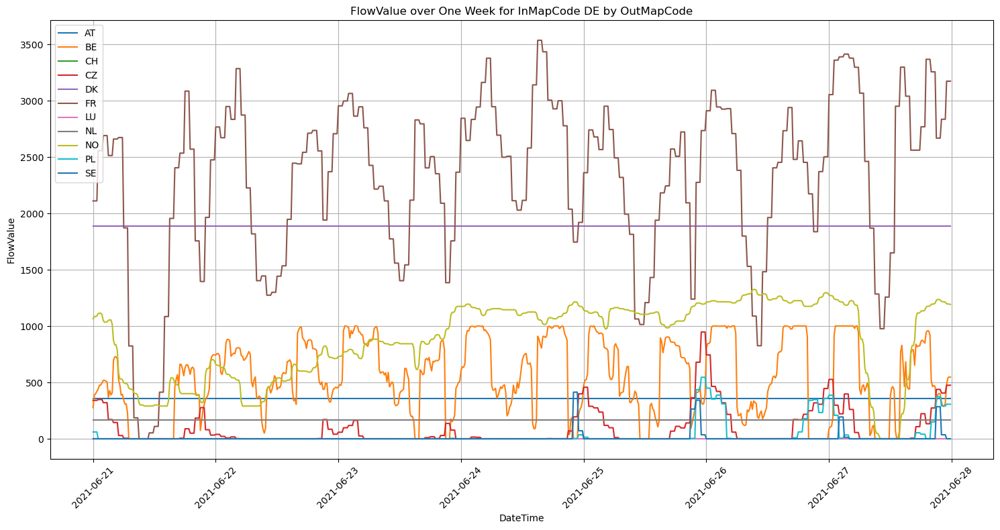

In [144]:
# visual check

# Filter for 'DE' in 'InMapCode'
de_data = pf4[pf4['InMapCode'] == 'DE']

# Select a one-week period for visualization
# Replace 'YYYY-MM-DD' with your chosen start date
start_date = pd.to_datetime('2021-06-21')  # Adjust this to your specific start date
end_date = start_date + pd.Timedelta(days=7)
one_week_data = de_data[(de_data['DateTime'] >= start_date) & (de_data['DateTime'] < end_date)]

# Plotting
plt.figure(figsize=(15, 8))

# Loop through each OutMapCode and plot
for outmapcode in one_week_data['OutMapCode'].unique():
    subset = one_week_data[one_week_data['OutMapCode'] == outmapcode]
    plt.plot(subset['DateTime'], subset['FlowValue'], label=outmapcode)

plt.title('FlowValue over One Week for InMapCode DE by OutMapCode')
plt.xlabel('DateTime')
plt.ylabel('FlowValue')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#### Save

In [181]:
# save
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core.pkl')

# Save the dataframe to a pickle file
pf4.to_pickle(pickle_path)

## Annual energy data (Eurostat)
Here, we import hourly energy data from Eurostat, such as primary energy demand (PE), gross electricity production (GEP) and net electricity production (NEP).

### Import

#### Primary energy demand (PE) & gross electricity production (GEP)

##### Import

In [22]:
# Function to process a single sheet
def process_sheet(sheet_name, xlsx):
    # Read the sheet into a DataFrame, skipping the top rows
    df = pd.read_excel(xlsx, sheet_name=sheet_name, skiprows=8)

    # Get the country name from cell C7
    country = pd.read_excel(xlsx, sheet_name=sheet_name, header=None, nrows=7).iloc[6, 2]
    
    # Add a column for the country name
    df['Country'] = country

    # Rename columns
    df = df.rename(columns={'NRG_BAL (Labels)': 'Year', 'NRG_BAL (Labels).1': 'Production Type'})

    # Melt the DataFrame to move the year columns into rows
    df = df.melt(id_vars=['Country', 'Year', 'Production Type'], var_name='Production Aspect', value_name='Energy (GWh)')

    return df

# Load the Excel file
xlsx = pd.ExcelFile('../1_data/1_raw/EUROSTAT/PE_GEP/nrg_bal_c__custom_6905619_spreadsheet.xlsx')

# Get the names of all relevant sheets (Sheet 2 and onward)
relevant_sheet_names = [name for name in xlsx.sheet_names if name not in ['Summary', 'Structure', 'Sheet 1']]

# Process all relevant sheets and concatenate the resulting DataFrames
df_all_sheets = pd.concat([process_sheet(name, xlsx) for name in relevant_sheet_names])

# Display the resulting DataFrame
df_all_sheets

C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,Country,Year,Production Type,Production Aspect,Energy (GWh)
0,Belgium,TIME,SIEC (Labels),Transformation input - electricity and heat ge...,NaN
1,Belgium,2018,Total,Transformation input - electricity and heat ge...,126940.339
2,Belgium,2018,Solid fossil fuels,Transformation input - electricity and heat ge...,0
3,Belgium,2018,Anthracite,Transformation input - electricity and heat ge...,0
4,Belgium,2018,Coking coal,Transformation input - electricity and heat ge...,0
...,...,...,...,...,...
5875,Georgia,NaN,NaN,Unnamed: 21,NaN
5876,Georgia,Special value,NaN,Unnamed: 21,NaN
5877,Georgia,:,not available,Unnamed: 21,NaN
5878,Georgia,Available flags:,NaN,Unnamed: 21,NaN


##### Modify

In [23]:
# limit to countries and years of interest

# Define the list of countries and years to filter by
countries = ['Germany']
years = ['2018', '2019', '2020', '2021']

# Filter the DataFrame
df_filtered = df_all_sheets[df_all_sheets['Country'].isin(countries) & df_all_sheets['Year'].isin(years)]

# drop Country column - from here on, only looking at Germany
df_filtered = df_filtered.drop("Country", axis=1)

# Display the resulting DataFrame
df_filtered

,Year,Production Type,Production Aspect,Energy (GWh)
1,2018,Total,Transformation input - electricity and heat ge...,1009099.337
2,2018,Solid fossil fuels,Transformation input - electricity and heat ge...,513094.667
3,2018,Anthracite,Transformation input - electricity and heat ge...,6055.5
4,2018,Coking coal,Transformation input - electricity and heat ge...,17649.722
5,2018,Other bituminous coal,Transformation input - electricity and heat ge...,133785.477
...,...,...,...,...
5870,2021,Nuclear heat,Unnamed: 21,NaN
5871,2021,Electricity,Unnamed: 21,NaN
5872,2021,Heat,Unnamed: 21,z
5873,2021,Bioenergy,Unnamed: 21,NaN


In [24]:
# filter for production types of interest

# Convert non-numeric values in the 'Energy (GWh)' column to NaN
df_filtered['Energy (GWh)'] = pd.to_numeric(df_filtered['Energy (GWh)'], errors='coerce')

# Define the list of production types to filter by
production_types = [
    'Anthracite',
    'Coking coal',
    'Other bituminous coal',
    'Sub-bituminous coal',
    'Lignite',
    'Coke oven coke', 
    'Gas coke', 
    'Patent fuel',
    'Brown coal briquettes',
    'Coal tar', 
    'Manufactured gases',
    'Peat and peat products',
    'Oil shale and oil sands',
    'Natural gas',
    'Oil and petroleum products (excluding biofuel portion)', 
    'Hydro',
    'Geothermal', 
    'Wind', 
    'Solar thermal', 
    'Solar photovoltaic',
    'Tide, wave, ocean', 
    'Ambient heat (heat pumps)',
    'Primary solid biofuels', 
    'Charcoal', 
    'Pure biogasoline',
    'Blended biogasoline',
    'Pure biodiesels', 
    'Blended biodiesels',
    'Pure bio jet kerosene', 
    'Blended bio jet kerosene',
    'Other liquid biofuels',
    'Biogases',
    'Non-renewable waste',
    'Renewable municipal waste',
    'Nuclear heat'
]

# Filter the DataFrame
df_filtered_production_types = df_filtered[df_filtered['Production Type'].isin(production_types)]

# Display the resulting DataFram
df_filtered_production_types

,Year,Production Type,Production Aspect,Energy (GWh)
3,2018,Anthracite,Transformation input - electricity and heat ge...,6055.500
4,2018,Coking coal,Transformation input - electricity and heat ge...,17649.722
5,2018,Other bituminous coal,Transformation input - electricity and heat ge...,133785.477
6,2018,Sub-bituminous coal,Transformation input - electricity and heat ge...,0.000
7,2018,Lignite,Transformation input - electricity and heat ge...,354477.122
...,...,...,...,...
5864,2021,Other liquid biofuels,Unnamed: 21,NaN
5865,2021,Biogases,Unnamed: 21,NaN
5867,2021,Renewable municipal waste,Unnamed: 21,NaN
5869,2021,Non-renewable waste,Unnamed: 21,NaN


In [25]:
# check: did the total energy remain the same during the last filtering step?

# Calculate the column sum for "Energy (GWh)" after filtering
total_energy_after_filtering = df_filtered_production_types['Energy (GWh)'].sum()

# Filter the DataFrame for 'Total' production type
df_filtered_total = df_filtered[df_filtered['Production Type'] == 'Total']

# Calculate the column sum for "Energy (GWh)" for 'Total' production type
total_energy_total_type = df_filtered_total['Energy (GWh)'].sum()

# Compare the total energy for specified production types and 'Total' production type
total_energy_after_filtering, total_energy_total_type, total_energy_total_type - total_energy_after_filtering

(7769658.459999999, 7769658.457, -0.00299999862909317)

In [26]:
# Convert the DataFrame to a wider format
df_wide = df_filtered_production_types.pivot_table(index=['Year', 'Production Type'], 
                                                  columns='Production Aspect', 
                                                  values='Energy (GWh)')

# Reset the index to turn the index labels into columns
df_wide.reset_index(inplace=True)

# Remove the name of the index
df_wide.columns.name = None

# Display the resulting DataFrame
df_wide

,Year,Production Type,Gross electricity production - autoproducer combined heat and power,Gross electricity production - autoproducer electricity only,Gross electricity production - main activity producer combined heat and power,Gross electricity production - main activity producer electricity only,Gross heat production - autoproducer combined heat and power,Gross heat production - main activity producer combined heat and power,Transformation input - electricity and heat generation - autoproducer combined heat and power - energy use,Transformation input - electricity and heat generation - autoproducer electricity only - energy use,Transformation input - electricity and heat generation - main activity producer combined heat and power - energy use,Transformation input - electricity and heat generation - main activity producer electricity only - energy use
0,2018,Ambient heat (heat pumps),NaN,NaN,NaN,NaN,0.0,0.000,NaN,NaN,NaN,NaN
1,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.0,1716.000,6055.5
2,2018,Biogases,188.0,11.0,25863.0,7119.0,0.0,4171.389,354.722,25.0,47925.556,17907.5
3,2018,Blended bio jet kerosene,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.0,0.000,0.0
4,2018,Blended biodiesels,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.0,0.000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
131,2021,Solar photovoltaic,NaN,0.0,NaN,49340.0,NaN,NaN,NaN,0.0,NaN,49340.0
132,2021,Solar thermal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
133,2021,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
134,2021,"Tide, wave, ocean",NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.0


In [27]:
# rename columns

# Define the mapping of old column names to new column names
column_name_mapping = {
    'Gross electricity production - autoproducer combined heat and power': 'gep_chp_ap',
    'Gross electricity production - autoproducer electricity only': 'gep_el_ap',
    'Gross electricity production - main activity producer combined heat and power': 'gep_chp_map',
    'Gross electricity production - main activity producer electricity only': 'gep_el_map',
    'Gross heat production - autoproducer combined heat and power': 'ghp_chp_ap',
    'Gross heat production - main activity producer combined heat and power': 'ghp_chp_map',
    'Transformation input - electricity and heat generation - autoproducer combined heat and power - energy use': 'pe_chp_ap',
    'Transformation input - electricity and heat generation - autoproducer electricity only - energy use': 'pe_el_ap',
    'Transformation input - electricity and heat generation - main activity producer combined heat and power - energy use': 'pe_chp_map',
    'Transformation input - electricity and heat generation - main activity producer electricity only - energy use': 'pe_el_map'
}

# Rename the columns
df_wide.rename(columns=column_name_mapping, inplace=True)

# Display the resulting DataFrame
df_wide

,Year,Production Type,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map
0,2018,Ambient heat (heat pumps),NaN,NaN,NaN,NaN,0.0,0.000,NaN,NaN,NaN,NaN
1,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.0,1716.000,6055.5
2,2018,Biogases,188.0,11.0,25863.0,7119.0,0.0,4171.389,354.722,25.0,47925.556,17907.5
3,2018,Blended bio jet kerosene,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.0,0.000,0.0
4,2018,Blended biodiesels,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.0,0.000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
131,2021,Solar photovoltaic,NaN,0.0,NaN,49340.0,NaN,NaN,NaN,0.0,NaN,49340.0
132,2021,Solar thermal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
133,2021,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
134,2021,"Tide, wave, ocean",NaN,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,0.0


In [28]:
# replace nan with zeros
df_wide = df_wide.replace(np.nan, 0.0)

# Display the resulting DataFrame
df_wide

,Year,Production Type,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map
0,2018,Ambient heat (heat pumps),0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
1,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.0,1716.000,6055.5
2,2018,Biogases,188.0,11.0,25863.0,7119.0,0.0,4171.389,354.722,25.0,47925.556,17907.5
3,2018,Blended bio jet kerosene,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
4,2018,Blended biodiesels,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
131,2021,Solar photovoltaic,0.0,0.0,0.0,49340.0,0.0,0.000,0.000,0.0,0.000,49340.0
132,2021,Solar thermal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
133,2021,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0
134,2021,"Tide, wave, ocean",0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.0


In [29]:
# add missing rows if certain production types do not exist in the dataframe for a specific year

# Create a multi-index DataFrame
df_wide.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = df_wide.index.get_level_values('Year').unique()
production_types = [
    'Anthracite',
    'Coking coal',
    'Other bituminous coal',
    'Sub-bituminous coal',
    'Lignite',
    'Coke oven coke', 
    'Gas coke', 
    'Patent fuel',
    'Brown coal briquettes',
    'Coal tar', 
    'Manufactured gases',
    'Peat and peat products',
    'Oil shale and oil sands',
    'Natural gas',
    'Oil and petroleum products (excluding biofuel portion)', 
    'Hydro',
    'Geothermal', 
    'Wind', 
    'Solar thermal', 
    'Solar photovoltaic',
    'Tide, wave, ocean', 
    'Ambient heat (heat pumps)',
    'Primary solid biofuels', 
    'Charcoal', 
    'Pure biogasoline',
    'Blended biogasoline',
    'Pure biodiesels', 
    'Blended biodiesels',
    'Pure bio jet kerosene', 
    'Blended bio jet kerosene',
    'Other liquid biofuels',
    'Biogases',
    'Non-renewable waste',
    'Renewable municipal waste',
    'Nuclear heat'
]

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
df_wide = df_wide.reindex(new_index, fill_value=0)

# Reset index
df_wide.reset_index(inplace=True)

df_wide

,Year,Production Type,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map
0,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.000,1716.000,6055.500
1,2018,Coking coal,0.0,0.0,1226.0,7556.0,0.0,2928.611,0.000,0.000,4994.444,17649.722
2,2018,Other bituminous coal,1380.0,1851.0,9460.0,58081.0,0.0,22600.000,3018.180,4889.611,37863.814,133785.477
3,2018,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.000
4,2018,Lignite,1110.0,1625.0,3253.0,138060.0,0.0,6954.167,1900.847,5384.245,11841.614,354477.122
...,...,...,...,...,...,...,...,...,...,...,...,...
135,2021,Other liquid biofuels,7.0,3.0,190.0,3.0,0.0,39.444,9.024,9.024,767.007,9.024
136,2021,Biogases,134.0,0.2,23135.0,6726.0,0.0,2956.944,264.722,0.556,41671.944,16885.000
137,2021,Non-renewable waste,594.0,175.0,2059.0,3890.0,0.0,8462.778,1153.333,515.556,15376.111,12828.889
138,2021,Renewable municipal waste,300.0,65.0,1913.0,3526.0,0.0,7483.056,636.667,203.611,13815.000,11632.222


##### Save

In [30]:
# save interim data

# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_eurostat.pkl')

# Save the dataframe to a pickle file
df_wide.to_pickle(pickle_path)

#### Net electricity production (NEP)

##### Import

In [31]:
# Load the Excel file
xl = pd.ExcelFile('../1_data/1_raw/EUROSTAT/NEP/nrg_ind_peh__custom_6903672_spreadsheet.xlsx')

# Ignore unnecessary sheets
sheets_to_ignore = ['Summary', 'Structure', 'Sheet 1', 'Sheet 2']
sheets = [sheet for sheet in xl.sheet_names if sheet not in sheets_to_ignore]


# Prepare a list to store each sheet's DataFrame
all_data = []

# Iterate over the sheets
for sheet in sheets:
    # Read the data from the sheet, including 'Year' and 'Production Type'
    df = pd.read_excel(xl, sheet_name=sheet, header=None, skiprows=12, usecols="A:F")
    
    # Read the header rows from the sheet
    header = pd.read_excel(xl, sheet_name=sheet, header=None, nrows=2, skiprows=9, usecols="C:F")
    header = header.apply(lambda x: ' '.join(x.dropna().astype(str)), axis=0)

    # Append the 'Year' and 'Production Type' to the header
    header = ['Year', 'Production Type'] + header.tolist()

    # Set the combined header as column names
    df.columns = header

    # Extract the country name from cell C8
    country = pd.read_excel(xl, sheet_name=sheet, header=None, nrows=1, skiprows=7).iloc[0, 2]
    
    # Add a new column for the country
    df['Country'] = country
    
    # Append the data to the DataFrame list
    all_data.append(df)

# Concatenate all the dataframes in the list
all_data = pd.concat(all_data, ignore_index=True)

# Display the DataFrame
all_data

C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,Year,Production Type,Electricity Main activity producers,Electricity Autoproducers,Combined heat and power (CHP) Main activity producers,Combined heat and power (CHP) Autoproducers,Country
0,2018,Total,52647.2,4150.5,7585.8,7687.1,Belgium
1,2018,Combustible fuels,16835.3,15.7,7580.9,7472.1,Belgium
2,2018,Hydro,1293.5,0,:,:,Belgium
3,2018,Pumped hydro power,983.2,0,:,:,Belgium
4,2018,Geothermal,:,0,0,0,Belgium
...,...,...,...,...,...,...,...
2250,2021,Other fuels n.e.c. - heat from chemical sources,0,0,0,0,Georgia
2251,2021,Other fuels n.e.c.,0,0,0,0,Georgia
2252,NaN,NaN,NaN,NaN,NaN,NaN,Georgia
2253,Special value,NaN,NaN,NaN,NaN,NaN,Georgia


##### Modify

In [32]:
# step 1_ replace non-numerical values

# Replace non-numerical values in the main four columns with zeros
numerical_cols = all_data.columns.difference(['Year', 'Production Type', 'Country'])

all_data[numerical_cols] = all_data[numerical_cols].apply(pd.to_numeric, errors='coerce').fillna(0)

# Display the DataFrame
all_data

,Year,Production Type,Electricity Main activity producers,Electricity Autoproducers,Combined heat and power (CHP) Main activity producers,Combined heat and power (CHP) Autoproducers,Country
0,2018,Total,52647.2,4150.5,7585.8,7687.1,Belgium
1,2018,Combustible fuels,16835.3,15.7,7580.9,7472.1,Belgium
2,2018,Hydro,1293.5,0.0,0.0,0.0,Belgium
3,2018,Pumped hydro power,983.2,0.0,0.0,0.0,Belgium
4,2018,Geothermal,0.0,0.0,0.0,0.0,Belgium
...,...,...,...,...,...,...,...
2250,2021,Other fuels n.e.c. - heat from chemical sources,0.0,0.0,0.0,0.0,Georgia
2251,2021,Other fuels n.e.c.,0.0,0.0,0.0,0.0,Georgia
2252,NaN,NaN,0.0,0.0,0.0,0.0,Georgia
2253,Special value,NaN,0.0,0.0,0.0,0.0,Georgia


In [33]:
# step 2: limit to countries and years of interest

# Define the list of countries and years to keep
countries_to_keep = ['Germany']
years_to_keep = ['2018', '2019', '2020', '2021']

# Filter the DataFrame to keep only the rows with the specified countries and years
all_data = all_data[all_data['Country'].isin(countries_to_keep) & all_data['Year'].isin(years_to_keep)]

# drop Country column - from here on, only looking at Germany
all_data = all_data.drop("Country", axis=1)

# Display the DataFrame
all_data

,Year,Production Type,Electricity Main activity producers,Electricity Autoproducers,Combined heat and power (CHP) Main activity producers,Combined heat and power (CHP) Autoproducers
220,2018,Total,472398.0,17931.0,82311.0,33011.0
221,2018,Combustible fuels,226145.0,17011.0,81994.0,32816.0
222,2018,Hydro,23619.0,85.0,0.0,0.0
223,2018,Pumped hydro power,6169.0,0.0,0.0,0.0
224,2018,Geothermal,126.0,0.0,0.0,0.0
225,2018,Wind,107889.0,0.0,0.0,0.0
226,2018,Solar,42607.0,0.0,0.0,0.0
227,2018,"Tide, wave, ocean",0.0,0.0,0.0,0.0
228,2018,Ambient heat (heat pumps),0.0,0.0,0.0,0.0
229,2018,Nuclear fuels and other fuels n.e.c.,71866.0,0.0,0.0,0.0


In [34]:
# step 3: rename columns

# Rename the column headers in all_data
all_data = all_data.rename(columns={
    'Electricity Main activity producers': 'nep_el_map',
    'Electricity Autoproducers': 'nep_el_ap',
    'Combined heat and power (CHP) Main activity producers': 'nep_chp_map',
    'Combined heat and power (CHP) Autoproducers': 'nep_chp_ap'
})

# Display the DataFrame
all_data

,Year,Production Type,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap
220,2018,Total,472398.0,17931.0,82311.0,33011.0
221,2018,Combustible fuels,226145.0,17011.0,81994.0,32816.0
222,2018,Hydro,23619.0,85.0,0.0,0.0
223,2018,Pumped hydro power,6169.0,0.0,0.0,0.0
224,2018,Geothermal,126.0,0.0,0.0,0.0
225,2018,Wind,107889.0,0.0,0.0,0.0
226,2018,Solar,42607.0,0.0,0.0,0.0
227,2018,"Tide, wave, ocean",0.0,0.0,0.0,0.0
228,2018,Ambient heat (heat pumps),0.0,0.0,0.0,0.0
229,2018,Nuclear fuels and other fuels n.e.c.,71866.0,0.0,0.0,0.0


In [35]:
# step 4: drop "Total" columns to avoid double counting

# Create a new DataFrame that does not include rows with 'Total' in the 'Production Type' column
all_data_short = all_data[all_data['Production Type'] != 'Total']

# Display the DataFrame
all_data_short

,Year,Production Type,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap
221,2018,Combustible fuels,226145.0,17011.0,81994.0,32816.0
222,2018,Hydro,23619.0,85.0,0.0,0.0
223,2018,Pumped hydro power,6169.0,0.0,0.0,0.0
224,2018,Geothermal,126.0,0.0,0.0,0.0
225,2018,Wind,107889.0,0.0,0.0,0.0
226,2018,Solar,42607.0,0.0,0.0,0.0
227,2018,"Tide, wave, ocean",0.0,0.0,0.0,0.0
228,2018,Ambient heat (heat pumps),0.0,0.0,0.0,0.0
229,2018,Nuclear fuels and other fuels n.e.c.,71866.0,0.0,0.0,0.0
230,2018,Electricity,0.0,0.0,0.0,0.0


In [36]:
# step 5: add missing rows if certain production types do not exist in the dataframe for a specific country and year

# Create a multi-index DataFrame
all_data_short.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = all_data_short.index.get_level_values('Year').unique()
production_types = all_data_short.index.get_level_values('Production Type').unique()

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
all_data_short = all_data_short.reindex(new_index, fill_value=0)

# Reset index
all_data_short.reset_index(inplace=True)

all_data_short

,Year,Production Type,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap
0,2018,Combustible fuels,226145.0,17011.0,81994.0,32816.0
1,2018,Hydro,23619.0,85.0,0.0,0.0
2,2018,Pumped hydro power,6169.0,0.0,0.0,0.0
3,2018,Geothermal,126.0,0.0,0.0,0.0
4,2018,Wind,107889.0,0.0,0.0,0.0
5,2018,Solar,42607.0,0.0,0.0,0.0
6,2018,"Tide, wave, ocean",0.0,0.0,0.0,0.0
7,2018,Ambient heat (heat pumps),0.0,0.0,0.0,0.0
8,2018,Nuclear fuels and other fuels n.e.c.,71866.0,0.0,0.0,0.0
9,2018,Electricity,0.0,0.0,0.0,0.0


##### Check

In [37]:
# check - is the remaining data equal to the total?

# redefine numerical cols
numerical_cols = all_data.columns.difference(['Year', 'Production Type'])

# Compute column sums for all_data_short and for rows in all_data where 'Production Type' is 'Total'
sum_all_data_short = all_data_short[numerical_cols].sum()
sum_all_data_total = all_data[all_data['Production Type'] == 'Total'][numerical_cols].sum()

# Compute absolute and relative differences
abs_diff = sum_all_data_short - sum_all_data_total
rel_diff = abs_diff / sum_all_data_total

# Create a DataFrame to display the results
result = pd.DataFrame({
    'Sum all_data_short': sum_all_data_short,
    'Sum all_data_total': sum_all_data_total,
    'Absolute Difference': abs_diff,
    'Relative Difference': rel_diff
})

result

,Sum all_data_short,Sum all_data_total,Absolute Difference,Relative Difference
nep_chp_ap,134263.0,134263.0,0.0,0.000000
nep_chp_map,323501.0,323501.0,0.0,0.000000
nep_el_ap,66129.0,66129.0,0.0,0.000000
nep_el_map,1787750.0,1763772.0,23978.0,0.013595


##### Save

In [38]:
# save interim data

# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'nep_eurostat.pkl')

# Save the dataframe to a pickle file
all_data_short.to_pickle(pickle_path)

#### Imports and exports

##### Import

In [ ]:
import pandas as pd

# Load the Excel file
excel_file = pd.ExcelFile('../1_data/1_raw/EUROSTAT/IMP_EXP/nrg_cb_e__custom_6981522_spreadsheet.xlsx')

# Load the data into a DataFrame
data_df = excel_file.parse('Sheet 1')

# Rename the columns
data_df = data_df.rename(columns={
    'Data extracted on 22/07/2023 11:27:59 from [ESTAT]': 'Country', # change
    'Unnamed: 1': 'Year',
    'Unnamed: 2': 'Imports',
    'Unnamed: 4': 'Exports'
})

# Drop the non-data rows
data_df = data_df.iloc[8:]

# Remove rows with 'not available' and 'provisional' in the 'Year' column
data_df = data_df[data_df['Year'] != 'not available']
data_df = data_df[data_df['Year'] != 'provisional']

# Display the cleaned DataFrame
data_df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

data_df = data_df[data_df['Country'].isin(countries)].reset_index()

data_df

In [ ]:
# step 2: drop some columns

new_columns = ['Country', 'Year', 'Imports', 'Exports']
data_df = data_df[new_columns]
data_df

In [ ]:
# step 3: convert to data types of interest

data_df['Year'] = data_df['Year'].astype('i4')
data_df = data_df.astype({'Imports':'float','Exports':'float'})
data_df

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'imports_exports_annual.pkl')

# Save the dataframe to a pickle file
data_df.to_pickle(pickle_path)

#### Pumped hydro input

##### Import

In [ ]:
# Load the Excel file
xls = pd.ExcelFile('../1_data/1_raw/EUROSTAT/PH/nrg_cb_e__custom_6986049_spreadsheet.xlsx')

# Load the data from 'Sheet 1' without specifying the columns
df_all = pd.read_excel(xls, 'Sheet 1', header=[8, 9])

# Select only the columns of interest
df = df_all.iloc[:, [0, 1, 2, 4]]

# Select only the rows of interest (taking into account Python's 0-indexing)
df = df.iloc[0:172]

# Rename the columns
df.columns = ["Country", "Year", "pure", "mixed"]

df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

df_core = df[df['Country'].isin(countries)].reset_index()

df_core

In [ ]:
# step 2: add columns

df_core['sum'] = df_core['pure'] + df_core['mixed']
columns = ['Country', 'Year', 'sum']
df_core = df_core[columns]

df_core

In [ ]:
# step 3: convert to data types of interest

df_core['Year'] = df_core['Year'].astype('i4')
df_core = df_core.astype({'sum':'float'})
df_core

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_input_annual.pkl')

# Save the dataframe to a pickle file
df_core.to_pickle(pickle_path)

#### Distribution losses

##### Import

In [ ]:
# Load the Excel file
xls = pd.ExcelFile('../1_data/1_raw/EUROSTAT/DL/nrg_cb_e__custom_6986945_spreadsheet.xlsx')

# Load the data from 'Sheet 1' without specifying the columns
df_all = pd.read_excel(xls, 'Sheet 1', header=[9, 10])

# Select only the columns of interest
df = df_all.iloc[:, [0, 1, 2]]

# Select only the rows of interest (taking into account Python's 0-indexing)
df = df.iloc[0:171]

# Rename the columns
df.columns = ["Country", "Year", "losses"]

df

##### Modify

In [ ]:
# step 1: limit to countries of interest

countries = ['Germany',
            'France',
            'Luxembourg',
            'Belgium',
            'Netherlands',
            'Austria',
            'Norway',
            'Czechia',
            'Poland',
            'Sweden',
            'Switzerland',
            'Denmark']

df_core = df[df['Country'].isin(countries)].reset_index()

columns = ['Country', 'Year', 'losses']
df_core = df_core[columns]

df_core

In [ ]:
# step 3: convert to data types of interest

df_core['Year'] = df_core['Year'].astype('i4')
df_core = df_core.astype({'losses':'float'})
df_core

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'distribution_losses.pkl')

# Save the dataframe to a pickle file
df_core.to_pickle(pickle_path)

### Map (Eurostat -> ENTSO-E)
We need to map the Eurostat data to ENTSO-E production types (categories), for the data to be consistent.

#### Map NEP to PE/GEP categories
The NEP data has fewer categories than the GEP and PE data, so we map the NEP data onto GEP/PE categories.

##### Import

In [ ]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_eurostat.pkl')

# Load the pickle file into a DataFrame
nep = pd.read_pickle(pickle_path)
pe_gep = pd.read_pickle(pickle_path2)

##### Modify

In [ ]:
# step 1: create dataframe for pumped hydro

# filter
ph = nep[(nep['Production Type'] == 'Pumped hydro power')].reset_index()

# drop some columns, reset index
ph = ph[['Year', 'Production Type', 'nep_el_map']]

# define data types
ph['Year'] = ph['Year'].astype('i4')
ph = ph.astype({'nep_el_map':'float'})

# Show result
ph

In [ ]:
# step 2: combine some rows from nep in preparation for the mapping process

# Define the mapping of production types
map_dict = {
    "Other fuels n.e.c. - heat from chemical sources": "Combustible fuels",
    "Other fuels n.e.c.": "Combustible fuels",
    "Tide, wave, ocean": "Hydro"
}

# First, let's group the data by 'Year', 'Country' and 'Production Type' and sum the other columns
nep_grouped = nep.groupby(['Year', 'Production Type']).sum().reset_index()

# Initialize an empty DataFrame to store the updated data
nep_updated = pd.DataFrame(columns=nep_grouped.columns)

# Initialize a dictionary to store the added data
add_dict = {}

# Iterate over the mapping dictionary
for key, value in map_dict.items():
    # Check if the key exists in the "Production Type" column
    if key in nep_grouped["Production Type"].values:
        # Get the data of the rows to be added
        data_to_add = nep_grouped[nep_grouped["Production Type"] == key]

        # Check if there is already data to be added to the same value
        if value in add_dict:
            # Add the values of the rows to the existing data
            for column in ["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]:
                add_dict[value][column] += data_to_add[column].values

            # Update the "Production Type"
            add_dict[value]["Production Type"] += " + " + key
        else:
            # Copy the data to be added to the dictionary
            add_dict[value] = data_to_add.copy()

            # Set the new "Production Type"
            add_dict[value]["Production Type"] = value + " + " + key

# Iterate over the dictionary of data to be added
for value, data_to_add in add_dict.items():
    # Get the data of the rows to be updated
    data_to_update = nep_grouped[nep_grouped["Production Type"] == value]

    # Add the values of the rows to be added to the rows to be updated
    for column in ["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]:
        data_to_update[column] += data_to_add[column].values

    # Update the "Production Type"
    data_to_update["Production Type"] = data_to_add["Production Type"].values[0]

    # Append the updated data to the new DataFrame
    nep_updated = nep_updated.append(data_to_update, ignore_index=True)

# Append the rest of the data to the new DataFrame, drop pumped hydro (separate df above)
nep_updated = nep_updated.append(nep_grouped[~nep_grouped["Production Type"].isin(list(map_dict.keys()) + ["Pumped hydro power"])], ignore_index=True)

# Display the resulting dataframe
nep_updated

In [ ]:
# step 2: drop some rows to avoid double counting and those with zero values

# Define the list of production types to be dropped
drop_list = ['Ambient heat (heat pumps)', # all zeroes
             'Combustible fuels', # avoid double counting
             'Electricity', # all zeroes
             'Hydro'] # avoid double counting

# Drop the rows with the specified production types
nep_updated = nep_updated[~nep_updated["Production Type"].isin(drop_list)]

# Display the first few rows of the updated dataframe
nep_updated

In [ ]:
# step 3: map nep values to gep categories
# step 3.1: define dictionary and merge dataframes

# Define the mapping dictionary
map_dict = {
    'Hydro + Tide, wave, ocean': 'Hydro',
    'Geothermal': 'Geothermal',
    'Wind': 'Wind',
    'Solar': ['Solar photovoltaic', 'Solar thermal'],
    'Nuclear fuels and other fuels n.e.c.': 'Nuclear heat',
    'Combustible fuels + Other fuels n.e.c. - heat from chemical sources + Other fuels n.e.c.':
    ['Anthracite',
     'Coking coal',
     'Other bituminous coal',
     'Sub-bituminous coal',
     'Lignite',
     'Coke oven coke',
     'Gas coke',
     'Patent fuel',
     'Brown coal briquettes',
     'Coal tar',
     'Manufactured gases',
     'Peat and peat products',
     'Oil shale and oil sands',
     'Natural gas',
     'Oil and petroleum products (excluding biofuel portion)',
     'Primary solid biofuels',
     'Charcoal',
     'Pure biogasoline',
     'Blended biogasoline',
     'Pure biodiesels',
     'Blended biodiesels',
     'Pure bio jet kerosene',
     'Blended bio jet kerosene',
     'Other liquid biofuels',
     'Biogases',
     'Non-renewable waste',
     'Renewable municipal waste'
    ]
}

# Create a new dataframe for the mapping
mapping_df = pd.DataFrame({
    'old_type': [k for k, v in map_dict.items() for _ in (v if isinstance(v, list) else [v])],
    'new_type': [v for k, v in map_dict.items() for v in (v if isinstance(v, list) else [v])]
})

# Merge nep_updated with the mapping_df
merged_nep = pd.merge(nep_updated, mapping_df, left_on='Production Type', right_on='old_type', how='left')

# Merge merged_nep with pe_gep
merged_df = pd.merge(merged_nep, pe_gep, left_on=['Year', 'new_type'], 
                     right_on=['Year', 'Production Type'], how='left', suffixes=('_nep', '_gep'))

merged_df

In [ ]:
# step 3: map nep values to gep categories
# step 3.2: calculate new, mapped nep values

# Calculate the total gep for each new_type for each Year and Country
total_gep = merged_df.groupby(['Year', 'old_type'])[['gep_el_map', 'gep_el_ap', 'gep_chp_map', 'gep_chp_ap']].sum().reset_index()

# Merge total_gep with merged_df
merged_df = pd.merge(merged_df, total_gep, on=['Year', 'old_type'], suffixes=('', '_total'))

# Calculate the new nep values
for nep_col, gep_col in zip(['nep_el_map', 'nep_el_ap', 'nep_chp_map', 'nep_chp_ap'], ['gep_el_map', 'gep_el_ap', 'gep_chp_map', 'gep_chp_ap']):
    merged_df[nep_col + '_new'] = merged_df[nep_col] * merged_df[gep_col] / merged_df[gep_col + '_total']

merged_df

In [ ]:
# step 4: drop and rename some columns

# Drop the specified columns
merged_df = merged_df.drop(columns=['Production Type_nep', 'nep_el_map', 'nep_el_ap', 'Production Type_gep', 
                                    'nep_chp_map', 'nep_chp_ap', 'old_type', 'gep_el_map_total', 'gep_el_ap_total', 
                                    'gep_chp_map_total', 'gep_chp_ap_total'])

# Rename the columns
merged_df = merged_df.rename(columns={
    'new_type': 'Production Type',
    'nep_el_map_new': 'nep_el_map',
    'nep_el_ap_new': 'nep_el_ap',
    'nep_chp_map_new': 'nep_chp_map',
    'nep_chp_ap_new': 'nep_chp_ap'
})

merged_df

In [ ]:
# step 5: add columns for net heat production (not provided by Eurostat)
# assumption: nhp = ghp

# Add the new columns
merged_df['nhp_chp_map'] = merged_df['ghp_chp_map']
merged_df['nhp_chp_ap'] = merged_df['ghp_chp_ap']

merged_df

In [ ]:
# step 6: replace nan values with zeros
merged_df = merged_df.replace(np.nan, 0.0)
merged_df

In [ ]:
# step 7: add missing rows if certain production types do not exist in the dataframe for a specific country and year

# Create a multi-index DataFrame
merged_df.set_index(["Year", "Production Type"], inplace=True)

# Define all unique values for each index
years = merged_df.index.get_level_values('Year').unique()
production_types = merged_df.index.get_level_values('Production Type').unique()

# Create a new MultiIndex that includes all combinations of the unique values
new_index = pd.MultiIndex.from_product([years, production_types], 
                                       names=["Year", "Production Type"])

# Reindex the DataFrame and fill missing values with 0
merged_df = merged_df.reindex(new_index, fill_value=0)

# Reset index
merged_df.reset_index(inplace=True)

merged_df

##### Check

In [ ]:
# check 1: how much have the column sums changed during the mapping process?

# Calculate the column sums for the original dataframe
nep_sums = nep[["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]].sum()

# Calculate the column sums for the updated dataframe
nep_mapped_sums = merged_df[["nep_el_map", "nep_el_ap", "nep_chp_map", "nep_chp_ap"]].sum()

# Calculate the absolute differences
absolute_diffs = nep_mapped_sums - nep_sums

# Calculate the relative differences
relative_diffs = absolute_diffs / nep_sums

# Combine the results into a dataframe
diff_df = pd.DataFrame({"Original Sums": nep_sums, "Updated Sums": nep_mapped_sums, "Absolute Differences": absolute_diffs, "Relative Differences": relative_diffs})

diff_df

In [ ]:
# check 2: sum of pumped hydro
# explanation: pumped hydro was removed from nep, so this sum may explain any differences in diff_df
ph['nep_el_map'].sum()

##### Save

In [ ]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_output_annual.pkl')

# Save the dataframe to a pickle file
merged_df.to_pickle(pickle_path)
ph.to_pickle(pickle_path2)

#### Map NEP, GEP and PE to ENTSO-E categories
ENTSO-E uses slightly different categories than Eurostat. Since we want to work with hourly data, which only ENTSO-E provides, we will use the latter's categorization scheme.

##### Import

In [182]:
# Define the relative path to the pickle files
pickle_path1 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')

# Load the pickle file into a DataFrame
pe_gep_nep = pd.read_pickle(pickle_path1)
nep_entsoe = pd.read_pickle(pickle_path2)
# agpt is net electricity production
# see https://docstore.entsoe.eu/Documents/MC%20documents/Transparency%20Platform/MOP/DetailedDescriptionDocument.pdf (p. 55)
# (supposedly for map only)

##### Modify

In [184]:
# step 1: create an additional column for "Year" in nep_entsoe

# Convert "DateTime" column to datetime type if it's not already in that format
nep_entsoe['DateTime'] = pd.to_datetime(nep_entsoe['DateTime'])

# Extract the year from "DateTime" column and assign it to a new "Year" column
nep_entsoe['Year'] = nep_entsoe['DateTime'].dt.year.astype('i4')

# Filter to only include Germany - from here on, only looking at Germany
countries = ['DE']
nep_entsoe = nep_entsoe[nep_entsoe['MapCode'].isin(countries)]
nep_entsoe = nep_entsoe.drop("MapCode", axis=1)

# Print the updated dataframe
nep_entsoe #unit: MW

,DateTime,ProductionType,ActualGenerationOutput,Year
6367584,2018-01-01 00:00:00,Biomass,4767.88,2018
6367585,2018-01-01 00:15:00,Biomass,4759.88,2018
6367586,2018-01-01 00:30:00,Biomass,4764.32,2018
6367587,2018-01-01 00:45:00,Biomass,4765.71,2018
6367588,2018-01-01 01:00:00,Biomass,4760.53,2018
...,...,...,...,...
8667635,2021-12-31 22:45:00,Wind Onshore,25730.93,2021
8667636,2021-12-31 23:00:00,Wind Onshore,25832.87,2021
8667637,2021-12-31 23:15:00,Wind Onshore,25425.64,2021
8667638,2021-12-31 23:30:00,Wind Onshore,25077.56,2021


In [185]:
# step 2: calculate annual sums of generation (nep) from high res ENTSOE data

# Aggregate sum of ActualGenerationOutput, grouped by 'ProductionType', 'MapCode' and 'Year'
nep_entsoe_sum = nep_entsoe.groupby(['ProductionType', 'Year'])['ActualGenerationOutput'].sum().reset_index()

# rename column
nep_entsoe_sum = nep_entsoe_sum.rename(columns={'ActualGenerationOutput': 'nep_entsoe',
                                                'ProductionType': 'Production Type'})

# Scale the values by 1000 (MWh to GWh), and by 4 (quarter-hourly power output)
nep_entsoe_sum["nep_entsoe"] = nep_entsoe_sum["nep_entsoe"] / (1000 * 4)

# Remove extra spaces from 'label_entsoe'
nep_entsoe_sum['Production Type'] = nep_entsoe_sum['Production Type'].str.replace(r'\s+', ' ', regex=True)

# drop pumped hydro
nep_entsoe_sum = nep_entsoe_sum.drop(nep_entsoe_sum[(nep_entsoe_sum['Production Type'] == 'Hydro Pumped Storage')].index)

# Display the DataFrame
nep_entsoe_sum # unit: GWh

,Production Type,Year,nep_entsoe
0,Biomass,2018,40184.833007
1,Biomass,2019,41028.520455
2,Biomass,2020,40283.989767
3,Biomass,2021,39210.502638
4,Fossil Brown coal/Lignite,2018,128361.330463
...,...,...,...
61,Wind Offshore,2021,23993.087095
62,Wind Onshore,2018,89488.836880
63,Wind Onshore,2019,99621.826878
64,Wind Onshore,2020,103104.543450


In [186]:
# step 3: fill in the gaps for those combinations of year, country and production type not in nep_entsoe_sum

# Get the unique values for 'Country', 'Year', and 'Production Type'
years = nep_entsoe_sum['Year'].unique()
types = nep_entsoe_sum['Production Type'].unique()

# Create a MultiIndex with all combinations of 'Country', 'Year', and 'Production Type'
index = pd.MultiIndex.from_product([years, types], names=['Year', 'Production Type'])

# Create a new DataFrame with the created index
nep_entsoe_sum_filled = pd.DataFrame(index=index).reset_index()

# Merge the new DataFrame with the original one
nep_entsoe_sum_filled = nep_entsoe_sum_filled.merge(nep_entsoe_sum, on=['Year', 'Production Type'], how='left')

# Fill the missing 'nep_entsoe' values with 0.0
nep_entsoe_sum_filled['nep_entsoe'] = nep_entsoe_sum_filled['nep_entsoe'].fillna(0.0)

# Show the result
nep_entsoe_sum_filled # unit: GWh

,Year,Production Type,nep_entsoe
0,2018,Biomass,40184.833007
1,2018,Fossil Brown coal/Lignite,128361.330463
2,2018,Fossil Coal-derived gas,3584.717100
3,2018,Fossil Gas,42879.032508
4,2018,Fossil Hard coal,71546.320482
...,...,...,...
59,2021,Other renewable,1336.087730
60,2021,Solar,46606.888157
61,2021,Waste,6947.491018
62,2021,Wind Offshore,23993.087095


In [187]:
# step 4: same as above, for pe_nep_gep

# convert entries in Year column to integer
pe_gep_nep['Year'] = np.array(list(map(int, list(pe_gep_nep['Year']))), dtype='i4')

# Get the unique values for 'Country', 'Year', and 'Production Type'
years = pe_gep_nep['Year'].unique()
types = pe_gep_nep['Production Type'].unique()

# Create a MultiIndex with all combinations of 'Year', and 'Production Type'
index = pd.MultiIndex.from_product([years, types], names=['Year', 'Production Type'])

# Create a new DataFrame with the created index
pe_gep_nep_filled = pd.DataFrame(index=index).reset_index()

# Merge the new DataFrame with the original one
pe_gep_nep_filled = pe_gep_nep_filled.merge(pe_gep_nep, on=['Year', 'Production Type'], how='left')

# drop heat pumps (all zeroes)
pe_gep_nep_filled = pe_gep_nep_filled.drop(pe_gep_nep_filled[(pe_gep_nep_filled['Production Type'] == 'Ambient heat (heat pumps)')].index)

# Fill nan with 0.0
pe_gep_nep_filled = pe_gep_nep_filled.fillna(0.0).reset_index()

# Show the result
pe_gep_nep_filled # unit: GWh

,index,Year,Production Type,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap
0,0,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.000,1716.000,6055.500,2396.149599,0.000000,398.891842,0.000000,1006.389,0.0
1,1,2018,Coking coal,0.0,0.0,1226.0,7556.0,0.0,2928.611,0.000,0.000,4994.444,17649.722,6985.071903,0.000000,1161.618524,0.000000,2928.611,0.0
2,2,2018,Other bituminous coal,1380.0,1851.0,9460.0,58081.0,0.0,22600.000,3018.180,4889.611,37863.814,133785.477,53692.424724,1758.661875,8963.222866,1301.502200,22600.000,0.0
3,3,2018,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.000,0.000000,0.000000,0.000000,0.000000,0.000,0.0
4,4,2018,Lignite,1110.0,1625.0,3253.0,138060.0,0.0,6954.167,1900.847,5384.245,11841.614,354477.122,127628.246026,1543.936006,3082.173782,1046.860465,6954.167,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,127,2021,Geothermal,0.0,0.0,0.0,244.0,0.0,0.000,0.000,0.000,0.000,2444.722,174.000000,0.000000,0.000000,0.000000,0.000,0.0
128,128,2021,Nuclear heat,0.0,0.0,0.0,69130.0,0.0,0.000,0.000,0.000,0.000,206648.697,65444.000000,0.000000,0.000000,0.000000,0.000,0.0
129,129,2021,Solar photovoltaic,0.0,0.0,0.0,49340.0,0.0,0.000,0.000,0.000,0.000,49340.000,48373.000000,0.000000,0.000000,0.000000,0.000,0.0
130,130,2021,Solar thermal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.000,0.000000,0.000000,0.000000,0.000000,0.000,0.0


In [188]:
# step 5: some corrections for pumped hydro
# we subtract pumped hydro from the data (and add it on later)

# Filter rows where Production Type is 'Hydro'
hydro_rows = pe_gep_nep_filled[pe_gep_nep_filled['Production Type'] == 'Hydro']

# Calculate the difference between gep and nep columns
diff_el_map = hydro_rows['gep_el_map'] - hydro_rows['nep_el_map']
diff_el_ap = hydro_rows['gep_el_ap'] - hydro_rows['nep_el_ap']

# Replace gep values with pe values
hydro_rows['gep_el_map'] = hydro_rows['pe_el_map']
hydro_rows['gep_el_ap'] = hydro_rows['pe_el_ap']

# Replace nep values with gep values minus diff values
hydro_rows['nep_el_map'] = hydro_rows['gep_el_map'] - diff_el_map
hydro_rows['nep_el_ap'] = hydro_rows['gep_el_ap'] - diff_el_ap

# Update the modified rows back into the original DataFrame
pe_gep_nep_filled.loc[hydro_rows.index] = hydro_rows

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\522033941.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hydro_rows['gep_el_map'] = hydro_rows['pe_el_map']
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\522033941.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hydro_rows['gep_el_ap'] = hydro_rows['pe_el_ap']
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\522033941.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

In [189]:
# step 6: mapping
# 6.1: define dictionaries

# Define the mapping
mapping = {
    'Anthracite': ["Fossil Hard coal"],
    'Other bituminous coal': ["Fossil Hard coal"],
    'Coking coal': ["Fossil Brown coal/Lignite"],
    'Sub-bituminous coal': ["Fossil Brown coal/Lignite"],
    'Lignite': ["Fossil Brown coal/Lignite"],
    'Coke oven coke': ["Fossil Brown coal/Lignite"], 
    'Gas coke': ["Fossil Brown coal/Lignite"], 
    'Patent fuel': ["Fossil Brown coal/Lignite"],
    'Brown coal briquettes': ["Fossil Brown coal/Lignite"],
    'Coal tar': ["Fossil Brown coal/Lignite"],
    'Peat and peat products': ["Fossil Brown coal/Lignite"],
    'Manufactured gases': ["Fossil Coal-derived gas"],
    'Oil shale and oil sands': ["Fossil Oil"],
    'Oil and petroleum products (excluding biofuel portion)': ["Fossil Oil"],
    'Natural gas': ["Fossil Gas", "Other"],
    'Hydro': ["Hydro Run-of-river and poundage", "Hydro Water Reservoir"],
    'Geothermal': ["Geothermal"], 
    'Wind': ["Wind Offshore", "Wind Onshore"], 
    'Solar thermal': ["Solar"], 
    'Solar photovoltaic': ["Solar"],
    'Tide, wave, ocean': ["Marine"],
    'Primary solid biofuels': ["Biomass"],
    'Other liquid biofuels': ["Biomass"],
    'Renewable municipal waste': ["Biomass"],
    'Biogases': ["Biomass"],
    'Charcoal': ["Other renewable"], 
    'Pure biogasoline': ["Other renewable"], 
    'Blended biogasoline': ["Other renewable"], 
    'Pure biodiesels': ["Other renewable"], 
    'Blended biodiesels': ["Other renewable"], 
    'Pure bio jet kerosene': ["Other renewable"], 
    'Blended bio jet kerosene': ["Other renewable"], 
    'Non-renewable waste': ["Waste"],
    'Nuclear heat': ["Nuclear"]
}

# mapping : old => new

# Group mapping several old to several new
xtmp = dict() 
for l, r in mapping.items():
    k = tuple(sorted(set(r)))
    xtmp[k] = xtmp.get(k, set()) | set([l])

# xtmp : new => old
xtmp = [(k, tuple(sorted(v))) for k, v in xtmp.items()]

# Check duplicates
x = sum([list(x[1]) for x in xtmp], start=[])
y = set(x)
len(x) == len(y) # should be True

# Create fake categories
x = [list(x[1]) for x in xtmp]
#fakecategories = [" / ".join(c) for c in x] # alternative: if you want long names
fakecategories = [f"C{n}" for n in range(len(x))]
fakecategories # display the categories

# Create map from individual old to corresponding fake category
map_old_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[1]:
        map_old_to_fakecategory[c] = b

map_old_to_fakecategory # display old and fake categories

{'Anthracite': 'C0',
 'Other bituminous coal': 'C0',
 'Brown coal briquettes': 'C1',
 'Coal tar': 'C1',
 'Coke oven coke': 'C1',
 'Coking coal': 'C1',
 'Gas coke': 'C1',
 'Lignite': 'C1',
 'Patent fuel': 'C1',
 'Peat and peat products': 'C1',
 'Sub-bituminous coal': 'C1',
 'Manufactured gases': 'C2',
 'Oil and petroleum products (excluding biofuel portion)': 'C3',
 'Oil shale and oil sands': 'C3',
 'Natural gas': 'C4',
 'Hydro': 'C5',
 'Geothermal': 'C6',
 'Wind': 'C7',
 'Solar photovoltaic': 'C8',
 'Solar thermal': 'C8',
 'Tide, wave, ocean': 'C9',
 'Biogases': 'C10',
 'Other liquid biofuels': 'C10',
 'Primary solid biofuels': 'C10',
 'Renewable municipal waste': 'C10',
 'Blended bio jet kerosene': 'C11',
 'Blended biodiesels': 'C11',
 'Blended biogasoline': 'C11',
 'Charcoal': 'C11',
 'Pure bio jet kerosene': 'C11',
 'Pure biodiesels': 'C11',
 'Pure biogasoline': 'C11',
 'Non-renewable waste': 'C12',
 'Nuclear heat': 'C13'}

In [190]:
# step 6: mapping
# 6.2: define dictionaries, part 2 (fake to new categories)

# Create map from indiviual new to fake category
map_new_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[0]:
        map_new_to_fakecategory[c] = b

map_new_to_fakecategory # check new to fake

{'Fossil Hard coal': 'C0',
 'Fossil Brown coal/Lignite': 'C1',
 'Fossil Coal-derived gas': 'C2',
 'Fossil Oil': 'C3',
 'Fossil Gas': 'C4',
 'Other': 'C4',
 'Hydro Run-of-river and poundage': 'C5',
 'Hydro Water Reservoir': 'C5',
 'Geothermal': 'C6',
 'Wind Offshore': 'C7',
 'Wind Onshore': 'C7',
 'Solar': 'C8',
 'Marine': 'C9',
 'Biomass': 'C10',
 'Other renewable': 'C11',
 'Waste': 'C12',
 'Nuclear': 'C13'}

In [191]:
# step 6: mapping
# 6.3: apply new to fake mapping

# Apply map_new_to_fakecategory
nep_entsoe_sum_filled["fakecategory"] = list(map(lambda x: map_new_to_fakecategory[x], nep_entsoe_sum_filled["Production Type"]))

# Group by fakecategory and sum
nep_entsoe_sum_filled_sum = nep_entsoe_sum_filled.groupby(["Year", "fakecategory"]).sum()
nep_entsoe_sum_filled_sum = nep_entsoe_sum_filled_sum.rename(columns={"nep_entsoe": "nep_entsoe_sum"})

nep_entsoe_sum_filled_sum # unit: GWh

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\3147806836.py:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  nep_entsoe_sum_filled_sum = nep_entsoe_sum_filled.groupby(["Year", "fakecategory"]).sum()


nep_entsoe_sum
Year fakecategory                
2018 C0              71546.320482
     C1             128361.330463
     C10             40184.833007
     C11              1364.531088
     C12              5241.295025
     C13             71844.749107
     C2               3584.717100
     C3               2797.441107
     C4              46739.983865
     C5              15257.321515
     C6                166.625065
     C7             108564.289395
     C8              41234.260042
2019 C0              47814.379670
     C1             102731.626037
     C10             41028.520455
     C11              1283.044567
     C12              5478.012520
     C13             71041.201755
     C2               1953.885200
     C3               3971.769370
     C4              57143.647408
     C5              15830.184725
     C6                181.330097
     C7             123802.315885
     C8              41914.757560
2020 C0              34873.413343
     C1              83376.235647
     C10             40283.989767
     C11              1409.398952
     C12              5689.896350
     C13             60923.923858
     C2                  0.000000
     C3               3889.549643
     C4              61755.545752
     C5              15583.222918
     C6                197.769540
     C7             129969.990153
     C8              45821.559708
2021 C0              51840.320367
     C1              98194.141308
     C10             39210.502638
     C11              1336.087730
     C12              6947.491018
     C13             65401.129398
     C2                  0.000000
     C3               3195.077092
     C4              55550.364450
     C5              14457.346392
     C6                197.554065
     C7             113651.534907
     C8              46606.888157

In [192]:
# step 6: mapping
# 6.4: compute ratio - to multiply old values with

# Compute ratio to apply for each new category 
nep_entsoe_sum_filledx = nep_entsoe_sum_filled.merge(nep_entsoe_sum_filled_sum, on=["Year", "fakecategory"])
nep_entsoe_sum_filledx["ratio"] = nep_entsoe_sum_filledx["nep_entsoe"]/nep_entsoe_sum_filledx["nep_entsoe_sum"]
nep_entsoe_sum_filledx = nep_entsoe_sum_filledx.fillna(0.0)

nep_entsoe_sum_filledx # unit: GWh

,Year,Production Type,nep_entsoe,fakecategory,nep_entsoe_sum,ratio
0,2018,Biomass,40184.833007,C10,40184.833007,1.000000
1,2018,Fossil Brown coal/Lignite,128361.330463,C1,128361.330463,1.000000
2,2018,Fossil Coal-derived gas,3584.717100,C2,3584.717100,1.000000
3,2018,Fossil Gas,42879.032508,C4,46739.983865,0.917395
4,2018,Other,3860.951358,C4,46739.983865,0.082605
...,...,...,...,...,...,...
59,2021,Other renewable,1336.087730,C11,1336.087730,1.000000
60,2021,Solar,46606.888157,C8,46606.888157,1.000000
61,2021,Waste,6947.491018,C12,6947.491018,1.000000
62,2021,Wind Offshore,23993.087095,C7,113651.534907,0.211111


In [193]:
# step 6: mapping
# 6.5: Apply old to fake mapping
pe_gep_nep_filled["fakecategory"] = list(map(lambda x: map_old_to_fakecategory[x], pe_gep_nep_filled["Production Type"]))

pe_gep_nep_filled # unit: GWh

,index,Year,Production Type,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,fakecategory
0,0,2018,Anthracite,0.0,0.0,421.0,2592.0,0.0,1006.389,0.000,0.000,1716.000,6055.500,2396.149599,0.000000,398.891842,0.000000,1006.389,0.0,C0
1,1,2018,Coking coal,0.0,0.0,1226.0,7556.0,0.0,2928.611,0.000,0.000,4994.444,17649.722,6985.071903,0.000000,1161.618524,0.000000,2928.611,0.0,C1
2,2,2018,Other bituminous coal,1380.0,1851.0,9460.0,58081.0,0.0,22600.000,3018.180,4889.611,37863.814,133785.477,53692.424724,1758.661875,8963.222866,1301.502200,22600.000,0.0,C0
3,3,2018,Sub-bituminous coal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,C1
4,4,2018,Lignite,1110.0,1625.0,3253.0,138060.0,0.0,6954.167,1900.847,5384.245,11841.614,354477.122,127628.246026,1543.936006,3082.173782,1046.860465,6954.167,0.0,C1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,127,2021,Geothermal,0.0,0.0,0.0,244.0,0.0,0.000,0.000,0.000,0.000,2444.722,174.000000,0.000000,0.000000,0.000000,0.000,0.0,C6
128,128,2021,Nuclear heat,0.0,0.0,0.0,69130.0,0.0,0.000,0.000,0.000,0.000,206648.697,65444.000000,0.000000,0.000000,0.000000,0.000,0.0,C13
129,129,2021,Solar photovoltaic,0.0,0.0,0.0,49340.0,0.0,0.000,0.000,0.000,0.000,49340.000,48373.000000,0.000000,0.000000,0.000000,0.000,0.0,C8
130,130,2021,Solar thermal,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,C8


In [194]:
# step 6: mapping
# 6.6: Sum all old values by fake category
pe_gep_nep_filled_sum = pe_gep_nep_filled.groupby(["Year", "fakecategory"]).sum()
pe_gep_nep_filled_sum # unit: GWh

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\1145814087.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  pe_gep_nep_filled_sum = pe_gep_nep_filled.groupby(["Year", "fakecategory"]).sum()


index  gep_chp_ap  gep_el_ap  gep_chp_map  gep_el_map  \
Year fakecategory                                                          
2018 C0                2      1380.0     1851.0       9881.0     60673.0   
     C1               54      1626.0     1799.0       4928.0    146018.0   
     C10              88      3458.0     1148.0      31046.0     15142.0   
     C11             133         0.0        0.0          0.0         0.0   
     C12              25       430.0       81.0       2465.0      4090.0   
     C13              29         0.0        0.0          0.0     76005.0   
     C2               10       909.0     9725.0         43.0       141.0   
     C3               26      2078.0     2062.0        254.0       792.0   
     C4               13     25121.0     2117.0      38256.0     17931.0   
     C5               27         0.0       87.0          0.0     17606.0   
     C6               28         0.0        0.0          0.0       178.0   
     C7               32         0.0        0.0          0.0    109951.0   
     C8               61         0.0        0.0          0.0     43459.0   
2019 C0               68      1153.0     1798.0       9589.0     44933.0   
     C1              351      1531.0     1730.0       3298.0    107418.0   
     C10             220      3707.0     1046.0      30786.0     14588.0   
     C11             364         0.0        0.0          0.0         0.0   
     C12              58       363.0      145.0       2109.0      4134.0   
     C13              62         0.0        0.0          0.0     75071.0   
     C2               43      1014.0     9185.0         76.0        82.0   
     C3               92      2049.0     1827.0        137.0       763.0   
     C4               46     25055.0     1715.0      38468.0     25515.0   
     C5               60         0.0       98.0          0.0     19633.0   
     C6               61         0.0        0.0          0.0       197.0   
     C7               65         0.0        0.0          0.0    125894.0   
     C8              127         0.0        0.0          0.0     44383.0   
2020 C0              134      1793.0     1817.0       7927.0     31301.0   
     C1              648      1288.0     1291.0       2639.0     86539.0   
     C10             352      3827.0     1165.0      31152.0     14787.0   
     C11             595         0.0        0.0          0.0         0.0   
     C12              91       496.0      150.0       1926.0      4149.0   
     C13              95         0.0        0.0          0.0     64382.0   
     C2               76      1045.0     8025.0          1.0        33.0   
     C3              158      2018.0     1864.0        111.0       701.0   
     C4               79     25141.0     1919.0      38856.0     30369.0   
     C5               93         0.0       84.0          0.0     18637.0   
     C6               94         0.0        0.0          0.0       231.0   
     C7               98         0.0        0.0          0.0    132102.0   
     C8              193         0.0        0.0          0.0     49496.0   
2021 C0              200      1895.0     1732.0       8719.0     42388.0   
     C1              945      1130.0     1011.0       3192.0    104441.0   
     C10             484      3496.0     1131.2      28033.0     14251.0   
     C11             826         0.0        0.0          0.0         0.0   
     C12             124       594.0      175.0       2059.0      3890.0   
     C13             128         0.0        0.0          0.0     69130.0   
     C2              109      1221.0     9213.0          1.0        63.0   
     C3              224      1927.0     1741.0        159.0       754.0   
     C4              112     26272.0     2067.0      43738.0     23049.0   
     C5              126         0.0      100.0          0.0     19558.0   
     C6              127         0.0        0.0          0.0       244.0   
     C7              131         0.0        0.0          0.0    114

In [195]:
# step 6: mapping
# 6.7: Assign ratio for all old values per fake category
pe_gep_nep_filled_converted = pe_gep_nep_filled_sum.merge(nep_entsoe_sum_filledx, on=["Year", "fakecategory"])
pe_gep_nep_filled_converted # unit: GWh

,Year,fakecategory,index,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,...,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type,nep_entsoe,nep_entsoe_sum,ratio
0,2018,C0,2,1380.0,1851.0,9881.0,60673.0,0.0,23606.389,3018.180,...,56088.574324,1758.661875,9362.114708,1301.502200,23606.389,0.0,Fossil Hard coal,71546.320482,71546.320482,1.000000
1,2018,C1,54,1626.0,1799.0,4928.0,146018.0,0.0,10859.167,2908.418,...,134984.942983,1709.255923,4669.213772,1533.509114,10859.167,0.0,Fossil Brown coal/Lignite,128361.330463,128361.330463,1.000000
2,2018,C10,88,3458.0,1148.0,31046.0,15142.0,0.0,16093.612,6458.840,...,13997.877020,1090.731406,29415.667768,3261.300440,16093.612,0.0,Biomass,40184.833007,40184.833007,1.000000
3,2018,C11,133,0.0,0.0,0.0,0.0,0.0,0.000,0.000,...,0.000000,0.000000,0.000000,0.000000,0.000,0.0,Other renewable,1364.531088,1364.531088,1.000000
4,2018,C12,25,430.0,81.0,2465.0,4090.0,0.0,8062.778,885.556,...,3780.961366,76.959272,2335.554372,405.540541,8062.778,0.0,Waste,5241.295025,5241.295025,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,C5,126,0.0,100.0,0.0,19558.0,0.0,0.000,0.000,...,19384.000000,94.000000,0.000000,0.000000,0.000,0.0,Hydro Water Reservoir,1177.974085,14457.346392,0.081479
60,2021,C6,127,0.0,0.0,0.0,244.0,0.0,0.000,0.000,...,174.000000,0.000000,0.000000,0.000000,0.000,0.0,Geothermal,197.554065,197.554065,1.000000
61,2021,C7,131,0.0,0.0,0.0,114647.0,0.0,0.000,0.000,...,112517.000000,0.000000,0.000000,0.000000,0.000,0.0,Wind Offshore,23993.087095,113651.534907,0.211111
62,2021,C7,131,0.0,0.0,0.0,114647.0,0.0,0.000,0.000,...,112517.000000,0.000000,0.000000,0.000000,0.000,0.0,Wind Onshore,89658.447813,113651.534907,0.788889


In [196]:
# step 6: mapping
# 6.8: Apply ratio for all fake categories
prefixes = ["pe_", "gep_", "ghp_", "nep_", "nhp_"]

for col in pe_gep_nep_filled_converted.columns:
    if any(col.startswith(prefix) for prefix in prefixes):
        pe_gep_nep_filled_converted[col] *= pe_gep_nep_filled_converted["ratio"]

pe_gep_nep_filled_converted # unit: GWh

,Year,fakecategory,index,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,...,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type,nep_entsoe,nep_entsoe_sum,ratio
0,2018,C0,2,1380.0,1851.000000,9881.0,60673.000000,0.0,23606.389,3018.180,...,56088.574324,1758.661875,9362.114708,1301.502200,23606.389,0.0,Fossil Hard coal,71546.320482,71546.320482,1.000000
1,2018,C1,54,1626.0,1799.000000,4928.0,146018.000000,0.0,10859.167,2908.418,...,134984.942983,1709.255923,4669.213772,1533.509114,10859.167,0.0,Fossil Brown coal/Lignite,128361.330463,128361.330463,1.000000
2,2018,C10,88,3458.0,1148.000000,31046.0,15142.000000,0.0,16093.612,6458.840,...,13997.877020,1090.731406,29415.667768,3261.300440,16093.612,0.0,Biomass,40184.833007,40184.833007,1.000000
3,2018,C11,133,0.0,0.000000,0.0,0.000000,0.0,0.000,0.000,...,0.000000,0.000000,0.000000,0.000000,0.000,0.0,Other renewable,1364.531088,1364.531088,1.000000
4,2018,C12,25,430.0,81.000000,2465.0,4090.000000,0.0,8062.778,885.556,...,3780.961366,76.959272,2335.554372,405.540541,8062.778,0.0,Waste,5241.295025,5241.295025,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,C5,126,0.0,8.147927,0.0,1593.571637,0.0,0.000,0.000,...,1579.394243,7.659052,0.000000,0.000000,0.000,0.0,Hydro Water Reservoir,95.980473,1177.974085,0.081479
60,2021,C6,127,0.0,0.000000,0.0,244.000000,0.0,0.000,0.000,...,174.000000,0.000000,0.000000,0.000000,0.000,0.0,Geothermal,197.554065,197.554065,1.000000
61,2021,C7,131,0.0,0.000000,0.0,24203.240708,0.0,0.000,0.000,...,23753.574317,0.000000,0.000000,0.000000,0.000,0.0,Wind Offshore,5065.204168,23993.087095,0.211111
62,2021,C7,131,0.0,0.000000,0.0,90443.759292,0.0,0.000,0.000,...,88763.425683,0.000000,0.000000,0.000000,0.000,0.0,Wind Onshore,70730.564886,89658.447813,0.788889


In [197]:
# step 7: drop a few columns
pe_gep_nep_filled_converted = pe_gep_nep_filled_converted.drop(['index', 'fakecategory', 'nep_entsoe', 'ratio'], axis=1)
pe_gep_nep_filled_converted # unit: GWh

,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type,nep_entsoe_sum
0,2018,1380.0,1851.000000,9881.0,60673.000000,0.0,23606.389,3018.180,4889.611000,39579.814,139840.977000,56088.574324,1758.661875,9362.114708,1301.502200,23606.389,0.0,Fossil Hard coal,71546.320482
1,2018,1626.0,1799.000000,4928.0,146018.000000,0.0,10859.167,2908.418,5950.663000,18695.353,373253.690000,134984.942983,1709.255923,4669.213772,1533.509114,10859.167,0.0,Fossil Brown coal/Lignite,128361.330463
2,2018,3458.0,1148.000000,31046.0,15142.000000,0.0,16093.612,6458.840,3680.000000,74072.503,43424.395000,13997.877020,1090.731406,29415.667768,3261.300440,16093.612,0.0,Biomass,40184.833007
3,2018,0.0,0.000000,0.0,0.000000,0.0,0.000,0.000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,Other renewable,1364.531088
4,2018,430.0,81.000000,2465.0,4090.000000,0.0,8062.778,885.556,273.889000,16135.833,12280.833000,3780.961366,76.959272,2335.554372,405.540541,8062.778,0.0,Waste,5241.295025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,0.0,8.147927,0.0,1593.571637,0.0,0.000,0.000,8.147927,0.000,1593.571637,1579.394243,7.659052,0.000000,0.000000,0.000,0.0,Hydro Water Reservoir,1177.974085
60,2021,0.0,0.000000,0.0,244.000000,0.0,0.000,0.000,0.000000,0.000,2444.722000,174.000000,0.000000,0.000000,0.000000,0.000,0.0,Geothermal,197.554065
61,2021,0.0,0.000000,0.0,24203.240708,0.0,0.000,0.000,0.000000,0.000,24203.240708,23753.574317,0.000000,0.000000,0.000000,0.000,0.0,Wind Offshore,23993.087095
62,2021,0.0,0.000000,0.0,90443.759292,0.0,0.000,0.000,0.000000,0.000,90443.759292,88763.425683,0.000000,0.000000,0.000000,0.000,0.0,Wind Onshore,89658.447813


In [198]:
# step 8: normalize values, using the column sums before and after the mapping process

# Let's assume df1 is pe_gep_nep and df2 is pe_gep_nep_filled_converted
df1 = pe_gep_nep
df2 = pe_gep_nep_filled_converted

# Replace NA values with 0
df1.fillna(0.0, inplace=True)
df2.fillna(0.0, inplace=True)

# Identify columns to sum
cols_to_sum = [col for col in df1.columns if col.startswith(('pe_', 'gep_', 'ghp_', 'nep_', 'nhp_')) and col != 'nep_entsoe_sum']

# Calculate the sum for each group in df1 and df2
grouped_sum_df1 = df1.groupby(['Year'])[cols_to_sum].sum()
grouped_sum_df2 = df2.groupby(['Year'])[cols_to_sum].sum()

# Calculate the ratio of the sums
ratio = grouped_sum_df1 / grouped_sum_df2

# Reset index for df2 before setting ['Year'] as Index for the ratio DataFrame
df2.reset_index(inplace=True)
df2.set_index(['Year'], inplace=True)
ratio = ratio.reindex(df2.index)

# Multiply df2 by the ratio
pe_gep_nep_normalized = df2[cols_to_sum].multiply(ratio, axis=0)

# Add 'Production Type' column from df2 to pe_gep_nep_normalized
pe_gep_nep_normalized['Production Type'] = df2['Production Type']

# Reset index for the result DataFrame
pe_gep_nep_normalized.reset_index(inplace=True)

# fillna with 0
pe_gep_nep_normalized = pe_gep_nep_normalized.fillna(0.0)

pe_gep_nep_normalized # unit: GWh

,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type
0,2018,1380.0,1851.000000,9881.0,61433.900534,0.0,23606.389,3018.180,4889.611000,39579.814,139840.977000,56830.843136,1758.661875,9362.114708,1301.502200,23606.389,0.0,Fossil Hard coal
1,2018,1626.0,1799.000000,4928.0,147849.212799,0.0,10859.167,2908.418,5950.663000,18695.353,373253.690000,136771.315956,1709.255923,4669.213772,1533.509114,10859.167,0.0,Fossil Brown coal/Lignite
2,2018,3458.0,1148.000000,31046.0,15331.895932,0.0,16093.612,6458.840,3680.000000,74072.503,43424.395000,14183.123082,1090.731406,29415.667768,3261.300440,16093.612,0.0,Biomass
3,2018,0.0,0.000000,0.0,0.000000,0.0,0.000,0.000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,Other renewable
4,2018,430.0,81.000000,2465.0,4141.292720,0.0,8062.778,885.556,273.889000,16135.833,12280.833000,3830.998112,76.959272,2335.554372,405.540541,8062.778,0.0,Waste
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,0.0,17.581755,0.0,1612.974814,0.0,0.000,0.000,16.760883,0.000,1593.860913,1599.580473,16.528114,0.000000,0.000000,0.000,0.0,Hydro Water Reservoir
60,2021,0.0,0.000000,0.0,246.970921,0.0,0.000,0.000,0.000000,0.000,2445.165783,176.223893,0.000000,0.000000,0.000000,0.000,0.0,Geothermal
61,2021,0.0,0.000000,0.0,24497.937077,0.0,0.000,0.000,0.000000,0.000,24207.634251,24057.168630,0.000000,0.000000,0.000000,0.000,0.0,Wind Offshore
62,2021,0.0,0.000000,0.0,91544.993948,0.0,0.000,0.000,0.000000,0.000,90460.177281,89897.910577,0.000000,0.000000,0.000000,0.000,0.0,Wind Onshore


In [199]:
# step 9: merge with original nep_entsoe column

# Reset index for df2 before the merge
df2.reset_index(inplace=True)

# Merge on 'Year' and 'Production Type'
merged = pd.merge(pe_gep_nep_normalized, df2[['Year', 'Production Type', 'nep_entsoe_sum']], 
                                 on=['Year', 'Production Type'], 
                                 how='left')

# rename column
merged = merged.rename(columns={"nep_entsoe_sum": "nep_entsoe"})

merged # unit: GWh

,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type,nep_entsoe
0,2018,1380.0,1851.000000,9881.0,61433.900534,0.0,23606.389,3018.180,4889.611000,39579.814,139840.977000,56830.843136,1758.661875,9362.114708,1301.502200,23606.389,0.0,Fossil Hard coal,71546.320482
1,2018,1626.0,1799.000000,4928.0,147849.212799,0.0,10859.167,2908.418,5950.663000,18695.353,373253.690000,136771.315956,1709.255923,4669.213772,1533.509114,10859.167,0.0,Fossil Brown coal/Lignite,128361.330463
2,2018,3458.0,1148.000000,31046.0,15331.895932,0.0,16093.612,6458.840,3680.000000,74072.503,43424.395000,14183.123082,1090.731406,29415.667768,3261.300440,16093.612,0.0,Biomass,40184.833007
3,2018,0.0,0.000000,0.0,0.000000,0.0,0.000,0.000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.0,Other renewable,1364.531088
4,2018,430.0,81.000000,2465.0,4141.292720,0.0,8062.778,885.556,273.889000,16135.833,12280.833000,3830.998112,76.959272,2335.554372,405.540541,8062.778,0.0,Waste,5241.295025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,0.0,17.581755,0.0,1612.974814,0.0,0.000,0.000,16.760883,0.000,1593.860913,1599.580473,16.528114,0.000000,0.000000,0.000,0.0,Hydro Water Reservoir,1177.974085
60,2021,0.0,0.000000,0.0,246.970921,0.0,0.000,0.000,0.000000,0.000,2445.165783,176.223893,0.000000,0.000000,0.000000,0.000,0.0,Geothermal,197.554065
61,2021,0.0,0.000000,0.0,24497.937077,0.0,0.000,0.000,0.000000,0.000,24207.634251,24057.168630,0.000000,0.000000,0.000000,0.000,0.0,Wind Offshore,23993.087095
62,2021,0.0,0.000000,0.0,91544.993948,0.0,0.000,0.000,0.000000,0.000,90460.177281,89897.910577,0.000000,0.000000,0.000000,0.000,0.0,Wind Onshore,89658.447813


In [200]:
# step 10: calculate ratios, to get pe, gep and nep from entsoe data

# working copy
df = merged.copy()

# Specify columns to be excluded from the operation
cols_to_exclude = ['Year', 'Production Type', 'nep_entsoe']

# Get the columns to be included in the operation
cols_to_include = [col for col in df.columns if col not in cols_to_exclude]

# Define a function to perform the operation on each group
def calc_x_abc(group):
    group[cols_to_include] = group[cols_to_include].div(group['nep_entsoe'], axis=0)
    return group

# Apply the function to each group and create a new dataframe
x_eurostat_entsoe = df.groupby(['Year', 'Production Type']).apply(calc_x_abc)

# calculate nep ratio for map
x_eurostat_entsoe['nep_map'] = (df['nep_el_map'] + df['nep_chp_map']) / df['nep_entsoe']
x_eurostat_entsoe['nep'] = (df['nep_el_map'] + df['nep_chp_map'] + df['nep_el_ap'] + df['nep_chp_ap']) / df['nep_entsoe']

# Drop the nep_entsoe column
x_eurostat_entsoe = x_eurostat_entsoe.drop(columns=['nep_entsoe'])

# fill na with zeroes
x_eurostat_entsoe = x_eurostat_entsoe.fillna(0.0)

x_eurostat_entsoe # unit: -

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\3792529093.py:18: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  x_eurostat_entsoe = df.groupby(['Year', 'Production Type']).apply(calc_x_abc)


,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,ghp_chp_ap,ghp_chp_map,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,nhp_chp_map,nhp_chp_ap,Production Type,nep_map,nep
0,2018,0.019288,0.025871,0.138106,0.858659,0.0,0.329946,0.042185,0.068342,0.553205,1.954552,0.794322,0.024581,0.130854,0.018191,0.329946,0.0,Fossil Hard coal,0.925176,0.967948
1,2018,0.012667,0.014015,0.038392,1.151821,0.0,0.084598,0.022658,0.046359,0.145646,2.907836,1.065518,0.013316,0.036376,0.011947,0.084598,0.0,Fossil Brown coal/Lignite,1.101894,1.127156
2,2018,0.086052,0.028568,0.772580,0.381534,0.0,0.400490,0.160728,0.091577,1.843295,1.080617,0.352947,0.027143,0.732009,0.081157,0.400490,0.0,Biomass,1.084956,1.193257
3,2018,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,Other renewable,0.000000,0.000000
4,2018,0.082041,0.015454,0.470304,0.790128,0.0,1.538318,0.168957,0.052256,3.078597,2.343091,0.730926,0.014683,0.445606,0.077374,1.538318,0.0,Waste,1.176532,1.268590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,0.000000,0.014925,0.000000,1.369279,0.0,0.000000,0.000000,0.014229,0.000000,1.353053,1.357908,0.014031,0.000000,0.000000,0.000000,0.0,Hydro Water Reservoir,1.357908,1.371939
60,2021,0.000000,0.000000,0.000000,1.250143,0.0,0.000000,0.000000,0.000000,0.000000,12.377198,0.892029,0.000000,0.000000,0.000000,0.000000,0.0,Geothermal,0.892029,0.892029
61,2021,0.000000,0.000000,0.000000,1.021041,0.0,0.000000,0.000000,0.000000,0.000000,1.008942,1.002671,0.000000,0.000000,0.000000,0.000000,0.0,Wind Offshore,1.002671,1.002671
62,2021,0.000000,0.000000,0.000000,1.021041,0.0,0.000000,0.000000,0.000000,0.000000,1.008942,1.002671,0.000000,0.000000,0.000000,0.000000,0.0,Wind Onshore,1.002671,1.002671


##### Check

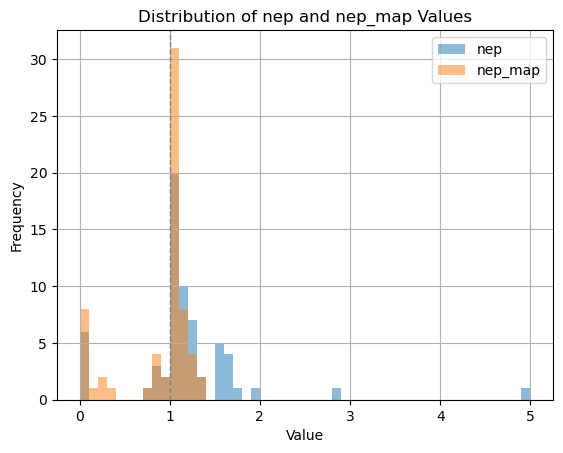

In [201]:
# plot: histrogram of nep-correction factor (ideally, would be 1)

# Filter the dataframe
filtered = x_eurostat_entsoe

# Compute minimum and maximum across both columns
min_val = min(filtered['nep'].min(), filtered['nep_map'].min())
max_val = max(filtered['nep'].max(), filtered['nep_map'].max())

# Define bin width
bin_width = 0.1

# Compute bin edges
bins = np.arange(min_val, max_val + bin_width, bin_width)

# Plot histogram
plt.hist(filtered['nep'], bins=bins, alpha=0.5, label='nep')
plt.hist(filtered['nep_map'], bins=bins, alpha=0.5, label='nep_map')

# Add labels and title
plt.title('Distribution of nep and nep_map Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Add vertical line at x=1
plt.axvline(1.0, color='grey', linestyle='dashed', linewidth=1)

# Add grid and legend
plt.grid(True)
plt.legend()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'histogram_nep_eurostat_entsoe_de' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

##### Save

In [202]:
# Define the path where the pickle files will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Save the dataframe to a pickle file
merged.to_pickle(pickle_path)
x_eurostat_entsoe.to_pickle(pickle_path2)

#### Map (scale) imports & exports
The annual data values (Eurostat) for imports and exports do not match the high resolution data values (ENTSO-E) for imports an exports. So we derive scaling factors to multiply high resolution data with so that the annual sums match up.

##### Import

In [203]:
# Define the relative path to the pickle files
pickle_path1 = os.path.join('..', '1_data', '2_interim', 'pf_core.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'imports_exports_annual.pkl')

# Load the pickle file into a DataFrame
impexp_hr = pd.read_pickle(pickle_path1)
impexp_lr = pd.read_pickle(pickle_path2)

##### Modify

In [204]:
# step 1: restrict high resolution data to columns of interes

new_columns = ['DateTime', 'FlowValue', 'InMapCode', 'OutMapCode']
impexp_hr = impexp_hr[new_columns]
impexp_hr # unit: MW

,DateTime,FlowValue,InMapCode,OutMapCode
0,2018-01-01 00:00:00,359.78,DE,AT
1,2018-01-01 00:15:00,359.78,DE,AT
2,2018-01-01 00:30:00,359.78,DE,AT
3,2018-01-01 00:45:00,359.78,DE,AT
4,2018-01-01 01:00:00,359.78,DE,AT
...,...,...,...,...
2706843,2021-12-31 22:45:00,0.00,DE,SE
2706844,2021-12-31 23:00:00,214.32,DE,SE
2706845,2021-12-31 23:15:00,214.32,DE,SE
2706846,2021-12-31 23:30:00,214.32,DE,SE


In [205]:
# step 2: split up high res data into imports and exports, modify

# split up
imp_hr = impexp_hr[(impexp_hr['InMapCode'] == 'DE')]
exp_hr = impexp_hr[(impexp_hr['OutMapCode'] == 'DE')]

# filter by columns
new_columns = ['DateTime', 'FlowValue']
imp_hr = imp_hr[new_columns]
new_columns = ['DateTime', 'FlowValue']
exp_hr = exp_hr[new_columns]

exp_hr # unit: MW

,DateTime,FlowValue
465224,2018-01-01 00:00:00,883.69
465225,2018-01-01 00:15:00,883.69
465226,2018-01-01 00:30:00,883.69
465227,2018-01-01 00:45:00,883.69
465228,2018-01-01 01:00:00,883.69
...,...,...
1818643,2021-12-31 22:45:00,275.74
1818644,2021-12-31 23:00:00,0.00
1818645,2021-12-31 23:15:00,0.00
1818646,2021-12-31 23:30:00,0.00


In [206]:
# step 3: sum up high res data across a year (imports)

# Ensure the 'DateTime' column is of datetime type
imp_hr['DateTime'] = pd.to_datetime(imp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
imp_hr['Year'] = imp_hr['DateTime'].dt.year

# Group by the year and sum the 'FlowValue' for each group
imp_hr_sum = imp_hr.groupby('Year')['FlowValue'].sum() / (4*1000) # divide by 4*1000: MW->GWh

# Display the yearly flow values
imp_hr_sum # unit: GWh

Year
2018    37763.726650
2019    41263.039500
2020    39885.886435
2021    44367.852528
Name: FlowValue, dtype: float64

In [207]:
# step 4: sum up high res data across a year (exports)

# Ensure the 'DateTime' column is of datetime type
exp_hr['DateTime'] = pd.to_datetime(exp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
exp_hr['Year'] = exp_hr['DateTime'].dt.year

# Group by the year and sum the 'FlowValue' for each group
exp_hr_sum = exp_hr.groupby('Year')['FlowValue'].sum() / (4*1000) # divide by 4*1000: MW->GWh

# Display the yearly flow values
exp_hr_sum # unit: GWh

Year
2018    42355.857650
2019    45512.261820
2020    48920.096085
2021    58047.605370
Name: FlowValue, dtype: float64

In [208]:
# step 5: merge sums of high res data for imports and exports

impexp_hr_sum = pd.merge(imp_hr_sum, exp_hr_sum, on='Year', suffixes=('_imp', '_exp'))
impexp_hr_sum # unit: GWh

,FlowValue_imp,FlowValue_exp
Year,,
2018,37763.726650,42355.857650
2019,41263.039500,45512.261820
2020,39885.886435,48920.096085
2021,44367.852528,58047.605370


In [209]:
# step 6: restrict low res data to Germany

impexp_lr = impexp_lr[(impexp_lr['Country'] == 'Germany')]
impexp_lr # unit: GWh

,Country,Year,Imports,Exports
12,Germany,2018,31727.0,80463.0
13,Germany,2019,40126.0,72793.0
14,Germany,2020,47853.0,66882.0
15,Germany,2021,51731.0,70306.0


In [210]:
# step 7: merge dataframes with high res and low res data

impexp = pd.merge(impexp_hr_sum, impexp_lr, on='Year')
impexp # unit: GWh

,Year,FlowValue_imp,FlowValue_exp,Country,Imports,Exports
0,2018,37763.726650,42355.857650,Germany,31727.0,80463.0
1,2019,41263.039500,45512.261820,Germany,40126.0,72793.0
2,2020,39885.886435,48920.096085,Germany,47853.0,66882.0
3,2021,44367.852528,58047.605370,Germany,51731.0,70306.0


In [211]:
# step 8: calculate multiplier (ratio of annual Eurostat data and summed up, high res ENTSO-E data)

impexp['mult_imp'] = impexp['Imports'] / impexp['FlowValue_imp']
impexp['mult_exp'] = impexp['Exports'] / impexp['FlowValue_exp']
impexp # unit: -

,Year,FlowValue_imp,FlowValue_exp,Country,Imports,Exports,mult_imp,mult_exp
0,2018,37763.726650,42355.857650,Germany,31727.0,80463.0,0.840145,1.899690
1,2019,41263.039500,45512.261820,Germany,40126.0,72793.0,0.972444,1.599415
2,2020,39885.886435,48920.096085,Germany,47853.0,66882.0,1.199748,1.367168
3,2021,44367.852528,58047.605370,Germany,51731.0,70306.0,1.165957,1.211178


In [212]:
# step 9: filter by columns

new_columns = ['Year', 'mult_imp', 'mult_exp']
impexp = impexp[new_columns]
impexp

,Year,mult_imp,mult_exp
0,2018,0.840145,1.899690
1,2019,0.972444,1.599415
2,2020,1.199748,1.367168
3,2021,1.165957,1.211178


In [213]:
# step 10: prepare original high res data for merging

# convert MW to MWh
impexp_hr['FlowValue'] = impexp_hr['FlowValue'] / 4 # MW -> MWh

# Ensure the 'DateTime' column is of datetime type
impexp_hr['DateTime'] = pd.to_datetime(impexp_hr['DateTime'])

# Extract the year from each datetime in the 'DateTime' column
impexp_hr['Year'] = impexp_hr['DateTime'].dt.year

impexp_hr # unit: MWh

,DateTime,FlowValue,InMapCode,OutMapCode,Year
0,2018-01-01 00:00:00,89.945,DE,AT,2018
1,2018-01-01 00:15:00,89.945,DE,AT,2018
2,2018-01-01 00:30:00,89.945,DE,AT,2018
3,2018-01-01 00:45:00,89.945,DE,AT,2018
4,2018-01-01 01:00:00,89.945,DE,AT,2018
...,...,...,...,...,...
2706843,2021-12-31 22:45:00,0.000,DE,SE,2021
2706844,2021-12-31 23:00:00,53.580,DE,SE,2021
2706845,2021-12-31 23:15:00,53.580,DE,SE,2021
2706846,2021-12-31 23:30:00,53.580,DE,SE,2021


In [214]:
# step 11: merge high res data with multiplier

# merge
impexp_hr = pd.merge(impexp_hr, impexp, on='Year')

# calculate new corrected values, separate for imports and exports
def calculate_flow_value_corr(row):
    if row['InMapCode'] == 'DE':
        return row['mult_imp'] * row['FlowValue']
    elif row['OutMapCode'] == 'DE':
        return row['mult_exp'] * row['FlowValue']
    else:
        return row['FlowValue']

impexp_hr['FlowValue_corr'] = impexp_hr.apply(calculate_flow_value_corr, axis=1)

# filter by columns
new_columns = ['DateTime', 'InMapCode', 'OutMapCode', 'FlowValue_corr']
impexp_hr = impexp_hr[new_columns]

impexp_hr # unit: MWh

,DateTime,InMapCode,OutMapCode,FlowValue_corr
0,2018-01-01 00:00:00,DE,AT,75.566827
1,2018-01-01 00:15:00,DE,AT,75.566827
2,2018-01-01 00:30:00,DE,AT,75.566827
3,2018-01-01 00:45:00,DE,AT,75.566827
4,2018-01-01 01:00:00,DE,AT,75.566827
...,...,...,...,...
2706843,2021-12-31 22:45:00,DE,SE,0.000000
2706844,2021-12-31 23:00:00,DE,SE,62.471966
2706845,2021-12-31 23:15:00,DE,SE,62.471966
2706846,2021-12-31 23:30:00,DE,SE,62.471966


##### Check

In [215]:
# calculate difference in columns sums for low res and corrected high res data
diff_abs = impexp_hr.FlowValue_corr.sum() - ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)
diff_rel = (impexp_hr.FlowValue_corr.sum() - ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)) / ((impexp_lr.Imports.sum() + impexp_lr.Exports.sum()) * 1000)

In [216]:
# absolute difference (should be zero)
diff_abs

-3.5762786865234375e-07

In [217]:
# relative difference (should be zero)
diff_rel

-7.742857330185562e-16

##### Save

In [218]:
# Define the relative path to the pickle files
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')

# Load the pickle file into a DataFrame
impexp_hr.to_pickle(pickle_path)

## Emission factors per production type
Importing and mapping.

### Import
Here, we import data by the Umweltbundesamt (UBA) on the emission factors per production type (e.g. lignite, geothermal), referenced to the primary energy (PE). References are given in the original data file (column "Reference / Comments").

In [142]:
# part 1: ef

# Specify the filename
filename = "../1_data/1_raw/UBA/ef_pe.xlsx"

# Read the excel file
ef = pd.read_excel(filename)

# Keep only columns A-G which are the first seven columns in python (0-indexed)
ef = ef.iloc[:, :7]

# Reindex the dataframe
ef.reset_index(drop=True, inplace=True)

# Print the dataframe
ef # unit: g/kWh

,label_entsoe,ef_pe_co2_op,ef_pe_ch4_op,ef_pe_n2o_op,ef_pe_co2_up,ef_pe_ch4_up,ef_pe_n2o_up
0,Anthracite,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
1,Coking coal,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
2,Other bituminous coal,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
3,Sub-bituminous coal,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
4,Lignite,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
5,Coke oven coke,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
6,Gas coke,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
7,Patent fuel,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
8,Brown coal briquettes,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
9,Coal tar,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000


In [143]:
# part 2: energy flows mapped to eurostat and entsoe categories

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
en = pd.read_pickle(pickle_path)
en_entsoe = pd.read_pickle(pickle_path2)

### Map (Eurostat -> ENTSO-E)
The emission factor data is mapped to Eurostat production types. We need to map it to ENTSOE production types.

In [144]:
# step 1: modify energy flows mapped to entsoe categories

# Specify columns to keep
columns_to_keep = ['Year', 'Production Type', 'nep_entsoe']

# Drop rows with 'Hydro Pumped Storage' in 'Production Type' - no ef available (for now)
en_entsoe = en_entsoe[en_entsoe['Production Type'] != 'Hydro Pumped Storage']

# Filter and keep specified columns
en_entsoe = en_entsoe.filter(items=columns_to_keep)

# Reset the index
en_entsoe = en_entsoe.reset_index(drop=True)

# change datatype of Year column to integer
en_entsoe['Year'] = en_entsoe['Year'].astype('i4')

en_entsoe # unit: GWh

,Year,Production Type,nep_entsoe
0,2018,Fossil Hard coal,71546.320482
1,2018,Fossil Brown coal/Lignite,128361.330463
2,2018,Biomass,40184.833007
3,2018,Other renewable,1364.531088
4,2018,Waste,5241.295025
...,...,...,...
59,2021,Hydro Water Reservoir,1177.974085
60,2021,Geothermal,197.554065
61,2021,Wind Offshore,23993.087095
62,2021,Wind Onshore,89658.447813


In [145]:
# step 2: modify energy flows mapped to eurostat categories

# drop heat pumps (all zeroes)
en = en.drop(
    en[en['Production Type'] == 'Ambient heat (heat pumps)'].index
)


# change datatype of Year column to integer
en['Year'] = en['Year'].astype('i4')

# Specify columns to keep
columns_to_keep = ['Year', 'Production Type']
prefix_to_keep = 'pe_'

# Filter and keep specified columns and columns with the given prefix
en = en.filter(items=columns_to_keep + [col for col in en.columns if col.startswith(prefix_to_keep)])

# Mapping for many-to-one mappings
mapping = {
    'Wind': ['Wind, onshore', 'Wind, offshore'],
    'Hydro': ['Hydro, run of river', 'Hydro, storage / pumped storage w. nat. f.']
}

# Strip leading/trailing spaces in non-numerical columns of dataframes
en = en.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Duplicate rows in df according to mapping
for key, values in mapping.items():
    for value in values:
        mask = en['Production Type'] == key
        new_row = en[mask].copy()
        new_row['Production Type'] = value
        en = en.append(new_row, ignore_index=True)
        
en # unit: GWh

,Year,Production Type,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map
0,2018,Anthracite,0.000,0.000,1716.000,6055.500
1,2018,Coking coal,0.000,0.000,4994.444,17649.722
2,2018,Other bituminous coal,3018.180,4889.611,37863.814,133785.477
3,2018,Sub-bituminous coal,0.000,0.000,0.000,0.000
4,2018,Lignite,1900.847,5384.245,11841.614,354477.122
...,...,...,...,...,...,...
143,2021,"Hydro, run of river",0.000,100.000,0.000,19558.000
144,2018,"Hydro, storage / pumped storage w. nat. f.",0.000,87.000,0.000,17606.000
145,2019,"Hydro, storage / pumped storage w. nat. f.",0.000,98.000,0.000,19633.000
146,2020,"Hydro, storage / pumped storage w. nat. f.",0.000,84.000,0.000,18637.000


In [146]:
# step 3: modify emission factors (mapped to eurostat categories)

# Strip leading/trailing spaces in non-numerical columns of dataframes
ef = ef.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Ensure the new labels exist in df
ef_labels = set(ef['label_entsoe'])
for labels in mapping.values():
    assert any(label in ef_labels for label in labels), f"None of {labels} found in ef"
    
ef # unit: g/kWh

,label_entsoe,ef_pe_co2_op,ef_pe_ch4_op,ef_pe_n2o_op,ef_pe_co2_up,ef_pe_ch4_up,ef_pe_n2o_up
0,Anthracite,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
1,Coking coal,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
2,Other bituminous coal,337.230000,0.004000,0.004000,16.738000,0.912000,0.001000
3,Sub-bituminous coal,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
4,Lignite,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
5,Coke oven coke,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
6,Gas coke,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
7,Patent fuel,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
8,Brown coal briquettes,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000
9,Coal tar,393.380000,0.002000,0.013000,10.416000,0.007000,0.000000


In [147]:
# step 4: merge en_eurostat and ef_eurostat

# Merge dataframes
en_ef_eurostat = pd.merge(en, ef, how='inner', 
                     left_on='Production Type', right_on='label_entsoe')

# Drop the original 'Wind' and 'Hydro' rows from en_ef_eurostat to avoid double counting
en_ef_eurostat = en_ef_eurostat[~en_ef_eurostat['Production Type'].isin(mapping.keys())]

# Drop rows without matching labels
unmatched_labels = set(en['Production Type']) - set(ef['label_entsoe'])
en_ef_eurostat = en_ef_eurostat[~en_ef_eurostat['Production Type'].isin(unmatched_labels)]

# List of column names to drop
columns_to_drop = ['label_entsoe']
en_ef_eurostat = en_ef_eurostat.drop(columns=columns_to_drop)

# Remove duplicate rows
en_ef_eurostat = en_ef_eurostat.drop_duplicates()

en_ef_eurostat # unit: g/kWh (ef), GWh (pe)

,Year,Production Type,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,ef_pe_co2_op,ef_pe_ch4_op,ef_pe_n2o_op,ef_pe_co2_up,ef_pe_ch4_up,ef_pe_n2o_up
0,2018,Anthracite,0.0,0.0,1716.000,6055.500,337.230,0.004,0.004,16.738,0.912,0.001
1,2019,Anthracite,0.0,0.0,358.240,991.163,337.230,0.004,0.004,16.738,0.912,0.001
2,2020,Anthracite,0.0,0.0,370.136,949.031,337.230,0.004,0.004,16.738,0.912,0.001
3,2021,Anthracite,0.0,0.0,354.577,1065.422,337.230,0.004,0.004,16.738,0.912,0.001
4,2018,Coking coal,0.0,0.0,4994.444,17649.722,337.230,0.004,0.004,16.738,0.912,0.001
...,...,...,...,...,...,...,...,...,...,...,...,...
135,2021,"Hydro, run of river",0.0,100.0,0.000,19558.000,0.000,0.000,0.000,2.531,0.004,0.000
136,2018,"Hydro, storage / pumped storage w. nat. f.",0.0,87.0,0.000,17606.000,8.025,0.017,0.001,6.543,0.297,0.000
137,2019,"Hydro, storage / pumped storage w. nat. f.",0.0,98.0,0.000,19633.000,8.025,0.017,0.001,6.543,0.297,0.000
138,2020,"Hydro, storage / pumped storage w. nat. f.",0.0,84.0,0.000,18637.000,8.025,0.017,0.001,6.543,0.297,0.000


In [148]:
# step 5: mapping
# 5.1: define dictionaries

# Define the mapping
mapping = {
    'Anthracite': ["Fossil Hard coal"],
    'Coking coal': ["Fossil Brown coal/Lignite"],
    'Other bituminous coal': ["Fossil Hard coal"],
    'Sub-bituminous coal': ["Fossil Brown coal/Lignite"],
    'Lignite': ["Fossil Brown coal/Lignite"],
    'Coke oven coke': ["Fossil Brown coal/Lignite"], 
    'Gas coke': ["Fossil Brown coal/Lignite"], 
    'Patent fuel': ["Fossil Brown coal/Lignite"],
    'Brown coal briquettes': ["Fossil Brown coal/Lignite"],
    'Coal tar': ["Fossil Brown coal/Lignite"], 
    'Manufactured gases': ["Fossil Coal-derived gas"],
    'Peat and peat products': ["Fossil Brown coal/Lignite"],
    'Oil shale and oil sands': ["Fossil Oil"],
    'Natural gas': ["Fossil Gas", "Other"],
    'Oil and petroleum products (excluding biofuel portion)': ["Fossil Oil"], 
    'Hydro, run of river': ["Hydro Run-of-river and poundage"],
    'Hydro, storage / pumped storage w. nat. f.': ["Hydro Water Reservoir"],
    'Geothermal': ["Geothermal"], 
    'Wind, onshore': ["Wind Onshore"],
    'Wind, offshore': ["Wind Offshore"], 
    'Solar thermal': ["Solar"], 
    'Solar photovoltaic': ["Solar"],
    'Tide, wave, ocean': ["Marine"],
    'Primary solid biofuels': ["Biomass"], 
    'Charcoal': ["Other renewable"], 
    'Pure biogasoline': ["Other renewable"], 
    'Blended biogasoline': ["Other renewable"], 
    'Pure biodiesels': ["Other renewable"], 
    'Blended biodiesels': ["Other renewable"], 
    'Pure bio jet kerosene': ["Other renewable"], 
    'Blended bio jet kerosene': ["Other renewable"], 
    'Other liquid biofuels': ["Biomass"], 
    'Biogases': ["Biomass"],
    'Non-renewable waste': ["Waste"],
    'Renewable municipal waste': ["Biomass"],
    'Nuclear heat': ["Nuclear"]
}

# mapping : old => new

# Group mapping several old to several new
xtmp = dict() 
for l, r in mapping.items():
    k = tuple(sorted(set(r)))
    xtmp[k] = xtmp.get(k, set()) | set([l])

# xtmp : new => old
xtmp = [(k, tuple(sorted(v))) for k, v in xtmp.items()]

# Check duplicates
x = sum([list(x[1]) for x in xtmp], start=[])
y = set(x)
len(x) == len(y) # should be True

# Create fake categories
x = [list(x[1]) for x in xtmp]
#fakecategories = [" / ".join(c) for c in x] # alternative: if you want long names
fakecategories = [f"C{n}" for n in range(len(x))]
fakecategories # display the categories

# Create map from individual old to corresponding fake category
map_old_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[1]:
        map_old_to_fakecategory[c] = b

map_old_to_fakecategory # display old and fake categories

{'Anthracite': 'C0',
 'Other bituminous coal': 'C0',
 'Brown coal briquettes': 'C1',
 'Coal tar': 'C1',
 'Coke oven coke': 'C1',
 'Coking coal': 'C1',
 'Gas coke': 'C1',
 'Lignite': 'C1',
 'Patent fuel': 'C1',
 'Peat and peat products': 'C1',
 'Sub-bituminous coal': 'C1',
 'Manufactured gases': 'C2',
 'Oil and petroleum products (excluding biofuel portion)': 'C3',
 'Oil shale and oil sands': 'C3',
 'Natural gas': 'C4',
 'Hydro, run of river': 'C5',
 'Hydro, storage / pumped storage w. nat. f.': 'C6',
 'Geothermal': 'C7',
 'Wind, onshore': 'C8',
 'Wind, offshore': 'C9',
 'Solar photovoltaic': 'C10',
 'Solar thermal': 'C10',
 'Tide, wave, ocean': 'C11',
 'Biogases': 'C12',
 'Other liquid biofuels': 'C12',
 'Primary solid biofuels': 'C12',
 'Renewable municipal waste': 'C12',
 'Blended bio jet kerosene': 'C13',
 'Blended biodiesels': 'C13',
 'Blended biogasoline': 'C13',
 'Charcoal': 'C13',
 'Pure bio jet kerosene': 'C13',
 'Pure biodiesels': 'C13',
 'Pure biogasoline': 'C13',
 'Non-renew

In [149]:
# step 5: mapping
# 5.2: define dictionaries, part 2 (fake to new categories)

# Create map from indiviual new to fake category
map_new_to_fakecategory = dict()
for a, b in zip(xtmp, fakecategories):
    for c in a[0]:
        map_new_to_fakecategory[c] = b

map_new_to_fakecategory # check new to fake

{'Fossil Hard coal': 'C0',
 'Fossil Brown coal/Lignite': 'C1',
 'Fossil Coal-derived gas': 'C2',
 'Fossil Oil': 'C3',
 'Fossil Gas': 'C4',
 'Other': 'C4',
 'Hydro Run-of-river and poundage': 'C5',
 'Hydro Water Reservoir': 'C6',
 'Geothermal': 'C7',
 'Wind Onshore': 'C8',
 'Wind Offshore': 'C9',
 'Solar': 'C10',
 'Marine': 'C11',
 'Biomass': 'C12',
 'Other renewable': 'C13',
 'Waste': 'C14',
 'Nuclear': 'C15'}

In [150]:
# step 5: mapping
# 5.3: apply new to fake mapping

# Apply map_new_to_fakecategory
en_entsoe["fakecategory"] = list(map(lambda x: map_new_to_fakecategory[x], en_entsoe["Production Type"]))

# Group by fakecategory and sum
en_entsoe_sum = en_entsoe.groupby(["Year", "fakecategory"]).sum()
en_entsoe_sum = en_entsoe_sum.rename(columns={"nep_entsoe": "nep_entsoe_sum"})

en_entsoe_sum # unit: GWh

nep_entsoe_sum
Year fakecategory                
2018 C0              71546.320482
     C1             128361.330463
     C10             41234.260042
     C12             40184.833007
     C13              1364.531088
     C14              5241.295025
     C15             71844.749107
     C2               3584.717100
     C3               2797.441107
     C4              46739.983865
     C5              14354.966420
     C6                902.355095
     C7                166.625065
     C8              89488.836880
     C9              19075.452515
2019 C0              47814.379670
     C1             102731.626037
     C10             41914.757560
     C12             41028.520455
     C13              1283.044567
     C14              5478.012520
     C15             71041.201755
     C2               1953.885200
     C3               3971.769370
     C4              57143.647408
     C5              14519.870550
     C6               1310.314175
     C7                181.330097
     C8              99621.826878
     C9              24180.489008
2020 C0              34873.413343
     C1              83376.235647
     C10             45821.559708
     C12             40283.989767
     C13              1409.398952
     C14              5689.896350
     C15             60923.923858
     C2                  0.000000
     C3               3889.549643
     C4              61755.545752
     C5              14370.785508
     C6               1212.437410
     C7                197.769540
     C8             103104.543450
     C9              26865.446703
2021 C0              51840.320367
     C1              98194.141308
     C10             46606.888157
     C12             39210.502638
     C13              1336.087730
     C14              6947.491018
     C15             65401.129398
     C2                  0.000000
     C3               3195.077092
     C4              55550.364450
     C5              13279.372307
     C6               1177.974085
     C7                197.554065
     C8              89658.447813
     C9              23993.087095

In [151]:
# step 5: mapping
# 5.4: compute ratio - to multiply old values with

# Compute ratio to apply for each new category 
en_entsoe_ratio = en_entsoe.merge(en_entsoe_sum, on=["Year", "fakecategory"])
en_entsoe_ratio["ratio"] = en_entsoe_ratio["nep_entsoe"] / en_entsoe_ratio["nep_entsoe_sum"]
en_entsoe_ratio = en_entsoe_ratio.fillna(0.0)

en_entsoe_ratio # unit: GWh

,Year,Production Type,nep_entsoe,fakecategory,nep_entsoe_sum,ratio
0,2018,Fossil Hard coal,71546.320482,C0,71546.320482,1.0
1,2018,Fossil Brown coal/Lignite,128361.330463,C1,128361.330463,1.0
2,2018,Biomass,40184.833007,C12,40184.833007,1.0
3,2018,Other renewable,1364.531088,C13,1364.531088,1.0
4,2018,Waste,5241.295025,C14,5241.295025,1.0
...,...,...,...,...,...,...
59,2021,Hydro Water Reservoir,1177.974085,C6,1177.974085,1.0
60,2021,Geothermal,197.554065,C7,197.554065,1.0
61,2021,Wind Offshore,23993.087095,C9,23993.087095,1.0
62,2021,Wind Onshore,89658.447813,C8,89658.447813,1.0


In [152]:
# step 5: mapping
# 5.5: Apply old to fake mapping, sum all old values by fake category
en_ef_eurostat["fakecategory"] = list(map(lambda x: map_old_to_fakecategory[x], en_ef_eurostat["Production Type"]))

en_ef_eurostat # unit: GWh (pe), g/kWh (ef)

,Year,Production Type,pe_chp_ap,pe_el_ap,pe_chp_map,pe_el_map,ef_pe_co2_op,ef_pe_ch4_op,ef_pe_n2o_op,ef_pe_co2_up,ef_pe_ch4_up,ef_pe_n2o_up,fakecategory
0,2018,Anthracite,0.0,0.0,1716.000,6055.500,337.230,0.004,0.004,16.738,0.912,0.001,C0
1,2019,Anthracite,0.0,0.0,358.240,991.163,337.230,0.004,0.004,16.738,0.912,0.001,C0
2,2020,Anthracite,0.0,0.0,370.136,949.031,337.230,0.004,0.004,16.738,0.912,0.001,C0
3,2021,Anthracite,0.0,0.0,354.577,1065.422,337.230,0.004,0.004,16.738,0.912,0.001,C0
4,2018,Coking coal,0.0,0.0,4994.444,17649.722,337.230,0.004,0.004,16.738,0.912,0.001,C1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,2021,"Hydro, run of river",0.0,100.0,0.000,19558.000,0.000,0.000,0.000,2.531,0.004,0.000,C5
136,2018,"Hydro, storage / pumped storage w. nat. f.",0.0,87.0,0.000,17606.000,8.025,0.017,0.001,6.543,0.297,0.000,C6
137,2019,"Hydro, storage / pumped storage w. nat. f.",0.0,98.0,0.000,19633.000,8.025,0.017,0.001,6.543,0.297,0.000,C6
138,2020,"Hydro, storage / pumped storage w. nat. f.",0.0,84.0,0.000,18637.000,8.025,0.017,0.001,6.543,0.297,0.000,C6


In [153]:
# step 5: mapping
# 5.6: Apply old to fake mapping, calculate pe-weighted sums for ef (mapping many to one)

# Parameters and their combinations
substances = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['ap', 'map']

combinations = [(substance, sysbound, output, gridcon) 
                for substance in substances 
                for sysbound in sysbounds 
                for output in outputs 
                for gridcon in gridcons]

# Function to calculate the new emission factor for a single group
def calculate_new_ef(group):
    for substance, sysbound, output, gridcon in combinations:
        ef_col = f'ef_pe_{substance}_{sysbound}'
        pe_col = f'pe_{output}_{gridcon}'
        total_pe = group[pe_col].sum()
        if total_pe == 0.0:  # avoid division by zero
            group[f'{ef_col}_{output}_{gridcon}_new'] = 0.0
        else:
            group[f'{ef_col}_{output}_{gridcon}_new'] = (group[ef_col] * group[pe_col] / total_pe).sum()
    return group

# Group the dataframe and apply the function to each group
en_ef_eurostat_new = en_ef_eurostat.groupby(['fakecategory', 'Year']).apply(calculate_new_ef)

# Replace any resulting "nan" or "inf" values with 0.0
en_ef_eurostat_new = en_ef_eurostat_new.replace([np.inf, -np.inf, np.nan], 0.0)

# Define the columns to keep
cols_to_keep = [
    'Year', 'fakecategory', 
    'ef_pe_co2_op_el_ap_new', 'ef_pe_co2_op_el_map_new', 'ef_pe_co2_op_chp_ap_new', 'ef_pe_co2_op_chp_map_new',
    'ef_pe_co2_up_el_ap_new', 'ef_pe_co2_up_el_map_new', 'ef_pe_co2_up_chp_ap_new', 'ef_pe_co2_up_chp_map_new',
    'ef_pe_ch4_op_el_ap_new', 'ef_pe_ch4_op_el_map_new', 'ef_pe_ch4_op_chp_ap_new', 'ef_pe_ch4_op_chp_map_new',
    'ef_pe_ch4_up_el_ap_new', 'ef_pe_ch4_up_el_map_new', 'ef_pe_ch4_up_chp_ap_new', 'ef_pe_ch4_up_chp_map_new',
    'ef_pe_n2o_op_el_ap_new', 'ef_pe_n2o_op_el_map_new', 'ef_pe_n2o_op_chp_ap_new', 'ef_pe_n2o_op_chp_map_new',
    'ef_pe_n2o_up_el_ap_new', 'ef_pe_n2o_up_el_map_new', 'ef_pe_n2o_up_chp_ap_new', 'ef_pe_n2o_up_chp_map_new'
]

# Drop the other columns
en_ef_eurostat_new = en_ef_eurostat_new[cols_to_keep]

# rename the _new columns
column_names = en_ef_eurostat_new.columns
new_column_names = []
# Iterate through the original column names
for name in column_names:
    # If the column name ends with "_new", remove that part
    if name.endswith('_new'):
        new_name = name[:-4]  # -4 because "_new" has 4 characters
    else:
        new_name = name  # If it doesn't end with "_new", keep the original name
    new_column_names.append(new_name)

# Now assign the new column names to the dataframe
en_ef_eurostat_new.columns = new_column_names
en_ef_eurostat_new = en_ef_eurostat_new.drop_duplicates()

# Display the first few rows of the new dataframe
en_ef_eurostat_new # unit: g/kWh 

,Year,fakecategory,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_co2_up_el_ap,ef_pe_co2_up_el_map,ef_pe_co2_up_chp_ap,ef_pe_co2_up_chp_map,...,ef_pe_ch4_up_chp_ap,ef_pe_ch4_up_chp_map,ef_pe_n2o_op_el_ap,ef_pe_n2o_op_el_map,ef_pe_n2o_op_chp_ap,ef_pe_n2o_op_chp_map,ef_pe_n2o_up_el_ap,ef_pe_n2o_up_el_map,ef_pe_n2o_up_chp_ap,ef_pe_n2o_up_chp_map
0,2018,C0,337.230000,337.230000,337.230000,337.230000,16.738000,16.738000,16.738000,16.738000,...,0.912000,0.912000,0.004000,0.004000,0.004000,0.004000,0.001000,0.001000,0.001000,0.001000
1,2019,C0,337.230000,337.230000,337.230000,337.230000,16.738000,16.738000,16.738000,16.738000,...,0.912000,0.912000,0.004000,0.004000,0.004000,0.004000,0.001000,0.001000,0.001000,0.001000
2,2020,C0,337.230000,337.230000,337.230000,337.230000,16.738000,16.738000,16.738000,16.738000,...,0.912000,0.912000,0.004000,0.004000,0.004000,0.004000,0.001000,0.001000,0.001000,0.001000
3,2021,C0,337.230000,337.230000,337.230000,337.230000,16.738000,16.738000,16.738000,16.738000,...,0.912000,0.912000,0.004000,0.004000,0.004000,0.004000,0.001000,0.001000,0.001000,0.001000
4,2018,C1,393.380000,390.724884,393.380000,378.379586,10.416000,10.714943,10.416000,12.104916,...,0.007000,0.248770,0.013000,0.012574,0.013000,0.010596,0.000000,0.000047,0.000000,0.000267
5,2019,C1,393.380000,393.380000,393.380000,393.380000,10.416000,10.416000,10.416000,10.416000,...,0.007000,0.007000,0.013000,0.013000,0.013000,0.013000,0.000000,0.000000,0.000000,0.000000
6,2020,C1,393.380000,393.380000,393.380000,393.380000,10.416000,10.416000,10.416000,10.416000,...,0.007000,0.007000,0.013000,0.013000,0.013000,0.013000,0.000000,0.000000,0.000000,0.000000
7,2021,C1,393.380000,393.380000,393.380000,393.380000,10.416000,10.416000,10.416000,10.416000,...,0.007000,0.007000,0.013000,0.013000,0.013000,0.013000,0.000000,0.000000,0.000000,0.000000
40,2018,C2,266.470000,266.470000,266.470000,266.470000,41.447000,41.447000,41.447000,41.447000,...,0.077000,0.077000,0.006000,0.006000,0.006000,0.006000,0.000000,0.000000,0.000000,0.000000
41,2019,C2,266.470000,266.470000,266.470000,266.470000,41.447000,41.447000,41.447000,41.447000,...,0.077000,0.077000,0.006000,0.006000,0.006000,0.006000,0.000000,0.000000,0.000000,0.000000


In [154]:
# step 5: mapping
# 5.7: Assign ratio for all old values per fake category (mapping one to many, using nep ratios)

# merge dataframes
ef_pe_entsoe = en_ef_eurostat_new.merge(en_entsoe_ratio, on=["Year", "fakecategory"])

# Select the columns that start with "ef_"
ef_cols = [col for col in ef_pe_entsoe.columns if col.startswith('ef_')]

# Multiply the selected columns by the "ratio" column
ef_pe_entsoe[ef_cols] = ef_pe_entsoe[ef_cols].multiply(ef_pe_entsoe["ratio"], axis="index")

# drop some columns
ef_pe_entsoe = ef_pe_entsoe.drop(columns=['nep_entsoe', 'nep_entsoe_sum', 'ratio', 'fakecategory'])

# Display the first few rows of the updated dataframe
ef_pe_entsoe # unit: g/kWh

,Year,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_co2_up_el_ap,ef_pe_co2_up_el_map,ef_pe_co2_up_chp_ap,ef_pe_co2_up_chp_map,ef_pe_ch4_op_el_ap,...,ef_pe_ch4_up_chp_map,ef_pe_n2o_op_el_ap,ef_pe_n2o_op_el_map,ef_pe_n2o_op_chp_ap,ef_pe_n2o_op_chp_map,ef_pe_n2o_up_el_ap,ef_pe_n2o_up_el_map,ef_pe_n2o_up_chp_ap,ef_pe_n2o_up_chp_map,Production Type
0,2018,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,0.004,...,0.91200,0.004,0.004000,0.004,0.004000,0.001,0.001000,0.001,0.001000,Fossil Hard coal
1,2019,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,0.004,...,0.91200,0.004,0.004000,0.004,0.004000,0.001,0.001000,0.001,0.001000,Fossil Hard coal
2,2020,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,0.004,...,0.91200,0.004,0.004000,0.004,0.004000,0.001,0.001000,0.001,0.001000,Fossil Hard coal
3,2021,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,0.004,...,0.91200,0.004,0.004000,0.004,0.004000,0.001,0.001000,0.001,0.001000,Fossil Hard coal
4,2018,393.380,390.724884,393.38,378.379586,10.416,10.714943,10.416,12.104916,0.002,...,0.24877,0.013,0.012574,0.013,0.010596,0.000,0.000047,0.000,0.000267,Fossil Brown coal/Lignite
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,0.000,0.000000,0.00,0.000000,2.531,2.531000,0.000,0.000000,0.000,...,0.00000,0.000,0.000000,0.000,0.000000,0.000,0.000000,0.000,0.000000,Hydro Run-of-river and poundage
60,2018,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,0.017,...,0.00000,0.001,0.001000,0.000,0.000000,0.000,0.000000,0.000,0.000000,Hydro Water Reservoir
61,2019,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,0.017,...,0.00000,0.001,0.001000,0.000,0.000000,0.000,0.000000,0.000,0.000000,Hydro Water Reservoir
62,2020,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,0.017,...,0.00000,0.001,0.001000,0.000,0.000000,0.000,0.000000,0.000,0.000000,Hydro Water Reservoir


### Check

In [155]:
# we check how much the sum of total emissions has changed during the mapping process
# total emissions = ef_pe_eurostat * pe_eurostat = ef_pe_entsoe * pe_entsoe (if nothing has changed)

#### Import

In [156]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_eurostat.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
pe_eurostat = pd.read_pickle(pickle_path)
pe_entsoe = pd.read_pickle(pickle_path2)

# define the other dataframes
ef_pe_eurostat = ef

#### Modify

In [157]:
# step 1: reduce number of columns, replace nan

# limit to columns of interest
pe_entsoe = pe_entsoe[['Year', 'Production Type', 'pe_el_map', 'pe_el_ap', 'pe_chp_map', 'pe_chp_ap']]
cols = ['Year', 'Production Type'] + [col for col in ef_pe_entsoe.columns if col.startswith('ef_pe')]
ef_pe_entsoe = ef_pe_entsoe[cols]

# replace nan values with zeros
pe_eurostat = pe_eurostat.replace(np.nan, 0.0)
pe_entsoe = pe_entsoe.replace(np.nan, 0.0)
ef_pe_eurostat = ef_pe_eurostat.replace(np.nan, 0.0)
ef_pe_entsoe = ef_pe_entsoe.replace(np.nan, 0.0)

In [158]:
# step 2: calculate total emission from entsoe data (pe and ef_pe)

# merge dataframes
merged = pd.merge(pe_entsoe, ef_pe_entsoe, on=['Year', 'Production Type'])

# create new dataframe
em_entsoe = pd.DataFrame()
em_entsoe[['Year', 'Production Type']] = merged[['Year', 'Production Type']]

metrics = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['map', 'ap']

# calculate emissions
for metric in metrics:
    for sysbound in sysbounds:
        for output in outputs:
            for gridcon in gridcons:
                # prepare column names
                pe_col = f'pe_{output}_{gridcon}'
                ef_pe_col = f'ef_pe_{metric}_{sysbound}_{output}_{gridcon}'
                em_col = f'em_{metric}_{sysbound}_{output}_{gridcon}'

                # calculate emissions
                if pe_col in merged.columns and ef_pe_col in merged.columns:
                    em_entsoe[em_col] = merged[pe_col] * merged[ef_pe_col]

# show result
em_entsoe # unit: GWh * g/kWh = t

,Year,Production Type,em_co2_op_el_map,em_co2_op_el_ap,em_co2_op_chp_map,em_co2_op_chp_ap,em_co2_up_el_map,em_co2_up_el_ap,em_co2_up_chp_map,em_co2_up_chp_ap,...,em_ch4_up_chp_map,em_ch4_up_chp_ap,em_n2o_op_el_map,em_n2o_op_el_ap,em_n2o_op_chp_map,em_n2o_op_chp_ap,em_n2o_up_el_map,em_n2o_up_el_ap,em_n2o_up_chp_map,em_n2o_up_chp_ap
0,2018,Fossil Hard coal,4.715857e+07,1.648924e+06,1.334750e+07,1.017821e+06,2.340658e+06,81842.308918,662486.926732,50518.296840,...,36096.790368,2752.580160,559.363908,19.558444,158.319256,12.072720,139.840977,4.889611,39.579814,3.018180
1,2018,Fossil Brown coal/Lignite,1.458395e+08,2.340872e+06,7.073940e+06,1.144113e+06,3.999392e+06,61982.105808,226305.671816,30294.081888,...,4650.839291,20.358926,4693.450472,77.358619,198.089593,37.809434,17.649722,0.000000,4.994444,0.000000
2,2018,Biomass,4.457098e+05,2.509061e+04,9.941006e+05,4.655837e+04,3.572091e+05,33758.227960,739398.526215,59357.258163,...,97921.659524,815.304235,313.824684,35.957768,497.205811,60.998124,1737.446811,3.289983,4780.355759,38.306431
3,2018,Other renewable,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,2018,Waste,3.175087e+06,7.081126e+04,4.171758e+06,2.289516e+05,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,0.000000,97.509814,2.174679,128.118514,7.031315,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Water Reservoir,1.279073e+04,1.345061e+02,0.000000e+00,0.000000e+00,1.042863e+04,109.666459,0.000000,0.000000,...,0.000000,0.000000,1.593861,0.016761,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
60,2021,Geothermal,3.139593e+05,0.000000e+00,0.000000e+00,0.000000e+00,1.636549e+04,0.000000,0.000000,0.000000,...,0.000000,0.000000,19.561326,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
61,2021,Wind Offshore,9.562016e+03,0.000000e+00,0.000000e+00,0.000000e+00,2.094929e+05,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
62,2021,Wind Onshore,7.119216e+04,0.000000e+00,0.000000e+00,0.000000e+00,1.441031e+06,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [159]:
# step 3: calculate total emission from eurostat data (pe and ef_pe)

# merge dataframes
merged = pd.merge(pe_eurostat, ef_pe_eurostat, left_on='Production Type', right_on='label_entsoe')

# create new dataframe
em_eurostat = pd.DataFrame()
em_eurostat[['Year', 'Production Type']] = merged[['Year', 'Production Type']]

metrics = ['co2', 'ch4', 'n2o']
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['map', 'ap']

# calculate emissions
for metric in metrics:
    for sysbound in sysbounds:
        for output in outputs:
            for gridcon in gridcons:
                # prepare column names
                pe_col = f'pe_{output}_{gridcon}'
                ef_pe_col = f'ef_pe_{metric}_{sysbound}'
                em_col = f'em_{metric}_{sysbound}_{output}_{gridcon}'

                # calculate emissions
                if pe_col in merged.columns and ef_pe_col in merged.columns:
                    em_eurostat[em_col] = merged[pe_col] * merged[ef_pe_col]
                

# show result
em_eurostat # unit: GWh * g/kWh = t

,Year,Production Type,em_co2_op_el_map,em_co2_op_el_ap,em_co2_op_chp_map,em_co2_op_chp_ap,em_co2_up_el_map,em_co2_up_el_ap,em_co2_up_chp_map,em_co2_up_chp_ap,...,em_ch4_up_chp_map,em_ch4_up_chp_ap,em_n2o_op_el_map,em_n2o_op_el_ap,em_n2o_op_chp_map,em_n2o_op_chp_ap,em_n2o_up_el_map,em_n2o_up_el_ap,em_n2o_up_chp_map,em_n2o_up_chp_ap
0,2018,Anthracite,2.042096e+06,0.0,5.786867e+05,0.0,1.013570e+05,0.0,28722.408000,0.0,...,1564.992000,0.0,24.222000,0.0,6.864000,0.0,6.055500,0.0,1.716000,0.0
1,2019,Anthracite,3.342499e+05,0.0,1.208093e+05,0.0,1.659009e+04,0.0,5996.221120,0.0,...,326.714880,0.0,3.964652,0.0,1.432960,0.0,0.991163,0.0,0.358240,0.0
2,2020,Anthracite,3.200417e+05,0.0,1.248210e+05,0.0,1.588488e+04,0.0,6195.336368,0.0,...,337.564032,0.0,3.796124,0.0,1.480544,0.0,0.949031,0.0,0.370136,0.0
3,2021,Anthracite,3.592923e+05,0.0,1.195740e+05,0.0,1.783303e+04,0.0,5934.909826,0.0,...,323.374224,0.0,4.261688,0.0,1.418308,0.0,1.065422,0.0,0.354577,0.0
4,2018,Coking coal,5.952016e+06,0.0,1.684276e+06,0.0,2.954210e+05,0.0,83597.003672,0.0,...,4554.932928,0.0,70.598888,0.0,19.977776,0.0,17.649722,0.0,4.994444,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,2021,Solar photovoltaic,1.978534e+04,0.0,0.000000e+00,0.0,2.558822e+06,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,98.680000,0.0,0.000000,0.0
120,2018,Solar thermal,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
121,2019,Solar thermal,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
122,2020,Solar thermal,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.0,0.000000,0.0,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0


In [160]:
# step 4: compare the emission sums across production types for eurostat and entsoe data,
# by calculating the relative difference:
# diff = (emissions_entsoe - emissions_eurostat) / emissions_eurostat

# drop label columns, cannot be summed
em_entsoe.drop(['Year', 'Production Type'], axis=1, inplace=True)
em_eurostat.drop(['Year', 'Production Type'], axis=1, inplace=True)

# calculate relative difference
(em_entsoe.sum() - em_eurostat.sum()) / em_eurostat.sum() # unit: -
# interpretation: ideally, the relative difference would be zero

em_co2_op_el_map    -0.005613
em_co2_op_el_ap     -0.029004
em_co2_op_chp_map   -0.049954
em_co2_op_chp_ap    -0.079862
em_co2_up_el_map     0.137807
em_co2_up_el_ap     -0.177003
em_co2_up_chp_map   -0.060600
em_co2_up_chp_ap    -0.093864
em_ch4_op_el_map    -0.019198
em_ch4_op_el_ap      0.150855
em_ch4_op_chp_map   -0.021233
em_ch4_op_chp_ap    -0.081693
em_ch4_up_el_map     0.002682
em_ch4_up_el_ap      0.255521
em_ch4_up_chp_map   -0.035507
em_ch4_up_chp_ap    -0.078294
em_n2o_op_el_map    -0.004938
em_n2o_op_el_ap      0.032845
em_n2o_op_chp_map   -0.036993
em_n2o_op_chp_ap    -0.063610
em_n2o_up_el_map     0.000071
em_n2o_up_el_ap      0.463620
em_n2o_up_chp_map    0.000021
em_n2o_up_chp_ap     0.017468
dtype: float64

### Save
We save the resulting dataframe: emission factors referenced to primary energy
- per production type (rows)
- per substance (co2, ch4, n2o)
- differentiated by system boundary (op, up)
- differentiated by type of plant (chp, el)
- differentiated by grid connection (map, ap)

In [161]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe.pkl')

# Save the dataframe to a pickle file
ef_pe_entsoe.to_pickle(pickle_path)

### Plot

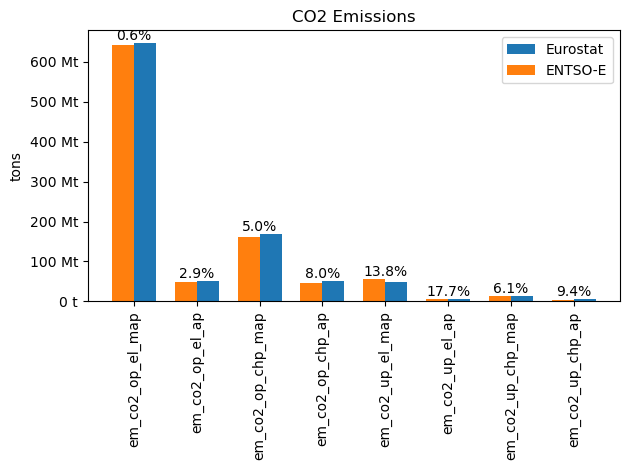

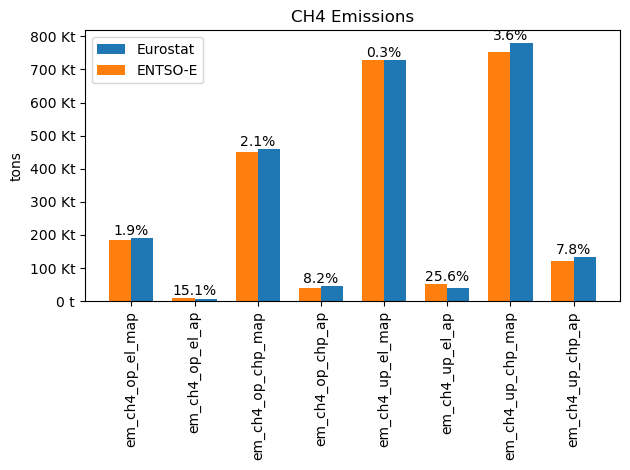

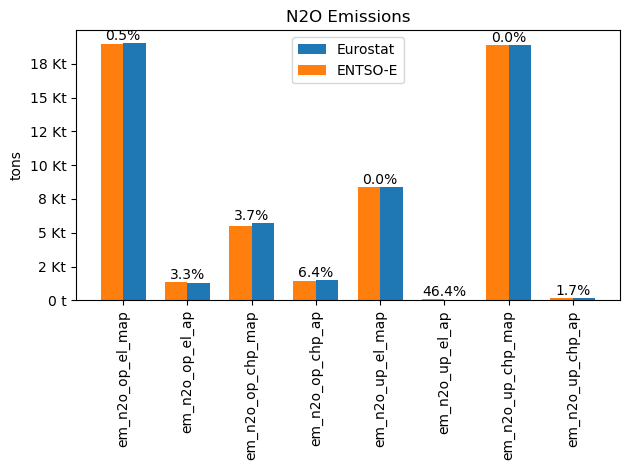

In [162]:
# plot the differences for total emissions before (Eurostat) and after (ENTSO-E) mapping
# since the check revealed that at least the relative differences were in some cases not so small

# First we'll prepare a list of column names for each gas type
co2_cols = [col for col in em_entsoe.columns if 'co2' in col]
ch4_cols = [col for col in em_entsoe.columns if 'ch4' in col]
n2o_cols = [col for col in em_entsoe.columns if 'n2o' in col]

# For each gas type, compute the sum for each column
co2_sum_entsoe = em_entsoe[co2_cols].sum()
ch4_sum_entsoe = em_entsoe[ch4_cols].sum()
n2o_sum_entsoe = em_entsoe[n2o_cols].sum()

co2_sum_eurostat = em_eurostat[co2_cols].sum()
ch4_sum_eurostat = em_eurostat[ch4_cols].sum()
n2o_sum_eurostat = em_eurostat[n2o_cols].sum()

# Define custom formatter
def eng_format(x, pos):
    # find the appropriate prefix and level
    prefixes = ['','K','M','G']
    level = 0
    while x >= 1000:
        x /= 1000
        level += 1
    return f'{x:.0f} {prefixes[level]}t'

eng_formatter = ticker.FuncFormatter(eng_format)

# Define a function to plot grouped bar plots
def plot_grouped_bars(data1, data2, title, filename):
    labels = data2.index
    eurostat_means = data1.values
    entsoe_means = data2.values

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x + width/2, eurostat_means, width, label='Eurostat')
    rects2 = ax.bar(x - width/2, entsoe_means, width, label='ENTSO-E')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('tons')
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=90)
    ax.legend()

    # Apply the custom formatter to the y-axis
    ax.yaxis.set_major_formatter(eng_formatter)

    # Add the relative difference as text
    for i in range(len(eurostat_means)):
        diff = abs(((entsoe_means[i] - eurostat_means[i]) / eurostat_means[i]) * 100)
        ax.text(x[i], max(eurostat_means[i], entsoe_means[i]), f'{diff:.1f}%', ha='center', va='bottom')

    plt.tight_layout()
    
    # Save plot
    plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', filename + '.png')
    #plt.savefig(plot_path)

    plt.show()

# Create the plots
plot_grouped_bars(co2_sum_eurostat, co2_sum_entsoe, 'CO2 Emissions', 'total_emissions_diff_entsoe_eurostat_CO2')
plot_grouped_bars(ch4_sum_eurostat, ch4_sum_entsoe, 'CH4 Emissions', 'total_emissions_diff_entsoe_eurostat_CH4')
plot_grouped_bars(n2o_sum_eurostat, n2o_sum_entsoe, 'N2O Emissions', 'total_emissions_diff_entsoe_eurostat_N2O')

## Characterization factors (CF)

### Import

In [163]:
# Specify the filename
filename = filename = "../1_data/1_raw/IPCC/cf.xlsx"

# Read the excel file
df_cf = pd.read_excel(filename, nrows=3)

df_cf

,Substance,GWP20,GWP100
0,co2,1.0,1.0
1,ch4,81.2,27.9
2,n2o,273.0,273.0


### Save

In [164]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'cf.pkl')

# Save the dataframe to a pickle file
df_cf.to_pickle(pickle_path)

# Calculate EF

## Impact metric
Here, we calculate the emission factor per production type and impact metric.

### Import

In [219]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'cf.pkl')

# Load the pickle file into a DataFrame
df = pd.read_pickle(pickle_path)
cf = pd.read_pickle(pickle_path2)

### Calculate

In [220]:
# Convert cf dataframe to a dictionary for easier access
cf_dict = cf.set_index('Substance')[['GWP20', 'GWP100']].to_dict()

# Define the lists for the placeholders
sysbounds = ['op', 'up']
outputs = ['el', 'chp']
gridcons = ['ap', 'map']

# Loop over the combinations of the placeholders
for sysbound in sysbounds:
    for output in outputs:
        for gridcon in gridcons:
            # Calculate ef_pe_gwp100_{sysbound}_{output}_{gridcon}
            df[f'ef_pe_gwp100_{sysbound}_{output}_{gridcon}'] = (
                cf_dict['GWP100']['co2'] * df[f'ef_pe_co2_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP100']['ch4'] * df[f'ef_pe_ch4_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP100']['n2o'] * df[f'ef_pe_n2o_{sysbound}_{output}_{gridcon}']
            )

            # Calculate ef_pe_gwp20_{sysbound}_{output}_{gridcon}
            df[f'ef_pe_gwp20_{sysbound}_{output}_{gridcon}'] = (
                cf_dict['GWP20']['co2'] * df[f'ef_pe_co2_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP20']['ch4'] * df[f'ef_pe_ch4_{sysbound}_{output}_{gridcon}'] +
                cf_dict['GWP20']['n2o'] * df[f'ef_pe_n2o_{sysbound}_{output}_{gridcon}']
            )

            
# Drop ch4 and n2o columns - not needed anymore
columns_to_drop = [col for col in df.columns if 'ch4' in col or 'n2o' in col]
df = df.drop(columns=columns_to_drop)

# Display the updated dataframe
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_co2_up_el_ap,ef_pe_co2_up_el_map,ef_pe_co2_up_chp_ap,ef_pe_co2_up_chp_map,...,ef_pe_gwp100_op_chp_map,ef_pe_gwp20_op_chp_map,ef_pe_gwp100_up_el_ap,ef_pe_gwp20_up_el_ap,ef_pe_gwp100_up_el_map,ef_pe_gwp20_up_el_map,ef_pe_gwp100_up_chp_ap,ef_pe_gwp20_up_chp_ap,ef_pe_gwp100_up_chp_map,ef_pe_gwp20_up_chp_map
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,16.738,16.738000,16.738,16.738000,...,338.433600,338.646800,42.4558,91.0654,42.455800,91.06540,42.4558,91.0654,42.455800,91.065400
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,10.416,10.714943,10.416,12.104916,...,381.342908,381.477986,10.6113,10.9844,12.117103,14.77112,10.6113,10.9844,19.118525,32.377955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,2.531,2.531000,0.000,0.000000,...,0.000000,0.000000,2.6426,2.8558,2.642600,2.85580,0.0000,0.0000,0.000000,0.000000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,6.543,6.543000,0.000,0.000000,...,0.000000,0.000000,14.8293,30.6594,14.829300,30.65940,0.0000,0.0000,0.000000,0.000000


### Save

In [221]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp.pkl')

# Save the dataframe to a pickle file
df.to_pickle(pickle_path)

### Plot

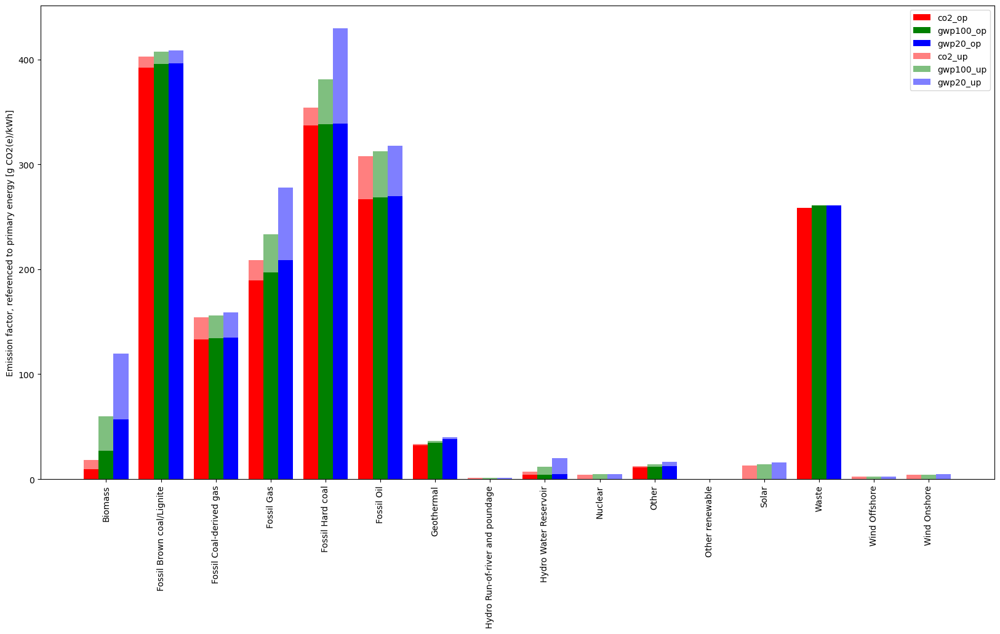

In [222]:
# visualize the results - compare CO2, GWP100 and GWP20 emission factors
# note: values are averaged across years for operational (op) and upstream (up) emission factors

# Group the data by Production Type and calculate the average of the columns
df_grouped = df.groupby("Production Type").mean()

# Initialize two empty dataframes
df_plot_op = pd.DataFrame()
df_plot_up = pd.DataFrame()

# define categories
categories = ['co2', 'gwp100', 'gwp20']

# Iterate over the categories
for cat in categories:
    # Get all columns that contain the category and _op
    cols_op = [col for col in df_grouped.columns if (cat in col) and ('_op' in col)]
    
    # Get all columns that contain the category and _up
    cols_up = [col for col in df_grouped.columns if (cat in col) and ('_up' in col)]
    
    # Calculate the average of the columns and assign it to df_plot_op
    df_plot_op[cat] = df_grouped[cols_op].mean(axis=1)
    
    # Calculate the average of the columns and assign it to df_plot_up
    df_plot_up[cat] = df_grouped[cols_up].mean(axis=1)

# Transpose the dataframes
df_plot_op = df_plot_op.T
df_plot_up = df_plot_up.T

# Get the number of production types
N = len(df_plot_op.columns)

# The x locations for the groups
ind = np.arange(N)

# The width of the bars
width = 0.27

fig, ax = plt.subplots(figsize=(20,10))

# Add some text for labels, title, and axes ticks
ax.set_ylabel('Emission factor, referenced to primary energy [g CO2(e)/kWh]')
ax.set_xticks(ind+width)
ax.set_xticklabels(df_plot_op.columns, rotation='vertical')

# Plot the data for _op
rects1_op = ax.bar(ind, df_plot_op.iloc[0], width, color='r')
rects2_op = ax.bar(ind+width, df_plot_op.iloc[1], width, color='g')
rects3_op = ax.bar(ind+width*2, df_plot_op.iloc[2], width, color='b')

# Plot the data for _up, stacked on top of the _op data
rects1_up = ax.bar(ind, df_plot_up.iloc[0], width, bottom=df_plot_op.iloc[0], color='r', alpha=0.5)
rects2_up = ax.bar(ind+width, df_plot_up.iloc[1], width, bottom=df_plot_op.iloc[1], color='g', alpha=0.5)
rects3_up = ax.bar(ind+width*2, df_plot_up.iloc[2], width, bottom=df_plot_op.iloc[2], color='b', alpha=0.5)

# Add a legend
ax.legend((rects1_op[0], rects2_op[0], rects3_op[0], rects1_up[0], rects2_up[0], rects3_up[0]), 
           [cat + '_op' for cat in df_plot_op.index] + [cat + '_up' for cat in df_plot_up.index])

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_pe_co2_gwp100_gwp20' + '.png')
#plt.savefig(plot_path)

plt.show()

## System boundaries
Here, we expand the previous dataframe with emission factors to calculate emission factors for the whole life cycle (LC), from operational (op) and upstream (up) emission factors.

### Import

In [223]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp.pkl')

# Load the pickle file into a DataFrame
df = pd.read_pickle(pickle_path)

### Calculate

In [224]:
# Single step: calculate lc-ef from op-ef and up-ef (lc = op + up)

# Find all the unique prefixes in the columns
prefixes = set()
for col in df.columns:
    match = re.match(r'(ef_pe_\w+)_op_\w+', col)
    if match:
        prefixes.add(match.group(1))

# For each prefix, create a new column in the dataframe that is the sum of the _op and _up columns
for prefix in prefixes:
    for suffix in ['el_map', 'chp_map', 'el_ap', 'chp_ap']:
        op_column = f'{prefix}_op_{suffix}'
        up_column = f'{prefix}_up_{suffix}'
        lc_column = f'{prefix}_lc_{suffix}'
        if op_column in df.columns and up_column in df.columns:
            df[lc_column] = df[op_column] + df[up_column]

# Drop the upstream emission columns - not needed anymore
columns_to_drop = df.columns[df.columns.str.contains('_up')]
df = df.drop(columns_to_drop, axis=1)
           

# show result
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_gwp100_op_el_ap,ef_pe_gwp20_op_el_ap,ef_pe_gwp100_op_el_map,ef_pe_gwp20_op_el_map,...,ef_pe_co2_lc_el_ap,ef_pe_co2_lc_chp_ap,ef_pe_gwp20_lc_el_map,ef_pe_gwp20_lc_chp_map,ef_pe_gwp20_lc_el_ap,ef_pe_gwp20_lc_chp_ap,ef_pe_gwp100_lc_el_map,ef_pe_gwp100_lc_chp_map,ef_pe_gwp100_lc_el_ap,ef_pe_gwp100_lc_chp_ap
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,396.9848,397.0914,394.21614,394.327781,...,403.796,403.796,409.098902,413.855942,408.0758,408.0758,406.333244,400.461433,407.5961,407.5961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,0.0000,0.0000,0.00000,0.000000,...,2.531,0.000,2.855800,0.000000,2.8558,0.0000,2.642600,0.000000,2.6426,0.0000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000


### Check
We want to quickly check that the life cycle emission factors are indeed the sum of the operational and the upstream emission factor, as intended.

In [225]:
# Extract column names
column_names = df.columns

# Initialize an empty DataFrame for storing the results
comparison_df = pd.DataFrame()

# Iterate over each type (co2, ch4, n2o, gwp100, gwp20)
for t in ["co2", "gwp100", "gwp20"]:
    # Iterate over each process type (el, chp)
    for p in ["el", "chp"]:
        # Define column names for op, up, lc
        op_col_map = f'ef_pe_{t}_op_{p}_map'
        up_col_map = f'ef_pe_{t}_up_{p}_map'
        lc_col_map = f'ef_pe_{t}_lc_{p}_map'
        
        op_col_ap = f'ef_pe_{t}_op_{p}_ap'
        up_col_ap = f'ef_pe_{t}_up_{p}_ap'
        lc_col_ap = f'ef_pe_{t}_lc_{p}_ap'

        # Perform the check for both map and ap columns, if they exist in the df
        if op_col_map in column_names and up_col_map in column_names and lc_col_map in column_names:
            comparison_df[f'{t}_{p}_map_check'] = np.isclose(df[op_col_map] + df[up_col_map], df[lc_col_map], equal_nan=True)
        if op_col_ap in column_names and up_col_ap in column_names and lc_col_ap in column_names:
            comparison_df[f'{t}_{p}_ap_check'] = np.isclose(df[op_col_ap] + df[up_col_ap], df[lc_col_ap], equal_nan=True)

# Check if all values in the comparison DataFrame are True
result = comparison_df.all().all()

print("Are all lc columns the sum of the corresponding op and up columns?: ", result)

Are all lc columns the sum of the corresponding op and up columns?:  True


### Save

In [226]:
# Drop the upstream emission columns - not needed anymore
columns_to_drop = df.columns[df.columns.str.contains('_up')]
df = df.drop(columns_to_drop, axis=1)
df # unit: g/kWh

,Year,Production Type,ef_pe_co2_op_el_ap,ef_pe_co2_op_el_map,ef_pe_co2_op_chp_ap,ef_pe_co2_op_chp_map,ef_pe_gwp100_op_el_ap,ef_pe_gwp20_op_el_ap,ef_pe_gwp100_op_el_map,ef_pe_gwp20_op_el_map,...,ef_pe_co2_lc_el_ap,ef_pe_co2_lc_chp_ap,ef_pe_gwp20_lc_el_map,ef_pe_gwp20_lc_chp_map,ef_pe_gwp20_lc_el_ap,ef_pe_gwp20_lc_chp_ap,ef_pe_gwp100_lc_el_map,ef_pe_gwp100_lc_chp_map,ef_pe_gwp100_lc_el_ap,ef_pe_gwp100_lc_chp_ap
0,2018,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
1,2019,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
2,2020,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
3,2021,Fossil Hard coal,337.230,337.230000,337.23,337.230000,338.4336,338.6468,338.43360,338.646800,...,353.968,353.968,429.712200,429.712200,429.7122,429.7122,380.889400,380.889400,380.8894,380.8894
4,2018,Fossil Brown coal/Lignite,393.380,390.724884,393.38,378.379586,396.9848,397.0914,394.21614,394.327781,...,403.796,403.796,409.098902,413.855942,408.0758,408.0758,406.333244,400.461433,407.5961,407.5961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,2021,Hydro Run-of-river and poundage,0.000,0.000000,0.00,0.000000,0.0000,0.0000,0.00000,0.000000,...,2.531,0.000,2.855800,0.000000,2.8558,0.0000,2.642600,0.000000,2.6426,0.0000
60,2018,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000
61,2019,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000
62,2020,Hydro Water Reservoir,8.025,8.025000,0.00,0.000000,8.7723,9.6784,8.77230,9.678400,...,14.568,0.000,40.337800,0.000000,40.3378,0.0000,23.601600,0.000000,23.6016,0.0000


In [227]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp_lc.pkl')

# Save the dataframe to a pickle file
df.to_pickle(pickle_path)

## Co-generation of heat
Here, we want to take into account that the emission factor changes based on the allocation principle in combined heat and power (CHP) plants.

In [70]:
# We calculate the ef for six different allocation principles:
# el100: all emissions are allocated to electricity
# th100: for CHP units, all emissions are allocated to heat, for EL units, all emissions are allocated to electricity
# en: emissions are allocated according to their energy share (Calorific method)
# ex: emissions are allocated to their exergy share (Carnot method)
# iea: substitution method for alternative heat source with efficiency of 0.9 (method used by the IEA)
# uba: substition method for alternative hear source with efficiency of 0.8 and alternative electricity source with efficiency of 0.4 (method used by UBA)

# the resulting emission factors are calculated as follows:
# ef_el100 = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp))
# ef_th100 = (ef_pe_el*pe_el / (gep_el + gep_chp))
# ef_en = (ef_pe_el*pe_el + ef_pe_chp*(gep_chp/(gep_chp + ghp)*pe_chp)) / (gep_el + gep_chp)
# ef_ex = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp + (1 - T_0/T)*ghp))
# ef_iea = (ef_pe_el*pe_el + ef_pe_chp*(pe_chp - ghp/eta_th)) / (gep_el + gep_chp)
# ef_uba = (ef_pe_el*pe_el + ef_pe_chp*pe_chp) / (gep_el + gep_chp + (et_ref_el/eta_ref_th)*ghp))

### Import

In [228]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_pe_entsoe_co2_gwp_lc.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_pe = pd.read_pickle(pickle_path)
pe_gep_nep = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef_pe = ef_pe.replace(np.nan, 0.0)
pe_gep_nep = pe_gep_nep.replace(np.nan, 0.0)

# change data type
ef_pe['Year'] = ef_pe['Year'].astype('i4')
pe_gep_nep['Year'] = pe_gep_nep['Year'].astype('i4')

### Calculate

In [229]:
# step 1: calculate ef for the allocation method "el100"

# ef_el100 = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp))

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_el100 = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_el100'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep[['Year', 'Production Type', pe_el_col, pe_chp_col, gep_el_col, gep_chp_col]],
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_el100[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]) / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_el100[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_el100 = ef_gep_el100.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_el100 # unit: g/kWh

,ef_gep_co2_op_map_el100,Year,Production Type,ef_gep_co2_op_ap_el100,ef_gep_co2_lc_map_el100,ef_gep_co2_lc_ap_el100,ef_gep_gwp100_op_map_el100,ef_gep_gwp100_op_ap_el100,ef_gep_gwp100_lc_map_el100,ef_gep_gwp100_lc_ap_el100,ef_gep_gwp20_op_map_el100,ef_gep_gwp20_op_ap_el100,ef_gep_gwp20_lc_map_el100,ef_gep_gwp20_lc_ap_el100
0,848.435220,2018,Fossil Hard coal,825.361919,890.546268,866.327751,851.463351,828.307699,958.277680,932.217199,851.999740,828.829501,1081.110711,1051.709770
1,893.036876,2019,Fossil Hard coal,826.133964,937.361673,867.138116,896.224194,829.082500,1008.653679,933.089196,896.788781,829.604789,1137.943958,1052.693541
2,908.278335,2020,Fossil Hard coal,813.837276,953.359624,854.231098,911.520051,816.741925,1025.868369,919.200522,912.094273,817.256440,1157.365246,1037.024602
3,873.328118,2021,Fossil Hard coal,826.223493,916.674694,867.232089,876.445094,829.172349,986.393330,933.190317,876.997220,829.694695,1112.830255,1052.807624
4,1000.891702,2018,Fossil Brown coal/Lignite,1017.513951,1028.550917,1044.455904,1009.783897,1026.838102,1041.727018,1054.285216,1010.073179,1027.113833,1050.122951,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [230]:
# step 2: calculate ef for the allocation method "th100"

# ef_th100 = (ef_pe_el*pe_el / (gep_el + gep_chp))

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_th100 = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_th100'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            #ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            #pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep[['Year', 'Production Type', pe_el_col, gep_el_col, gep_chp_col]],
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_th100[new_col] = merged_df[ef_el_col]*merged_df[pe_el_col] / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_th100[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_th100 = ef_gep_th100.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_th100 # unit: g/kWh

,ef_gep_co2_op_map_th100,Year,Production Type,ef_gep_co2_op_ap_th100,ef_gep_co2_lc_map_th100,ef_gep_co2_lc_ap_th100,ef_gep_gwp100_op_map_th100,ef_gep_gwp100_op_ap_th100,ef_gep_gwp100_lc_map_th100,ef_gep_gwp100_lc_ap_th100,ef_gep_gwp20_op_map_th100,ef_gep_gwp20_op_ap_th100,ef_gep_gwp20_lc_map_th100,ef_gep_gwp20_lc_ap_th100
0,661.272361,2018,Fossil Hard coal,510.344636,694.093809,535.674969,663.632494,512.166095,746.883827,576.416280,664.050556,512.488740,842.620174,650.301919
1,655.941937,2019,Fossil Hard coal,542.044601,688.498815,568.948324,658.283045,543.979200,740.863300,612.220273,658.697737,544.321886,835.827930,690.695305
2,653.442734,2020,Fossil Hard coal,566.191202,685.875567,594.293413,655.774921,568.211983,738.040538,639.493009,656.188034,568.569934,832.643343,721.463889
3,655.277923,2021,Fossil Hard coal,577.930639,687.801844,606.615522,657.616661,579.993319,740.113320,652.752289,658.030934,580.358692,834.981817,736.422757
4,954.589379,2018,Fossil Brown coal/Lignite,683.466222,980.767314,701.563187,963.118952,689.729273,992.722539,708.165557,963.391704,689.914482,999.479384,708.998997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [231]:
# step 3: calculate ef for the allocation method "en"

# ef_en = (ef_pe_el*pe_el + ef_pe_chp*(gep_chp/(gep_chp + ghp)*pe_chp)) / (gep_el + gep_chp)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_en = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_en'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_en[new_col] = np.where((merged_df[gep_chp_col] == 0) & (merged_df[ghp_chp_col] == 0),
                                              merged_df[ef_el_col]*merged_df[pe_el_col] / merged_df[gep_el_col],
                                              (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]*(merged_df[gep_chp_col]/(merged_df[gep_chp_col] + merged_df[ghp_chp_col])))/ (merged_df[gep_el_col] + merged_df[gep_chp_col]))
                ef_gep_en[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_en = ef_gep_en.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_en # unit: g/kWh

,ef_gep_co2_op_map_en,Year,Production Type,ef_gep_co2_op_ap_en,ef_gep_co2_lc_map_en,ef_gep_co2_lc_ap_en,ef_gep_gwp100_op_map_en,ef_gep_gwp100_op_ap_en,ef_gep_gwp100_lc_map_en,ef_gep_gwp100_lc_ap_en,ef_gep_gwp20_op_map_en,ef_gep_gwp20_op_ap_en,ef_gep_gwp20_lc_map_en,ef_gep_gwp20_lc_ap_en
0,716.497814,2018,Fossil Hard coal,825.361919,752.060309,866.327751,719.055050,828.307699,809.259029,932.217199,719.508027,828.829501,912.990694,1051.709770
1,725.311052,2019,Fossil Hard coal,826.133964,761.310982,867.138116,727.899743,829.082500,819.213271,933.089196,728.358292,829.604789,924.220881,1052.693541
2,734.287490,2020,Fossil Hard coal,813.837276,770.732955,854.231098,736.908219,816.741925,829.351842,919.200522,737.372443,817.256440,935.659025,1037.024602
3,723.538022,2021,Fossil Hard coal,826.223493,759.449950,867.232089,726.120385,829.172349,817.210696,933.190317,726.577813,829.694695,921.961614,1052.807624
4,969.042754,2018,Fossil Brown coal/Lignite,1017.513951,995.683074,1044.455904,977.685521,1026.838102,1008.019398,1054.285216,977.963432,1027.113833,1015.287889,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [232]:
# step 4: calculate ef for the allocation method "ex"

# ef_ex = (ef_pe_el*pe_el + ef_pe_chp*pe_chp / (gep_el + gep_chp + (1 - T_0/T)*ghp))

# assumptions: T_0 = 282 K (9°C), T = 363 K (90°C)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_ex = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_ex'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_ex[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col])/ (merged_df[gep_el_col] + merged_df[gep_chp_col] + (1 - (282/363))*merged_df[ghp_chp_col])
                ef_gep_ex[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_ex = ef_gep_ex.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_ex # unit: g/kWh

,ef_gep_co2_op_map_ex,Year,Production Type,ef_gep_co2_op_ap_ex,ef_gep_co2_lc_map_ex,ef_gep_co2_lc_ap_ex,ef_gep_gwp100_op_map_ex,ef_gep_gwp100_op_ap_ex,ef_gep_gwp100_lc_map_ex,ef_gep_gwp100_lc_ap_ex,ef_gep_gwp20_op_map_ex,ef_gep_gwp20_op_ap_ex,ef_gep_gwp20_lc_map_ex,ef_gep_gwp20_lc_ap_ex
0,790.077619,2018,Fossil Hard coal,825.361919,829.292159,866.327751,792.897467,828.307699,892.364826,932.217199,793.396962,828.829501,1006.749079,1051.709770
1,816.382673,2019,Fossil Hard coal,826.133964,856.902832,867.138116,819.296406,829.082500,922.075458,933.089196,819.812531,829.604789,1040.268050,1052.693541
2,828.812152,2020,Fossil Hard coal,813.837276,869.949233,854.231098,831.770247,816.741925,936.114116,919.200522,832.294230,817.256440,1056.106199,1037.024602
3,806.618358,2021,Fossil Hard coal,826.223493,846.653877,867.232089,809.497241,829.172349,911.047007,933.190317,810.007193,829.694695,1027.825962,1052.807624
4,985.264928,2018,Fossil Brown coal/Lignite,1017.513951,1012.492303,1044.455904,994.018290,1026.838102,1025.462688,1054.285216,994.303055,1027.113833,1033.727536,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [233]:
# step 5: calculate ef for the allocation method "iea"

# ef_iea = (ef_pe_el*pe_el + ef_pe_chp*(pe_chp - ghp/eta_th)) / (gep_el + gep_chp)

# assumptions: eta_th = 0.9 (prescribed by IEA)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_iea = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_iea'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_iea[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*(merged_df[pe_chp_col] - (merged_df[ghp_chp_col] / 0.9))) / (merged_df[gep_el_col] + merged_df[gep_chp_col])
                ef_gep_iea[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_iea = ef_gep_iea.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_iea # unit: g/kWh

,ef_gep_co2_op_map_iea,Year,Production Type,ef_gep_co2_op_ap_iea,ef_gep_co2_lc_map_iea,ef_gep_co2_lc_ap_iea,ef_gep_gwp100_op_map_iea,ef_gep_gwp100_op_ap_iea,ef_gep_gwp100_lc_map_iea,ef_gep_gwp100_lc_ap_iea,ef_gep_gwp20_op_map_iea,ef_gep_gwp20_op_ap_iea,ef_gep_gwp20_lc_map_iea,ef_gep_gwp20_lc_ap_iea
0,724.403442,2018,Fossil Hard coal,825.361919,760.358324,866.327751,726.988894,828.307699,818.188157,932.217199,727.446868,828.829501,923.064367,1051.709770
1,735.367448,2019,Fossil Hard coal,826.133964,771.866515,867.138116,737.992031,829.082500,830.571616,933.089196,738.456937,829.604789,937.035150,1052.693541
2,747.276235,2020,Fossil Hard coal,813.837276,784.366380,854.231098,749.943322,816.741925,844.022171,919.200522,750.415757,817.256440,952.209812,1037.024602
3,734.452317,2021,Fossil Hard coal,826.223493,770.905962,867.232089,737.073634,829.172349,829.538007,933.190317,737.537962,829.694695,935.869053,1052.807624
4,971.008777,2018,Fossil Brown coal/Lignite,1017.513951,997.711992,1044.455904,979.666940,1026.838102,1010.100155,1054.285216,979.945554,1027.113833,1017.438242,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [234]:
# step 6: calculate ef for the allocation method "uba"

# ef_uba = (ef_pe_el*pe_el + ef_pe_chp*pe_chp) / (gep_el + gep_chp + (eta_ref_el/eta_ref_th)*ghp))

# assumptions: eta_ref_el = 0.4, eta_ref_th = 0.8 (prescribed by UBA)

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']

# Create a new DataFrame to store the results
ef_gep_uba = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the new column name
            new_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_uba'

            # Calculate the column names in the input DataFrames
            ef_el_col = f'ef_pe_{metric}_{sysbound}_el_{gridcon}'
            ef_chp_col = f'ef_pe_{metric}_{sysbound}_chp_{gridcon}'
            pe_el_col = f'pe_el_{gridcon}'
            pe_chp_col = f'pe_chp_{gridcon}'
            gep_el_col = f'gep_el_{gridcon}'
            gep_chp_col = f'gep_chp_{gridcon}'
            ghp_chp_col = f'ghp_chp_{gridcon}'

            # Check if columns exist in their respective dataframes before calculation
            if ef_el_col in ef_pe.columns \
            and ef_chp_col in ef_pe.columns \
            and pe_el_col in pe_gep_nep.columns \
            and pe_chp_col in pe_gep_nep.columns \
            and gep_el_col in pe_gep_nep.columns \
            and gep_chp_col in pe_gep_nep.columns \
            and ghp_chp_col in pe_gep_nep.columns:
                # Merge dataframes
                merged_df = pd.merge(ef_pe,
                                     pe_gep_nep,
                                     on=['Year', 'Production Type'])

                # Calculate the new column in the result DataFrame
                ef_gep_uba[new_col] = (merged_df[ef_el_col]*merged_df[pe_el_col] + merged_df[ef_chp_col]*merged_df[pe_chp_col]) / (merged_df[gep_el_col] + merged_df[gep_chp_col] + (0.4 / 0.8)*merged_df[ghp_chp_col])
                ef_gep_uba[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_uba = ef_gep_uba.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_uba # unit: g/kWh

,ef_gep_co2_op_map_uba,Year,Production Type,ef_gep_co2_op_ap_uba,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,727.953081,2018,Fossil Hard coal,825.361919,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,737.806626,2019,Fossil Hard coal,826.133964,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,747.651817,2020,Fossil Hard coal,813.837276,784.760603,854.231098,750.320244,816.741925,844.446378,919.200522,750.792917,817.256440,952.688394,1037.024602
3,736.789284,2021,Fossil Hard coal,826.223493,773.358922,867.232089,739.418942,829.172349,832.177530,933.190317,739.884747,829.694695,938.846912,1052.807624
4,966.541566,2018,Fossil Brown coal/Lignite,1017.513951,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


In [235]:
# step 7: combine all dataframes
ef_gep_all = pd.merge(ef_gep_el100, ef_gep_th100, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_en, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_ex, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_iea, on=['Year', 'Production Type'])
ef_gep_all = pd.merge(ef_gep_all, ef_gep_uba, on=['Year', 'Production Type'])

# show result
ef_gep_all # unit: g/kWh

,ef_gep_co2_op_map_el100,Year,Production Type,ef_gep_co2_op_ap_el100,ef_gep_co2_lc_map_el100,ef_gep_co2_lc_ap_el100,ef_gep_gwp100_op_map_el100,ef_gep_gwp100_op_ap_el100,ef_gep_gwp100_lc_map_el100,ef_gep_gwp100_lc_ap_el100,...,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,848.435220,2018,Fossil Hard coal,825.361919,890.546268,866.327751,851.463351,828.307699,958.277680,932.217199,...,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,893.036876,2019,Fossil Hard coal,826.133964,937.361673,867.138116,896.224194,829.082500,1008.653679,933.089196,...,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,908.278335,2020,Fossil Hard coal,813.837276,953.359624,854.231098,911.520051,816.741925,1025.868369,919.200522,...,784.760603,854.231098,750.320244,816.741925,844.446378,919.200522,750.792917,817.256440,952.688394,1037.024602
3,873.328118,2021,Fossil Hard coal,826.223493,916.674694,867.232089,876.445094,829.172349,986.393330,933.190317,...,773.358922,867.232089,739.418942,829.172349,832.177530,933.190317,739.884747,829.694695,938.846912,1052.807624
4,1000.891702,2018,Fossil Brown coal/Lignite,1017.513951,1028.550917,1044.455904,1009.783897,1026.838102,1041.727018,1054.285216,...,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,...,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.925605,2018,Hydro Water Reservoir,8.025000,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,...,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.923264,2019,Hydro Water Reservoir,8.025000,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,...,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.905520,2020,Hydro Water Reservoir,7.552639,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,...,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


### Check

In [236]:
# We expect the results for all "real" allocation methods to be in between the extremes, el100 and th100

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
methods = ['en', 'ex', 'iea', 'uba']

# Define the error term
error = 0.01

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_all.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the base column name
            base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}'

            # Calculate the column names for el100 and th100
            el100_col = f'{base_col}_el100'
            th100_col = f'{base_col}_th100'

            # Loop over all methods
            for method in methods:
                # Calculate the column name for the current method
                method_col = f'{base_col}_{method}'

                # Check if columns exist before comparison
                if el100_col in grouped_means.columns and th100_col in grouped_means.columns and method_col in grouped_means.columns:
                    # Check if the values in the method column are between the values in the el100 and th100 columns, allowing for a small error
                    check = grouped_means[method_col].between(grouped_means[th100_col] - error, grouped_means[el100_col] + error)

                    # Print the results
                    if check.all():
                        print(f"All values in {method_col} for each 'Production Type' are within the range of {th100_col} and {el100_col}, considering an error of {error}")
                    else:
                        print(f"NOT all values in {method_col} for each 'Production Type' are within the range of {th100_col} and {el100_col}, considering an error of {error}")


All values in ef_gep_co2_op_map_en for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_ex for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_iea for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_map_uba for each 'Production Type' are within the range of ef_gep_co2_op_map_th100 and ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_gep_co2_op_ap_en for each 'Production Type' are within the range of ef_gep_co2_op_ap_th100 and ef_gep_co2_op_ap_el100, considering an error of 0.01
All values in ef_gep_co2_op_ap_ex for each 'Production Type' are within the range of ef_gep_co2_op_ap_th100 and ef_gep_co2_op_ap_el100, considering an error of 0

### Save

In [237]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_gep_metric_sysbound_gridcon_allocation.pkl')

# Save the dataframe to a pickle file
ef_gep_all.to_pickle(pickle_path)

### Plot

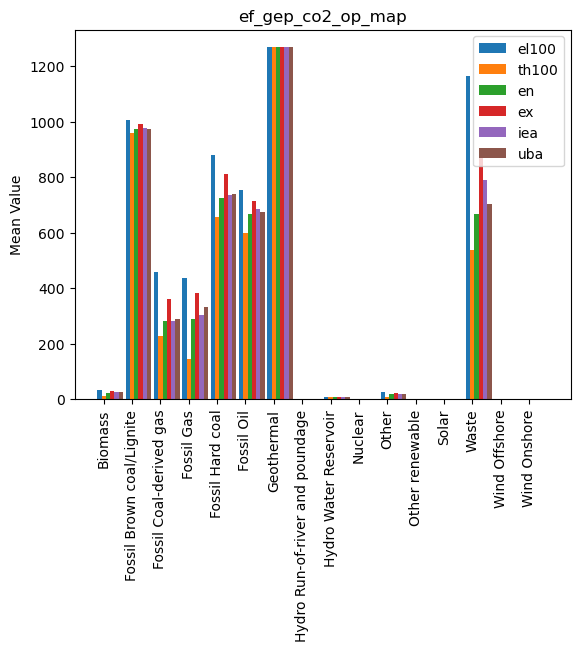

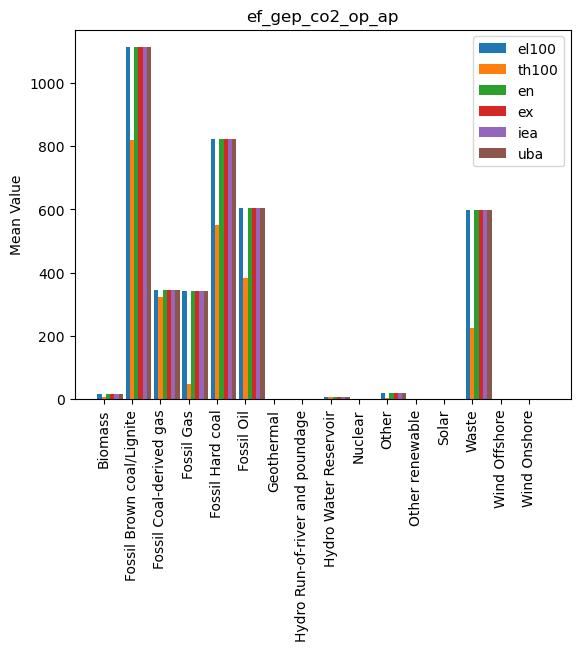

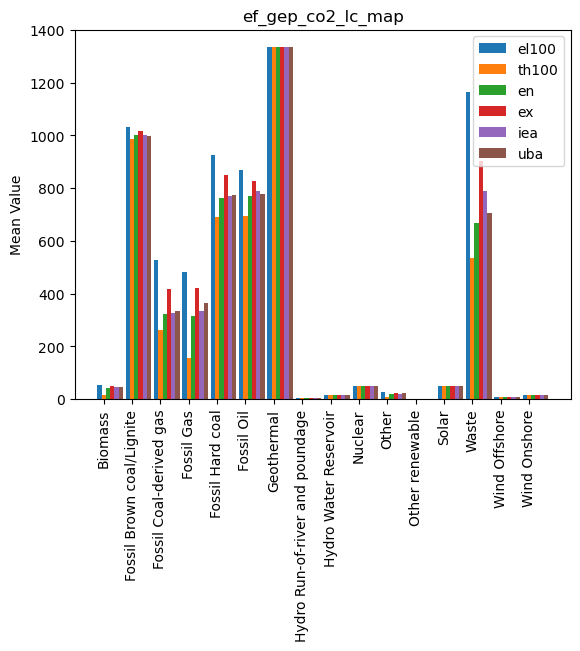

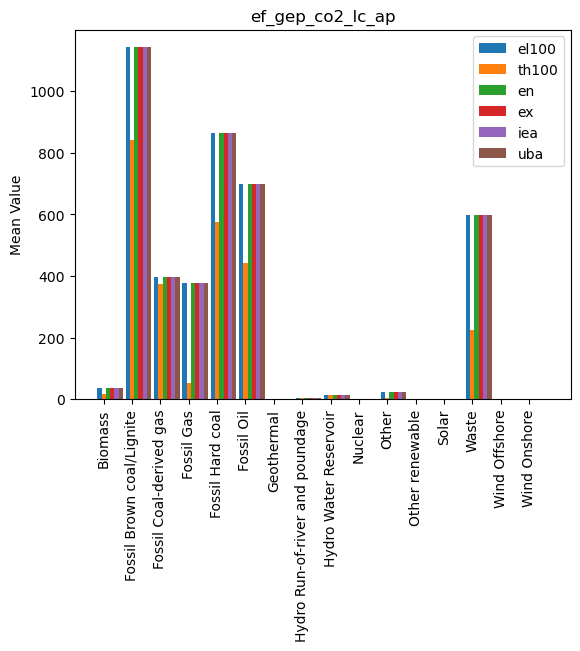

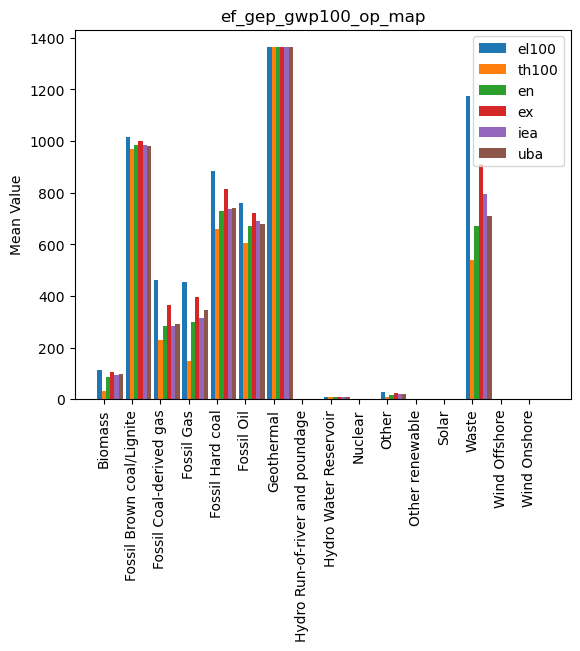

...

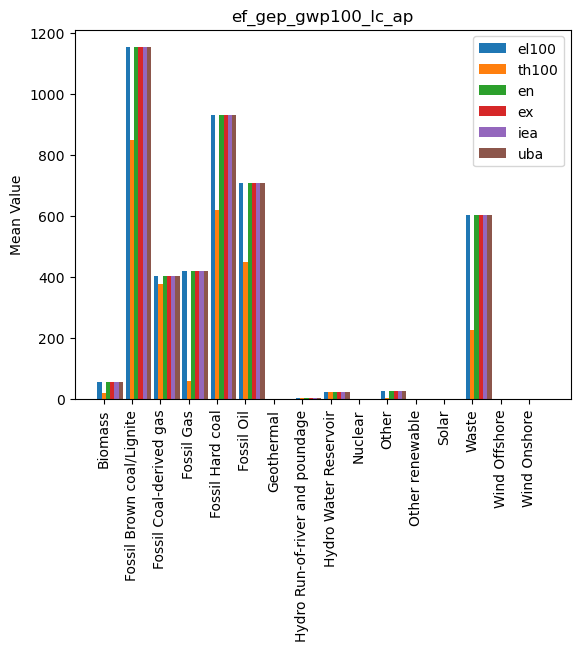

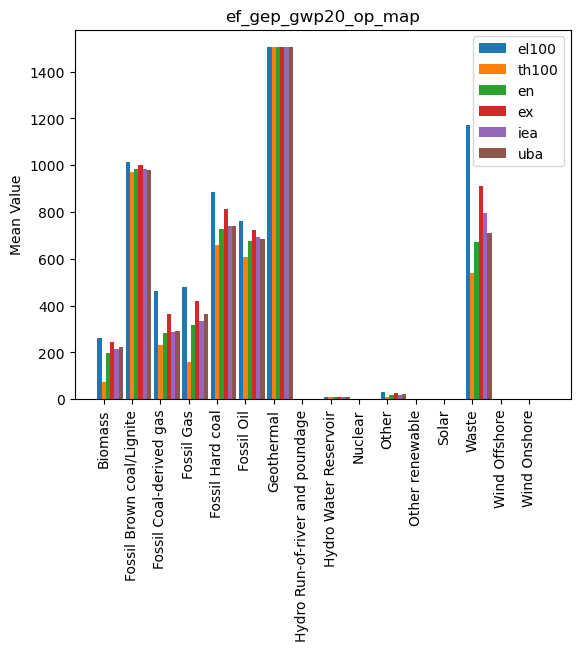

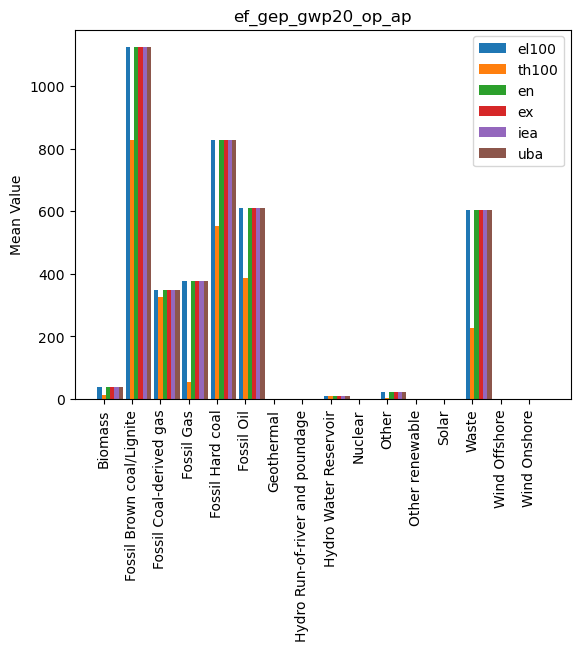

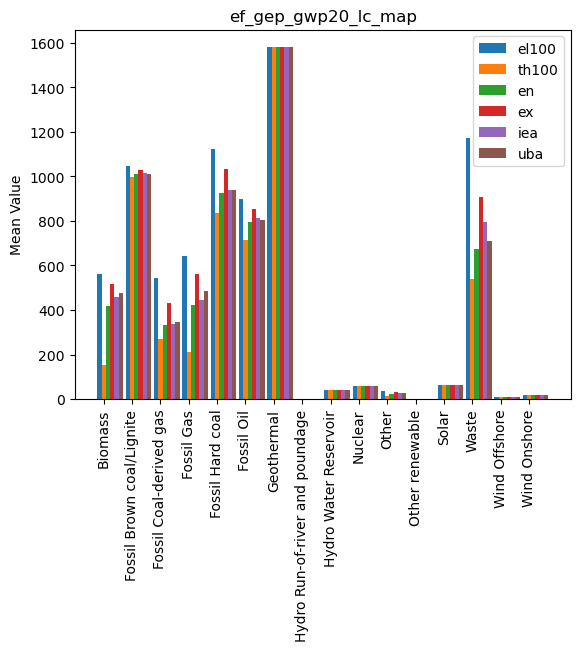

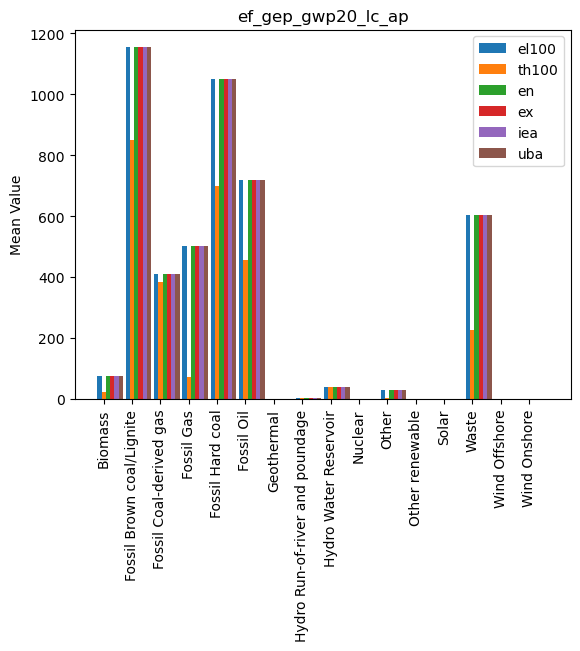

In [81]:
# Visually confirm the results from the check

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
methods = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_all.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            # Calculate the base column name
            base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}'

            # Prepare a list to store the mean values for each method
            mean_values = []

            # Loop over all methods
            for method in methods:
                # Calculate the column name for the current method
                method_col = f'{base_col}_{method}'

                # Check if column exists before getting the mean value
                if method_col in grouped_means.columns:
                    # Get the mean value for the current method and add it to the list
                    mean_values.append(grouped_means[method_col].values)

            # Prepare for the bar chart
            bar_width = 0.15
            r = np.arange(len(grouped_means.index))

            # Create the bar chart
            for i, values in enumerate(mean_values):
                plt.bar(r + i * bar_width, values, width=bar_width, label=methods[i])

            plt.xticks(r + bar_width, grouped_means.index, rotation=90)
            plt.title(f'{base_col}')
            plt.ylabel('Mean Value')
            plt.legend()
            
            # Modify the plot save path to include metric, sysbound, and gridcon
            plot_filename = f'ef_pe_cogen_comp_{metric}_{sysbound}_{gridcon}.png'
            plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', plot_filename)
            #plt.savefig(plot_path)

            plt.show()
            plt.close()  # Close the current plot to free up memory

## Auxiliary consumption
All the EF values calculated above are referenced to gross electricity production (GEP). Now we calculate the EF for net electricity production (NEP), thus effectively taking into account the auxiliary consumption of the power plants.

In [82]:
# ef_nep = gep / nep * ef_gep

### Import

In [238]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_gep_metric_sysbound_gridcon_allocation.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_gep = pd.read_pickle(pickle_path)
pe_gep_nep = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef_gep = ef_gep.replace(np.nan, 0.0)
pe_gep_nep = pe_gep_nep.replace(np.nan, 0.0)

### Calculate

In [239]:
# step 1: calculate ef_nep
# ef_nep = gep / nep * ef_gep

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_gep_nep = pd.DataFrame()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_nep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Calculate the column names in the input DataFrames
                ef_gep_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_{allocation}'
                gep_el_col = f'gep_el_{gridcon}'
                gep_chp_col = f'gep_chp_{gridcon}'
                nep_el_col = f'nep_el_{gridcon}'
                nep_chp_col = f'nep_chp_{gridcon}'

                # Check if columns exist in their respective dataframes before calculation
                if ef_gep_col in ef_gep.columns \
                and gep_el_col in pe_gep_nep.columns \
                and gep_chp_col in pe_gep_nep.columns \
                and nep_el_col in pe_gep_nep.columns \
                and nep_chp_col in pe_gep_nep.columns:
                    # Merge dataframes
                    merged_df = pd.merge(ef_gep,
                                         pe_gep_nep,
                                         on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_gep_nep[new_col] = merged_df[ef_gep_col]*(merged_df[gep_el_col] + merged_df[gep_chp_col]) / (merged_df[nep_el_col] + merged_df[nep_chp_col])
                    ef_gep_nep[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_gep_nep = ef_gep_nep.replace(np.nan, 0.0)

# Show the new DataFrame
ef_gep_nep # unit: g/kWh

,ef_nep_co2_op_map_el100,Year,Production Type,ef_nep_co2_op_map_th100,ef_nep_co2_op_map_en,ef_nep_co2_op_map_ex,ef_nep_co2_op_map_iea,ef_nep_co2_op_map_uba,ef_nep_co2_op_ap_el100,ef_nep_co2_op_ap_th100,...,ef_nep_gwp20_lc_map_en,ef_nep_gwp20_lc_map_ex,ef_nep_gwp20_lc_map_iea,ef_nep_gwp20_lc_map_uba,ef_nep_gwp20_lc_ap_el100,ef_nep_gwp20_lc_ap_th100,ef_nep_gwp20_lc_ap_en,ef_nep_gwp20_lc_ap_ex,ef_nep_gwp20_lc_ap_iea,ef_nep_gwp20_lc_ap_uba
0,914.086261,2018,Fossil Hard coal,712.440933,771.939674,851.213009,780.457032,784.281338,871.438359,538.835003,...,983.636971,1084.650283,994.490134,999.363222,1110.422247,686.605505,1110.422247,1110.422247,1110.422247,1110.422247
1,960.893077,2019,Fossil Hard coal,705.782799,780.422833,878.414408,791.243350,793.867866,878.910195,576.672243,...,994.446557,1119.311413,1008.234501,1011.578766,1119.943165,734.819258,1119.943165,1119.943165,1119.943165,1119.943165
2,974.671990,2020,Fossil Hard coal,701.208324,787.962700,889.396959,801.900900,802.303936,861.054302,599.040354,...,1004.054162,1133.305827,1021.814785,1022.328350,1097.190459,763.321616,1097.190459,1097.190459,1097.190459,1097.190459
3,939.592537,2021,Fossil Hard coal,704.997622,778.437006,867.821124,790.179432,792.693718,869.604470,608.274966,...,991.916136,1105.813019,1006.878812,1010.082619,1108.085431,775.088734,1108.085431,1108.085431,1108.085431,1108.085431
4,1081.114762,2018,Fossil Brown coal/Lignite,1031.101234,1046.713070,1064.235477,1048.836672,1044.011407,1074.695590,721.875247,...,1096.664825,1116.582440,1098.987533,1095.363601,1114.843822,748.842897,1114.843822,1114.843822,1114.843822,1114.843822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.845589,2.845589,2.845589,2.845589,2.896019,2.896019,2.896019,2.896019,2.896019,2.896019
60,7.991448,2018,Hydro Water Reservoir,7.991448,7.991448,7.991448,7.991448,7.991448,8.213824,8.213824,...,40.169152,40.169152,40.169152,40.169152,41.286925,41.286925,41.286925,41.286925,41.286925,41.286925
61,7.983994,2019,Hydro Water Reservoir,7.983994,7.983994,7.983994,7.983994,7.983994,8.192188,8.192188,...,40.131681,40.131681,40.131681,40.131681,41.178171,41.178171,41.178171,41.178171,41.178171,41.178171
62,7.974378,2020,Hydro Water Reservoir,7.974378,7.974378,7.974378,7.974378,7.974378,7.645375,7.645375,...,40.083346,40.083346,40.083346,40.083346,38.429606,38.429606,38.429606,38.429606,38.429606,38.429606


In [240]:
# step 2: combine all dataframes
ef_gep_nep = pd.merge(ef_gep_nep, ef_gep, on=['Year', 'Production Type'])

# show result
ef_gep_nep # unit: g/kWh

,ef_nep_co2_op_map_el100,Year,Production Type,ef_nep_co2_op_map_th100,ef_nep_co2_op_map_en,ef_nep_co2_op_map_ex,ef_nep_co2_op_map_iea,ef_nep_co2_op_map_uba,ef_nep_co2_op_ap_el100,ef_nep_co2_op_ap_th100,...,ef_gep_co2_lc_map_uba,ef_gep_co2_lc_ap_uba,ef_gep_gwp100_op_map_uba,ef_gep_gwp100_op_ap_uba,ef_gep_gwp100_lc_map_uba,ef_gep_gwp100_lc_ap_uba,ef_gep_gwp20_op_map_uba,ef_gep_gwp20_op_ap_uba,ef_gep_gwp20_lc_map_uba,ef_gep_gwp20_lc_ap_uba
0,914.086261,2018,Fossil Hard coal,712.440933,771.939674,851.213009,780.457032,784.281338,871.438359,538.835003,...,764.084145,866.327751,730.551202,828.307699,822.197349,932.217199,731.011421,828.829501,927.587462,1051.709770
1,960.893077,2019,Fossil Hard coal,705.782799,780.422833,878.414408,791.243350,793.867866,878.910195,576.672243,...,774.426759,867.138116,740.439915,829.082500,833.326582,933.089196,740.906364,829.604789,940.143251,1052.693541
2,974.671990,2020,Fossil Hard coal,701.208324,787.962700,889.396959,801.900900,802.303936,861.054302,599.040354,...,784.760603,854.231098,750.320244,816.741925,844.446378,919.200522,750.792917,817.256440,952.688394,1037.024602
3,939.592537,2021,Fossil Hard coal,704.997622,778.437006,867.821124,790.179432,792.693718,869.604470,608.274966,...,773.358922,867.232089,739.418942,829.172349,832.177530,933.190317,739.884747,829.694695,938.846912,1052.807624
4,1081.114762,2018,Fossil Brown coal/Lignite,1031.101234,1046.713070,1064.235477,1048.836672,1044.011407,1074.695590,721.875247,...,993.251529,1044.455904,975.128585,1026.838102,1005.975433,1054.285216,975.407938,1027.113833,1014.083221,1055.526005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.501007,2.412831,0.000000,0.000000,2.611285,2.519220,0.000000,0.000000,2.821959,2.722466
60,7.991448,2018,Hydro Water Reservoir,7.991448,7.991448,7.991448,7.991448,7.991448,8.213824,8.213824,...,14.387565,14.568000,8.663649,8.772300,23.309278,23.601600,9.558526,9.678400,39.838189,40.337800
61,7.983994,2019,Hydro Water Reservoir,7.983994,7.983994,7.983994,7.983994,7.983994,8.192188,8.192188,...,14.383316,14.568000,8.661090,8.772300,23.302394,23.601600,9.555703,9.678400,39.826422,40.337800
62,7.974378,2020,Hydro Water Reservoir,7.974378,7.974378,7.974378,7.974378,7.974378,7.645375,7.645375,...,14.351105,13.710510,8.641694,8.255952,23.250208,22.212381,9.534303,9.108717,39.737232,37.963467


### Check

In [241]:
# all nep values should be greater or equal to their corresponding gep values

# Define the different elements
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
gridcons = ['map', 'ap']
prefixes = ['nep', 'gep']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Define the error term
error = 0.01

# Group the data by 'Production Type' and calculate the means
grouped_means = ef_gep_nep.groupby('Production Type').mean()

# Loop over all combinations:
for metric in metrics:
    for sysbound in sysbounds:
        for gridcon in gridcons:
            for allocation in allocations:
                # Calculate the base column name
                base_col = f'ef_gep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Calculate the column names for nep
                nep_col = f'ef_nep_{metric}_{sysbound}_{gridcon}_{allocation}'

                # Check if columns exist before comparison
                if nep_col in grouped_means.columns and base_col in grouped_means.columns:
                    # Check if the values in the nep column are greater than or equal to the values in the gep column, allowing for a small error
                    check = (grouped_means[nep_col] + error) >= grouped_means[base_col]

                    # Print the results
                    if check.all():
                        print(f"All values in {nep_col} for each 'Production Type' are greater than or equal to the values in {base_col}, considering an error of {error}")
                    else:
                        print(f"NOT all values in {nep_col} for each 'Production Type' are greater than or equal to the values in {base_col}, considering an error of {error}")

All values in ef_nep_co2_op_map_el100 for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_el100, considering an error of 0.01
All values in ef_nep_co2_op_map_th100 for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_th100, considering an error of 0.01
All values in ef_nep_co2_op_map_en for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_en, considering an error of 0.01
All values in ef_nep_co2_op_map_ex for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_ex, considering an error of 0.01
All values in ef_nep_co2_op_map_iea for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_iea, considering an error of 0.01
All values in ef_nep_co2_op_map_uba for each 'Production Type' are greater than or equal to the values in ef_gep_co2_op_map_uba, considering an error of 0.01
All values in ef_nep_co2_op_ap_el100 for each 'P

### Save

In [242]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_gridcon_allocation.pkl')

# Save the dataframe to a pickle file
ef_gep_nep.to_pickle(pickle_path)

### Plot

In [88]:
# maybe later

## Auto-producers
Here, we take into account that there are generation units connected to the grid (main activity producers, MAP) and not connected to the grid (autoproducers, AP). We calculate individual emission factors for the following combinations. Considering:
- emissions from MAP only, and energy flows through MAP only (_maponly)
- emissions from MAP only, and energy flows through both MAP and AP (_apenergy)
- emissions from both MAP and AP, and energy flows through MAP only (_apemissions)
- emissions from both MAP and AP, and energy flows through both MAP and AP (_mapap)

### Import

In [243]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_gridcon_allocation.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)
en = pd.read_pickle(pickle_path2)

# replace nan values with zeros
ef = ef.replace(np.nan, 0.0)
en = en.replace(np.nan, 0.0)

### Calculate

In [244]:
# step 1: calculate the ef for the first combination, _map
# explanation: for the grid ef, only the emissions and the energy flows through MAP are considered
# ef_maponly = ef_map

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_maponly = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'

                # Calculate the column names in the input DataFrames
                ef_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'

                # Check if columns exist in their respective dataframes before calculation
                if ef_col in ef.columns:
                    # Calculate the new column in the result DataFrame
                    ef_maponly[new_col] = ef[ef_col]
                    ef_maponly[['Year', 'Production Type']] = ef[['Year', 'Production Type']]

# replace nan values with zeros
ef_maponly = ef_maponly.replace(np.nan, 0.0)

# Show the new DataFrame
ef_maponly

,ef_gep_co2_op_el100_maponly,Year,Production Type,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,ef_gep_co2_op_uba_maponly,ef_gep_co2_lc_el100_maponly,ef_gep_co2_lc_th100_maponly,...,ef_nep_gwp20_op_en_maponly,ef_nep_gwp20_op_ex_maponly,ef_nep_gwp20_op_iea_maponly,ef_nep_gwp20_op_uba_maponly,ef_nep_gwp20_lc_el100_maponly,ef_nep_gwp20_lc_th100_maponly,ef_nep_gwp20_lc_en_maponly,ef_nep_gwp20_lc_ex_maponly,ef_nep_gwp20_lc_iea_maponly,ef_nep_gwp20_lc_uba_maponly
0,848.435220,2018,Fossil Hard coal,661.272361,716.497814,790.077619,724.403442,727.953081,890.546268,694.093809,...,775.182814,854.789199,783.735956,787.576329,1164.765941,907.821252,983.636971,1084.650283,994.490134,999.363222
1,893.036876,2019,Fossil Hard coal,655.941937,725.311052,816.382673,735.367448,737.806626,937.361673,688.498815,...,783.701613,882.104879,794.567590,797.203133,1224.409092,899.337186,994.446557,1119.311413,1008.234501,1011.578766
2,908.278335,2020,Fossil Hard coal,653.442734,734.287490,828.812152,747.276235,747.651817,953.359624,685.875567,...,791.273157,893.133571,805.269916,805.674646,1241.966744,893.508204,1004.054162,1133.305827,1021.814785,1022.328350
3,873.328118,2021,Fossil Hard coal,655.277923,723.538022,806.618358,734.452317,736.789284,916.674694,687.801844,...,781.707444,871.467090,793.499202,796.024052,1197.267077,898.336682,991.916136,1105.813019,1006.878812,1010.082619
4,1000.891702,2018,Fossil Brown coal/Lignite,954.589379,969.042754,985.264928,971.008777,966.541566,1028.550917,980.767314,...,1056.348754,1073.998024,1058.489746,1053.588433,1134.291973,1079.589244,1096.664825,1116.582440,1098.987533,1095.363601
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.501007,2.501007,...,0.000000,0.000000,0.000000,0.000000,2.845589,2.845589,2.845589,2.845589,2.845589,2.845589
60,7.925605,2018,Hydro Water Reservoir,7.925605,7.925605,7.925605,7.925605,7.925605,14.387565,14.387565,...,9.637936,9.637936,9.637936,9.637936,40.169152,40.169152,40.169152,40.169152,40.169152,40.169152
61,7.923264,2019,Hydro Water Reservoir,7.923264,7.923264,7.923264,7.923264,7.923264,14.383316,14.383316,...,9.628945,9.628945,9.628945,9.628945,40.131681,40.131681,40.131681,40.131681,40.131681,40.131681
62,7.905520,2020,Hydro Water Reservoir,7.905520,7.905520,7.905520,7.905520,7.905520,14.351105,14.351105,...,9.617348,9.617348,9.617348,9.617348,40.083346,40.083346,40.083346,40.083346,40.083346,40.083346


In [245]:
# step 2: calculate the ef for the second combination, _apenergy
# explanation: for the grid ef, the emissions from MAP and the energy flows through both MAP and AP are considered
# ef_apenergy = 
# emissions_map / (energy_map + energy_ap) = 
# ef_map * energy_map / (energy_map + energy_ap) = 
# ef_map * (en_el_map + en_chp_map) / (en_el_map + en_chp_map + en_el_ap + en_chp_ap)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_apenergy = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'

                # Calculate the column names in the input DataFrames
                ef_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_apenergy[new_col] = merged_df[ef_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) / (merged_df[el_map_col] + merged_df[chp_map_col] + merged_df[el_ap_col] + merged_df[chp_ap_col])
                    ef_apenergy[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
ef_apenergy = ef_apenergy.replace(np.nan, 0.0)

# Show the new DataFrame
ef_apenergy

,ef_gep_co2_op_el100_apenergy,Year,Production Type,ef_gep_co2_op_th100_apenergy,ef_gep_co2_op_en_apenergy,ef_gep_co2_op_ex_apenergy,ef_gep_co2_op_iea_apenergy,ef_gep_co2_op_uba_apenergy,ef_gep_co2_lc_el100_apenergy,ef_gep_co2_lc_th100_apenergy,...,ef_nep_gwp20_op_en_apenergy,ef_nep_gwp20_op_ex_apenergy,ef_nep_gwp20_op_iea_apenergy,ef_nep_gwp20_op_uba_apenergy,ef_nep_gwp20_lc_el100_apenergy,ef_nep_gwp20_lc_th100_apenergy,ef_nep_gwp20_lc_en_apenergy,ef_nep_gwp20_lc_ex_apenergy,ef_nep_gwp20_lc_iea_apenergy,ef_nep_gwp20_lc_uba_apenergy
0,811.661982,2018,Fossil Hard coal,632.611215,685.443062,755.833740,693.006041,696.401830,851.947835,664.010101,...,740.928957,817.017686,749.104151,752.774825,1113.297144,867.706353,940.171919,1036.721644,950.545502,955.203257
1,847.638871,2019,Fossil Hard coal,622.596779,688.439478,774.881425,697.984651,700.299833,889.710393,653.498611,...,743.431881,836.778793,753.739521,756.239639,1161.494043,853.125635,943.347904,1061.796703,956.427368,959.599792
2,799.127927,2020,Fossil Hard coal,574.916649,646.046060,729.211423,657.473910,657.804357,838.791668,603.451937,...,694.993143,784.459453,707.286814,707.642297,1090.847533,784.788502,881.883522,995.408187,897.483079,897.934155
3,786.517039,2021,Fossil Hard coal,590.141599,651.616467,726.438402,661.445852,663.550519,825.554853,619.432558,...,702.453236,783.112509,713.049475,715.318340,1075.880931,807.257900,891.349706,993.699037,904.795376,907.674361
4,978.945444,2018,Fossil Brown coal/Lignite,933.658378,947.794839,963.661313,949.717753,945.348493,1005.998183,959.262318,...,1032.672968,1049.926667,1034.765974,1029.974514,1108.869257,1055.392572,1072.085440,1091.556644,1074.356090,1070.813381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.474040,2.474040,...,0.000000,0.000000,0.000000,0.000000,2.816486,2.816486,2.816486,2.816486,2.816486,2.816486
60,7.887114,2018,Hydro Water Reservoir,7.887114,7.887114,7.887114,7.887114,7.887114,14.317691,14.317691,...,9.591821,9.591821,9.591821,9.591821,39.976954,39.976954,39.976954,39.976954,39.976954,39.976954
61,7.884407,2019,Hydro Water Reservoir,7.884407,7.884407,7.884407,7.884407,7.884407,14.312778,14.312778,...,9.582330,9.582330,9.582330,9.582330,39.937396,39.937396,39.937396,39.937396,39.937396,39.937396
62,7.837046,2020,Hydro Water Reservoir,7.837046,7.837046,7.837046,7.837046,7.837046,14.226802,14.226802,...,9.534338,9.534338,9.534338,9.534338,39.737375,39.737375,39.737375,39.737375,39.737375,39.737375


In [246]:
# step 3: calculate the ef for the third combination, _apemissions
# explanation: for the grid ef, the emissions from both MAP and AP and the energy flows through MAP are considered
# ef_apemissions = 
# (emissions_map + emissions_ap) / energy_map = 
# (ef_map * energy_map + ef_ap * energy_ap) / energy_map =
# (ef_map * (en_el_map + en_chp_map) + ef_ap * (en_el_ap + en_chp_ap)) / (en_el_map + en_chp_map)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_apemissions = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Calculate the column names in the input DataFrames
                ef_map_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                ef_ap_col = f'ef_{perspective}_{metric}_{sysbound}_ap_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_map_col in ef.columns and ef_ap_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_map_col, ef_ap_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_apemissions[new_col] = (merged_df[ef_map_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) + merged_df[ef_ap_col] * (merged_df[el_ap_col] + merged_df[chp_ap_col]))  / (merged_df[el_map_col] + merged_df[chp_map_col])
                    ef_apemissions[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]
                        
# replace nan values with zeros
ef_apemissions = ef_apemissions.replace(np.nan, 0.0)

# Show the new DataFrame
ef_apemissions

,ef_gep_co2_op_el100_apemissions,Year,Production Type,ef_gep_co2_op_th100_apemissions,ef_gep_co2_op_en_apemissions,ef_gep_co2_op_ex_apemissions,ef_gep_co2_op_iea_apemissions,ef_gep_co2_op_uba_apemissions,ef_gep_co2_lc_el100_apemissions,ef_gep_co2_lc_th100_apemissions,...,ef_nep_gwp20_op_en_apemissions,ef_nep_gwp20_op_ex_apemissions,ef_nep_gwp20_op_iea_apemissions,ef_nep_gwp20_op_uba_apemissions,ef_nep_gwp20_lc_el100_apemissions,ef_nep_gwp20_lc_th100_apemissions,ef_nep_gwp20_lc_en_apemissions,ef_nep_gwp20_lc_ex_apemissions,ef_nep_gwp20_lc_iea_apemissions,ef_nep_gwp20_lc_uba_apemissions
0,885.829150,2018,Fossil Hard coal,684.394086,753.891743,827.471549,761.797371,765.347010,929.796200,718.363153,...,815.639507,895.245891,824.192648,828.033021,1216.101829,939.563685,1034.972859,1135.986171,1045.826022,1050.699110
1,937.283118,2019,Fossil Hard coal,684.972866,769.557294,860.628915,779.613689,782.052868,983.804023,718.970659,...,831.509861,929.913127,842.375839,845.011382,1285.073441,939.140395,1055.110906,1179.975762,1068.898849,1072.243115
2,1019.437848,2020,Fossil Hard coal,730.777036,845.447003,939.971665,858.435747,858.811329,1070.036403,767.048264,...,911.059398,1012.919812,925.056157,925.460887,1393.964664,999.254018,1156.052082,1285.303747,1173.812705,1174.326271
3,964.521759,2021,Fossil Hard coal,719.066474,814.731663,897.811999,825.645958,827.982925,1012.394621,754.756462,...,880.232671,969.992318,892.024430,894.549279,1322.286691,985.785981,1116.935751,1230.832634,1131.898427,1135.102233
4,1023.702600,2018,Fossil Brown coal/Lignite,969.911506,991.853651,1008.075825,993.819674,989.352463,1051.965806,996.495143,...,1081.220444,1098.869713,1083.361435,1078.460123,1159.851666,1096.757743,1122.224518,1142.142133,1124.547227,1120.923295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.527308,2.527308,...,0.000000,0.000000,0.000000,0.000000,2.875513,2.875513,2.875513,2.875513,2.875513,2.875513
60,7.964769,2018,Hydro Water Reservoir,7.964769,7.964769,7.964769,7.964769,7.964769,14.458662,14.458662,...,9.685562,9.685562,9.685562,9.685562,40.367648,40.367648,40.367648,40.367648,40.367648,40.367648
61,7.962814,2019,Hydro Water Reservoir,7.962814,7.962814,7.962814,7.962814,7.962814,14.455112,14.455112,...,9.677009,9.677009,9.677009,9.677009,40.332002,40.332002,40.332002,40.332002,40.332002,40.332002
62,7.971509,2020,Hydro Water Reservoir,7.971509,7.971509,7.971509,7.971509,7.971509,14.470897,14.470897,...,9.697626,9.697626,9.697626,9.697626,40.417932,40.417932,40.417932,40.417932,40.417932,40.417932


In [247]:
# step 4: calculate the ef for the fourth combination, _mapap
# explanation: for the grid ef, the emissions from both MAP and AP and the energy flows through both MAP and AP are considered
# ef_mapap = 
# (emissions_map + emissions_ap) / (energy_map + energy_ap) = 
# (ef_map * energy_map + ef_ap * energy_ap) / (energy_map + energy_ap) =
# (ef_map * (en_el_map + en_chp_map) + ef_ap * (en_el_ap + en_chp_ap)) / (en_el_map + en_chp_map + en_el_ap + en_chp_ap)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_mapap = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                # Calculate the new column name
                new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_mapap'

                # Calculate the column names in the input DataFrames
                ef_map_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                ef_ap_col = f'ef_{perspective}_{metric}_{sysbound}_ap_{allocation}'
                el_map_col = f'{perspective}_el_map'
                chp_map_col = f'{perspective}_chp_map'
                el_ap_col = f'{perspective}_el_ap'
                chp_ap_col = f'{perspective}_chp_ap'

                # Check if columns exist in their respective dataframes before calculation
                if ef_map_col in ef.columns and ef_ap_col in ef.columns and el_map_col in en.columns and el_ap_col in en.columns and chp_map_col in en.columns and chp_ap_col in en.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef[['Year', 'Production Type', ef_map_col, ef_ap_col]], en[['Year', 'Production Type', el_map_col, el_ap_col, chp_map_col, chp_ap_col]], on=['Year', 'Production Type'])

                    # Calculate the new column in the result DataFrame
                    ef_mapap[new_col] = (merged_df[ef_map_col] * (merged_df[el_map_col] + merged_df[chp_map_col]) + merged_df[ef_ap_col] * (merged_df[el_ap_col] + merged_df[chp_ap_col])) / (merged_df[el_map_col] + merged_df[chp_map_col] + merged_df[el_ap_col] + merged_df[chp_ap_col])
                    ef_mapap[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
ef_mapap = ef_mapap.replace(np.nan, 0.0)

# Show the new DataFrame
ef_mapap

,ef_gep_co2_op_el100_mapap,Year,Production Type,ef_gep_co2_op_th100_mapap,ef_gep_co2_op_en_mapap,ef_gep_co2_op_ex_mapap,ef_gep_co2_op_iea_mapap,ef_gep_co2_op_uba_mapap,ef_gep_co2_lc_el100_mapap,ef_gep_co2_lc_th100_mapap,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,847.435168,2018,Fossil Hard coal,654.730788,721.216248,791.606926,728.779227,732.175016,889.496579,687.227553,...,779.597944,855.686674,787.773138,791.443813,1162.364596,898.046148,989.239372,1085.789097,999.612955,1004.270709
1,889.635831,2019,Fossil Hard coal,650.151905,730.436438,816.878385,739.981612,742.296794,933.791821,682.421403,...,788.783550,882.130462,799.091190,801.591308,1219.041214,890.883595,1000.895076,1119.343875,1013.974540,1017.146964
2,896.929083,2020,Fossil Hard coal,642.957467,743.847216,827.012579,755.275066,755.605513,941.447065,674.869878,...,800.204113,889.670423,812.497784,812.853267,1224.350750,877.667446,1015.386739,1128.911405,1030.986296,1031.437373
3,868.645796,2021,Fossil Hard coal,647.589403,733.745224,808.567159,743.574610,745.679276,911.759971,679.731713,...,790.989383,871.648656,801.585622,803.854487,1188.225304,885.841063,1003.694079,1106.043410,1017.139749,1020.018734
4,1001.256174,2018,Fossil Brown coal/Lignite,948.644541,970.105568,985.972043,972.028482,967.659222,1028.899661,974.645287,...,1056.987212,1074.240911,1059.080217,1054.288757,1133.856084,1072.176276,1097.072268,1116.543472,1099.342918,1095.800208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.500057,2.500057,...,0.000000,0.000000,0.000000,0.000000,2.846104,2.846104,2.846104,2.846104,2.846104,2.846104
60,7.926088,2018,Hydro Water Reservoir,7.926088,7.926088,7.926088,7.926088,7.926088,14.388442,14.388442,...,9.639219,9.639219,9.639219,9.639219,40.174500,40.174500,40.174500,40.174500,40.174500,40.174500
61,7.923763,2019,Hydro Water Reservoir,7.923763,7.923763,7.923763,7.923763,7.923763,14.384222,14.384222,...,9.630161,9.630161,9.630161,9.630161,40.136747,40.136747,40.136747,40.136747,40.136747,40.136747
62,7.902464,2020,Hydro Water Reservoir,7.902464,7.902464,7.902464,7.902464,7.902464,14.345556,14.345556,...,9.613923,9.613923,9.613923,9.613923,40.069073,40.069073,40.069073,40.069073,40.069073,40.069073


In [248]:
# step 5: merge all previous dataframes

ef_apcoms = pd.merge(ef_maponly, ef_apenergy, on=['Year', 'Production Type'])
ef_apcoms = pd.merge(ef_apcoms, ef_apemissions, on=['Year', 'Production Type'])
ef_apcoms = pd.merge(ef_apcoms, ef_mapap, on=['Year', 'Production Type'])

# show result
ef_apcoms

,ef_gep_co2_op_el100_maponly,Year,Production Type,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,ef_gep_co2_op_uba_maponly,ef_gep_co2_lc_el100_maponly,ef_gep_co2_lc_th100_maponly,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,848.435220,2018,Fossil Hard coal,661.272361,716.497814,790.077619,724.403442,727.953081,890.546268,694.093809,...,779.597944,855.686674,787.773138,791.443813,1162.364596,898.046148,989.239372,1085.789097,999.612955,1004.270709
1,893.036876,2019,Fossil Hard coal,655.941937,725.311052,816.382673,735.367448,737.806626,937.361673,688.498815,...,788.783550,882.130462,799.091190,801.591308,1219.041214,890.883595,1000.895076,1119.343875,1013.974540,1017.146964
2,908.278335,2020,Fossil Hard coal,653.442734,734.287490,828.812152,747.276235,747.651817,953.359624,685.875567,...,800.204113,889.670423,812.497784,812.853267,1224.350750,877.667446,1015.386739,1128.911405,1030.986296,1031.437373
3,873.328118,2021,Fossil Hard coal,655.277923,723.538022,806.618358,734.452317,736.789284,916.674694,687.801844,...,790.989383,871.648656,801.585622,803.854487,1188.225304,885.841063,1003.694079,1106.043410,1017.139749,1020.018734
4,1000.891702,2018,Fossil Brown coal/Lignite,954.589379,969.042754,985.264928,971.008777,966.541566,1028.550917,980.767314,...,1056.987212,1074.240911,1059.080217,1054.288757,1133.856084,1072.176276,1097.072268,1116.543472,1099.342918,1095.800208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.000000,2021,Hydro Run-of-river and poundage,0.000000,0.000000,0.000000,0.000000,0.000000,2.501007,2.501007,...,0.000000,0.000000,0.000000,0.000000,2.846104,2.846104,2.846104,2.846104,2.846104,2.846104
60,7.925605,2018,Hydro Water Reservoir,7.925605,7.925605,7.925605,7.925605,7.925605,14.387565,14.387565,...,9.639219,9.639219,9.639219,9.639219,40.174500,40.174500,40.174500,40.174500,40.174500,40.174500
61,7.923264,2019,Hydro Water Reservoir,7.923264,7.923264,7.923264,7.923264,7.923264,14.383316,14.383316,...,9.630161,9.630161,9.630161,9.630161,40.136747,40.136747,40.136747,40.136747,40.136747,40.136747
62,7.905520,2020,Hydro Water Reservoir,7.905520,7.905520,7.905520,7.905520,7.905520,14.351105,14.351105,...,9.613923,9.613923,9.613923,9.613923,40.069073,40.069073,40.069073,40.069073,40.069073,40.069073


### Check

In [249]:
# step 1: calculate the differences between the ef data above (ef_apcoms) and the reference data (ef)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']

# Create a new DataFrame to store the results
ef_diff = pd.DataFrame()

# Loop over all combinations
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:               
                # Calculate the new column name
                diff_maponly_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'
                diff_apenergy_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'
                diff_apemissions_col = f'diff_ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Calculate the column names in the input DataFrames
                ref_col = f'ef_{perspective}_{metric}_{sysbound}_map_{allocation}'
                maponly_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_maponly'
                apenergy_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apenergy'
                apemissions_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_apemissions'

                # Check if columns exist in their respective dataframes before calculation
                if ref_col in ef.columns and maponly_col in ef_apcoms.columns and apenergy_col in ef_apcoms.columns and apemissions_col in ef_apcoms.columns:
                    # Merge dataframes on 'label_entsoe'
                    merged_df = pd.merge(ef_apcoms[['Year', 'Production Type', maponly_col, apenergy_col, apemissions_col]], ef[['Year', 'Production Type', ref_col]], on=['Year', 'Production Type'])

                    # Calculate the new columns in the result DataFrame
                    ef_diff[diff_maponly_col] = merged_df[maponly_col] - merged_df[ref_col]
                    ef_diff[diff_apenergy_col] = merged_df[apenergy_col] - merged_df[ref_col]
                    ef_diff[diff_apemissions_col] = merged_df[apemissions_col] - merged_df[ref_col]
                    ef_diff[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nana values with zeros
ef_diff = ef_diff.replace(np.nan, 0.0)

# Show the new DataFrame
ef_diff

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\616728657.py:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ef_diff[diff_apemissions_col] = merged_df[apemissions_col] - merged_df[ref_col]
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\616728657.py:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ef_diff[diff_maponly_col] = merged_df[maponly_col] - merged_df[ref_col]
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_3112\616728657.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result 

,diff_ef_gep_co2_op_el100_maponly,diff_ef_gep_co2_op_el100_apenergy,diff_ef_gep_co2_op_el100_apemissions,Year,Production Type,diff_ef_gep_co2_op_th100_maponly,diff_ef_gep_co2_op_th100_apenergy,diff_ef_gep_co2_op_th100_apemissions,diff_ef_gep_co2_op_en_maponly,diff_ef_gep_co2_op_en_apenergy,...,diff_ef_nep_gwp20_lc_en_apemissions,diff_ef_nep_gwp20_lc_ex_maponly,diff_ef_nep_gwp20_lc_ex_apenergy,diff_ef_nep_gwp20_lc_ex_apemissions,diff_ef_nep_gwp20_lc_iea_maponly,diff_ef_nep_gwp20_lc_iea_apenergy,diff_ef_nep_gwp20_lc_iea_apemissions,diff_ef_nep_gwp20_lc_uba_maponly,diff_ef_nep_gwp20_lc_uba_apenergy,diff_ef_nep_gwp20_lc_uba_apemissions
0,0.0,-36.773239,37.393929,2018,Fossil Hard coal,0.0,-28.661147,23.121725,0.0,-31.054752,...,51.335888,0.0,-47.928638,51.335888,0.0,-43.944632,51.335888,0.0,-44.159965,51.335888
1,0.0,-45.398006,44.246242,2019,Fossil Hard coal,0.0,-33.345158,29.030929,0.0,-36.871574,...,60.664349,0.0,-57.514709,60.664349,0.0,-51.807132,60.664349,0.0,-51.978974,60.664349
2,0.0,-109.150408,111.159513,2020,Fossil Hard coal,0.0,-78.526084,77.334302,0.0,-88.241430,...,151.997920,0.0,-137.897639,151.997920,0.0,-124.331706,151.997920,0.0,-124.394195,151.997920
3,0.0,-86.811079,91.193641,2021,Fossil Hard coal,0.0,-65.136324,63.788551,0.0,-71.921555,...,125.019614,0.0,-112.113982,125.019614,0.0,-102.083437,125.019614,0.0,-102.408258,125.019614
4,0.0,-21.946258,22.810897,2018,Fossil Brown coal/Lignite,0.0,-20.931001,15.322127,0.0,-21.247916,...,25.559693,0.0,-25.025795,25.559693,0.0,-24.631443,25.559693,0.0,-24.550220,25.559693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,0.0,0.000000,0.000000,2021,Hydro Run-of-river and poundage,0.0,0.000000,0.000000,0.0,0.000000,...,0.029924,0.0,-0.029102,0.029924,0.0,-0.029102,0.029924,0.0,-0.029102,0.029924
60,0.0,-0.038491,0.039164,2018,Hydro Water Reservoir,0.0,-0.038491,0.039164,0.0,-0.038491,...,0.198496,0.0,-0.192198,0.198496,0.0,-0.192198,0.198496,0.0,-0.192198,0.198496
61,0.0,-0.038857,0.039550,2019,Hydro Water Reservoir,0.0,-0.038857,0.039550,0.0,-0.038857,...,0.200321,0.0,-0.194285,0.200321,0.0,-0.194285,0.200321,0.0,-0.194285,0.200321
62,0.0,-0.068474,0.065989,2020,Hydro Water Reservoir,0.0,-0.068474,0.065989,0.0,-0.068474,...,0.334585,0.0,-0.345971,0.334585,0.0,-0.345971,0.334585,0.0,-0.345971,0.334585


In [250]:
# step 2: check whether all the column entries in ef_diff meets the expectations
# we expect:
# ef_maponly = ef_ref_map
# ef_apenergy <= ef_ref_map (same emissions, more or same energy)
# ef_apemisisons >= ef_ref_map (more or same emissions, same energy)
# (ef_mapap will be somewhere between ef_apenergy and ef_apemissions)

# Fetch the column names
columns = ef_diff.columns

# Columns ending with _maponly
maponly_columns = [col for col in columns if col.endswith('_maponly')]
# Verify that all entries in these columns are 0
maponly_valid = all(ef_diff[col].eq(0).all() for col in maponly_columns)

# Columns ending with _apenergy
apenergy_columns = [col for col in columns if col.endswith('_apenergy')]
# Verify that all entries in these columns are 0 or negative
apenergy_valid = all((ef_diff[col].le(0)).all() for col in apenergy_columns)

# Columns ending with _apemissions
apemissions_columns = [col for col in columns if col.endswith('_apemissions')]
# Verify that all entries in these columns are 0 or positive
apemissions_valid = all((ef_diff[col].ge(0)).all() for col in apemissions_columns)

# Combine the results
valid = maponly_valid and apenergy_valid and apemissions_valid

print(f"Validation result: {valid}")
# Expected result: True

Validation result: True


### Save

In [251]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')

# Save the dataframe to a pickle file
ef_apcoms.to_pickle(pickle_path)

### Plot

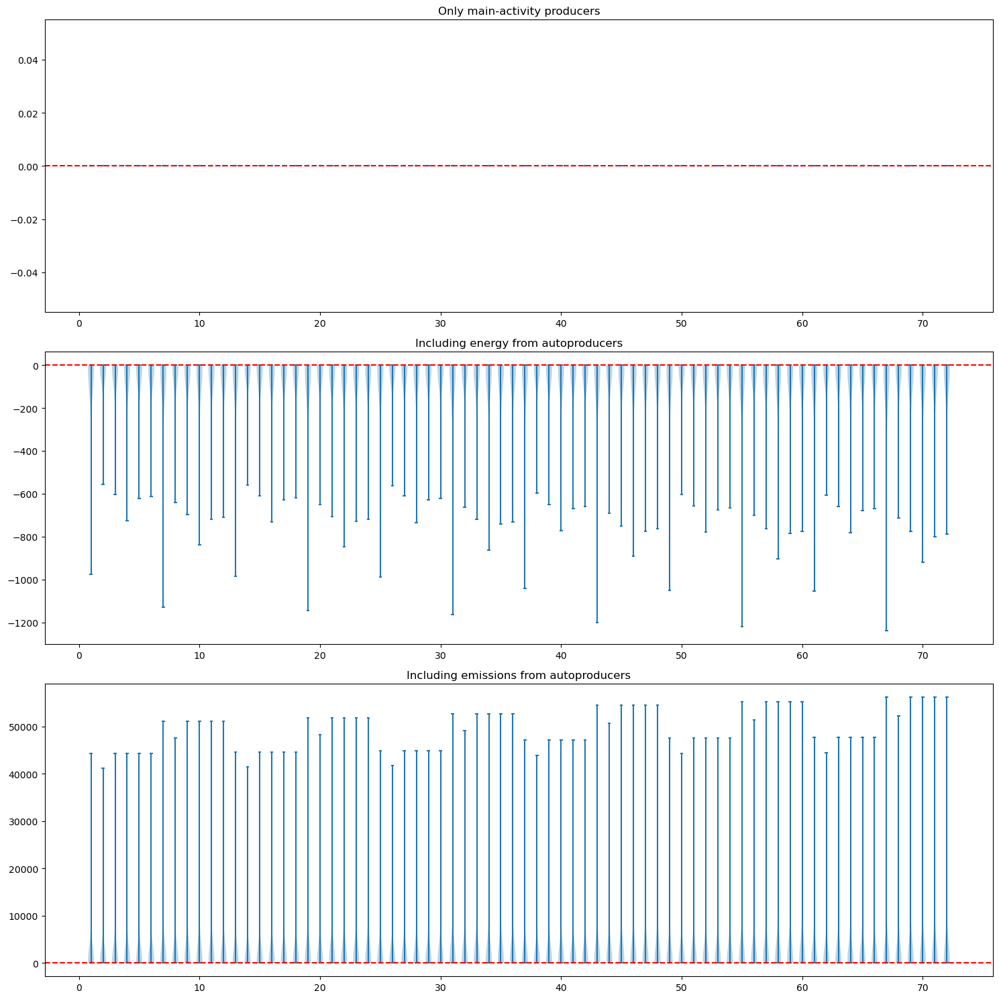

In [98]:
# visually confirm the validation from the "check" section above

# Load your data into df here
df = ef_diff

# Find columns that end with _maponly, _apenergy, _apemissions
cols_maponly = [col for col in df.columns if col.endswith('_maponly')]
cols_apenergy = [col for col in df.columns if col.endswith('_apenergy')]
cols_apemissions = [col for col in df.columns if col.endswith('_apemissions')]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(15, 15))

# Generate violin plots
for ax, cols, title in zip(axes, [cols_maponly, cols_apenergy, cols_apemissions],
                           ['Only main-activity producers', 'Including energy from autoproducers', 'Including emissions from autoproducers']):
    data_to_plot = [df[col] for col in cols]
    ax.violinplot(data_to_plot, showmedians=True)
    ax.axhline(0, color='red', linestyle='dashed')
    ax.set_title(title)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_gep_nep_validation_apcoms' + '.png')
#plt.savefig(plot_path)
    
plt.tight_layout()
plt.show()

## Temporal resolution
Up until this point, we have worked with data at an annual resolution level. Now we introduce a higher temporal resolution, so that we can calculate EF for e.g. 15-minute time periods.

In [ ]:
# Here are the steps for the subsequent caclulation
# 1) calculate en_hr_i from agpt and mult
# 2) calculate em_hr_i = en_hr_i * ef_lr_i (we assume ef_hr_i = ef_lr_i - not time-dependent)
# 3) sum up em_hr_i across i: sum_i (em_hr_i) = em_hr
# 4) sum up en_hr_i across i: sum_i (en_hr_i) = en_hr
# 5) calculate grid ef: ef_hr = em_hr / en_hr
#
# en: energy, em: emissions, ef: emission factor
# lr: low resolution, hr: high resolution, i: production technology (column "label_entsoe")

### Import

In [2]:
# import the required files

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Load the pickle file into a DataFrame
ef_lr_i = pd.read_pickle(pickle_path)
agpt = pd.read_pickle(pickle_path2)
mult = pd.read_pickle(pickle_path3)

# replace nan values with zeros
ef_lr_i = ef_lr_i.replace(np.nan, 0.0)
agpt = agpt.replace(np.nan, 0.0)
mult = mult.replace(np.nan, 0.0)

### Calculate

In [3]:
# step 1: calculate en_hr_i from agpt and mult
# use hourly ENTSOE data (agpt) and scaling dataframe (mult) to calculate high resolution energy flows

# filter for Germany
map_codes = ['DE']
agpt = agpt[agpt['MapCode'].isin(map_codes)]

# add column for year
agpt['Year'] = agpt['DateTime'].dt.year.astype('i4')

# Merge the dataframes on the relevant column
en_hr_i = pd.merge(agpt, mult, left_on=['Year', 'ProductionType'], right_on=['Year', 'Production Type'])

# Drop unnecessary columns
en_hr_i = en_hr_i.drop(columns=['MapCode', 'nep', 'nep_map'])

# Get all the columns for energy (pe, gep etc.) from the dataframe
ap_columns = [col for col in en_hr_i.columns if col.endswith('ap')]

# Multiply "ActualGenerationOutput" with each of the ap_columns
for col in ap_columns:
    en_hr_i[col] = en_hr_i[col] * en_hr_i['ActualGenerationOutput']
    
# Drop a few columns
en_hr_i = en_hr_i.drop(columns=['ProductionType', 'ActualGenerationOutput'])
prefixes_to_drop = ['pe_', 'ghp_', 'nhp_']
en_hr_i = en_hr_i.filter(regex=f'^(?!{"|".join(prefixes_to_drop)}).*')

# Divide all numeric columns by 4
# explanation: agpt is in MW (MWh/h), we want MWh
cols_to_exclude = ['Year', 'ProductionType', 'DateTime']
numeric_cols = en_hr_i.select_dtypes(include=np.number).columns.difference(cols_to_exclude)
en_hr_i[numeric_cols] = en_hr_i[numeric_cols] / 4

# Return the modified dataframe
en_hr_i # unit: MWh

,DateTime,Year,gep_chp_ap,gep_el_ap,gep_chp_map,gep_el_map,nep_el_map,nep_el_ap,nep_chp_map,nep_chp_ap,Production Type
0,2018-01-01 00:00:00,2018,102.571840,34.052190,920.892233,454.777552,420.702438,32.353478,872.533015,96.737301,Biomass
1,2018-01-01 00:15:00,2018,102.399735,33.995054,919.347073,454.014483,419.996544,32.299192,871.068997,96.574986,Biomass
2,2018-01-01 00:30:00,2018,102.495253,34.026764,920.204637,454.437987,420.388315,32.329321,871.881527,96.665071,Biomass
3,2018-01-01 00:45:00,2018,102.525157,34.036692,920.473109,454.570570,420.510964,32.338753,872.135900,96.693273,Biomass
4,2018-01-01 01:00:00,2018,102.413719,33.999696,919.472618,454.076483,420.053898,32.303603,871.187948,96.588174,Biomass
...,...,...,...,...,...,...,...,...,...,...,...
2159795,2021-12-31 22:45:00,2021,0.000000,0.000000,0.000000,6568.086691,6449.913256,0.000000,0.000000,0.000000,Wind Onshore
2159796,2021-12-31 23:00:00,2021,0.000000,0.000000,0.000000,6594.107933,6475.466322,0.000000,0.000000,0.000000,Wind Onshore
2159797,2021-12-31 23:15:00,2021,0.000000,0.000000,0.000000,6490.158253,6373.386911,0.000000,0.000000,0.000000,Wind Onshore
2159798,2021-12-31 23:30:00,2021,0.000000,0.000000,0.000000,6401.307223,6286.134495,0.000000,0.000000,0.000000,Wind Onshore


In [4]:
# step 2: combine el and chp (map only), to reduce computational burden later

# initiate df
en_hr_i_comb = pd.DataFrame()

# copy columns
en_hr_i_comb['DateTime'] = en_hr_i['DateTime']
en_hr_i_comb['Year'] = en_hr_i['Year']
en_hr_i_comb['Production Type'] = en_hr_i['Production Type']

# define new columns
en_hr_i_comb['gep_map'] = en_hr_i['gep_el_map'] + en_hr_i['gep_chp_map']
en_hr_i_comb['nep_map'] = en_hr_i['nep_el_map'] + en_hr_i['nep_chp_map']

en_hr_i_comb

,DateTime,Year,Production Type,gep_map,nep_map
0,2018-01-01 00:00:00,2018,Biomass,1375.669786,1293.235453
1,2018-01-01 00:15:00,2018,Biomass,1373.361557,1291.065541
2,2018-01-01 00:30:00,2018,Biomass,1374.642624,1292.269842
3,2018-01-01 00:45:00,2018,Biomass,1375.043679,1292.646864
4,2018-01-01 01:00:00,2018,Biomass,1373.549100,1291.241846
...,...,...,...,...,...
2159795,2021-12-31 22:45:00,2021,Wind Onshore,6568.086691,6449.913256
2159796,2021-12-31 23:00:00,2021,Wind Onshore,6594.107933,6475.466322
2159797,2021-12-31 23:15:00,2021,Wind Onshore,6490.158253,6373.386911
2159798,2021-12-31 23:30:00,2021,Wind Onshore,6401.307223,6286.134495


In [5]:
# step 3: merge en and ef dataframe, to reduce computational burden later
em_hr_i = pd.merge(en_hr_i_comb, ef_lr_i, on=['Year', 'Production Type'])
em_hr_i

,DateTime,Year,Production Type,gep_map,nep_map,ef_gep_co2_op_el100_maponly,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_en_maponly,ef_gep_co2_op_ex_maponly,ef_gep_co2_op_iea_maponly,...,ef_nep_gwp20_op_en_mapap,ef_nep_gwp20_op_ex_mapap,ef_nep_gwp20_op_iea_mapap,ef_nep_gwp20_op_uba_mapap,ef_nep_gwp20_lc_el100_mapap,ef_nep_gwp20_lc_th100_mapap,ef_nep_gwp20_lc_en_mapap,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2018,Biomass,1375.669786,1293.235453,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
1,2018-01-01 00:15:00,2018,Biomass,1373.361557,1291.065541,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
2,2018-01-01 00:30:00,2018,Biomass,1374.642624,1292.269842,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
3,2018-01-01 00:45:00,2018,Biomass,1375.043679,1292.646864,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
4,2018-01-01 01:00:00,2018,Biomass,1373.549100,1291.241846,31.045185,9.610392,23.727280,28.814054,25.870627,...,195.166702,239.112577,213.368909,219.868909,548.906939,152.624659,415.592405,510.018721,454.639008,468.902417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2159795,2021-12-31 22:45:00,2021,Wind Onshore,6568.086691,6449.913256,0.777674,0.777674,0.777674,0.777674,0.777674,...,0.955338,0.955338,0.955338,0.955338,19.354500,19.354500,19.354500,19.354500,19.354500,19.354500
2159796,2021-12-31 23:00:00,2021,Wind Onshore,6594.107933,6475.466322,0.777674,0.777674,0.777674,0.777674,0.777674,...,0.955338,0.955338,0.955338,0.955338,19.354500,19.354500,19.354500,19.354500,19.354500,19.354500
2159797,2021-12-31 23:15:00,2021,Wind Onshore,6490.158253,6373.386911,0.777674,0.777674,0.777674,0.777674,0.777674,...,0.955338,0.955338,0.955338,0.955338,19.354500,19.354500,19.354500,19.354500,19.354500,19.354500
2159798,2021-12-31 23:30:00,2021,Wind Onshore,6401.307223,6286.134495,0.777674,0.777674,0.777674,0.777674,0.777674,...,0.955338,0.955338,0.955338,0.955338,19.354500,19.354500,19.354500,19.354500,19.354500,19.354500


In [6]:
# step 4: calculate em_hr_i
# em_hr_i = en_hr_i * ef_lr_i

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map - ap are considered via apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if ef_col in em_hr_i.columns and en_col in em_hr_i.columns:
        
                        # Calculate the new column in the result DataFrame
                        em_hr_i[new_col] = em_hr_i[ef_col] * em_hr_i[en_col]
                        #em_hr_i[["Datetime", "Year", "Production Type"]] = merged_df[["Datetime", "Year", "Production Type"]]

# replace nan values with zeros
em_hr_i = em_hr_i.replace(np.nan, 0.0)

# drop some columns
# get all columns that start with "ef_"
ef_cols = [col for col in em_hr_i.columns if col.startswith("ef_")]
# add the specific columns you want to drop
cols_to_drop = ['gep_map', 'nep_map'] + ef_cols
# drop these columns
em_hr_i = em_hr_i.drop(columns=cols_to_drop)

# Show the new DataFrame
em_hr_i # unit: g/kWh * MWh = kg

,DateTime,Year,Production Type,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2018,Biomass,42707.923491,38849.593483,44833.188794,40782.857531,13220.726398,12026.336195,13964.968683,...,725413.005791,659574.291767,635557.856113,577874.423915,646644.987725,587955.283953,655845.076795,596320.370027,666932.208407,606401.230065
1,2018-01-01 00:15:00,2018,Biomass,42636.264098,38784.407961,44757.963430,40714.428196,13198.543413,12006.157271,13941.536938,...,724195.839242,658467.595639,634491.457032,576904.811553,645559.985607,586968.756970,654744.637897,595319.807311,665813.166471,605383.752729
2,2018-01-01 00:30:00,2018,Biomass,42676.035061,38820.585926,44799.713507,40752.406477,13210.854969,12017.356574,13954.541557,...,724871.366677,659081.811990,635083.308522,577442.946414,646162.161782,587516.279446,655355.381485,595875.119618,666434.234746,605948.452650
3,2018-01-01 00:45:00,2018,Biomass,42688.485881,38831.911910,44812.783914,40764.296074,13214.709263,12020.862662,13958.612822,...,725082.849365,659274.100442,635268.595362,577611.416562,646350.680901,587687.688509,655546.582744,596048.967390,666628.668282,606125.239337
4,2018-01-01 01:00:00,2018,Biomass,42642.086424,38789.704285,44764.075491,40719.988079,13200.345780,12007.796809,13943.440767,...,724294.734024,658557.514699,634578.101957,576983.592557,645648.142029,587048.912288,654834.048557,595401.103032,665904.088628,605466.422762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2159795,2021-12-31 22:45:00,2021,Wind Onshore,5107.830098,5107.830098,5107.830098,5107.830098,5107.830098,5107.830098,5107.830098,...,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378,124834.848378
2159796,2021-12-31 23:00:00,2021,Wind Onshore,5128.066141,5128.066141,5128.066141,5128.066141,5128.066141,5128.066141,5128.066141,...,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207,125329.415207
2159797,2021-12-31 23:15:00,2021,Wind Onshore,5047.227180,5047.227180,5047.227180,5047.227180,5047.227180,5047.227180,5047.227180,...,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214,123353.719214
2159798,2021-12-31 23:30:00,2021,Wind Onshore,4978.130046,4978.130046,4978.130046,4978.130046,4978.130046,4978.130046,4978.130046,...,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299,121664.992299


In [7]:
# step 5: sum up em_hr_i to em_hr
# sum_i (em_hr_i) = em_hr

# group by DateTime - sum up across production technologies
em_hr = em_hr_i.drop(columns=['Year', 'Production Type']).groupby('DateTime', as_index=False).sum()

# show result
em_hr # unit: kg

,DateTime,em_gep_co2_op_el100_maponly,em_gep_co2_op_el100_apenergy,em_gep_co2_op_el100_apemissions,em_gep_co2_op_el100_mapap,em_gep_co2_op_th100_maponly,em_gep_co2_op_th100_apenergy,em_gep_co2_op_th100_apemissions,em_gep_co2_op_th100_mapap,em_gep_co2_op_en_maponly,...,em_nep_gwp20_lc_ex_apemissions,em_nep_gwp20_lc_ex_mapap,em_nep_gwp20_lc_iea_maponly,em_nep_gwp20_lc_iea_apenergy,em_nep_gwp20_lc_iea_apemissions,em_nep_gwp20_lc_iea_mapap,em_nep_gwp20_lc_uba_maponly,em_nep_gwp20_lc_uba_apenergy,em_nep_gwp20_lc_uba_apemissions,em_nep_gwp20_lc_uba_mapap
0,2018-01-01 00:00:00,2.975173e+06,2.778881e+06,3.460420e+06,2.938704e+06,2.425982e+06,2.324100e+06,2.748077e+06,2.383946e+06,2.639494e+06,...,4.658723e+06,3.969859e+06,3.790648e+06,3.542043e+06,4.401725e+06,3.754004e+06,3.824324e+06,3.564575e+06,4.435401e+06,3.776535e+06
1,2018-01-01 00:15:00,2.977745e+06,2.780053e+06,3.481599e+06,2.940945e+06,2.426797e+06,2.324434e+06,2.765387e+06,2.384606e+06,2.641333e+06,...,4.681779e+06,3.970297e+06,3.790652e+06,3.540805e+06,4.424224e+06,3.754240e+06,3.824643e+06,3.563536e+06,4.458215e+06,3.776971e+06
2,2018-01-01 00:30:00,2.962221e+06,2.764472e+06,3.466410e+06,2.925458e+06,2.413337e+06,2.311173e+06,2.751825e+06,2.371214e+06,2.627795e+06,...,4.669748e+06,3.957495e+06,3.777801e+06,3.527711e+06,4.412105e+06,3.741514e+06,3.812504e+06,3.551050e+06,4.446808e+06,3.764852e+06
3,2018-01-01 00:45:00,2.950756e+06,2.755290e+06,3.452690e+06,2.914786e+06,2.410772e+06,2.309281e+06,2.748983e+06,2.369195e+06,2.622260e+06,...,4.659069e+06,3.950403e+06,3.772215e+06,3.524109e+06,4.403432e+06,3.735899e+06,3.807180e+06,3.547824e+06,4.438396e+06,3.759614e+06
4,2018-01-01 01:00:00,2.959285e+06,2.764262e+06,3.460871e+06,2.923599e+06,2.420995e+06,2.319402e+06,2.759424e+06,2.379528e+06,2.631822e+06,...,4.667995e+06,3.960171e+06,3.781920e+06,3.534183e+06,4.412544e+06,3.745670e+06,3.816927e+06,3.557991e+06,4.447552e+06,3.769477e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,2.104558e+06,1.865890e+06,2.414688e+06,2.061459e+06,1.547932e+06,1.424197e+06,1.696477e+06,1.513844e+06,1.759413e+06,...,3.404272e+06,2.909233e+06,2.742178e+06,2.446536e+06,3.152305e+06,2.706792e+06,2.773253e+06,2.466932e+06,3.183380e+06,2.727189e+06
140252,2021-12-31 23:00:00,2.097313e+06,1.858683e+06,2.407528e+06,2.054031e+06,1.541159e+06,1.417976e+06,1.689063e+06,1.506993e+06,1.752963e+06,...,3.399477e+06,2.903741e+06,2.737128e+06,2.441478e+06,3.147641e+06,2.701643e+06,2.768553e+06,2.462108e+06,3.179065e+06,2.722272e+06
140253,2021-12-31 23:15:00,2.104577e+06,1.862163e+06,2.419171e+06,2.060417e+06,1.540046e+06,1.415850e+06,1.688599e+06,1.505254e+06,1.756011e+06,...,3.415807e+06,2.913023e+06,2.743664e+06,2.444244e+06,3.160678e+06,2.708735e+06,2.776313e+06,2.465700e+06,3.193327e+06,2.730191e+06
140254,2021-12-31 23:30:00,2.084708e+06,1.843464e+06,2.398184e+06,2.040740e+06,1.523194e+06,1.399742e+06,1.671107e+06,1.488554e+06,1.738259e+06,...,3.389021e+06,2.888107e+06,2.719473e+06,2.421556e+06,3.135137e+06,2.684889e+06,2.752212e+06,2.443105e+06,3.167875e+06,2.706438e+06


In [8]:
# step 6: sum up en_hr_i to en_hr
# sum_i (en_hr_i) = en_hr

# group by DateTime - sum up across production technologies
en_hr = en_hr_i_comb.drop(columns=['Year', 'Production Type']).groupby('DateTime', as_index=False).sum()

# show result
en_hr # unit: MWh

,DateTime,gep_map,nep_map
0,2018-01-01 00:00:00,15005.147863,14451.832192
1,2018-01-01 00:15:00,15040.494361,14487.808044
2,2018-01-01 00:30:00,15122.990751,14570.809157
3,2018-01-01 00:45:00,15203.458841,14650.591358
4,2018-01-01 01:00:00,15235.222585,14681.890677
...,...,...,...
140251,2021-12-31 22:45:00,13295.028814,12853.915282
140252,2021-12-31 23:00:00,13331.792228,12889.537096
140253,2021-12-31 23:15:00,13252.254843,12809.453782
140254,2021-12-31 23:30:00,13117.018534,12677.834461


In [9]:
# step 7: divide em_hr by en_hr to get ef_hr
# ef_hr = em_hr / en_hr

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
ef_hr = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    em_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map - ap are considered via apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if em_col in em_hr.columns and en_col in en_hr.columns and en_col in en_hr.columns:
                        # Merge dataframes on 'label_entsoe'
                        merged_df = pd.merge(em_hr[['DateTime', em_col]], en_hr[['DateTime', en_col]], on='DateTime')

                        # Calculate the new column in the result DataFrame
                        ef_hr[new_col] = merged_df[em_col] / merged_df[en_col]
                        ef_hr["DateTime"] = merged_df["DateTime"]

# replace nan values with zeros
ef_hr = ef_hr.replace(np.nan, 0.0)

# Show the new DataFrame
ef_hr # unit: kg/MWh = g/kWh

,ef_gep_co2_op_el100_maponly,DateTime,ef_gep_co2_op_el100_apenergy,ef_gep_co2_op_el100_apemissions,ef_gep_co2_op_el100_mapap,ef_gep_co2_op_th100_maponly,ef_gep_co2_op_th100_apenergy,ef_gep_co2_op_th100_apemissions,ef_gep_co2_op_th100_mapap,ef_gep_co2_op_en_maponly,...,ef_nep_gwp20_lc_ex_apemissions,ef_nep_gwp20_lc_ex_mapap,ef_nep_gwp20_lc_iea_maponly,ef_nep_gwp20_lc_iea_apenergy,ef_nep_gwp20_lc_iea_apemissions,ef_nep_gwp20_lc_iea_mapap,ef_nep_gwp20_lc_uba_maponly,ef_nep_gwp20_lc_uba_apenergy,ef_nep_gwp20_lc_uba_apemissions,ef_nep_gwp20_lc_uba_mapap
0,198.276820,2018-01-01 00:00:00,185.195187,230.615531,195.846387,161.676635,154.886843,183.142297,158.875215,175.905894,...,322.362071,274.695930,262.295346,245.093025,304.579030,259.759708,264.625559,246.652112,306.909243,261.318795
1,197.981853,2018-01-01 00:15:00,184.837849,231.481706,195.535155,161.350899,154.545086,183.862796,158.545702,175.614781,...,323.153001,274.044042,261.644266,244.398922,305.375658,259.130962,263.990422,245.967934,307.721814,260.699974
2,195.875359,2018-01-01 00:30:00,182.799306,229.214589,193.444431,159.580689,152.825160,181.962992,156.795289,173.761582,...,320.486521,271.604356,259.271903,242.108080,302.804425,256.781452,261.653554,243.709838,305.186076,258.383210
3,194.084540,2018-01-01 00:45:00,181.227859,227.098973,191.718634,158.567310,151.891820,180.813018,155.832608,172.477827,...,318.012359,269.641185,257.478677,240.543790,300.563397,254.999879,259.865263,242.162488,302.949983,256.618577
4,194.239706,2018-01-01 01:00:00,181.438928,227.162495,191.897376,158.907763,152.239426,181.121344,156.185957,172.745904,...,317.942330,269.731676,257.590772,240.717181,300.543300,255.121759,259.975200,242.338719,302.927728,256.743297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,158.296643,2021-12-31 22:45:00,140.344926,181.623358,155.054844,116.429379,107.122520,127.602338,113.865384,132.336191,...,264.843190,226.330526,213.334086,190.333879,245.240878,210.581123,215.751580,191.920704,247.658371,212.167948
140252,157.316681,2021-12-31 23:00:00,139.417326,180.585508,154.070110,115.600261,106.360513,126.694336,113.037506,131.487412,...,263.739285,225.278894,212.352706,189.415513,244.201207,209.599655,214.790690,191.015997,246.639190,211.200139
140253,158.808962,2021-12-31 23:15:00,140.516713,182.547884,155.476729,116.210085,106.838405,127.419779,113.584727,132.506549,...,266.662954,227.411925,214.190563,190.815654,246.745759,211.463765,216.739350,192.490609,249.294546,213.138720
140254,158.931571,2021-12-31 23:30:00,140.539900,182.829926,155.579560,116.123519,106.711871,127.399940,113.482629,132.519387,...,267.318594,227.807573,214.506115,191.007069,247.292760,211.778213,217.088456,192.706801,249.875101,213.477945


### Check

In [ ]:
# We want to verify that the total sum of emissions is identical for lr and hr data
# i.e., that em_lr = sum_t (em_hr)
# => sum_i (ef_lr_i * en_lr_i) = sum_t (ef_hr * en_hr)
# where i = Production Type, t = time
# --
# We have (from the imports and calculations above): ef_lr_i, ef_hr and en_hr
# --
# We need to import en_lr_i
# --
# Then we need to do the following calculation steps:
# 1) Calculate em_lr_i = ef_lr_i * en_lr_i
# 2) Calculate em_lr = sum_i (em_lr_i)
# 3) Calculate em_hr = ef_hr * en_hr
# 4) Sum up em_hr over time (t)
# 5) Compare em_lr and em_hr

In [ ]:
# Import en_lr_i

# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')

# Load the pickle file into a DataFrame
en_lr_i = pd.read_pickle(pickle_path)

In [ ]:
# step 1: Calculate em_lr_i = ef_lr_i * en_lr_i

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
em_lr_i = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
                for allocation in allocations:
                    for apcom in apcoms:
                        # Calculate the new column name
                        new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                        # Calculate the column names in the input DataFrames
                        ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                        en_el_col = f'{perspective}_el_map' # only map - ap are considered via apcoms
                        en_chp_col = f'{perspective}_chp_map'

                        # Check if columns exist in their respective dataframes before calculation
                        if ef_col in ef_lr_i.columns and en_el_col in en_lr_i.columns and en_chp_col in en_lr_i.columns:
                            # Merge dataframes on 'Production Type'
                            merged_df = pd.merge(ef_lr_i[['Year', 'Production Type', ef_col]], en_lr_i[['Year', 'Production Type', en_el_col, en_chp_col]], on=['Year', 'Production Type'])

                            # Calculate the new column in the result DataFrame
                            em_lr_i[new_col] = merged_df[ef_col] * (merged_df[en_el_col] + merged_df[en_chp_col])
                            em_lr_i[['Year', 'Production Type']] = merged_df[['Year', 'Production Type']]

# replace nan values with zeros
em_lr_i = em_lr_i.replace(np.nan, 0.0)

# Show the new DataFrame
em_lr_i # unit: g/kWh * GWh = t

In [ ]:
# step 2: Calculate em_lr = sum_i (em_lr_i)

# sum up across Production Types
em_lr_series = em_lr_i.drop(columns=['Year', 'Production Type']).sum()

# Convert the series to a DataFrame and transpose it
em_lr = em_lr_series.to_frame().T

# show results
em_lr # unit: t

In [ ]:
# step 3: Calculate em_hr_check = ef_hr * en_hr

# Define the different elements
perspectives = ['gep', 'nep']
metrics = ['co2', 'gwp100', 'gwp20']
sysbounds = ['op', 'lc']
allocations = ['el100', 'th100', 'en', 'ex', 'iea', 'uba']
apcoms = ['maponly', 'apenergy', 'apemissions', 'mapap']

# Create a new DataFrame to store the results
em_hr_check = pd.DataFrame()

# Loop over all combinations:
for perspective in perspectives:
    for metric in metrics:
        for sysbound in sysbounds:
            for allocation in allocations:
                for apcom in apcoms:
                    # Calculate the new column name
                    new_col = f'em_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'

                    # Calculate the column names in the input DataFrames
                    ef_col = f'ef_{perspective}_{metric}_{sysbound}_{allocation}_{apcom}'
                    en_col = f'{perspective}_map' # only map columns - ap are considered by apcoms

                    # Check if columns exist in their respective dataframes before calculation
                    if ef_col in ef_hr.columns and en_col in en_hr.columns:
                        # Merge dataframes on 'label_entsoe'
                        merged_df = pd.merge(ef_hr[['DateTime', ef_col]], en_hr[['DateTime', en_col]], on='DateTime')

                        # Calculate the new column in the result DataFrame
                        em_hr_check[new_col] = ef_hr[ef_col] * en_hr[en_col] / 1000
                        em_hr_check["DateTime"] = merged_df["DateTime"]

# replace nan values with zeros
em_hr_check = em_hr_check.replace(np.nan, 0.0)

# Show the new DataFrame
em_hr_check # unit: g/kWh * MWh / 1000 = t

In [ ]:
# step 4: sum up em_hr_check over time

# sum up across DatTime
em_hr_check_series = em_hr_check.drop(columns=['DateTime']).sum()

# Convert the series to a DataFrame and transpose it
em_hr_check_sum = em_hr_check_series.to_frame().T

# show results
em_hr_check_sum # unit: t

In [ ]:
# step 5: compare em_lr and em_hr_check_check_sum

# define your threshold here
threshold = 0.001  # example: 0.1 % relative difference

# compute the relative difference
diff = (em_hr_check_sum - em_lr) / em_lr

# compute the average relative difference
avg_diff = diff.abs().mean().mean()

# create a boolean mask where True indicates that the relative difference is below the threshold
mask = np.abs(diff) < threshold

# check if all cells are below the threshold
all_below_threshold = mask.all().all()

print("Average relative difference:", avg_diff) # should be (close to) zero
print("All differences below threshold:", all_below_threshold) # should be "True"

### Save

In [10]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms.pkl')

# Save the dataframe to a pickle file
ef_hr.to_pickle(pickle_path)

### Plot

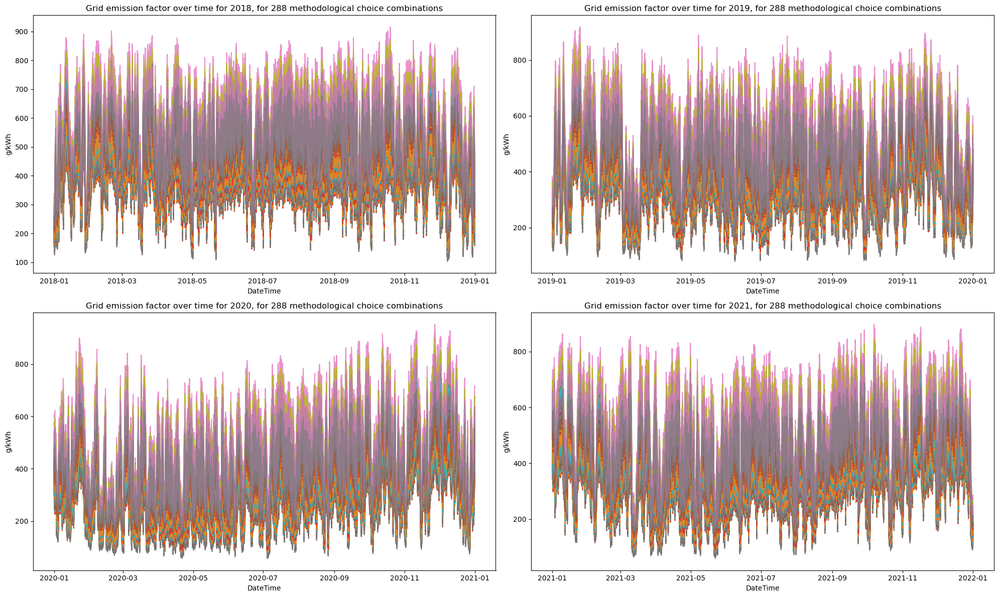

In [220]:
# plot 1: line plot, EF over time

# Convert the 'DateTime' column to datetime
ef_hr['DateTime'] = pd.to_datetime(ef_hr['DateTime'])

# Add a new column for the year
ef_hr['Year'] = ef_hr['DateTime'].dt.year

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Subset the DataFrame for the current year
    ef_hr_year = ef_hr[ef_hr['Year'] == year]
    
    # Remove the 'DateTime' and 'Year' columns from the columns to plot
    columns_to_plot = ef_hr_year.columns.drop(['DateTime', 'Year'])

    for column in columns_to_plot:
        axs[i].plot(ef_hr_year['DateTime'], ef_hr_year[column], label=column, alpha=0.8)
        
    axs[i].set_xlabel('DateTime')
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Grid emission factor over time for {year}, for 288 methodological choice combinations')
    # axs[i].legend(loc='upper right')  # Adjust the position of the legend as needed

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_gep_nep_de' + '.png')
#plt.savefig(plot_path)

plt.show()

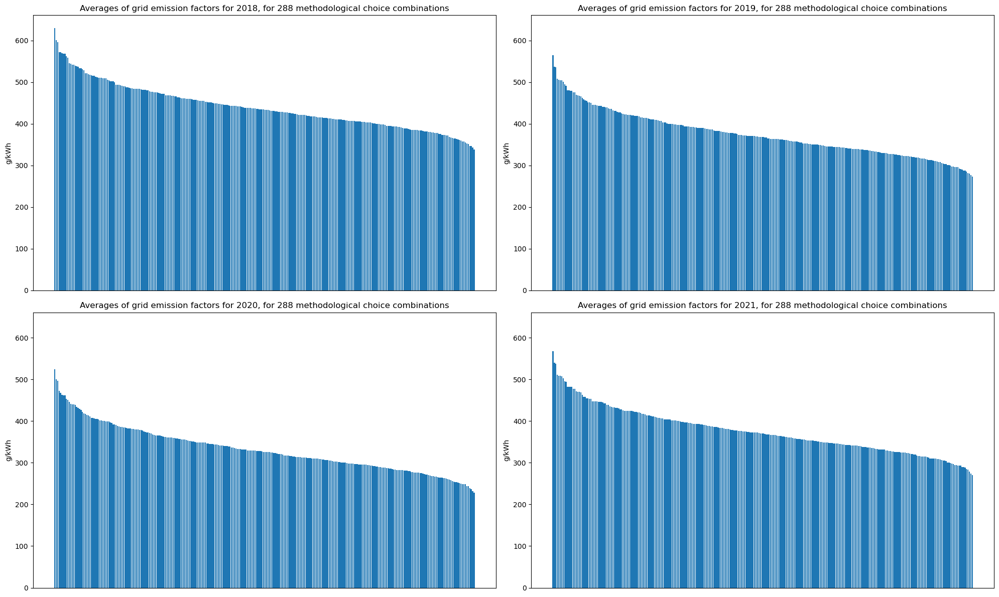

In [221]:
# Plot 2: bar plot, means of ef, sorted

# Convert the 'DateTime' column to datetime
ef_hr['DateTime'] = pd.to_datetime(ef_hr['DateTime'])

# Add a new column for the year
ef_hr['Year'] = ef_hr['DateTime'].dt.year

# Calculate the means for each year
mean_vals_years = ef_hr.groupby('Year').mean()

# Find the global maximum value to set y limit
global_max = 1.05*mean_vals_years.max().max()

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Select the mean values for the current year and sort them
    mean_vals_year = mean_vals_years.loc[year].sort_values(ascending=False)
    
    # Plot the results
    axs[i].bar(mean_vals_year.index, mean_vals_year.values)
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Averages of grid emission factors for {year}, for 288 methodological choice combinations')
    
    # Remove x-tick labels
    axs[i].set_xticks([])

    # Set y limit
    axs[i].set_ylim([0, global_max])

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_gep_nep_mean_de' + '.png')
#plt.savefig(plot_path)

plt.show()

## Electricity trading
Here, we consider how the grid emission factor changes when taking into account the trade of electricity with neighboring countries.

In [222]:
# The trade-corrected ef for a country (e.g. Germany) is calculated as follows:
# ef =
# em / en =
# (em_dom + em_imp - em_exp) / (en_dom + en_imp - en_exp) = 
# (ef_dom*en_dom + sum_n (ef_dom_n * imp_n) - sum_n (ef_dom * exp_n)) / (en_dom + sum_n (imp_n) - sum_n (exp_n))

    # ef_dom: the domestic grid emission factor for the country of interest (from previous section, ef_hr)
    # ef_dom_n =
    # em_dom_n / en_dom_n = 
    # sum_i (ef_n_i * en_dom_n_i) / sum_i (en_dom_n_i)

        # ef_n_i: we assume this to be the same as for Germany (ef_lr_i)
        # en_dom_n_i: to be extracted from agpt (only nep, en_hr_n_i)

    # imp_n: the imports from neighbor country n (from pf, imp_hr_n)
    # exp_n: the exports to neighbor country n (from pf, exp_hr_n)
    # en_dom: the net electricity production within Germany (nep_map_hr)
    
# ef: emission factor
# em: emissions
# en: energy
# dom: domestic
# imp: imports
# exp: exports
# n: neighbor
# i: production type
# lr: low temporal resolution
# hr: high temporal resolution
# pf: physical flows
# map: main activity producer

In [223]:
# step 1: extract ef_n_i (from ef_lr_i)
# step 2: extract en_dom_n_i from agpt (en_hr_n_i)
# step 3: calculate en_dom_n = sum_i (en_dom_n_i)
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 5: calculate ef_dom_n = em_dom_n / en_dom_n
# step 6: extract imp_n from pf (imp_hr_n)
# step 7: extract exp_n from pf (exp_hr_n)
# step 8: calculate en_imp = sum_n (imp_n)
# step 9: calculate en_exp = sum_n (exp_n)
# step 10: extract ef_dom (from ef_hr)
# step 11: calculate em_imp = sum_n (ef_dom_n * imp_n)
# step 12: calculate em_exp = sum_n (ef_dom * exp_n)
# step 13: extract en_dom from agpt and mult (nep_map)
# step 14: calculate em_dom = ef_dom * en_dom
# step 15: calculate em = em_dom + em_imp - em_exp
# step 16: calculate en = en_dom + en_imp - en_exp
# step 17: calculate ef = em / en

# Final step: apply to all variations of (prod) ef calculated before
# (step 18: calculate ef_cons = ef_rel_diff * ef_prod)

### Import

In [11]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'agpt_core.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path4 = os.path.join('..', '1_data', '2_interim', 'ef_ep_metric_sysbound_allocation_apcoms.pkl')
pickle_path5 = os.path.join('..', '1_data', '2_interim', 'multiplier_eurostat_entsoe.pkl')

# Load the pickle file into a DataFrame
agpt = pd.read_pickle(pickle_path)
pf = pd.read_pickle(pickle_path2)
ef_dom = pd.read_pickle(pickle_path3)
ef_n_i = pd.read_pickle(pickle_path4)
mult = pd.read_pickle(pickle_path5)

# replace nan values with zeros
agpt = agpt.replace(np.nan, 0.0)
pf = pf.replace(np.nan, 0.0)
ef_dom = ef_dom.replace(np.nan, 0.0)
ef_n_i = ef_n_i.replace(np.nan, 0.0)
mult = mult.replace(np.nan, 0.0)

### Calculate

In [12]:
# step 1: extract ef_n_i (from ef_lr_i)
# we look at only one ef to save computational load
# from this one ef, we calculate the relative difference in ef and apply it to all other ef

# limit to ef_nep columns
desired_columns = ['Year', 'Production Type', 'ef_nep_gwp100_lc_ex_maponly'] # limit to only one ef
ef_n_i = ef_n_i[desired_columns]
ef_n_i # unit: g/kWh

,Year,Production Type,ef_nep_gwp100_lc_ex_maponly
0,2018,Fossil Hard coal,961.415094
1,2019,Fossil Hard coal,992.138116
2,2020,Fossil Hard coal,1004.542520
3,2021,Fossil Hard coal,980.173375
4,2018,Fossil Brown coal/Lignite,1107.655151
...,...,...,...
59,2021,Hydro Run-of-river and poundage,2.633151
60,2018,Hydro Water Reservoir,23.502924
61,2019,Hydro Water Reservoir,23.481000
62,2020,Hydro Water Reservoir,23.452720


In [13]:
# step 2: extract en_dom_n_i from agpt (en_hr_n_i)

#rename a column
agpt.rename(columns={'ActualGenerationOutput': 'nep',
                     'ProductionType': 'Production Type',}, inplace=True)
# new name
en_dom_n_i = agpt

# divide by 4 to get from MW to MWh (15 minute intervals)
en_dom_n_i['nep'] = en_dom_n_i['nep'] / 4 # unit: MW -> MWh

en_dom_n_i # unit: MWh

,DateTime,MapCode,Production Type,nep
0,2018-01-01 00:00:00,AT,Biomass,158.000
1,2018-01-01 00:15:00,AT,Biomass,158.000
2,2018-01-01 00:30:00,AT,Biomass,158.000
3,2018-01-01 00:45:00,AT,Biomass,158.000
4,2018-01-01 01:00:00,AT,Biomass,158.000
...,...,...,...,...
15688883,2021-12-31 22:45:00,SE,Wind Onshore,2009.610
15688884,2021-12-31 23:00:00,SE,Wind Onshore,2006.895
15688885,2021-12-31 23:15:00,SE,Wind Onshore,2006.895
15688886,2021-12-31 23:30:00,SE,Wind Onshore,2006.895


In [14]:
# step 3: calculate en_dom_n = sum_i (en_dom_n_i)

# sum up across Production Types, grouped by location and time
en_dom_n = en_dom_n_i.groupby(['DateTime', 'MapCode']).nep.sum().reset_index()
en_dom_n # unit: MWh

,DateTime,MapCode,nep
0,2018-01-01 00:00:00,AT,2391.7050
1,2018-01-01 00:00:00,BE,7034.5050
2,2018-01-01 00:00:00,CH,2314.6950
3,2018-01-01 00:00:00,CZ,4302.3975
4,2018-01-01 00:00:00,DE,14349.2300
...,...,...,...
1552699,2021-12-31 23:45:00,FR,41485.5000
1552700,2021-12-31 23:45:00,NL,7221.6600
1552701,2021-12-31 23:45:00,NO,6728.3050
1552702,2021-12-31 23:45:00,PL,10647.0225


In [15]:
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 4.1: merge dataframes ef_n_i and en_dom_n_i, multiply values

# Extract the year from the 'DateTime' column in the en_dom_n_i dataframe and add it as a new column
en_dom_n_i['Year'] = en_dom_n_i['DateTime'].dt.year.astype('i4')

# Merge
em_dom_n_i = pd.merge(ef_n_i, en_dom_n_i, on=['Year', 'Production Type'])

# Calculate
em_dom_n_i['em_nep_gwp100_lc_ex_maponly'] = em_dom_n_i['ef_nep_gwp100_lc_ex_maponly'] * em_dom_n_i['nep']
em_dom_n_i # unit: g/kWh * MWh = kg

,Year,Production Type,ef_nep_gwp100_lc_ex_maponly,DateTime,MapCode,nep,em_nep_gwp100_lc_ex_maponly
0,2018,Fossil Hard coal,961.415094,2018-01-01 00:00:00,AT,75.2000,72298.415099
1,2018,Fossil Hard coal,961.415094,2018-01-01 00:15:00,AT,75.4000,72490.698118
2,2018,Fossil Hard coal,961.415094,2018-01-01 00:30:00,AT,75.4000,72490.698118
3,2018,Fossil Hard coal,961.415094,2018-01-01 00:45:00,AT,75.4000,72490.698118
4,2018,Fossil Hard coal,961.415094,2018-01-01 01:00:00,AT,74.2000,71337.000004
...,...,...,...,...,...,...,...
14652839,2021,Hydro Water Reservoir,23.517209,2021-12-31 22:45:00,SE,3826.5800,89990.480258
14652840,2021,Hydro Water Reservoir,23.517209,2021-12-31 23:00:00,SE,3970.0325,93364.082631
14652841,2021,Hydro Water Reservoir,23.517209,2021-12-31 23:15:00,SE,3970.0325,93364.082631
14652842,2021,Hydro Water Reservoir,23.517209,2021-12-31 23:30:00,SE,3970.0325,93364.082631


In [16]:
# step 4: calculate em_dom_n = sum_i (ef_n_i * en_dom_n_i)
# step 4.2: sum up across Production Types, grouped by DateTime and MapCode

em_dom_n = em_dom_n_i.groupby(['DateTime', 'MapCode']).em_nep_gwp100_lc_ex_maponly.sum().reset_index()
em_dom_n # unit: kg

,DateTime,MapCode,em_nep_gwp100_lc_ex_maponly
0,2018-01-01 00:00:00,AT,1.924851e+05
1,2018-01-01 00:00:00,BE,1.023338e+06
2,2018-01-01 00:00:00,CH,1.171579e+05
3,2018-01-01 00:00:00,CZ,2.153577e+06
4,2018-01-01 00:00:00,DE,3.394240e+06
...,...,...,...
1552699,2021-12-31 23:45:00,FR,3.202918e+06
1552700,2021-12-31 23:45:00,NL,2.742958e+06
1552701,2021-12-31 23:45:00,NO,1.651985e+05
1552702,2021-12-31 23:45:00,PL,6.932192e+06


In [17]:
# step 5: calculate ef_dom_n = em_dom_n / en_dom_n

# merge
ef_dom_n = pd.merge(em_dom_n, en_dom_n, on=['DateTime', 'MapCode'])

# calculate new column
ef_dom_n['ef'] = ef_dom_n['em_nep_gwp100_lc_ex_maponly'] / ef_dom_n['nep']

# drop
ef_dom_n = ef_dom_n.drop(['em_nep_gwp100_lc_ex_maponly', 'nep'], axis=1)

ef_dom_n # unit: kg / MWh = g/kWh

,DateTime,MapCode,ef
0,2018-01-01 00:00:00,AT,80.480301
1,2018-01-01 00:00:00,BE,145.474057
2,2018-01-01 00:00:00,CH,50.614836
3,2018-01-01 00:00:00,CZ,500.552870
4,2018-01-01 00:00:00,DE,236.545128
...,...,...,...
1552699,2021-12-31 23:45:00,FR,77.205730
1552700,2021-12-31 23:45:00,NL,379.823750
1552701,2021-12-31 23:45:00,NO,24.552769
1552702,2021-12-31 23:45:00,PL,651.092112


In [18]:
# step 6: extract imp_n from pf

# limit to inflows into Germany
imp_n = pf[(pf['InMapCode'] == 'DE')]

# reset
imp_n = imp_n.reset_index()

# drop
imp_n = imp_n.drop(['InMapCode', 'index'], axis=1)

# rename
imp_n.rename(columns={'OutMapCode': 'MapCode'}, inplace=True)

imp_n # unit: MWh

,DateTime,MapCode,FlowValue_corr
0,2018-01-01 00:00:00,AT,75.566827
1,2018-01-01 00:15:00,AT,75.566827
2,2018-01-01 00:30:00,AT,75.566827
3,2018-01-01 00:45:00,AT,75.566827
4,2018-01-01 01:00:00,AT,75.566827
...,...,...,...
1353419,2021-12-31 22:45:00,SE,0.000000
1353420,2021-12-31 23:00:00,SE,62.471966
1353421,2021-12-31 23:15:00,SE,62.471966
1353422,2021-12-31 23:30:00,SE,62.471966


In [19]:
# step 7: extract exp_n from pf (exp_n_hr_n)

# limit to inflows into Germany
exp_n = pf[(pf['OutMapCode'] == 'DE')]

# reset
exp_n = exp_n.reset_index()

# drop
exp_n = exp_n.drop(['OutMapCode', 'index'], axis=1)

# rename
exp_n.rename(columns={'InMapCode': 'MapCode'}, inplace=True)

exp_n # unit: MWh

,DateTime,MapCode,FlowValue_corr
0,2018-01-01 00:00:00,AT,419.684268
1,2018-01-01 00:15:00,AT,419.684268
2,2018-01-01 00:30:00,AT,419.684268
3,2018-01-01 00:45:00,AT,419.684268
4,2018-01-01 01:00:00,AT,419.684268
...,...,...,...
1353419,2021-12-31 22:45:00,SE,83.492576
1353420,2021-12-31 23:00:00,SE,0.000000
1353421,2021-12-31 23:15:00,SE,0.000000
1353422,2021-12-31 23:30:00,SE,0.000000


In [20]:
# step 8: calculate en_imp = sum_n (imp_n)

en_imp = imp_n.groupby(['DateTime']).FlowValue_corr.sum().reset_index()
en_imp # unit: MWh

,DateTime,FlowValue_corr
0,2018-01-01 00:00:00,538.606354
1,2018-01-01 00:15:00,538.606354
2,2018-01-01 00:30:00,538.606354
3,2018-01-01 00:45:00,538.606354
4,2018-01-01 01:00:00,534.281708
...,...,...
140251,2021-12-31 22:45:00,606.303373
140252,2021-12-31 23:00:00,709.729573
140253,2021-12-31 23:15:00,769.091349
140254,2021-12-31 23:30:00,772.227773


In [21]:
# step 9: calculate en_exp = sum_n (exp_n)

en_exp = exp_n.groupby(['DateTime']).FlowValue_corr.sum().reset_index()
en_exp # unit: MWh

,DateTime,FlowValue_corr
0,2018-01-01 00:00:00,3707.976452
1,2018-01-01 00:15:00,3707.976452
2,2018-01-01 00:30:00,3707.976452
3,2018-01-01 00:45:00,3707.976452
4,2018-01-01 01:00:00,3718.529230
...,...,...
140251,2021-12-31 22:45:00,3282.871531
140252,2021-12-31 23:00:00,3276.237302
140253,2021-12-31 23:15:00,3342.304050
140254,2021-12-31 23:30:00,3203.051853


In [22]:
# step 10: extract ef_dom (from ef_hr)

desired_columns = ['DateTime', 'ef_nep_gwp100_lc_ex_maponly'] # limit to only one ef
ef_dom_des = ef_dom[desired_columns]
ef_dom_des # unit: g/kWh

,DateTime,ef_nep_gwp100_lc_ex_maponly
0,2018-01-01 00:00:00,243.141651
1,2018-01-01 00:15:00,242.609767
2,2018-01-01 00:30:00,240.272622
3,2018-01-01 00:45:00,238.443934
4,2018-01-01 01:00:00,238.565909
...,...,...
140251,2021-12-31 22:45:00,196.395231
140252,2021-12-31 23:00:00,195.436108
140253,2021-12-31 23:15:00,197.250589
140254,2021-12-31 23:30:00,197.506522


In [23]:
# step 11: calculate em_imp = sum_n (ef_dom_n * imp_n)

# merge
em_imp = pd.merge(ef_dom_n, imp_n, on=['DateTime', 'MapCode'])

# calculate new column
em_imp['em'] = em_imp['ef'] * em_imp['FlowValue_corr'] 

# drop
em_imp = em_imp.drop(['ef', 'FlowValue_corr'], axis=1)

# sum up across countries n
em_imp = em_imp.groupby(['DateTime']).em.sum().reset_index()

em_imp # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,109495.928348
1,2018-01-01 00:15:00,109407.113697
2,2018-01-01 00:30:00,109308.752551
3,2018-01-01 00:45:00,109295.629530
4,2018-01-01 01:00:00,113987.697415
...,...,...
140251,2021-12-31 22:45:00,179053.544776
140252,2021-12-31 23:00:00,215975.975254
140253,2021-12-31 23:15:00,227199.982748
140254,2021-12-31 23:30:00,222800.221150


In [24]:
# step 12: calculate em_exp = sum_n (ef_dom * exp_n)

# merge
em_exp = pd.merge(ef_dom_des, exp_n, on=['DateTime'])

# calculate new column
em_exp['em'] = em_exp['ef_nep_gwp100_lc_ex_maponly'] * em_exp['FlowValue_corr']

# drop
em_exp = em_exp.drop(['ef_nep_gwp100_lc_ex_maponly', 'FlowValue_corr', 'MapCode'], axis=1)

# sum up across countries n
em_exp = em_exp.groupby(['DateTime']).em.sum().reset_index()

em_exp # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,901563.515763
1,2018-01-01 00:15:00,899591.303427
2,2018-01-01 00:30:00,890925.223012
3,2018-01-01 00:45:00,884144.492938
4,2018-01-01 01:00:00,887114.304872
...,...,...
140251,2021-12-31 22:45:00,644740.311911
140252,2021-12-31 23:00:00,640295.067009
140253,2021-12-31 23:15:00,659271.443269
140254,2021-12-31 23:30:00,632623.632662


In [25]:
# step 13: extract en_dom from agpt and mult (nep_map)

# import, filter, drop
df1 = agpt[(agpt['MapCode'] == 'DE')]
columns = ['Year', 'Production Type', 'DateTime', 'nep']
df1 = df1[columns]
columns = ['Year', 'Production Type', 'nep_el_map', 'nep_chp_map']
df2 = mult[columns]

# merge
en_dom = pd.merge(df1, df2, on=['Year', 'Production Type'])

# create new column
en_dom['nep_map'] = en_dom['nep'] * (en_dom['nep_el_map'] + en_dom['nep_chp_map'])

# drop
columns = ['Production Type', 'DateTime', 'nep_map']
en_dom = en_dom[columns]

# sum up across Production Types
en_dom  = en_dom .groupby(['DateTime']).nep_map.sum().reset_index()

en_dom # unit: MWh

,DateTime,nep_map
0,2018-01-01 00:00:00,14451.832192
1,2018-01-01 00:15:00,14487.808044
2,2018-01-01 00:30:00,14570.809157
3,2018-01-01 00:45:00,14650.591358
4,2018-01-01 01:00:00,14681.890677
...,...,...
140251,2021-12-31 22:45:00,12853.915282
140252,2021-12-31 23:00:00,12889.537096
140253,2021-12-31 23:15:00,12809.453782
140254,2021-12-31 23:30:00,12677.834461


In [26]:
# step 14: calculate em_dom = ef_dom * en_dom

# merge
em_dom = pd.merge(en_dom, ef_dom_des, on=['DateTime'])

# create new columns
em_dom['em'] = em_dom['nep_map'] * em_dom['ef_nep_gwp100_lc_ex_maponly']

# drop
columns = ['DateTime', 'em']
em_dom = em_dom[columns]

em_dom # unit: MWh * g/kWh = kg

,DateTime,em
0,2018-01-01 00:00:00,3.513842e+06
1,2018-01-01 00:15:00,3.514884e+06
2,2018-01-01 00:30:00,3.500967e+06
3,2018-01-01 00:45:00,3.493345e+06
4,2018-01-01 01:00:00,3.502599e+06
...,...,...
140251,2021-12-31 22:45:00,2.524448e+06
140252,2021-12-31 23:00:00,2.519081e+06
140253,2021-12-31 23:15:00,2.526672e+06
140254,2021-12-31 23:30:00,2.503955e+06


In [27]:
# step 15: calculate em = em_dom + em_imp - em_exp

# merge
em = pd.merge(em_exp, em_imp, on=['DateTime'], suffixes=('_exp', '_imp'))
em = pd.merge(em, em_dom, on=['DateTime'])

# create new columns
em['em_net'] = em['em'] + em['em_imp'] - em['em_exp']

# drop
columns = ['DateTime', 'em_net']
em = em[columns]

em # unit: kg

,DateTime,em_net
0,2018-01-01 00:00:00,2.721775e+06
1,2018-01-01 00:15:00,2.724700e+06
2,2018-01-01 00:30:00,2.719350e+06
3,2018-01-01 00:45:00,2.718496e+06
4,2018-01-01 01:00:00,2.729472e+06
...,...,...
140251,2021-12-31 22:45:00,2.058761e+06
140252,2021-12-31 23:00:00,2.094762e+06
140253,2021-12-31 23:15:00,2.094601e+06
140254,2021-12-31 23:30:00,2.094132e+06


In [28]:
# step 16: calculate en = en_dom + en_imp - en_exp

# merge
en = pd.merge(en_exp, en_imp, on=['DateTime'], suffixes=('_exp', '_imp'))
en = pd.merge(en, en_dom, on=['DateTime'])

# create new columns
en['en_net'] = en['nep_map'] + en['FlowValue_corr_imp'] - en['FlowValue_corr_exp']

# drop
columns = ['DateTime', 'en_net']
en = en[columns]

en # unit: MWh

,DateTime,en_net
0,2018-01-01 00:00:00,11282.462094
1,2018-01-01 00:15:00,11318.437947
2,2018-01-01 00:30:00,11401.439059
3,2018-01-01 00:45:00,11481.221260
4,2018-01-01 01:00:00,11497.643155
...,...,...
140251,2021-12-31 22:45:00,10177.347124
140252,2021-12-31 23:00:00,10323.029366
140253,2021-12-31 23:15:00,10236.241081
140254,2021-12-31 23:30:00,10247.010380


In [29]:
# step 17: calculate ef = em / ef

# merge
ef = pd.merge(em, en, on=['DateTime'])

# merge with ef_dom
ef = pd.merge(ef, ef_dom_des, on=['DateTime'])

# rename
ef.rename(columns={'ef_nep_gwp100_lc_ex_maponly': 'ef_gross'}, inplace=True)

# create new columns
ef['ef_net'] = ef['em_net'] / ef['en_net']
ef['ef_diff_abs'] = ef['ef_net'] - ef['ef_gross']
ef['ef_diff_rel'] = ef['ef_diff_abs'] / ef['ef_gross']

ef # unit: g/kWh

,DateTime,em_net,en_net,ef_gross,ef_net,ef_diff_abs,ef_diff_rel
0,2018-01-01 00:00:00,2.721775e+06,11282.462094,243.141651,241.239432,-1.902219,-0.007823
1,2018-01-01 00:15:00,2.724700e+06,11318.437947,242.609767,240.731058,-1.878709,-0.007744
2,2018-01-01 00:30:00,2.719350e+06,11401.439059,240.272622,238.509370,-1.763252,-0.007339
3,2018-01-01 00:45:00,2.718496e+06,11481.221260,238.443934,236.777579,-1.666355,-0.006988
4,2018-01-01 01:00:00,2.729472e+06,11497.643155,238.565909,237.394042,-1.171867,-0.004912
...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,2.058761e+06,10177.347124,196.395231,202.288560,5.893329,0.030007
140252,2021-12-31 23:00:00,2.094762e+06,10323.029366,195.436108,202.921235,7.485127,0.038300
140253,2021-12-31 23:15:00,2.094601e+06,10236.241081,197.250589,204.625978,7.375389,0.037391
140254,2021-12-31 23:30:00,2.094132e+06,10247.010380,197.506522,204.365128,6.858605,0.034726


In [30]:
# step 18: calculate consumption based ef using relative difference
# ef_diff_rel: relative difference between production and consumption based ef
# production: w/o trade
# consumption: w trade

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# merge
ef_prod_cons = pd.merge(ef[['DateTime', 'ef_diff_rel']], ef_dom, on='DateTime')

# calculate consumption based values from production based values, rename columns
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_') and col not in ['ef_diff_rel', 'DateTime']:
            df[col+'_cons'] = (1 + df['ef_diff_rel']) * df[col]
            df.rename(columns={col: col+'_prod'}, inplace=True)
    return df

ef_prod_cons = adjust_ef_columns(ef_prod_cons)

# drop
ef_prod_cons = ef_prod_cons.drop("ef_diff_rel", axis=1)

# show
ef_prod_cons

,DateTime,ef_gep_co2_op_el100_maponly_prod,ef_gep_co2_op_el100_apenergy_prod,ef_gep_co2_op_el100_apemissions_prod,ef_gep_co2_op_el100_mapap_prod,ef_gep_co2_op_th100_maponly_prod,ef_gep_co2_op_th100_apenergy_prod,ef_gep_co2_op_th100_apemissions_prod,ef_gep_co2_op_th100_mapap_prod,ef_gep_co2_op_en_maponly_prod,...,ef_nep_gwp20_lc_ex_apemissions_cons,ef_nep_gwp20_lc_ex_mapap_cons,ef_nep_gwp20_lc_iea_maponly_cons,ef_nep_gwp20_lc_iea_apenergy_cons,ef_nep_gwp20_lc_iea_apemissions_cons,ef_nep_gwp20_lc_iea_mapap_cons,ef_nep_gwp20_lc_uba_maponly_cons,ef_nep_gwp20_lc_uba_apenergy_cons,ef_nep_gwp20_lc_uba_apemissions_cons,ef_nep_gwp20_lc_uba_mapap_cons
0,2018-01-01 00:00:00,198.276820,185.195187,230.615531,195.846387,161.676635,154.886843,183.142297,158.875215,175.905894,...,319.840072,272.546847,260.243278,243.175540,302.196156,257.727478,262.555261,244.722429,304.508138,259.274368
1,2018-01-01 00:15:00,197.981853,184.837849,231.481706,195.535155,161.350899,154.545086,183.862796,158.545702,175.614781,...,320.650586,271.921914,259.618159,242.506358,303.010906,257.124317,261.946147,244.063221,305.338894,258.681180
2,2018-01-01 00:30:00,195.875359,182.799306,229.214589,193.444431,159.580689,152.825160,181.962992,156.795289,173.761582,...,318.134616,269.611175,257.369224,240.331359,300.582280,254.897049,259.733397,241.921362,302.946454,256.487053
3,2018-01-01 00:45:00,194.084540,181.227859,227.098973,191.718634,158.567310,151.891820,180.813018,155.832608,172.477827,...,315.789944,267.756810,255.679298,238.862761,298.462923,253.217824,258.049206,240.470146,300.832831,254.825209
4,2018-01-01 01:00:00,194.239706,181.438928,227.162495,191.897376,158.907763,152.239426,181.121344,156.185957,172.745904,...,316.380556,268.406719,256.325452,239.534747,299.066993,253.868568,258.698168,241.148320,301.439708,255.482140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.296643,140.344926,181.623358,155.054844,116.429379,107.122520,127.602338,113.865384,132.336191,...,272.790471,233.122138,219.735707,196.045322,252.599942,216.900135,222.225744,197.679763,255.089979,218.534576
140252,2021-12-31 23:00:00,157.316681,139.417326,180.585508,154.070110,115.600261,106.360513,126.694336,113.037506,131.487412,...,273.840398,233.906988,220.485733,196.670054,253.554019,217.627241,223.017090,198.331836,256.085376,219.289023
140253,2021-12-31 23:15:00,158.808962,140.516713,182.547884,155.476729,116.210085,106.838405,127.419779,113.584727,132.506549,...,276.633738,235.915076,222.199354,197.950434,255.971820,219.370598,224.843443,199.688018,258.615909,221.108182
140254,2021-12-31 23:30:00,158.931571,140.539900,182.829926,155.579560,116.123519,106.711871,127.399940,113.482629,132.519387,...,276.601491,235.718411,221.955048,197.639975,255.880241,219.132417,224.627063,199.398731,258.552256,220.891173


### Check

In [31]:
# Quick check 1: is the net energy roughly what we would expect?
# should be around 500 TWh / year (https://www.umweltbundesamt.de/daten/energie/stromverbrauch)
en.en_net.sum() / 4 # unit: MWh

492066499.99999994

In [32]:
# Quick check 1a: check 1 repeated for domestic energy
en_dom.nep_map.sum() / 4

521818250.0

In [33]:
# Quick check 2: is the net emission roughly what we would expect?
# should be around 200 Mt / year (https://www.umweltbundesamt.de/themen/co2-emissionen-pro-kilowattstunde-strom-stiegen-in)
em.em_net.sum() / (4*1000) # unit: t

203180045.18151715

In [34]:
# Quick check 2a: check 2 repeated for domestic emissions
em_dom.em.sum() / (4*1000) # unit: t

223775194.28499964

### Save

In [35]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'ef_neighbors.pkl')

# Save the dataframe to a pickle file
ef_prod_cons.to_pickle(pickle_path)
ef_dom_n.to_pickle(pickle_path2)

### Plot

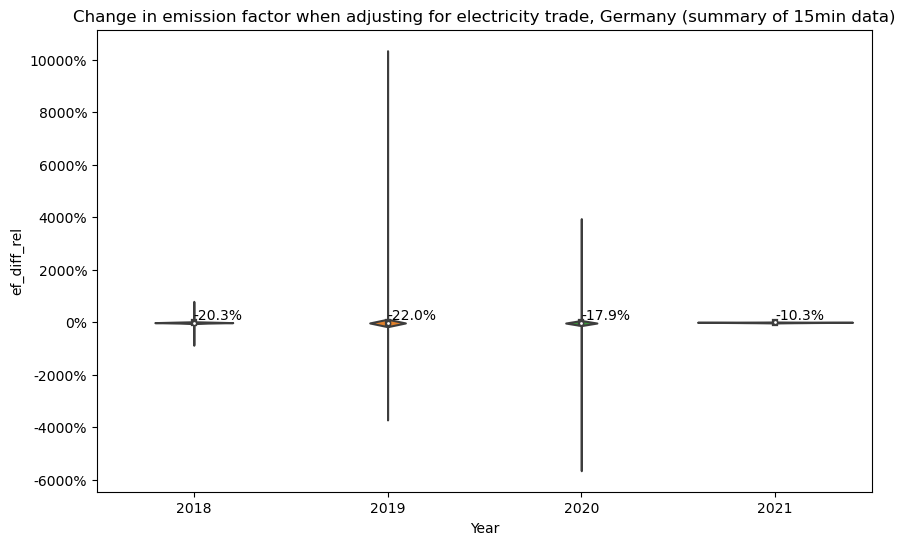

In [142]:
# plot 1: How does the EF change when adjusting for electricity trading?

# Ensure the 'DateTime' column is of datetime type
ef['DateTime'] = pd.to_datetime(ef['DateTime'])

# Extract the year from each date
ef['Year'] = ef['DateTime'].dt.year

# Create a function to convert y values to percentages, rounded to the nearest integer
def to_percent(y, position):
    return str(round(100 * y)) + '%'

# Create a formatter
formatter = FuncFormatter(to_percent)

# Create the violin plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.violinplot(x='Year', y='ef_diff_rel', data=ef, ax=ax)

# Set the formatter
ax.yaxis.set_major_formatter(formatter)

# Calculate the means and annotate them
for i, year in enumerate(ef['Year'].unique()):
    mean = ef.loc[ef['Year'] == year, 'ef_diff_rel'].mean()
    ax.text(i, mean, f'{mean:.1%}', ha='left', va='bottom')

# Add a title
ax.set_title('Change in emission factor when adjusting for electricity trade, Germany (summary of 15min data)')

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_tradeadjustment_relative' + '.png')
#plt.savefig(plot_path)

# Display the plot
plt.show()

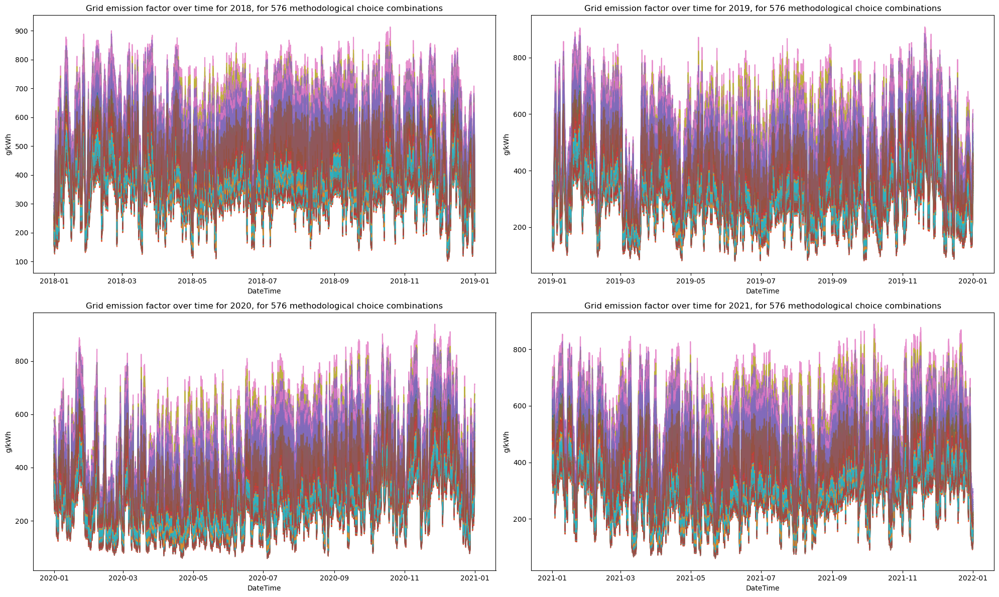

In [87]:
# plot 2: line plot, EF over time

df = ef_prod_cons

# Convert the 'DateTime' column to datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Add a new column for the year
df['Year'] = df['DateTime'].dt.year

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Subset the DataFrame for the current year
    df_year = df[df['Year'] == year]
    
    # Remove the 'DateTime' and 'Year' columns from the columns to plot
    columns_to_plot = df_year.columns.drop(['DateTime', 'Year'])

    for column in columns_to_plot:
        axs[i].plot(df_year['DateTime'], df_year[column], label=column, alpha=0.8)
        
    axs[i].set_xlabel('DateTime')
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Grid emission factor over time for {year}, for 576 methodological choice combinations')

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_prod_cons_de' + '.png')
#plt.savefig(plot_path)

plt.show()

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4736\3458725025.py:12: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_vals_years = df.groupby('Year').mean()


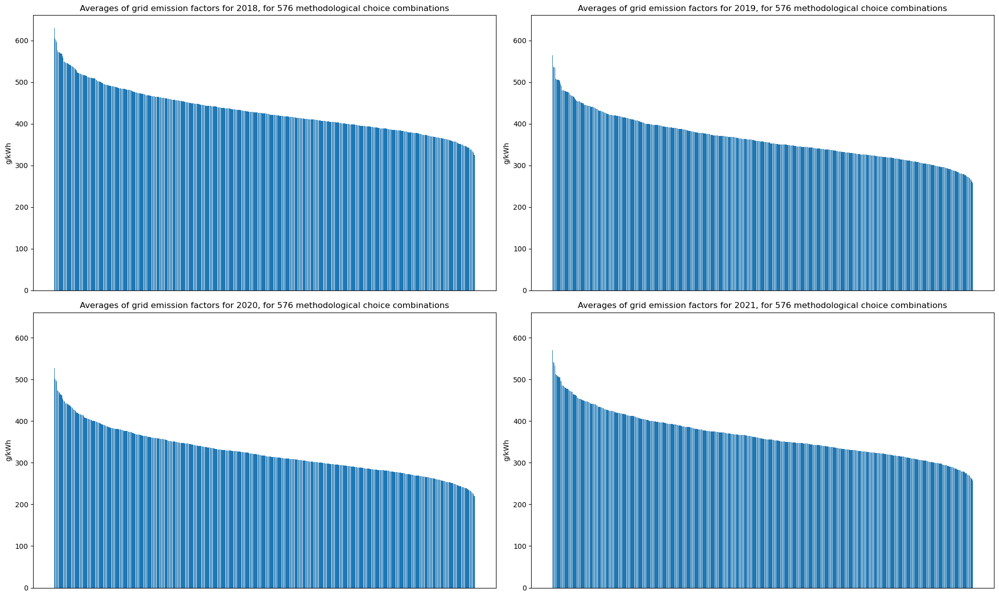

In [88]:
# Plot 3: bar plot, means of ef, sorted

df = ef_prod_cons

# Convert the 'DateTime' column to datetime
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Add a new column for the year
df['Year'] = df['DateTime'].dt.year

# Calculate the means for each year
mean_vals_years = df.groupby('Year').mean()

# Find the global maximum value to set y limit
global_max = 1.05*mean_vals_years.max().max()

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):  # adjust the range according to your data
    # Select the mean values for the current year and sort them
    mean_vals_year = mean_vals_years.loc[year].sort_values(ascending=False)
    
    # Plot the results
    axs[i].bar(mean_vals_year.index, mean_vals_year.values)
    axs[i].set_ylabel('g/kWh')
    axs[i].set_title(f'Averages of grid emission factors for {year}, for 576 methodological choice combinations')
    
    # Remove x-tick labels
    axs[i].set_xticks([])

    # Set y limit
    axs[i].set_ylim([0, global_max])

plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_hr_prod_cons_mean_de' + '.png')
#plt.savefig(plot_path)

plt.show()

## Storage cycling (pumped hydro)
Here, we consider how the grid emission factor changes when we take into account the losses from pumped hydro storage cycling.

In [347]:
# We want to calculate the grid emission factor which takes into account pumped hydro losses

# ef_grid_ph_in =
# em_grid_ph_in / en_grid_ph_in =
# em / (en_grid + en_ph_in)

# ef_grid_ph_out =
# em_grid_ph_out / en_grid_ph_out =
# em / (en_grid + en_ph_out) = 
# ef_grid_ph_in * (en_grid + en_ph_in) / (en_grid + en_ph_out) 

# ef_grid_ph_in: ef_nep
# en_grid: nep
# en_ph_in: energy going into pumped hydro plants
# en_ph_out: energy coming out of pumped hydro plants

# ef: emission factor
# em: emissions
# en: energy
# grid: grid
# ph: pumped hydro
# in: going into pumped hydro plants (charging)
# out: going out of pumped hydro plants (discharging)

### Import

In [36]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pe_gep_nep_entsoe.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_input_annual.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'pumped_hydro_output_annual.pkl')
pickle_path4 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade.pkl')

# Load the pickle file into a DataFrame
en = pd.read_pickle(pickle_path)
en_ph_in = pd.read_pickle(pickle_path2)
en_ph_out = pd.read_pickle(pickle_path3)
ef_in = pd.read_pickle(pickle_path4)

### Calculate

In [37]:
# step 1: filter en_ph_in for Germany
en_ph_in = en_ph_in[(en_ph_in['Country'] == 'Germany')]
en_ph_in

,Country,Year,sum
12,Germany,2018,8445.0
13,Germany,2019,8180.0
14,Germany,2020,8872.0
15,Germany,2021,8156.0


In [38]:
# step 2: filter en for relevant columns, sum up

en = en[['Year', 'Production Type', 'nep_el_map', 'nep_chp_map']]
en ['nep'] = en['nep_el_map'] + en['nep_chp_map']
en_grid = en.groupby('Year')['nep'].sum()
en_grid

Year
2018    554709.0
2019    526506.0
2020    498555.0
2021    507503.0
Name: nep, dtype: float64

In [39]:
# step 3: calculate en_in = en_grid + en_ph_in

en_in = pd.merge(en_grid, en_ph_in, on="Year")
en_in['en_in'] = en_in['nep'] + en_in['sum']
en_in = en_in[['Year', 'en_in']]
en_in

,Year,en_in
0,2018,563154.0
1,2019,534686.0
2,2020,507427.0
3,2021,515659.0


In [40]:
# step 4: calculate en_out = en_grid + en_ph_out

en_out = pd.merge(en_grid, en_ph_out, on="Year")
en_out['en_out'] = en_out['nep'] + en_out['nep_el_map']
en_out = en_out[['Year', 'en_out']]
en_out

,Year,en_out
0,2018,560878.0
1,2019,532446.0
2,2020,505109.0
3,2021,512818.0


In [41]:
# step 5: calculate ratio_in_out = en_in / en_out

ratio = pd.merge(en_in, en_out, on="Year")
ratio['ratio_in_out'] = ratio['en_in'] / ratio['en_out']
ratio = ratio[['Year', 'ratio_in_out']]
ratio

,Year,ratio_in_out
0,2018,1.004058
1,2019,1.004207
2,2020,1.004589
3,2021,1.005540


In [42]:
# step 6: calculate ef_out = ef_in * ratio_in_out

# merge
ef_in['Year'] = ef_in['DateTime'].dt.year.astype('i4')
ef_out = pd.merge(ef_in, ratio, on="Year")

# calculate ef_out from ratio and ef_in
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_'):
            df[col+'_ph'] = df[col] * df['ratio_in_out']
            df.rename(columns={col: col+'_noph'}, inplace=True)
    return df

ef_out = adjust_ef_columns(ef_out)

ef_out

,DateTime,ef_gep_co2_op_el100_maponly_prod_noph,ef_gep_co2_op_el100_apenergy_prod_noph,ef_gep_co2_op_el100_apemissions_prod_noph,ef_gep_co2_op_el100_mapap_prod_noph,ef_gep_co2_op_th100_maponly_prod_noph,ef_gep_co2_op_th100_apenergy_prod_noph,ef_gep_co2_op_th100_apemissions_prod_noph,ef_gep_co2_op_th100_mapap_prod_noph,ef_gep_co2_op_en_maponly_prod_noph,...,ef_nep_gwp20_lc_ex_apemissions_cons_ph,ef_nep_gwp20_lc_ex_mapap_cons_ph,ef_nep_gwp20_lc_iea_maponly_cons_ph,ef_nep_gwp20_lc_iea_apenergy_cons_ph,ef_nep_gwp20_lc_iea_apemissions_cons_ph,ef_nep_gwp20_lc_iea_mapap_cons_ph,ef_nep_gwp20_lc_uba_maponly_cons_ph,ef_nep_gwp20_lc_uba_apenergy_cons_ph,ef_nep_gwp20_lc_uba_apemissions_cons_ph,ef_nep_gwp20_lc_uba_mapap_cons_ph
0,2018-01-01 00:00:00,198.276820,185.195187,230.615531,195.846387,161.676635,154.886843,183.142297,158.875215,175.905894,...,321.137958,273.652821,261.299326,244.162327,303.422445,258.773317,263.620690,245.715494,305.743809,260.326483
1,2018-01-01 00:15:00,197.981853,184.837849,231.481706,195.535155,161.350899,154.545086,183.862796,158.545702,175.614781,...,321.951762,273.025353,260.671669,243.490430,304.240501,258.167708,263.009104,245.053610,306.577936,259.730888
2,2018-01-01 00:30:00,195.875359,182.799306,229.214589,193.444431,159.580689,152.825160,181.962992,156.795289,173.761582,...,319.425582,270.705237,258.413609,241.306605,301.802020,255.931402,260.787376,242.903061,304.175787,257.527858
3,2018-01-01 00:45:00,194.084540,181.227859,227.098973,191.718634,158.567310,151.891820,180.813018,155.832608,172.477827,...,317.071395,268.843346,256.716825,239.832047,299.674063,254.245362,259.096350,241.445956,302.053587,255.859270
4,2018-01-01 01:00:00,194.239706,181.438928,227.162495,191.897376,158.907763,152.239426,181.121344,156.185957,172.745904,...,317.664404,269.495893,257.365601,240.506761,300.280584,254.898747,259.747945,242.126882,302.662928,256.518867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.296643,140.344926,181.623358,155.054844,116.429379,107.122520,127.602338,113.865384,132.336191,...,274.301724,234.413629,220.953038,197.131409,253.999340,218.101757,223.456870,198.774905,256.503171,219.745253
140252,2021-12-31 23:00:00,157.316681,139.417326,180.585508,154.070110,115.600261,106.360513,126.694336,113.037506,131.487412,...,275.357467,235.202828,221.707219,197.759602,254.958702,218.832891,224.252600,199.430590,257.504083,220.503879
140253,2021-12-31 23:15:00,158.808962,140.516713,182.547884,155.476729,116.210085,106.838405,127.419779,113.584727,132.506549,...,278.166283,237.222040,223.430333,199.047075,257.389898,220.585907,226.089070,200.794285,260.048635,222.333116
140254,2021-12-31 23:30:00,158.931571,140.539900,182.829926,155.579560,116.123519,106.711871,127.399940,113.482629,132.519387,...,278.133857,237.024286,223.184674,198.734896,257.297812,220.346405,225.871492,200.503396,259.984630,222.114905


In [43]:
ef_out['ef_nep_gwp100_lc_ex_maponly_cons_ph']

0         242.218363
1         241.707927
2         239.477223
3         237.738405
4         238.357369
             ...    
140251    203.409234
140252    204.045414
140253    205.759602
140254    205.497306
140255    204.871206
Name: ef_nep_gwp100_lc_ex_maponly_cons_ph, Length: 140256, dtype: float64

### Check

In [44]:
# A) Absolute differences
# We expect the ef to increase when taking into account ph
# step 1: calculate difference of the mean ef before and after taking into account ph

# Filter columns that start with 'ef_' and end with '_ph'
columns_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_ph')]

# Filter columns that start with 'ef_' and do not end with '_ph'
columns_non_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_noph')]

# Calculate the means for each group of columns
mean_ph = ef_out[columns_ph].mean(axis=1)
mean_non_ph = ef_out[columns_non_ph].mean(axis=1)

# Calculate the difference of the column means
diff_abs = mean_ph - mean_non_ph

# Print the result
diff_abs

0         0.873723
1         0.873267
2         0.864838
3         0.858594
4         0.860224
            ...   
140251    0.939395
140252    0.938116
140253    0.945658
140254    0.945245
140255    0.945102
Length: 140256, dtype: float64

In [45]:
# A) Absolute differences
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_abs = diff_abs.describe()

# Print the result
description_abs

count    140256.000000
mean          1.706090
std           0.524740
min           0.472245
25%           1.334654
50%           1.730425
75%           2.078362
max           3.103534
dtype: float64

In [46]:
# B) Relative differences
# Same as for absolute differences, but now relative
# step 1: calculate difference of the mean ef before and after taking into account ph

# Filter columns that start with 'ef_' and end with '_ph'
columns_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_ph')]

# Filter columns that start with 'ef_' and do not end with '_ph'
columns_non_ph = [col for col in ef_out.columns if col.startswith('ef_') and col.endswith('_noph')]

# Calculate the means for each group of columns
mean_ph = ef_out[columns_ph].mean(axis=1)
mean_non_ph = ef_out[columns_non_ph].mean(axis=1)

# Calculate the difference of the column means
diff_rel = (mean_ph - mean_non_ph) / mean_non_ph

# Print the result
diff_rel

0         0.004058
1         0.004058
2         0.004058
3         0.004058
4         0.004058
            ...   
140251    0.005540
140252    0.005540
140253    0.005540
140254    0.005540
140255    0.005540
Length: 140256, dtype: float64

In [47]:
# B) Relative differences
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_rel = diff_rel.describe()

# Print the result
description_rel

count    140256.000000
mean          0.004598
std           0.000577
min           0.004058
25%           0.004207
50%           0.004589
75%           0.004589
max           0.005540
dtype: float64

### Save

In [48]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'gec_annual_de.pkl')

# Save the dataframe to a pickle file
ef_out.to_pickle(pickle_path)
en_out.to_pickle(pickle_path2)

### Plot

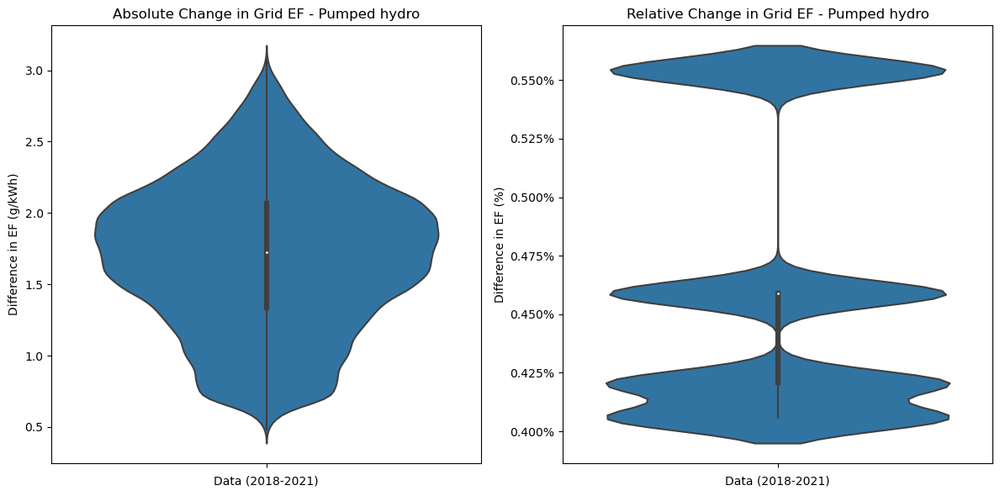

In [101]:
# Create a figure and a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# plot distribution: how much does the ef change when taking into account pumped hydro (absolute values)
# Create a violin plot for diff_abs on the left subplot
sns.violinplot(y=diff_abs, ax=axes[0])

# Add labels and title
axes[0].set_xlabel('Data (2018-2021)')
axes[0].set_ylabel('Difference in EF (g/kWh)')
axes[0].set_title('Absolute Change in Grid EF - Pumped hydro')

# plot distribution: how much does the ef change when taking into account pumped hydro (relative values)
# Create a violin plot for diff_rel on the right subplot
sns.violinplot(y=diff_rel, ax=axes[1])

# Add labels and title
axes[1].set_xlabel('Data (2018-2021)')
axes[1].set_ylabel('Difference in EF (%)')
axes[1].set_title('Relative Change in Grid EF - Pumped hydro')

# Format the y-axis labels to show percentage
formatter = FuncFormatter(lambda y, _: '{:.3%}'.format(y))
axes[1].yaxis.set_major_formatter(formatter)

# Adjust layout
fig.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_ph_comparison' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

## Grid losses (T&D)
Here, we consider how the grid emission factor changes when we take into account the transformation and distribution losses in the grid.

In [262]:
# to calculate ef including transformation & distribution losses:
# assuming emissions are constant:
# em = ef_gec * gec = ef_nec * nec
# ef_nec = ef_gec * (gec/nec) = 
# ef_gec * (gec/(gec-losses))

# em: emissions
# ef: emission factor
# gec: gross electricity consumption (before losses)
# nec: net electricity consumption (after losses)

### Import

In [49]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'distribution_losses.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'gec_annual_de.pkl')
pickle_path3 = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph.pkl')

# Load the pickle file into a DataFrame
dl = pd.read_pickle(pickle_path)
gec = pd.read_pickle(pickle_path2)
ef = pd.read_pickle(pickle_path3)

### Calculate

In [50]:
# step 1: filter dl for Germany
dl = dl[(dl['Country'] == 'Germany')]
dl

,Country,Year,losses
12,Germany,2018,26661.0
13,Germany,2019,27474.0
14,Germany,2020,26939.0
15,Germany,2021,26582.0


In [51]:
# step 2: calculate nec = gec-losses

nec = pd.merge(gec, dl, on="Year")
nec['nec'] = nec['en_out'] - nec['losses']
nec = nec[['Year', 'nec']]
nec

,Year,nec
0,2018,534217.0
1,2019,504972.0
2,2020,478170.0
3,2021,486236.0


In [52]:
# step 3: calculate ratio = gec / nec

ratio = pd.merge(gec, nec, on="Year")
ratio['ratio'] = ratio['en_out'] / ratio['nec']
ratio = ratio[['Year', 'ratio']]
ratio

,Year,ratio
0,2018,1.049907
1,2019,1.054407
2,2020,1.056338
3,2021,1.054669


In [53]:
# step 4: calculate ef_nec = ef_gec * ratio (gec: nodl, nec: dl)

# optional: ignore warnings
warnings.filterwarnings('ignore', category=pd.errors.PerformanceWarning)

# merge
ef_nec = pd.merge(ef, ratio, on="Year")

# calculate ef_out from ratio and ef_in
def adjust_ef_columns(df):
    for col in df.columns:
        if col.startswith('ef_'):
            df[col+'_dl'] = df[col] * df['ratio']
            df.rename(columns={col: col+'_nodl'}, inplace=True)
    return df

# apply function
ef_nec = adjust_ef_columns(ef_nec)

ef_nec

,DateTime,ef_gep_co2_op_el100_maponly_prod_noph_nodl,ef_gep_co2_op_el100_apenergy_prod_noph_nodl,ef_gep_co2_op_el100_apemissions_prod_noph_nodl,ef_gep_co2_op_el100_mapap_prod_noph_nodl,ef_gep_co2_op_th100_maponly_prod_noph_nodl,ef_gep_co2_op_th100_apenergy_prod_noph_nodl,ef_gep_co2_op_th100_apemissions_prod_noph_nodl,ef_gep_co2_op_th100_mapap_prod_noph_nodl,ef_gep_co2_op_en_maponly_prod_noph_nodl,...,ef_nep_gwp20_lc_ex_apemissions_cons_ph_dl,ef_nep_gwp20_lc_ex_mapap_cons_ph_dl,ef_nep_gwp20_lc_iea_maponly_cons_ph_dl,ef_nep_gwp20_lc_iea_apenergy_cons_ph_dl,ef_nep_gwp20_lc_iea_apemissions_cons_ph_dl,ef_nep_gwp20_lc_iea_mapap_cons_ph_dl,ef_nep_gwp20_lc_uba_maponly_cons_ph_dl,ef_nep_gwp20_lc_uba_apenergy_cons_ph_dl,ef_nep_gwp20_lc_uba_apemissions_cons_ph_dl,ef_nep_gwp20_lc_uba_mapap_cons_ph_dl
0,2018-01-01 00:00:00,198.276820,185.195187,230.615531,195.846387,161.676635,154.886843,183.142297,158.875215,175.905894,...,337.164889,287.309926,274.339909,256.347660,318.565253,271.687835,276.777125,257.978340,321.002469,273.318515
1,2018-01-01 00:15:00,197.981853,184.837849,231.481706,195.535155,161.350899,154.545086,183.862796,158.545702,175.614781,...,338.019307,286.651143,273.680929,255.642231,319.424136,271.052003,276.135017,257.283424,321.878225,272.693196
2,2018-01-01 00:30:00,195.875359,182.799306,229.214589,193.444431,159.580689,152.825160,181.962992,156.795289,173.761582,...,335.367054,284.215238,271.310175,253.349418,316.863959,268.704090,273.802409,255.025547,319.356193,270.380220
3,2018-01-01 00:45:00,194.084540,181.227859,227.098973,191.718634,158.567310,151.891820,180.813018,155.832608,172.477827,...,332.895378,282.260427,269.528711,251.801270,314.629802,266.933906,272.026990,253.495723,317.128081,268.628359
4,2018-01-01 01:00:00,194.239706,181.438928,227.162495,191.897376,158.907763,152.239426,181.121344,156.185957,172.745904,...,333.517982,282.945540,270.209866,252.509657,315.266592,267.619898,272.711105,254.210632,317.767831,269.320874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140251,2021-12-31 22:45:00,158.296643,140.344926,181.623358,155.054844,116.429379,107.122520,127.602338,113.865384,132.336191,...,289.297504,247.228771,233.032304,207.908371,267.885211,230.025146,235.673017,209.641715,270.525924,231.758490
140252,2021-12-31 23:00:00,157.316681,139.417326,180.585508,154.070110,115.600261,106.360513,126.694336,113.037506,131.487412,...,290.410964,248.061114,233.827714,208.570907,268.897021,230.796250,236.512248,210.333246,271.581555,232.558589
140253,2021-12-31 23:15:00,158.808962,140.516713,182.547884,155.476729,116.210085,106.838405,127.419779,113.584727,132.506549,...,293.373335,250.190714,235.645029,209.928765,271.461127,232.645101,238.449117,211.771493,274.265215,234.487829
140254,2021-12-31 23:30:00,158.931571,140.539900,182.829926,155.579560,116.123519,106.711871,127.399940,113.482629,132.519387,...,293.339136,249.982149,235.385940,209.599519,271.364007,232.392507,238.219644,211.464701,274.197710,234.257688


### Check

In [54]:
# A) Absolute values
# We expect the ef to increase when taking into account dl
# step 1: calculate difference of the mean ef before and after taking into account dl

# Assuming you have the DataFrame 'ef_out' already defined.

# Filter columns that start with 'ef_' and end with '_dl'
columns_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_dl')]

# Filter columns that start with 'ef_' and do not end with '_dl'
columns_non_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_nodl')]

# Calculate the means for each group of columns
mean_dl = ef_nec[columns_dl].mean(axis=1)
mean_non_dl = ef_nec[columns_non_dl].mean(axis=1)

# Calculate the difference of the column means
diff_abs = mean_dl - mean_non_dl

# Print the result
diff_abs

0         10.767355
1         10.761728
2         10.657856
3         10.580910
4         10.600992
            ...    
140251     9.295700
140252     9.283043
140253     9.357678
140254     9.353591
140255     9.352170
Length: 140256, dtype: float64

In [55]:
# A) Absolute values
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_abs = diff_abs.describe()

# Print the result
description_abs

count    140256.000000
mean         20.032773
std           5.725754
min           5.714409
25%          15.962268
50%          20.651766
75%          24.564085
max          33.496165
dtype: float64

In [56]:
# B) Relative values
# We expect the ef to increase when taking into account dl
# step 1: calculate difference of the mean ef before and after taking into account dl

# Assuming you have the DataFrame 'ef_out' already defined.

# Filter columns that start with 'ef_' and end with '_dl'
columns_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_dl')]

# Filter columns that start with 'ef_' and do not end with '_dl'
columns_non_dl = [col for col in ef_nec.columns if col.startswith('ef_') and col.endswith('_nodl')]

# Calculate the means for each group of columns
mean_dl = ef_nec[columns_dl].mean(axis=1)
mean_non_dl = ef_nec[columns_non_dl].mean(axis=1)

# Calculate the difference of the column means
diff_rel = (mean_dl - mean_non_dl) / mean_non_dl

# Print the result
diff_rel

0         0.049907
1         0.049907
2         0.049907
3         0.049907
4         0.049907
            ...   
140251    0.054669
140252    0.054669
140253    0.054669
140254    0.054669
140255    0.054669
Length: 140256, dtype: float64

In [57]:
# B) Relative values
# step 2: statistical description of the change (should all be positive)

# Applying .describe() to the 'difference_means' Series
description_rel = diff_rel.describe()

# Print the result
description_rel

count    140256.000000
mean          0.053832
std           0.002383
min           0.049907
25%           0.054407
50%           0.054669
75%           0.056338
max           0.056338
dtype: float64

### Save

In [58]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'nec_annual_de.pkl')

# Save the dataframe to a pickle file
ef_nec.to_pickle(pickle_path)
nec.to_pickle(pickle_path2)

### Plot

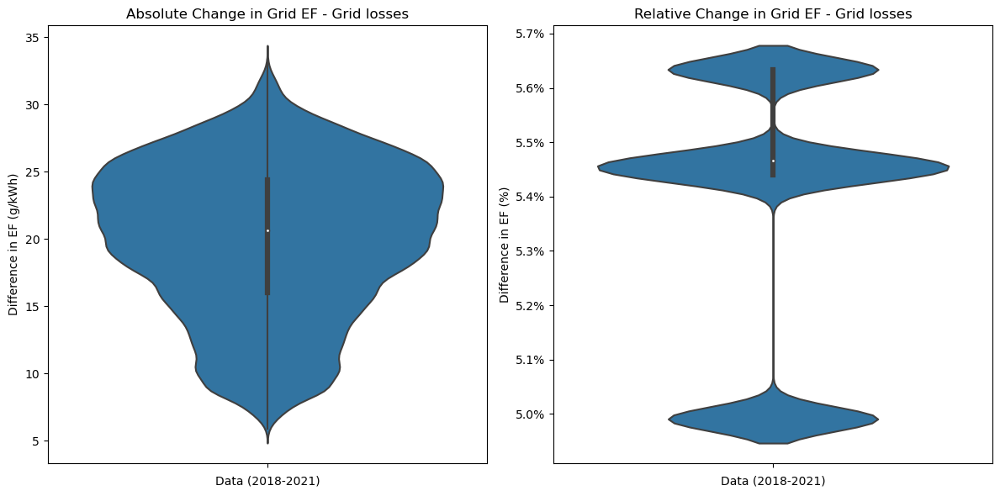

In [112]:
# Create a figure and a 1x2 subplot grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# plot distribution: how much does the ef change when taking into account grid losses (absolute values)
# Create a violin plot for diff_abs on the left subplot
sns.violinplot(y=diff_abs, ax=axes[0])

# Add labels and title
axes[0].set_xlabel('Data (2018-2021)')
axes[0].set_ylabel('Difference in EF (g/kWh)')
axes[0].set_title('Absolute Change in Grid EF - Grid losses')

# plot distribution: how much does the ef change when taking into account grid losses (relative values)
# Create a violin plot for diff_rel on the right subplot
sns.violinplot(y=diff_rel, ax=axes[1])

# Add labels and title
axes[1].set_xlabel('Data (2018-2021)')
axes[1].set_ylabel('Difference in EF (%)')
axes[1].set_title('Relative Change in Grid EF - Grid losses')

# Format the y-axis labels to show percentage
formatter = FuncFormatter(lambda y, _: '{:.1%}'.format(y))
axes[1].yaxis.set_major_formatter(formatter)

# Adjust layout
fig.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '1_checks_internal', 'ef_grid_dl_comparison' + '.png')
#plt.savefig(plot_path)

# Show the plot
plt.show()

# Plot results

In [59]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

## Overall

### EF over time

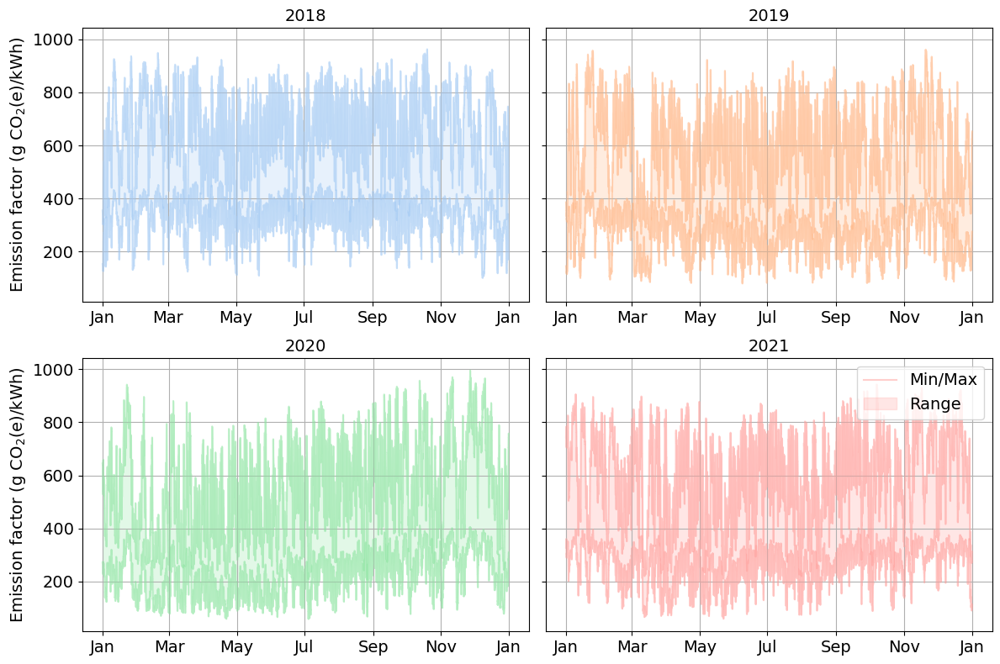

In [12]:
# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Specify the pastel color palette
colors = sns.color_palette("pastel", 4)

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):
    # Subset the DataFrame for the current year
    ef_year = ef[ef['Year'] == year]
    
    # define non-zero columns
    non_zero_columns = ef_year.columns[(ef_year != 0).any()].drop(['DateTime', 'Year'])
    
    # Define function to get min column
    def get_min_column(ef_year, non_zero_columns):
        valid_columns = ef_year[non_zero_columns].columns[ef_year[non_zero_columns].mean() > 10]
        return ef_year[valid_columns].mean().idxmin()
    
    # Get the column with the largest average
    max_column = ef_year[non_zero_columns].mean().idxmax()
    # Get the column with the smallest average
    min_column = get_min_column(ef_year, non_zero_columns)
    
    # Plot the lines and capture the Line2D objects
    line_max, = axs[i].plot(ef_year['DateTime'], ef_year[max_column], color=colors[i], alpha=0.5)
    line_min, = axs[i].plot(ef_year['DateTime'], ef_year[min_column], color=colors[i], alpha=0.5)
    
    # Shade the area between the two columns
    axs[i].fill_between(ef_year['DateTime'], ef_year[max_column], ef_year[min_column], color=colors[i], alpha=0.25)
    
    # Add the year as the title of the subplot
    axs[i].set_title(year, fontsize=14)
    
    # Label y-axis only for the left subplots (0 and 2)
    if i % 2 == 0:
        axs[i].set_ylabel('Emission factor (g CO$_2$(e)/kWh)', fontsize=14)
        
    # Format x-axis
    month_locator = mdates.MonthLocator(interval=2)
    month_formatter = mdates.DateFormatter('%b')
    axs[i].xaxis.set_major_locator(month_locator)
    axs[i].xaxis.set_major_formatter(month_formatter)
    
    axs[i].tick_params(axis='both', labelsize=14)
    axs[i].grid(True, which='major')
    
    # Create patch for legend
    custom_patch = Patch(color=colors[i], alpha=0.25, label='Shaded Area')
    
    # Add legend to the top right corner of the bottom right subplot
    if i == 3:
        axs[i].legend([line_max, custom_patch], ['Min/Max', 'Range'], loc='upper right', fontsize=14)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'overall', 'ef_over_time' + '.png')
plt.savefig(plot_path)

plt.show()

### Mean annual EF, histogram

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1022650221.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1022650221.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1022650221.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1022650221.py:23: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

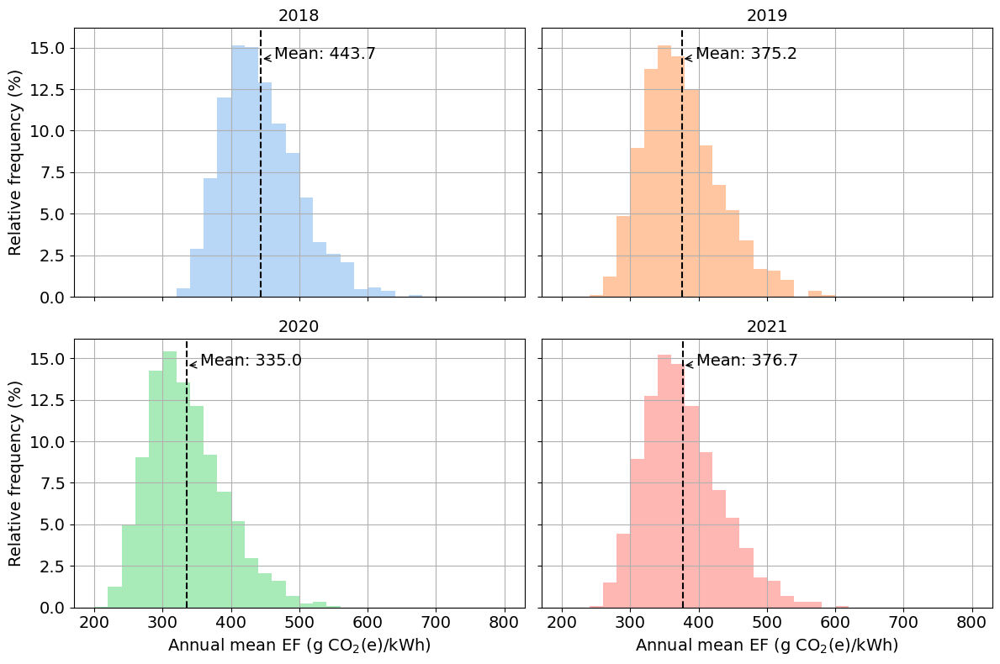

In [13]:
# working copy
df = ef

# Make sure DateTime column is in datetime format
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Extract year from DateTime
df['Year'] = df['DateTime'].dt.year

# Select the columns starting with "ef_"
ef_columns = df.filter(regex='^ef_')

# Initialize a DataFrame to hold the annual mean values
annual_means = pd.DataFrame()

# Loop through each year and calculate the mean
for year in range(2018, 2022):
    # Select the data for this year
    data = df[df['Year'] == year]
    # Calculate the mean of the selected columns
    annual_mean = ef_columns.loc[data.index].mean()
    # Append the result to the annual_means DataFrame
    annual_means = annual_means.append(annual_mean, ignore_index=True)

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()

# Define the bins for the histogram
bins = range(200, 801, 20)

# Define the color palette
palette = sns.color_palette("pastel", 4)

for i, year in enumerate(range(2018, 2022)):
    ax = axs[i]
    
    # Select the data for this year
    data = annual_means.iloc[i]
    
    # Calculate the median
    mean_value = data.mean()
    
    # Plot the histogram
    sns.histplot(data, bins=bins, color=palette[i], edgecolor=None, stat="percent", ax=ax)
    
    # Add median line
    ax.axvline(mean_value, color='k', linestyle='--')
    
    # Add median label
    ax.annotate(f'Mean: {mean_value:.1f}',
                xy=(mean_value, ax.get_ylim()[1] * 0.9), 
                xytext=(mean_value + 20, ax.get_ylim()[1] * 0.9),
                fontsize=14,
                arrowprops=dict(facecolor='black', arrowstyle='->'))
    
    # Set the title and labels
    ax.set_title(year, fontsize = 14)
    ax.set_ylabel('Relative frequency (%)', fontsize = 14)
    ax.set_xlabel('Annual mean EF (g CO$_2$(e)/kWh)', fontsize = 14)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'overall', 'ef_histogram' + '.png')
plt.savefig(plot_path)

plt.show()

## Individual effects

### Define functions

#### Violin plots

##### Single plot (all years in one)

In [44]:
def create_violinplot(df,
                      expressions,
                      save_file=False,
                      file_name='plot.png', 
                      file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                      xtick_labels=None,
                      legend_labels=None,
                      legend_title='Expression'):
    """
    Create a violin plot.
    """
    # Get the first color of the seaborn's pastel color palette
    first_color = sns.color_palette("pastel")[0]
    
    # Generate slight variations of the first color
    color_variations = [(min(1, first_color[0] * factor), 
                         min(1, first_color[1] * factor), 
                         min(1, first_color[2] * factor)) 
                        for factor in [0.8, 0.9, 1, 1.1, 1.2, 1.3]]

    # Make sure the color variations list has the same length as the expressions list
    color_variations = color_variations[:len(expressions)]
    
    # Create a palette dictionary mapping each expression to a color
    palette = {expression: color for expression, color in zip(expressions, color_variations)}

    # Create a violin plot for all years, ensuring the order of the violins match the expressions order
    plt.figure(figsize=(12, 8))
    ax = sns.violinplot(x="Expression", y="value", data=df, palette=palette, order=expressions,
                        inner=None)  # Remove the inner boxplot
    
    # Calculate mean values for each expression
    mean_values = {expression: df[df['Expression'] == expression]['value'].mean()
                   for expression in expressions}

    # Add a dot at the mean position of each violin with grey color
    grey_color = (0.5, 0.5, 0.5)  # RGB tuple for medium grey
    for i, expression in enumerate(expressions):
        mean_val = mean_values[expression]
        ax.scatter(x=i, y=mean_val, zorder=2, color=grey_color)
    
    # Customize the appearance
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    # Calculate the mean values for each expression for all years
    mean_values = {expression: df[df['Expression'] == expression]['value'].mean()
                   for expression in expressions}
    
    # Calculate the differences between mean values and the first expression
    diff_values = {expression: ((mean_values[expression] - mean_values[expressions[0]]) / mean_values[expressions[0]]) * 100
                   for expression in expressions}

    # Add mean values and relative differences as text labels
    label_offset = 30  # Adjust this value to move the labels up or down
    for i, expression in enumerate(expressions):
        mean_val = mean_values[expression]
        offset = 0.0  # Adjust this value to move the labels left or right
        ax.text(i + offset, mean_val + label_offset, f'{mean_val:.0f}', ha='center', va='center', fontsize=14, color='black')
        if i != 0:
            diff = diff_values[expression]
            ax.text(i + offset, mean_val - label_offset, f'({diff:+.1f}%)', ha='center', va='center', fontsize=14, color='black')

    # Set the y-axis label and title
    ax.set_ylabel("Emission factor (g CO$_2$(e)/kWh)", fontsize=14)
    ax.set_xlabel("", fontsize=14)
    #plt.title(plot_title, fontsize=14)

    '''# Manually add a legend, ensuring the order of the legend matches the expressions order
    legend_labels = legend_labels or expressions
    legend_elements = [Patch(facecolor=palette[expression], label=label) for expression, label in zip(expressions, legend_labels)]
    ax.legend(handles=legend_elements, title=legend_title, fontsize=14, title_fontsize=14)'''

    # Customize the x-tick labels if provided
    if xtick_labels is not None:
        ax.set_xticklabels(xtick_labels)
        
    # Save plot if required
    if save_file:
        plot_path = os.path.join(file_path, file_name)
        plt.savefig(plot_path, bbox_inches='tight')
        
    # Show the plot
    plt.show()

##### Multi plot (disaggregated per year)

In [45]:
def create_violinplot_multiyear(df,
                                expressions,
                                save_file=False,
                                file_name='plot.png', 
                                file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                                xtick_labels=None,
                                legend_labels=None,
                                legend_title='Expression'):
    """
    Create a violin plot for each year.
    """
    # Get the first four colors of the Seaborn pastel color palette
    base_colors = sns.color_palette("pastel", 4)  # [blue, green, red, yellow]

    # Create a FacetGrid with 2x2 layout for each year
    g = sns.FacetGrid(df, col="Year", row_order=[2018, 2019, 2020, 2021], height=4, aspect=1.25, col_wrap=2)
    
    # Adjust the spacing at the top of the subplots
    g.fig.subplots_adjust(top=0.9)  # Adjust this value as needed

    # Loop through the axes and their corresponding year values in the 'Year' column
    for ax_idx, (ax, year) in enumerate(zip(g.axes.flat, g.col_names)):
        # Get the base color for this subplot
        base_color = base_colors[ax_idx % 4]
        
        # Generate slight variations of the base color
        color_variations = [(min(1, base_color[0] * factor), 
                             min(1, base_color[1] * factor), 
                             min(1, base_color[2] * factor)) 
                            for factor in [0.8, 0.9, 1, 1.1, 1.2, 1.3]]

        # Create a palette dictionary mapping each expression to a color
        palette = {expression: color for expression, color in zip(expressions, color_variations)}

        # Create the violin plots for this subplot
        sns.violinplot(x="Expression", y="value", data=df[df['Year'] == year], palette=palette, ax=ax, order=expressions, inner=None)

        # Calculate mean values and differences for this year
        year_df = df[df['Year'] == year]
        mean_values = {expression: year_df[year_df['Expression'] == expression]['value'].mean()
                       for expression in expressions}
        diff_values = {expression: ((mean_values[expression] - mean_values[expressions[0]]) / mean_values[expressions[0]]) * 100
                       for expression in expressions}

        # Add grey dots at mean positions and text labels
        grey_color = (0.5, 0.5, 0.5)  # RGB tuple for medium grey
        label_offset = 45  # Adjust this value to move the labels up or down
        for i, expression in enumerate(expressions):
            mean_val = mean_values[expression]
            ax.scatter(x=i, y=mean_val, zorder=2, color=grey_color)
            ax.text(i, mean_val + label_offset, f'{mean_val:.0f}', ha='center', va='center', fontsize=14, color='black')
            if i != 0:
                diff = diff_values[expression]
                ax.text(i, mean_val - label_offset, f'({diff:+.1f}%)', ha='center', va='center', fontsize=14, color='black')

        # Set title and labels for this subplot
        ax.set_title(year, fontsize=14)
        ax.set_xlabel("")
        ax.set_ylabel("Emission factor (g CO$_2$(e)/kWh)", fontsize=14)
        ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)

    # Customize the x-tick labels if provided
    if xtick_labels is not None:
        g.set_xticklabels(xtick_labels, fontsize=14)
    else:
        g.set_xticklabels(expressions, fontsize=14)

    # After creating the plot but before plt.show()
    plt.tight_layout()  # Adjust layout to fit all elements

    # Save plot if required
    if save_file:
        plot_path = os.path.join(file_path, file_name)
        plt.savefig(plot_path, bbox_inches='tight') 

    plt.show()  # Show the plot

### Sample data
To reduce computational load, we only plot a sample of the data. To ensure the sample data is representative of the whole dataset, we test this here.

#### Create

In [103]:
# part 1: define expressions of interest
# here: use impact metric as example

# working copy
df = ef # adjust if necessary

# optional: ignore warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Create a dictionary of patterns for each expression
expressions = {
    'gwp100': '_gwp100_|DateTime|Year', # adjust
    'co2': '_co2_|DateTime|Year', # adjust
    'gwp20': '_gwp20_|DateTime|Year' # adjust
}

# Initialize an empty dictionary to hold the DataFrames
df_dict = {}

# Loop over the expressions and process each one
for expression, pattern in expressions.items():
    # Subset the DataFrame
    df_subset = df.filter(regex=pattern)
    # Add 'Year' back to the DataFrame
    df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
    # Melt the DataFrame
    df_subset = df_subset.melt(id_vars=['DateTime', 'Year'], var_name='column', value_name='value')
    # Add 'expression' column
    df_subset['Expression'] = expression
    # Store the DataFrame in the dictionary
    df_dict[expression] = df_subset

# Concatenate the dataframes
df_expression = pd.concat(df_dict.values())

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Year'] = df_subset['DateTime'].dt.year.astype('i4')
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_15732\412587775.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [104]:
# part 2: pick a random sample from the data

sample_size = int(0.10 * len(df_expression)) # e.g. 10 % of the dataframe's length
df_sample = df_expression.sample(n=sample_size)

#### Test

In [105]:
# part 3: test how representative the sample is

# Get the list of numeric columns
numeric_cols = df_expression.select_dtypes(include=[np.number]).columns.tolist()

# Initialize an empty dataframe to store the results
results = pd.DataFrame(columns=['Column',
                                'Population_Mean',
                                'Sample_Mean',
                                'Population_Median',
                                'Sample_Median',
                                'Population_Std',
                                'Sample_Std'])

# Loop over the numeric columns and calculate the statistics
for col in numeric_cols:
    pop_mean = df_expression[col].mean()
    sample_mean = df_sample[col].mean()
    pop_median = df_expression[col].median()
    sample_median = df_sample[col].median()
    pop_std = df_expression[col].std()
    sample_std = df_sample[col].std()
    
    results = results.append({
        'Column': col,
        'Population_Mean': pop_mean,
        'Sample_Mean': sample_mean,
        'Population_Median': pop_median,
        'Sample_Median': sample_median,
        'Population_Std': pop_std,
        'Sample_Std': sample_std
    }, ignore_index=True)

print(results)

  Column  Population_Mean  Sample_Mean  Population_Median  Sample_Median  \
0   Year      2019.500342  2019.500511        2020.000000    2020.000000   
1  value       383.021393   383.038526         385.636066     385.656449   

   Population_Std  Sample_Std  
0        1.117728    1.117731  
1      126.029844  126.023916  


#### Save

In [22]:
# Define the path where the pickle file will be stored
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_sample_10percent_plots.pkl')


# Save the dataframe to a pickle file
df_sample.to_pickle(pickle_path)

### Create plots

In [16]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_sample_10percent_plots.pkl')

# Load the pickle file into a DataFrame
df_sample = pd.read_pickle(pickle_path)

#### Impact metric

##### Prepare data

In [46]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["co2", "gwp100", "gwp20"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,gwp100
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,gwp100
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,gwp100
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,gwp20
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,gwp20
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,gwp20
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,gwp20
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,gwp100
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,gwp20


##### Violin plot

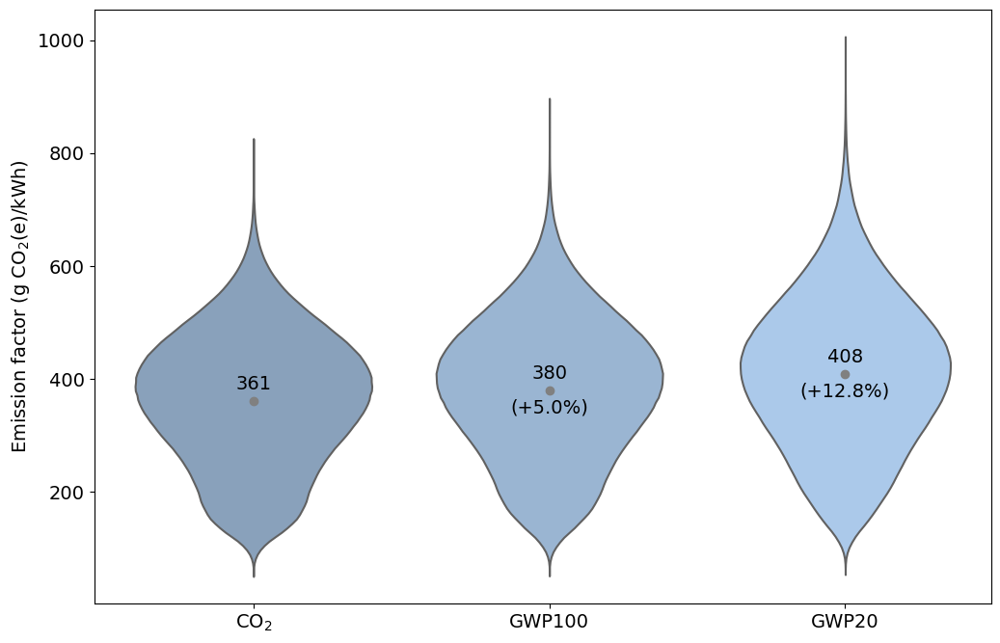

In [47]:
# create plot
create_violinplot(df_sample,
                  ["co2", "gwp100", "gwp20"],
                  save_file=True,
                  file_name='impact_metric.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_title='Impact metric')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


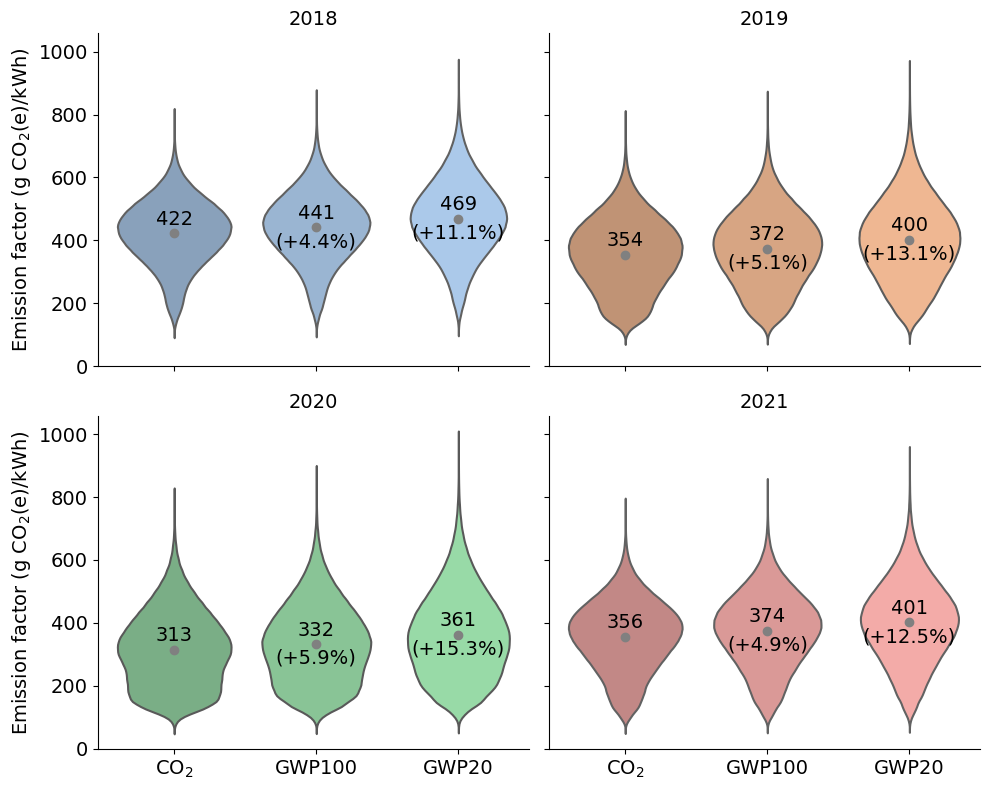

In [48]:
# create multiplot
create_violinplot_multiyear(df_sample,
                  ["co2", "gwp100", "gwp20"],
                  save_file=True,
                  file_name='impact_metric.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_labels=["CO$_2$", "GWP100", "GWP20"],
                  legend_title='Impact metric')

#### System boundaries

##### Prepare data

In [49]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["op", "lc"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,op
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,lc
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,lc
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,lc
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,lc
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,lc
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,lc
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,lc
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,op


##### Violin plot

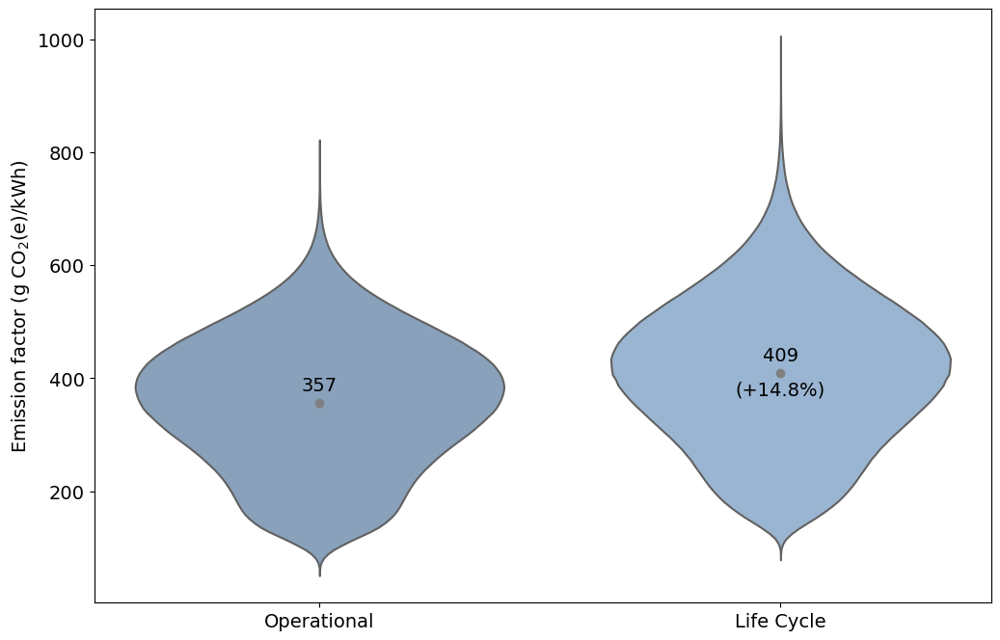

In [50]:
# create plot
create_violinplot(df_sample,
                  ["op", "lc"],
                  save_file=True,
                  file_name='system_boundaries.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["Operational", "Life Cycle"],
                  legend_labels=["Operational", "Life Cycle"],
                  legend_title='System boundaries')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


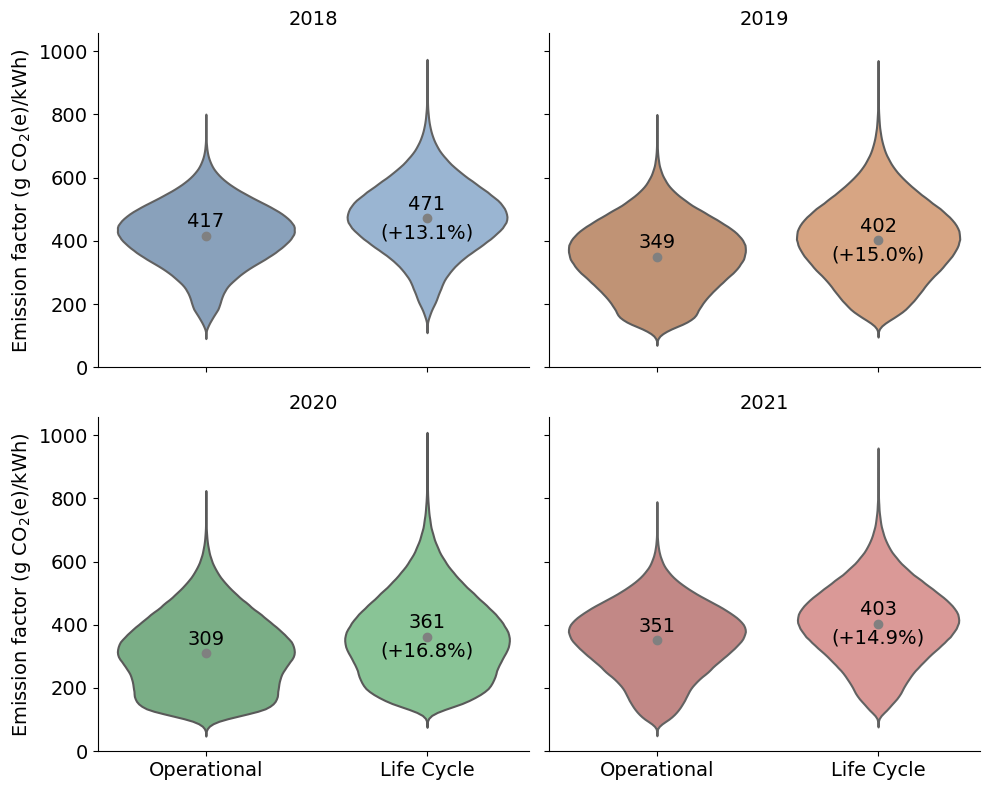

In [51]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["op", "lc"], 
                  save_file=True,
                  file_name='system_boundaries.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["Operational", "Life Cycle"],
                  legend_labels=["Operational", "Life Cycle"],
                  legend_title='System boundaries')

#### Co-generation of heat

##### Prepare data

In [52]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["th100", "en", "iea", "uba", "ex", "el100"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,en
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,iea
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,th100
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,uba
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,el100
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,uba
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,th100
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,uba
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,uba


##### Violin plot

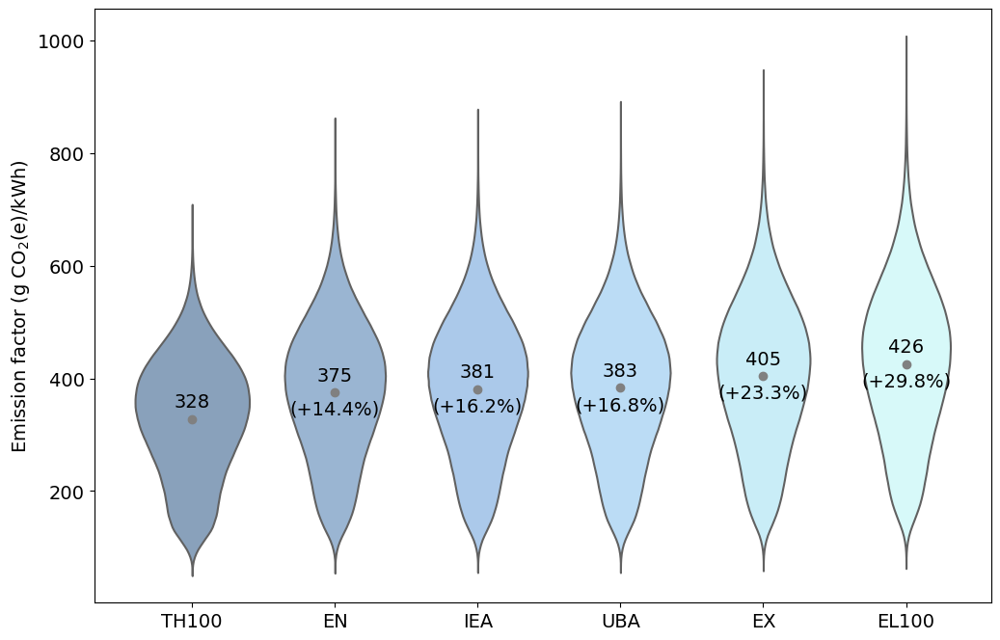

In [53]:
# create plot
create_violinplot(df_sample,
                  ["th100", "en", "iea", "uba", "ex", "el100"],
                  save_file=True,
                  file_name='cogen_allocation.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_title='Allocation method')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


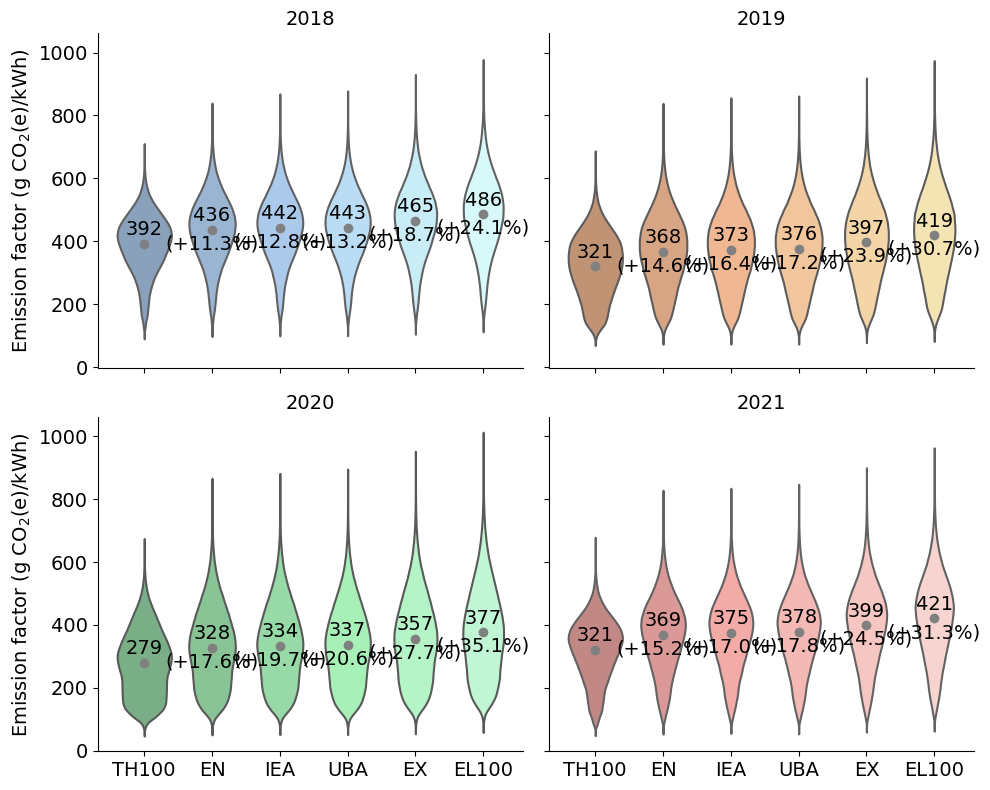

In [54]:
# create plot - caution: different function
create_violinplot_multiyear(df_sample,
                  ["th100", "en", "iea", "uba", "ex", "el100"], 
                  save_file=True,
                  file_name='cogen_allocation.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_labels=["TH100", "EN", "IEA", "UBA", "EX", "EL100"],
                  legend_title='Allocation method')

#### Auxiliary consumption

##### Prepare data

In [55]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["gep", "nep"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,nep
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,nep
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,gep
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,gep
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,nep
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,gep
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,gep
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,nep
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,gep


##### Violin plot

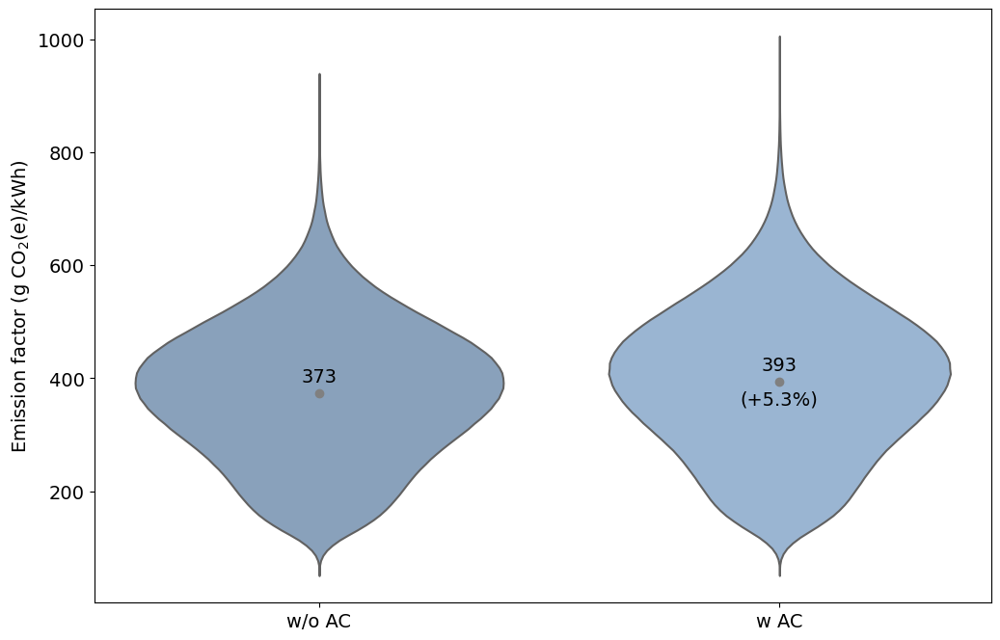

In [56]:
# create plot
create_violinplot(df_sample,
                  ["gep", "nep"],
                  save_file=True,
                  file_name='aux_cons.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o AC", "w AC"],
                  legend_labels=["w/o AC", "w AC"],
                  legend_title='Auxiliary consumption (AC)')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


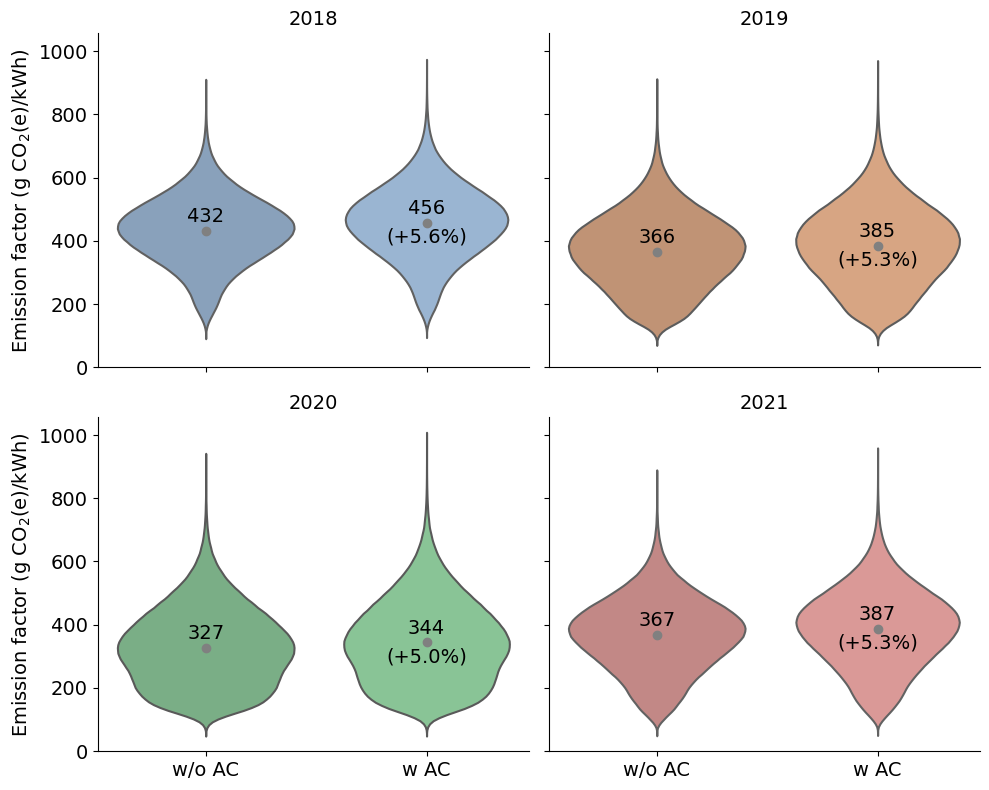

In [57]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["gep", "nep"], 
                  save_file=True,
                  file_name='aux_cons.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o AC", "w AC"],
                  legend_labels=["w/o AC", "w AC"],
                  legend_title='Auxiliary consumption (AC)')

#### Auto-producers

##### Prepare data

In [58]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["maponly", "apemissions", "apenergy", "mapap"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,maponly
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,maponly
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,maponly
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,apenergy
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,maponly
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,apenergy
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,maponly
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,apemissions
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,apenergy


##### Violin plot

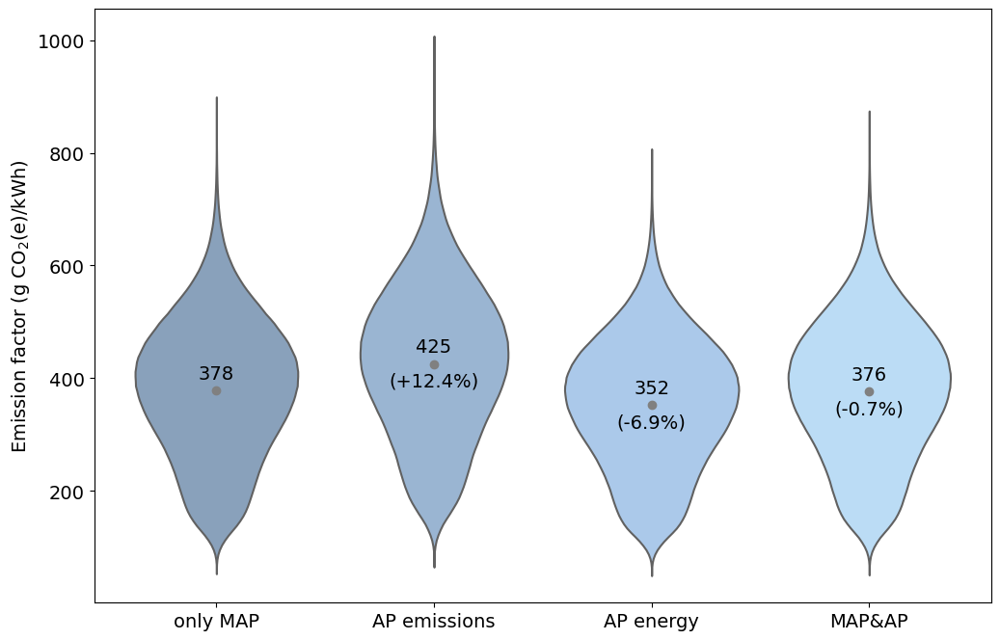

In [59]:
# create plot
create_violinplot(df_sample,
                  ["maponly", "apemissions", "apenergy", "mapap"],
                  save_file=True,
                  file_name='ap.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["only MAP", "AP emissions", "AP energy", "MAP&AP"],
                  legend_labels=["only MAP", "AP emissions", "AP energy", "MAP&AP"],
                  legend_title='Auto-producers')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


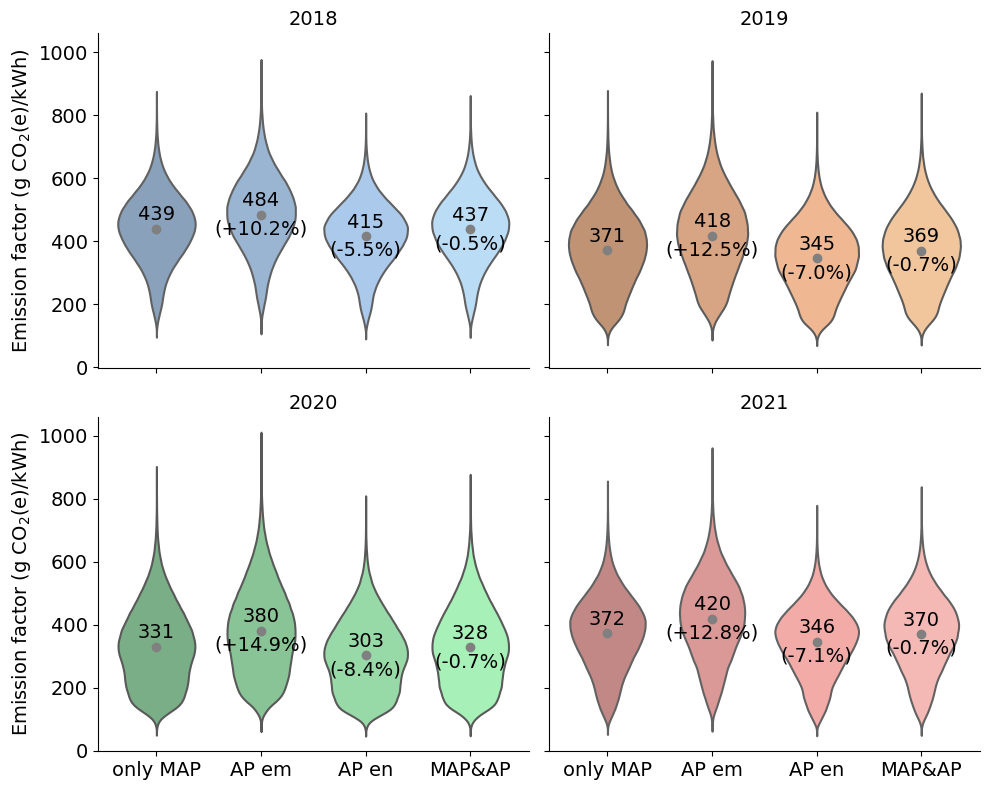

In [60]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["maponly", "apemissions", "apenergy", "mapap"],
                  save_file=True,
                  file_name='ap.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["only MAP", "AP em", "AP en", "MAP&AP"],
                  legend_labels=["only MAP", "AP em", "AP en", "MAP&AP"],
                  legend_title='Auto-producers')

#### Temporal resolution

##### Effect of EF only
Here, we calculate the degree to which high resolution EF can differ from low resolution EF. However, this shows a large effect, which is not directly comparable to the other effects shown in this section. The HR EF min and max may be very far from the mean, but the effect on the resulting overall emissions is neglibible, since these extremes are rare. For this reason, we calculate the effect of using HR in emission accounting further down.

In [4]:
# step 1: calculate the values (means, deviations)

# 1. Calculate the annual mean for each column
annual_means = ef.filter(like='ef_').groupby(ef['Year']).mean()

# 2. Calculate the relative differences
def positive_deviation(x):
    return (x.max() - x.mean()) / x.mean()

def negative_deviation(x):
    return (x.min() - x.mean()) / x.mean()

deviations = ef.filter(like='ef_').groupby(ef['Year']).agg({
    col: [positive_deviation, negative_deviation] for col in ef.columns if col.startswith('ef_')
})

# 3. Get the maximum positive and negative deviations across all columns
max_positive_deviation = deviations.xs('positive_deviation', axis=1, level=1).max(axis=1)
max_negative_deviation = deviations.xs('negative_deviation', axis=1, level=1).max(axis=1)

# Results
print(annual_means)
print(max_positive_deviation)
print(max_negative_deviation)

      ef_gep_co2_op_el100_maponly_prod_noph_nodl  \
Year                                               
2018                                  424.186234   
2019                                  362.255995   
2020                                  321.097421   
2021                                  366.780680   

      ef_gep_co2_op_el100_apenergy_prod_noph_nodl  \
Year                                                
2018                                   399.115975   
2019                                   334.842978   
2020                                   291.936695   
2021                                   338.495406   

      ef_gep_co2_op_el100_apemissions_prod_noph_nodl  \
Year                                                   
2018                                      466.367487   
2019                                      406.748130   
2020                                      368.189680   
2021                                      412.488690   

      ef_gep_co2_op_el100_mapap

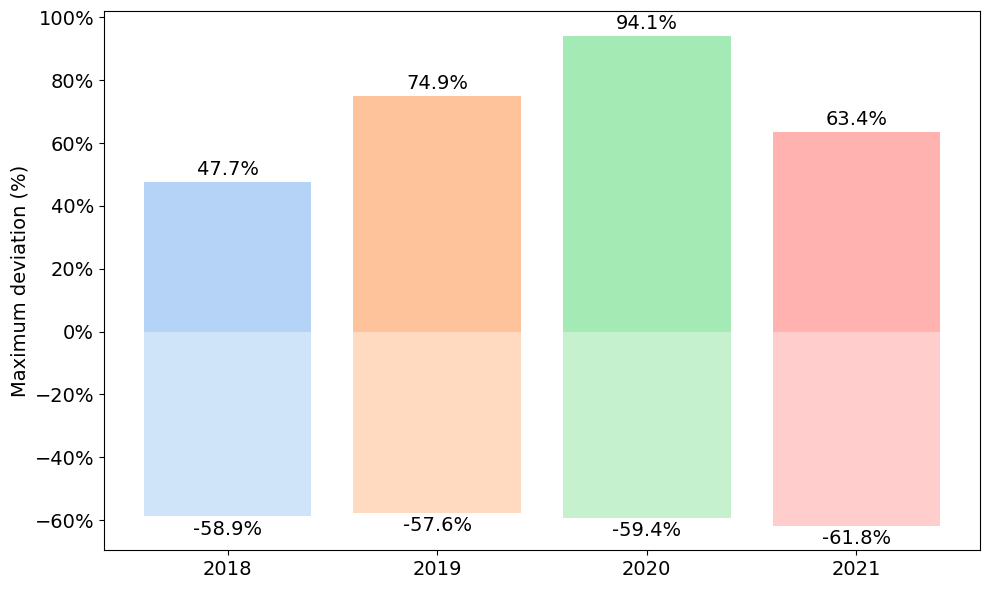

In [8]:
# plot effect

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")[:4]  # Extract the first four colors

years = max_positive_deviation.index

# Plotting
plt.figure(figsize=(10, 6))

# Iterate over the years and plot each bar with the corresponding color
for i, year in enumerate(years):
    # Positive deviations with a higher alpha
    plt.bar(year, max_positive_deviation.iloc[i] * 100, color=colors[i], alpha=0.8, label=f'{year} Max. pos. (+) deviation' if i == 0 else "")
    
    # Negative deviations with a lower alpha
    plt.bar(year, max_negative_deviation.iloc[i] * 100, color=colors[i], alpha=0.5, label=f'{year} Max. neg. (-) deviation' if i == 0 else "")
    
    plt.text(year, (max_positive_deviation.iloc[i] + 0.01) * 100, f"{max_positive_deviation.iloc[i] * 100:.1f}%", ha='center', va='bottom', fontsize=14)
    plt.text(year, (max_negative_deviation.iloc[i] - 0.01) * 100, f"{max_negative_deviation.iloc[i] * 100:.1f}%", ha='center', va='top', fontsize=14)

# Labeling and title
plt.ylabel('Maximum deviation (%)', fontsize=14)
#plt.title('Max Positive and Negative Deviation per Year', fontsize=14)
#plt.legend(fontsize=14)
plt.xticks(years, fontsize=14)  # Set x-ticks for full years
plt.yticks(fontsize=14)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.PercentFormatter(100))  # Convert y-axis to percentages

# Remove x-axis label
plt.xlabel('')

# Display the plot
plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'ef_max_deviation' + '.png')
plt.savefig(plot_path)

plt.show()

##### Effect in emission accounting
Here, we combine the EF with an electric load profile (LP) of a consumer, to find out the degree to which the temporal resolution has an effect on overall emissions.

In [37]:
# step 1: import

# Define path
path = os.path.join('..', '1_data', '1_raw', 'Load profile', 'blb_load_el_2020_2022.csv')
#pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_gep_nep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load
lp = pd.read_csv(path)
#ef = pd.read_pickle(pickle_path)

In [38]:
# step 2: create high resolution load profile for the consumer

# Convert the 'Datetime' column to a pandas datetime object (if not already done)
lp['Datetime'] = pd.to_datetime(lp['Datetime'])

# Filter the DataFrame to include only rows from the year 2021
lp_2021 = lp[lp['Datetime'].dt.year == 2021]

# calculate mean load
lp_2021['load_mean'] = lp_2021['load_kW'].mean()

# rename
lp_2021.rename(columns={"Datetime": "DateTime"}, inplace=True)

lp_2021 # unit: kW

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1695371363.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lp_2021['load_mean'] = lp_2021['load_kW'].mean()
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\1695371363.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lp_2021.rename(columns={"Datetime": "DateTime"}, inplace=True)


,DateTime,load_kW,load_mean
24239,2021-01-01 00:00:00,9.185031,48.559505
24240,2021-01-01 00:15:00,9.207808,48.559505
24241,2021-01-01 00:30:00,9.238449,48.559505
24242,2021-01-01 00:45:00,9.141300,48.559505
24243,2021-01-01 01:00:00,9.316424,48.559505
...,...,...,...
59274,2021-12-31 22:45:00,8.745683,48.559505
59275,2021-12-31 23:00:00,8.432545,48.559505
59276,2021-12-31 23:15:00,8.501255,48.559505
59277,2021-12-31 23:30:00,8.553713,48.559505


In [39]:
# step 3: limit the EF data to time period and choice of interest

# limit to ef_nep columns
desired_columns = ['DateTime', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'] # limit to only one ef
ef = ef[desired_columns]
ef['ef_mean'] = ef['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'].mean()

# Filter the DataFrame to include only rows from the year 2021
ef_2021 = ef[ef['DateTime'].dt.year == 2021]
ef_2021.rename(columns={"ef_nep_gwp100_lc_ex_maponly_cons_ph_dl": "ef"}, inplace=True)

ef_2021 # unit: g/kWh

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3233536552.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ef['ef_mean'] = ef['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'].mean()
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3233536552.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ef_2021.rename(columns={"ef_nep_gwp100_lc_ex_maponly_cons_ph_dl": "ef"}, inplace=True)


,DateTime,ef,ef_mean
105216,2021-01-01 00:00:00,526.756641,433.123037
105217,2021-01-01 00:15:00,526.756641,433.123037
105218,2021-01-01 00:30:00,526.756641,433.123037
105219,2021-01-01 00:45:00,526.756641,433.123037
105220,2021-01-01 01:00:00,532.765752,433.123037
...,...,...,...
140251,2021-12-31 22:45:00,218.428478,433.123037
140252,2021-12-31 23:00:00,216.266812,433.123037
140253,2021-12-31 23:15:00,216.266812,433.123037
140254,2021-12-31 23:30:00,216.266812,433.123037


In [40]:
# step 4: merge ef and lp data
df_2021 = pd.merge(lp_2021, ef_2021, on="DateTime")
df_2021['DateTime'] = pd.to_datetime(df_2021['DateTime'])
df_2021

,DateTime,load_kW,load_mean,ef,ef_mean
0,2021-01-01 00:00:00,9.185031,48.559505,526.756641,433.123037
1,2021-01-01 00:15:00,9.207808,48.559505,526.756641,433.123037
2,2021-01-01 00:30:00,9.238449,48.559505,526.756641,433.123037
3,2021-01-01 00:45:00,9.141300,48.559505,526.756641,433.123037
4,2021-01-01 01:00:00,9.316424,48.559505,532.765752,433.123037
...,...,...,...,...,...
35035,2021-12-31 22:45:00,8.745683,48.559505,218.428478,433.123037
35036,2021-12-31 23:00:00,8.432545,48.559505,216.266812,433.123037
35037,2021-12-31 23:15:00,8.501255,48.559505,216.266812,433.123037
35038,2021-12-31 23:30:00,8.553713,48.559505,216.266812,433.123037


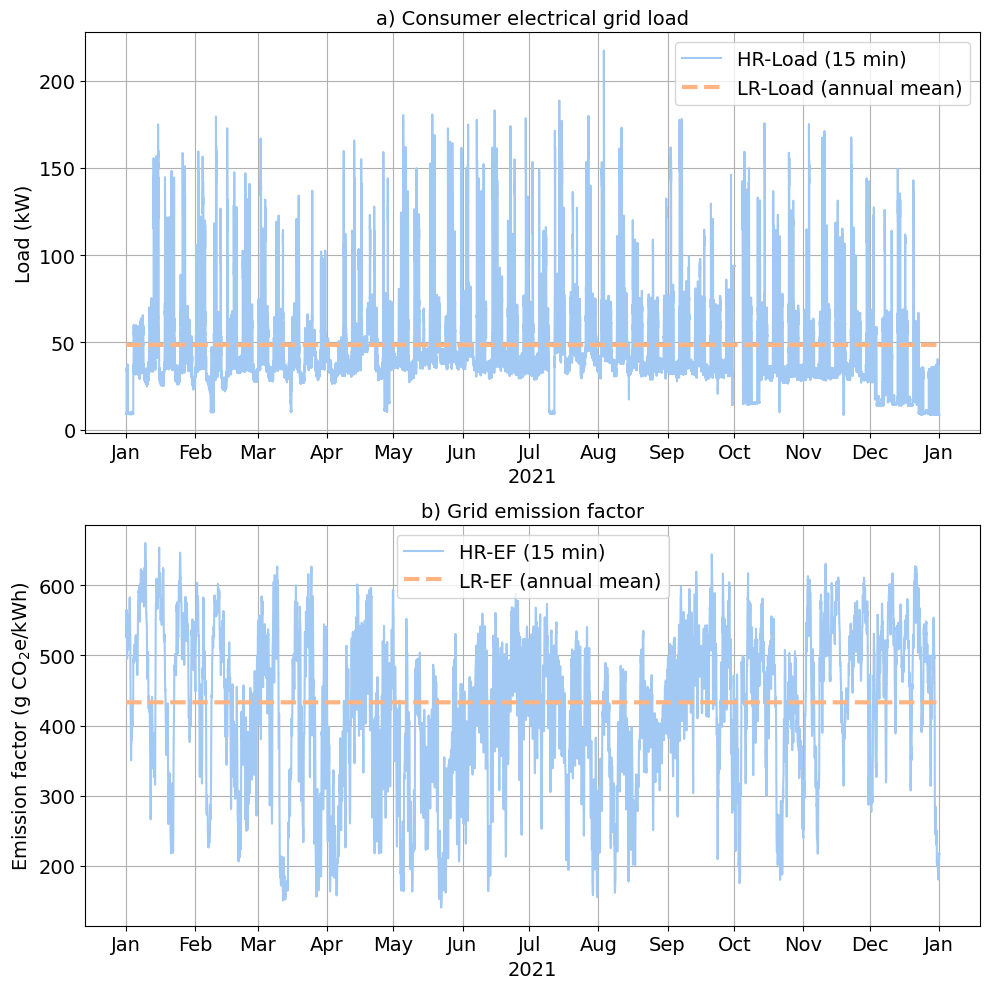

In [41]:
# working copy
df = df_2021.copy()

# Set the 'Datetime' column as the index (if not already set)
df.set_index('DateTime', inplace=True)

# Create a line plot with two subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))  # Create a figure and two subplots (2 rows, 1 column)

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Plot the first subplot
axs[0].plot(df.index, df['load_kW'], label='HR-Load (15 min)', color=colors[0])
axs[0].plot(df.index, df['load_mean'], label='LR-Load (annual mean)', linestyle='--', linewidth=3, color=colors[1])  # Plot the mean load
axs[0].set_xlabel('2021', fontsize=14)
axs[0].set_ylabel('Load (kW)', fontsize=14)
axs[0].set_title('a) Consumer electrical grid load', fontsize=14)
axs[0].grid(True)  # Optional: add gridlines to the plot
axs[0].legend(fontsize=14)  # Add a legend

# Define the x-ticks as the start of each month and label them as "Jan", "Feb", "Mar", etc.
month_locator = mdates.MonthLocator()
month_formatter = mdates.DateFormatter('%b')  # %b represents the abbreviated month name (Jan, Feb, Mar, etc.)
axs[0].xaxis.set_major_locator(month_locator)
axs[0].xaxis.set_major_formatter(month_formatter)
axs[0].tick_params(axis='both', which='major', labelsize=14)

# Plot the second subplot
axs[1].plot(df.index, df['ef'], label='HR-EF (15 min)', color=colors[0])
axs[1].plot(df.index, df['ef_mean'], label='LR-EF (annual mean)',  linestyle='--', linewidth=3, color=colors[1])
axs[1].set_xlabel('2021', fontsize=14)
axs[1].set_ylabel('Emission factor (g CO$_2$e/kWh)', fontsize=14)
axs[1].set_title('b) Grid emission factor', fontsize=14)
axs[1].grid(True)  # Optional: add gridlines to the plot
axs[1].legend(fontsize=14)  # Add a legend

# Define the x-ticks as the start of each month and label them as "Jan", "Feb", "Mar", etc.
axs[1].xaxis.set_major_locator(month_locator)
axs[1].xaxis.set_major_formatter(month_formatter)
axs[1].tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()  # Optional: adjust the spacing of plot elements for better appearance

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'ef_blb_gridload_2021' + '.png')
plt.savefig(plot_path)

plt.show()

In [109]:
# step 6: preparation for plot 2

# calculate high and low resultion emissions
df['em_hr'] = df['load_kW'] * df['ef'] / 4 * 1e-6
df['em_lr'] = df['load_mean'] * df['ef_mean'] / 4 * 1e-6
df # unit (new columns): kW * h * g/kWh * 1e-6 = t

,load_kW,load_mean,ef,ef_mean,em_hr,em_lr
DateTime,,,,,,
2021-01-01 00:00:00,9.185031,48.559505,526.616614,433.028701,0.001209,0.005257
2021-01-01 00:15:00,9.207808,48.559505,526.616614,433.028701,0.001212,0.005257
2021-01-01 00:30:00,9.238449,48.559505,526.616614,433.028701,0.001216,0.005257
2021-01-01 00:45:00,9.141300,48.559505,526.616614,433.028701,0.001203,0.005257
2021-01-01 01:00:00,9.316424,48.559505,532.623046,433.028701,0.001241,0.005257
...,...,...,...,...,...,...
2021-12-31 22:45:00,8.745683,48.559505,218.361174,433.028701,0.000477,0.005257
2021-12-31 23:00:00,8.432545,48.559505,216.200511,433.028701,0.000456,0.005257
2021-12-31 23:15:00,8.501255,48.559505,216.200511,433.028701,0.000459,0.005257


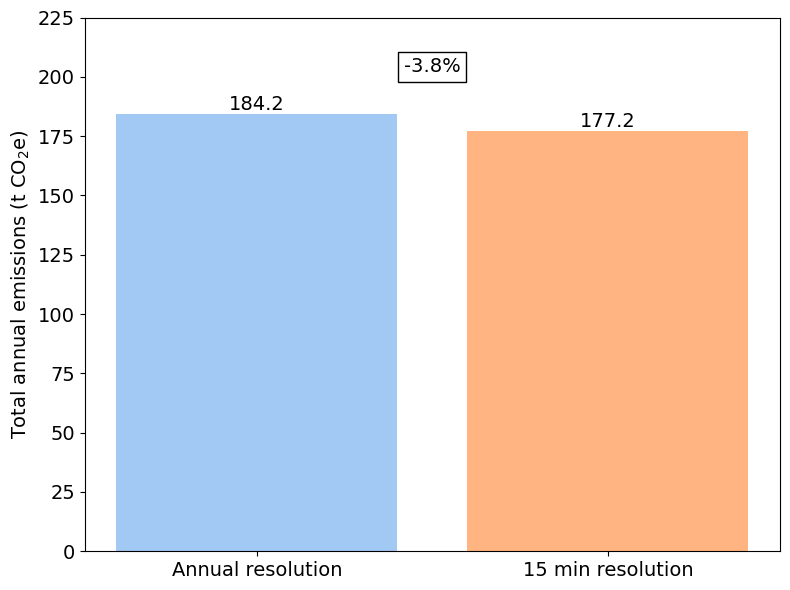

In [111]:
# Calculate the sum of 'em_lr' and 'em_hr'
em_lr_sum = df['em_lr'].sum()
em_hr_sum = df['em_hr'].sum()

# Calculate the relative difference
relative_diff = (em_hr_sum - em_lr_sum) / em_lr_sum * 100

# Data for plotting
bars = ['em_lr', 'em_hr']
heights = [em_lr_sum, em_hr_sum]

# Create a bar plot
fig, ax = plt.subplots(figsize=(8, 6))

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")
bar_plot = ax.bar(bars, heights, color=colors)

# Add data values on top of the bars
for bar in bar_plot:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval + 0.01,
            round(yval, 1), ha='center', va='bottom', fontsize=14)

# Add the relative difference between the bars
ax.text(0.5, max(heights) + 20, f'{relative_diff:.1f}%', 
        ha='center', va='center', color='black', bbox=dict(facecolor='none', edgecolor='black'), fontsize=14)

# label y axis
plt.ylabel('Total annual emissions (t CO$_2$e)', fontsize=14)

# Custom x-tick labels
custom_labels = ['Annual resolution', '15 min resolution']
plt.xticks(range(len(bars)), custom_labels, fontsize=14)
ax.tick_params(axis='y', labelsize=14)  # Set y-tick label font size to 14

# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, 225)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'temp res', 'blb_emissions_lr_hr' + '.png')
plt.savefig(plot_path)

plt.tight_layout()
plt.show()

#### Electricity trading

##### Prepare data

In [61]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["prod", "cons"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,cons
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,prod
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,cons
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,cons
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,cons
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,prod
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,prod
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,prod
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,cons


##### Violin plot

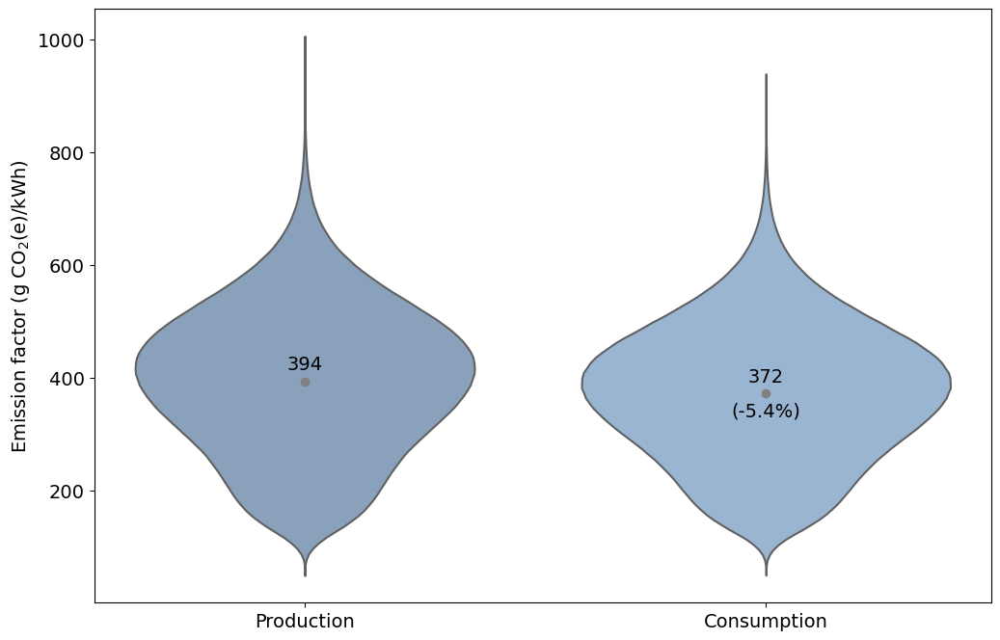

In [62]:
# create plot
create_violinplot(df_sample,
                  ["prod", "cons"],
                  save_file=True,
                  file_name='trade.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["Production", "Consumption"],
                  legend_labels=["Production", "Consumption"],
                  legend_title='Perspective')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


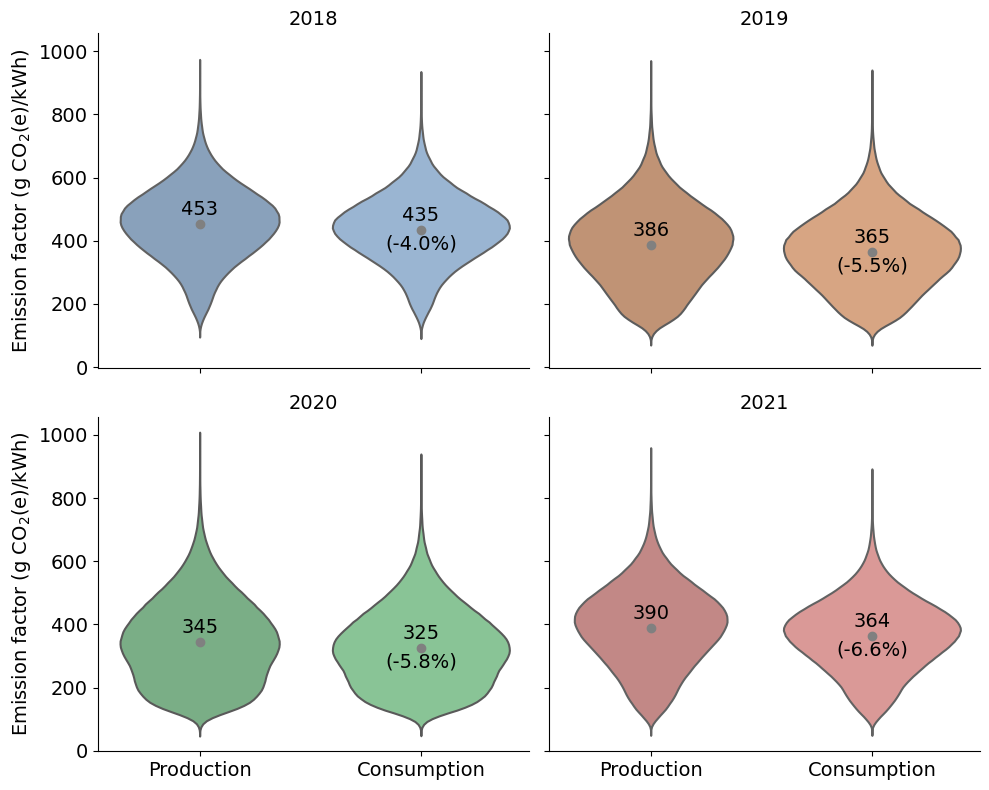

In [63]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["prod", "cons"],
                  save_file=True,
                  file_name='trade.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["Production", "Consumption"],
                  legend_labels=["Production", "Consumption"],
                  legend_title='Perspective')

##### Trading flows

In [28]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'pf_core_corr.pkl')
pickle_path2 = os.path.join('..', '1_data', '2_interim', 'ef_neighbors.pkl')

# Load the pickle file into a DataFrame
pf = pd.read_pickle(pickle_path)
ef_n = pd.read_pickle(pickle_path2)

# replace nan values with zeros
pf = pf.replace(np.nan, 0.0)
ef_n = ef_n.replace(np.nan, 0.0)

In [23]:
# choose one column
trade = pd.merge(ef[['DateTime', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl']], pf, on='DateTime')
trade = pd.merge(trade, ef_n, left_on=['DateTime', 'OutMapCode'], right_on=['DateTime', 'MapCode'])
trade

,DateTime,ef_nep_gwp100_lc_ex_maponly_cons_ph_dl,InMapCode,OutMapCode,FlowValue_corr,MapCode,ef
0,2018-01-01 00:00:00,252.773825,DE,DK,0.000000,DK,190.193750
1,2018-01-01 00:00:00,252.773825,DK,DE,521.448461,DE,235.767405
2,2018-01-01 00:00:00,252.773825,AT,DE,833.758150,DE,235.767405
3,2018-01-01 00:00:00,252.773825,BE,DE,0.000000,DE,235.767405
4,2018-01-01 00:00:00,252.773825,CH,DE,986.819929,DE,235.767405
...,...,...,...,...,...,...,...
3085627,2021-12-31 23:45:00,216.266812,DE,LU,0.000000,LU,384.603783
3085628,2021-12-31 23:45:00,216.266812,DE,NL,432.638311,NL,381.948404
3085629,2021-12-31 23:45:00,216.266812,DE,NO,0.000000,NO,24.551835
3085630,2021-12-31 23:45:00,216.266812,DE,PL,0.369149,PL,654.907497


In [24]:
# Create a new column 'em_out' for rows where 'OutMapCode' is 'DE'
trade.loc[trade['OutMapCode'] == 'DE', 'em_out'] = trade['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'] * trade['FlowValue_corr']

# Create a new column 'em_in' for rows where 'InMapCode' is 'DE'
trade.loc[trade['InMapCode'] == 'DE', 'em_in'] = trade['ef'] * trade['FlowValue_corr']

# Display the updated DataFrame
trade # em: unit kg

,DateTime,ef_nep_gwp100_lc_ex_maponly_cons_ph_dl,InMapCode,OutMapCode,FlowValue_corr,MapCode,ef,em_out,em_in
0,2018-01-01 00:00:00,252.773825,DE,DK,0.000000,DK,190.193750,NaN,0.000000
1,2018-01-01 00:00:00,252.773825,DK,DE,521.448461,DE,235.767405,131808.522057,NaN
2,2018-01-01 00:00:00,252.773825,AT,DE,833.758150,DE,235.767405,210752.236869,NaN
3,2018-01-01 00:00:00,252.773825,BE,DE,0.000000,DE,235.767405,0.000000,NaN
4,2018-01-01 00:00:00,252.773825,CH,DE,986.819929,DE,235.767405,249442.248059,NaN
...,...,...,...,...,...,...,...,...,...
3085627,2021-12-31 23:45:00,216.266812,DE,LU,0.000000,LU,384.603783,NaN,0.000000
3085628,2021-12-31 23:45:00,216.266812,DE,NL,432.638311,NL,381.948404,NaN,165245.512513
3085629,2021-12-31 23:45:00,216.266812,DE,NO,0.000000,NO,24.551835,NaN,0.000000
3085630,2021-12-31 23:45:00,216.266812,DE,PL,0.369149,PL,654.907497,NaN,241.758491


In [25]:
# refine
df = trade[['DateTime', 'em_out', 'em_in', 'OutMapCode', 'InMapCode', 'FlowValue_corr']]
df['Year'] = df['DateTime'].dt.year.astype('i4')
df = df.groupby(['Year', 'InMapCode', 'OutMapCode'])[['FlowValue_corr', 'em_in', 'em_out']].sum().reset_index()

# Filter data for year 2021
df_2021 = df[df['Year'] == 2021]
#df = df_2021
df_2021

# unit: flow: MWh, em: kg

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\3417215401.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df['DateTime'].dt.year.astype('i4')


,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out
66,2021,AT,DE,1.476603e+07,0.000000e+00,6.212838e+09
67,2021,BE,DE,5.249051e+06,0.000000e+00,2.252466e+09
68,2021,CH,DE,1.929773e+07,0.000000e+00,8.395458e+09
69,2021,CZ,DE,3.195330e+06,0.000000e+00,1.197481e+09
70,2021,DE,AT,6.668780e+06,6.821380e+08,0.000000e+00
71,2021,DE,BE,4.196587e+06,6.861645e+08,0.000000e+00
72,2021,DE,CH,2.336122e+06,6.665305e+07,0.000000e+00
73,2021,DE,CZ,3.526702e+06,1.875488e+09,0.000000e+00
74,2021,DE,DK,1.094673e+07,3.896765e+09,0.000000e+00
75,2021,DE,FR,5.563231e+06,4.396091e+08,0.000000e+00


C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\geopandas\plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:
C:\Users\mschaefer\.conda\envs\ef_paper\Lib\site-packages\geopandas\plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


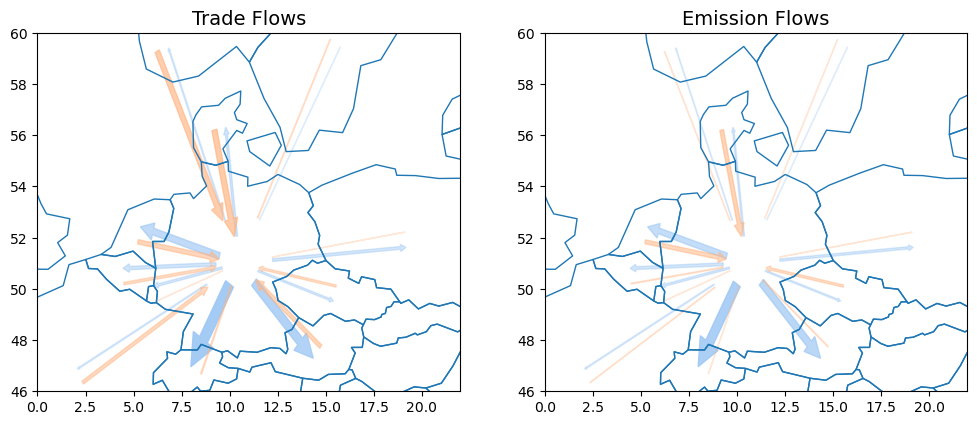

In [26]:
# Load a world map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter Europe
europe = world[(world['continent'] == 'Europe') & (world['name'] != 'Russia')]

# Define central location (Germany)
central_lon, central_lat = 10.5, 51.0

# Coordinates for Germany and its neighbors
coords = {
    'Germany': (10.5, 51.0),
    'Denmark': (9.501785, 56.26392),
    'Norway': (8.468946, 59.8),
    'Poland': (19.145136, 51.919438),
    'Czechia': (15.473, 49.8175),
    'Austria': (14.5501, 47.5162),
    'Switzerland': (8.24824, 46.8182),
    'France': (2.213749, 46.603354),
    'Luxembourg': (6.1296, 49.8153),
    'Belgium': (4.469936, 50.503887),
    'Netherlands': (5.2913, 52.1326),
    'Sweden': (15.5, 59.6)
}

# Map country codes to country names
country_codes = {
    'AT': 'Austria',
    'BE': 'Belgium',
    'CH': 'Switzerland',
    'CZ': 'Czechia',
    'DE': 'Germany',
    'DK': 'Denmark',
    'FR': 'France',
    'LU': 'Luxembourg',
    'NL': 'Netherlands',
    'NO': 'Norway',
    'PL': 'Poland',
    'SE': 'Sweden'
}

# Replace the country codes with country names
df.replace({'InMapCode': country_codes, 'OutMapCode': country_codes}, inplace=True)

# Get maximum value for normalizing for em_
max_value = max(df['em_in'].max(), df['em_out'].max())

# Normalize 
df['em_in_norm'] = df['em_in'] / max_value
df['em_out_norm'] = df['em_out'] / max_value
df['FlowValue_corr_norm'] = df['FlowValue_corr'] / df['FlowValue_corr'].max()

# Create dictionaries of trade values and emissions for each pair of countries
trade_values = {(row['OutMapCode'], row['InMapCode']): (row['FlowValue_corr_norm'], row['FlowValue_corr'] / 1e6) for _, row in df.iterrows()}
emissions_in = {(row['OutMapCode'], row['InMapCode']): (row['em_in_norm'], row['em_in'] / 1e9) for _, row in df.iterrows()}
emissions_out = {(row['OutMapCode'], row['InMapCode']): (row['em_out_norm'], row['em_out'] / 1e9) for _, row in df.iterrows()}

# Define arrow properties
offset_size = 0.3
norway_offset = 2
shortening_factor = 0.2

def calc_alpha(norm_val, alpha_min=0.3, alpha_max=1.0):
    return alpha_min + norm_val * (alpha_max - alpha_min)

# Create plot
fig, axs = plt.subplots(1, 2, figsize=(12, 8))

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Loop over both axes
for ax, (values, title) in zip(axs, [((trade_values, trade_values), "Trade Flows"), ((emissions_out, emissions_in), "Emission Flows")]):
    # Plot the map
    europe.boundary.plot(ax=ax, linewidth=1)

    # Set the limits of the plot
    ax.set_xlim(0, 22)
    ax.set_ylim(46, 60)

    # Create arrows for each neighbor
    for country, (lon, lat) in coords.items():
        if country != 'Germany':
            # Get values
            out_norm, out_val = values[0].get(('Germany', country), (0, 0))
            in_norm, in_val = values[1].get((country, 'Germany'), (0, 0))

            # Calculate displacement for arrows
            displace_lon = (lon - central_lon)
            displace_lat = (lat - central_lat)

            # Calculate perpendicular direction for import/export arrow offset
            perp_dir = np.array([-displace_lat, displace_lon])
            perp_dir = perp_dir / np.linalg.norm(perp_dir)

            # Import/Export arrow starting points
            start_in = np.array([central_lon, central_lat])
            start_out = np.array([central_lon, central_lat])

            # End points for import/export arrows
            end_in = np.array([lon, lat]) + offset_size * perp_dir
            end_out = np.array([lon, lat]) - offset_size * perp_dir

            # Apply Norway specific offset
            if country == 'Norway':
                end_in = end_in + norway_offset * perp_dir
                end_out = end_out + norway_offset * perp_dir

            # Shorten the arrows
            start_in = start_in + shortening_factor * (end_in - start_in)
            start_out = start_out + shortening_factor * (end_out - start_out)

            # Plot trade from Germany to neighbor
            ax.arrow(start_out[0],
                     start_out[1],
                     end_out[0] - start_out[0],
                     end_out[1] - start_out[1],
                     head_width=out_norm*1.3,
                     head_length=out_norm*1.3,
                     fc=colors[0],
                     ec=colors[0],
                     width=out_norm / 2,
                     alpha=calc_alpha(out_norm),
                     length_includes_head=True)

            # Plot trade from neighbor to Germany (reversed arrow)
            ax.arrow(end_in[0],
                     end_in[1],
                     start_in[0] - end_in[0],
                     start_in[1] - end_in[1],
                     head_width=in_norm*1.3,
                     head_length=in_norm*1.3,
                     fc=colors[1],
                     ec=colors[1],
                     width=in_norm / 2,
                     alpha=calc_alpha(in_norm),
                     length_includes_head=True)

            # Add labels to arrows
            '''mid_in = (start_in + end_in) / 2
            mid_out = (start_out + end_out) / 2

            ax.text(mid_out[0], mid_out[1], f'{out_val:.1f}', fontsize=12)
            ax.text(mid_in[0], mid_in[1], f'{in_val:.1f}', fontsize=12)'''

    # Add country codes to map
    for country, code in country_codes.items():
        if country in coords:
            lon, lat = coords[country]
            ax.text(lon, lat, code, fontsize=16, ha='center')

    ax.set_title(title, fontsize=14)
    
'''# Calculate the maximum flow values for the legend
max_energy_flow = df['FlowValue_corr'].max() / 2e6
max_emission_flow = max(df['em_in'].max(), df['em_out'].max()) / 2e9

# Calculate the normalized flow values for the legend
legend_energy_flows = [0.2 * max_energy_flow, 0.5 * max_energy_flow, 0.8 * max_energy_flow]
legend_emission_flows = [0.2 * max_emission_flow, 0.5 * max_emission_flow, 0.8 * max_emission_flow]

# Create legend handles and labels for energy flows
legend_handles_energy = [mlines.Line2D([], [], color='blue', linewidth=width / 4, label=f'Energy outflow width: {width:.1f}') for width in legend_energy_flows]
legend_handles_energy += [mlines.Line2D([], [], color='red', linewidth=width / 4, label=f'Energy inflow width: {width:.1f}') for width in legend_energy_flows]

# Create legend handles and labels for emission flows
legend_handles_emission = [mlines.Line2D([], [], color='blue', linewidth=width / 4, label=f'Emission outflow width: {width:.1f}') for width in legend_emission_flows]
legend_handles_emission += [mlines.Line2D([], [], color='red', linewidth=width / 4, label=f'Emission inflow width: {width:.1f}') for width in legend_emission_flows]

# Add the legends to the plot
legend_energy = plt.legend(handles=legend_handles_energy, loc='upper left')
plt.gca().add_artist(legend_energy)
plt.legend(handles=legend_handles_emission, loc='lower left')'''

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'trading', 'map_trade_2021' + '.png')
plt.savefig(plot_path)

# Display plot
plt.show()

##### Trading balance

In [29]:
df = trade[['DateTime', 'em_out', 'em_in', 'OutMapCode', 'InMapCode', 'FlowValue_corr']]
df['Year'] = df['DateTime'].dt.year.astype('i4')
df = df.groupby(['Year', 'InMapCode', 'OutMapCode'])[['FlowValue_corr', 'em_in', 'em_out']].sum().reset_index()
df

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\3589841338.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Year'] = df['DateTime'].dt.year.astype('i4')


,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out
0,2018,AT,DE,1.356832e+07,0.000000e+00,6.398666e+09
1,2018,BE,DE,0.000000e+00,0.000000e+00,0.000000e+00
2,2018,CH,DE,1.833162e+07,0.000000e+00,9.131269e+09
3,2018,CZ,DE,7.972951e+06,0.000000e+00,3.755679e+09
4,2018,DE,AT,1.180264e+06,1.370459e+08,0.000000e+00
...,...,...,...,...,...,...
83,2021,LU,DE,3.692300e+06,0.000000e+00,1.651781e+09
84,2021,NL,DE,1.071992e+07,0.000000e+00,4.579148e+09
85,2021,NO,DE,2.276810e+06,0.000000e+00,6.009209e+08
86,2021,PL,DE,4.446818e+06,0.000000e+00,1.811647e+09


In [30]:
# Create 'el_in' column: set to 'FlowValue_corr' if 'InMapCode' is 'DE', otherwise set to zero
df['el_in'] = np.where(df['InMapCode'] == 'DE', df['FlowValue_corr'], 0)

# Create 'el_out' column: set to 'FlowValue_corr' if 'OutMapCode' is 'DE', otherwise set to zero
df['el_out'] = np.where(df['OutMapCode'] == 'DE', df['FlowValue_corr'], 0)

df

,Year,InMapCode,OutMapCode,FlowValue_corr,em_in,em_out,el_in,el_out
0,2018,AT,DE,1.356832e+07,0.000000e+00,6.398666e+09,0.000000e+00,1.356832e+07
1,2018,BE,DE,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
2,2018,CH,DE,1.833162e+07,0.000000e+00,9.131269e+09,0.000000e+00,1.833162e+07
3,2018,CZ,DE,7.972951e+06,0.000000e+00,3.755679e+09,0.000000e+00,7.972951e+06
4,2018,DE,AT,1.180264e+06,1.370459e+08,0.000000e+00,1.180264e+06,0.000000e+00
...,...,...,...,...,...,...,...,...
83,2021,LU,DE,3.692300e+06,0.000000e+00,1.651781e+09,0.000000e+00,3.692300e+06
84,2021,NL,DE,1.071992e+07,0.000000e+00,4.579148e+09,0.000000e+00,1.071992e+07
85,2021,NO,DE,2.276810e+06,0.000000e+00,6.009209e+08,0.000000e+00,2.276810e+06
86,2021,PL,DE,4.446818e+06,0.000000e+00,1.811647e+09,0.000000e+00,4.446818e+06


In [31]:
grouped_df = df.groupby('Year').sum().reset_index()
grouped_df

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_2352\1263216458.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  grouped_df = df.groupby('Year').sum().reset_index()


,Year,FlowValue_corr,em_in,em_out,el_in,el_out
0,2018,112190000.0,6.964095e+09,3.897789e+10,31727000.0,80463000.0
1,2019,112919000.0,7.088704e+09,2.973581e+10,40126000.0,72793000.0
2,2020,114735000.0,9.279424e+09,2.425863e+10,47853000.0,66882000.0
3,2021,122037000.0,1.119557e+10,2.918283e+10,51731000.0,70306000.0


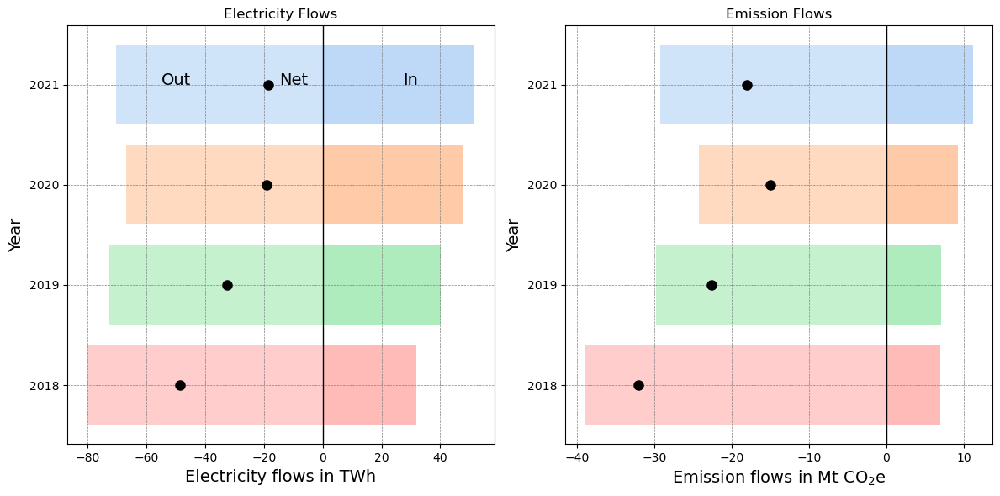

In [62]:
# Prepare data for plotting
year = grouped_df['Year'].values
el_in = grouped_df['el_in'].values
el_out = grouped_df['el_out'].values * -1  # Multiply by -1 to plot on the left side of the axis
em_in = grouped_df['em_in'].values
em_out = grouped_df['em_out'].values * -1  # Multiply by -1 to plot on the left side of the axis

# Initialize the subplots with white background and grey grid
fig, axes = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')
ax1, ax2 = axes
for ax in [ax1, ax2]:
    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', linewidth=0.5, color='grey')

# Update order of years for plotting (flipped to have 2021 at the bottom)
#year = np.array([2021, 2020, 2019, 2018])
el_in = el_in[::-1]
el_out = el_out[::-1]
em_in = em_in[::-1]
em_out = em_out[::-1]

# Update values for plotting (divide by 1e6/1e9)
el_in = el_in / 1e6
el_out = el_out / 1e6
em_in = em_in / 1e9
em_out = em_out / 1e9

# Plot data for electricity flows (el_in and el_out)
for idx, year in enumerate(years):
    ax1.barh(year, el_in[idx], color=colors[idx], alpha=0.7)
    ax1.barh(year, el_out[idx], color=colors[idx], alpha=0.5)
    ax1.plot(el_in[idx] + el_out[idx], year, marker='o', markersize=8, color='black')

# Plot settings
ax1.set_title('Electricity Flows')
ax1.set_xlabel('Electricity flows in TWh', fontsize=14)
ax1.set_ylabel('Year', fontsize=14)
ax1.set_yticks(years)
ax1.ticklabel_format(axis="x")

# Add text to the left subplot
ax1.text(-10, 2021, 'Net', fontsize=14, ha='center')
ax1.text(30, 2021, 'In', fontsize=14, ha='center')
ax1.text(-50, 2021, 'Out', fontsize=14, ha='center')

# Plot data for emission flows (em_in and em_out)
for idx, year in enumerate(years):
    ax2.barh(year, em_in[idx], color=colors[idx], alpha=0.7)
    ax2.barh(year, em_out[idx], color=colors[idx], alpha=0.5)
    ax2.plot(em_in[idx] + em_out[idx], year, marker='o', markersize=8, color='black')

# Plot settings
ax2.set_title('Emission Flows')
ax2.set_xlabel('Emission flows in Mt CO$_2$e', fontsize=14)
ax2.set_ylabel('Year', fontsize=14)
ax2.set_yticks(years)
ax2.ticklabel_format(axis="x")

# Remove horizontal grid lines and make vertical grid line at zero more noticeable
for ax in [ax1, ax2]:
    ax.grid(axis='x', linestyle='--', linewidth=0.5, color='grey')  # Removed horizontal grid lines
    ax.axvline(0, color='black', linewidth=1)  # Make vertical grid line at zero more noticeable

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'trading', 'trade_balance' + '.png')
plt.savefig(plot_path)
    
# Show the plot
plt.tight_layout()
plt.show()

#### Storage cycling (pumped hydro)

##### Prepare data

In [64]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["ph", "noph"] # adjust
    
    for choice in choices:
        if f"_{choice}_" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,ph
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,ph
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,noph
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,noph
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,noph
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,ph
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,ph
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,noph
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,ph


##### Violin plot

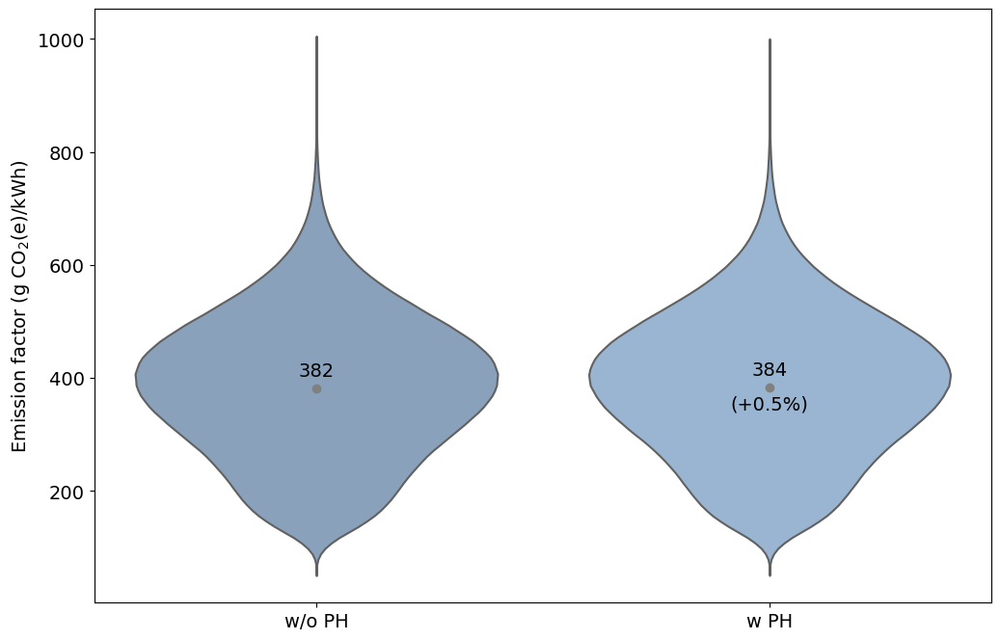

In [65]:
# create plot
create_violinplot(df_sample,
                  ["noph", "ph"], 
                  save_file=True,
                  file_name='ph.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o PH", "w PH"],
                  legend_labels=["w/o PH", "w PH"],
                  legend_title='Pumped hydro (PH)')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


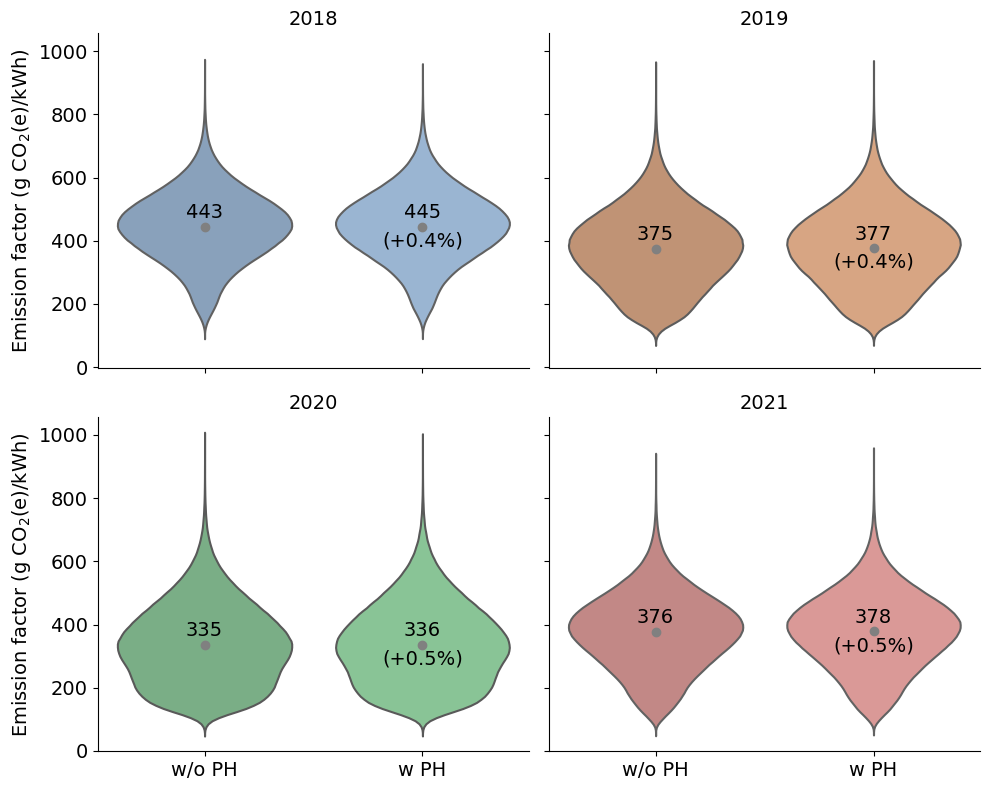

In [66]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["noph", "ph"],
                  save_file=True,
                  file_name='ph.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o PH", "w PH"],
                  legend_labels=["w/o PH", "w PH"],
                  legend_title='Pumped hydro (PH)')

#### Grid losses (T&D)

##### Prepare data

In [67]:
# Update the "Expression" column based on distinction of interest
def determine_expression(column_value):
    choices = ["dl", "nodl"] # adjust
    
    for choice in choices:
        if f"_{choice}" in column_value:
            return choice
    return column_value  # default to returning the original value if no choices match

df_sample['Expression'] = df_sample['column'].apply(determine_expression)

df_sample

,DateTime,Year,column,value,Expression
48360939,2021-03-21 18:45:00,2021,ef_nep_gwp100_op_en_maponly_cons_ph_nodl,278.279281,nodl
39348964,2020-03-16 01:00:00,2020,ef_nep_gwp100_lc_iea_maponly_prod_ph_nodl,259.687715,nodl
71327044,2020-03-13 01:00:00,2020,ef_gep_gwp100_lc_th100_maponly_cons_noph_dl,151.209573,dl
73715037,2020-04-19 23:15:00,2020,ef_gep_gwp20_lc_uba_apenergy_cons_noph_dl,235.997113,dl
23659156,2020-09-28 13:00:00,2020,ef_nep_gwp20_lc_el100_maponly_cons_noph_nodl,595.497251,nodl
...,...,...,...,...,...
87219891,2021-06-13 12:45:00,2021,ef_gep_gwp20_lc_uba_apenergy_prod_ph_dl,191.953162,dl
84811259,2020-10-03 14:45:00,2020,ef_gep_gwp20_lc_th100_maponly_prod_ph_dl,232.754963,dl
67174866,2021-10-12 04:30:00,2021,ef_nep_gwp100_lc_uba_apemissions_prod_noph_dl,546.193497,dl
43450906,2021-03-10 14:30:00,2021,ef_gep_gwp20_op_uba_apenergy_cons_ph_nodl,271.653572,nodl


##### Violin plot

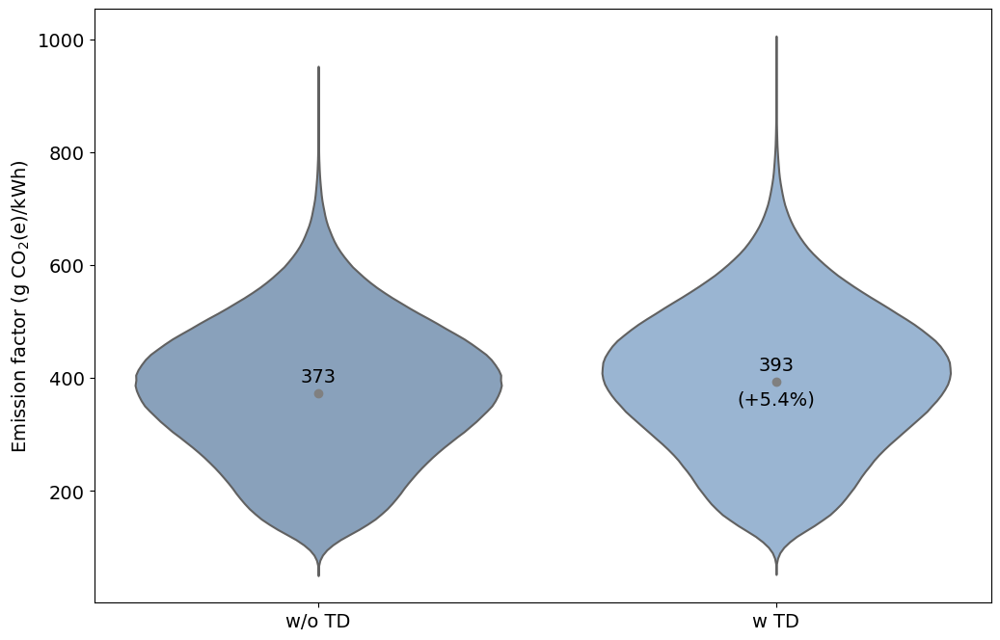

In [68]:
# create plot
create_violinplot(df_sample,
                  ["nodl", "dl"],
                  save_file=True,
                  file_name='td.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots'),
                  xtick_labels=["w/o TD", "w TD"],
                  legend_labels=["w/o TD", "w TD"],
                  legend_title='TD losses')

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_4676\3238489525.py:60: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([int(round(tick)) for tick in ax.get_yticks()], fontsize=14)


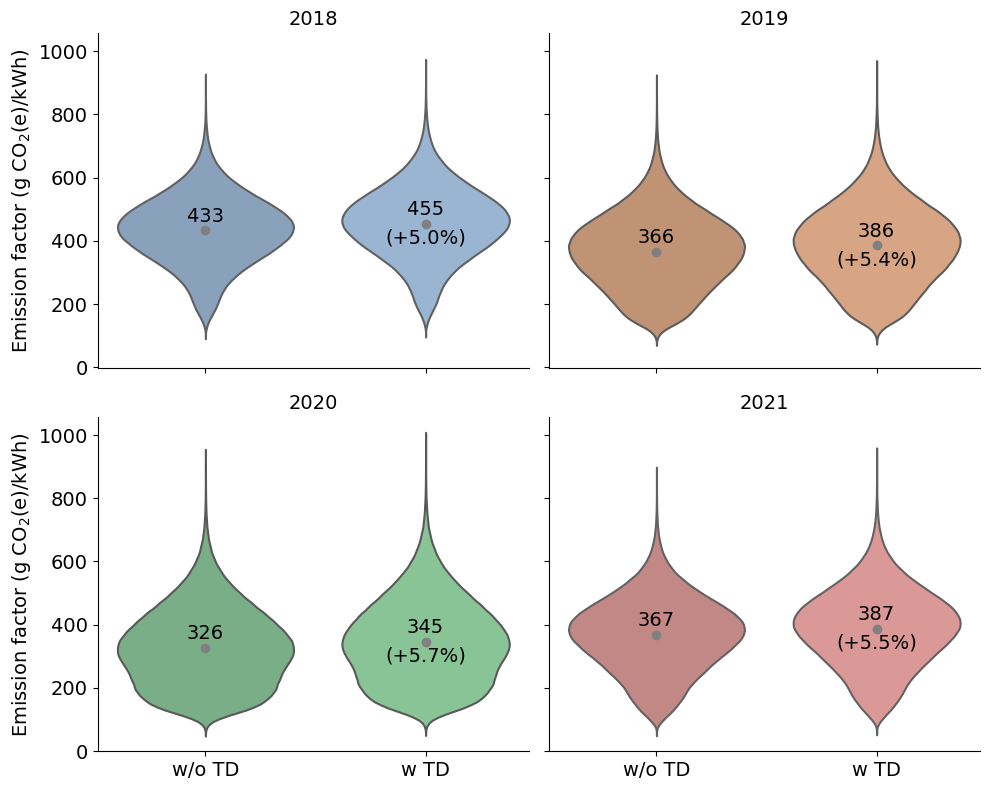

In [69]:
# create plot
create_violinplot_multiyear(df_sample,
                  ["nodl", "dl"],
                  save_file=True,
                  file_name='td.png', 
                  file_path=os.path.join('..', '5_reports', 'figures', '2_results', 'Violin plots', 'multi year'),
                  xtick_labels=["w/o TD", "w TD"],
                  legend_labels=["w/o TD", "w TD"],
                  legend_title='TD losses')

## Recommended configuration

In [60]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '3_processed', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

### EF over time

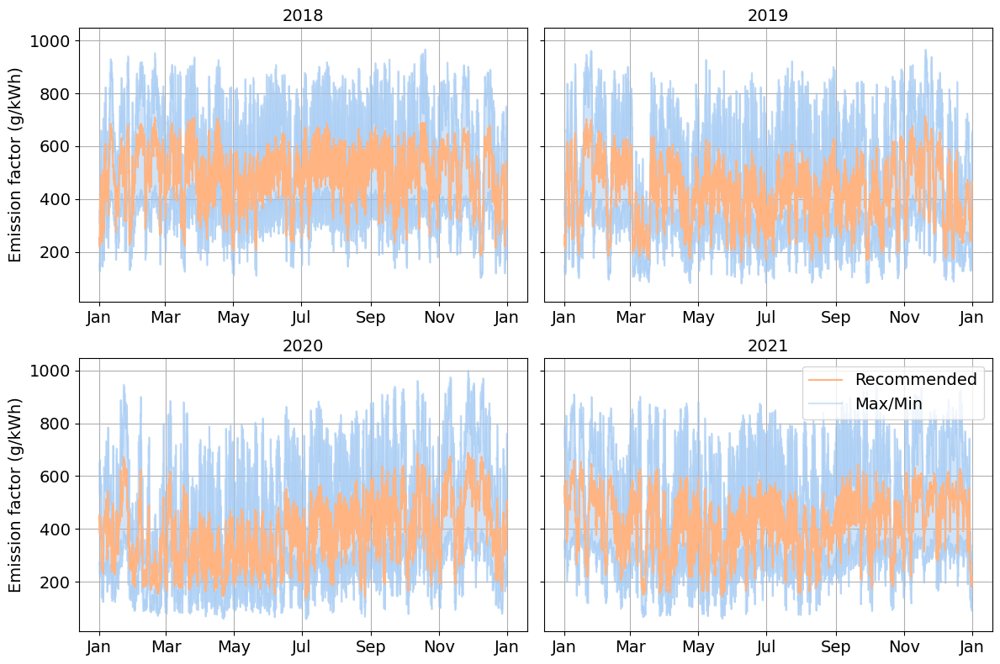

In [101]:
# plot1: recommended ef over time, compared to all choices

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharey=True)

# Flatten the axs array to make it easier to iterate over
axs = axs.flatten()

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Iterate over the years and plot
for i, year in enumerate(range(2018, 2022)):
    # Subset the DataFrame for the current year
    ef_year = ef[ef['Year'] == year]
    
    # define non-zero columns
    non_zero_columns = ef_year.columns[(ef_year != 0).any()].drop(['DateTime', 'Year', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'])
    
    # define function to get min column
    def get_min_column(ef_year, non_zero_columns):
        # Get columns with mean > 10
        valid_columns = ef_year[non_zero_columns].columns[ef_year[non_zero_columns].mean() > 10]
        # Return the column with the smallest average from the valid columns
        return ef_year[valid_columns].mean().idxmin()
    
    # Get the column with the largest average
    max_column = ef_year[non_zero_columns].mean().idxmax()
    # Get the column with the smallest average
    min_column = get_min_column(ef_year, non_zero_columns)
    
    # Plot the lines and capture the Line2D objects
    line_max, = axs[i].plot(ef_year['DateTime'], ef_year[max_column], color=colors[0], alpha=0.5)
    line_min, = axs[i].plot(ef_year['DateTime'], ef_year[min_column], color=colors[0], alpha=0.5)
    
    # Shade the area between the two columns
    axs[i].fill_between(ef_year['DateTime'], ef_year[max_column], ef_year[min_column], color=colors[0], alpha=0.5)

    # Plot the 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl' column and bring to the forefront
    line_recommended, = axs[i].plot(ef_year['DateTime'], ef_year['ef_nep_gwp100_lc_ex_maponly_cons_ph_dl'], color=colors[1], label='Recommended', zorder=3)
    
    # Add the year as the title of the subplot
    axs[i].set_title(year, fontsize=14)
    
    # Label y-axis only for the left subplots (0 and 2)
    if i % 2 == 0:
        axs[i].set_ylabel('Emission factor (g CO$_2$(e)/kWh)', fontsize=14)
        
    # Format x-axis to show abbreviated month names only for every second month (Jan, Mar, etc.)
    month_locator = mdates.MonthLocator(interval=2)  # Adjusted interval
    month_formatter = mdates.DateFormatter('%b')
    axs[i].xaxis.set_major_locator(month_locator)
    axs[i].xaxis.set_major_formatter(month_formatter)
    
    axs[i].tick_params(axis='both', labelsize=14)
    axs[i].grid(True, which='major')
    
    # Add legend to the top right corner of the bottom right subplot
    if i == 3:
        axs[i].legend([line_recommended, line_max], ['Recommended', 'Max/Min'], loc='upper right', fontsize=14)


plt.tight_layout()
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'recommendation', 'ef_t_4plots_recommended' + '.png')
plt.savefig(plot_path)

plt.show()

### Histogram

C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  annual_means = annual_means.append(annual_mean, ignore_index=True)
C:\Users\mschaefer\AppData\Local\Temp\ipykernel_13004\145748806.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use 

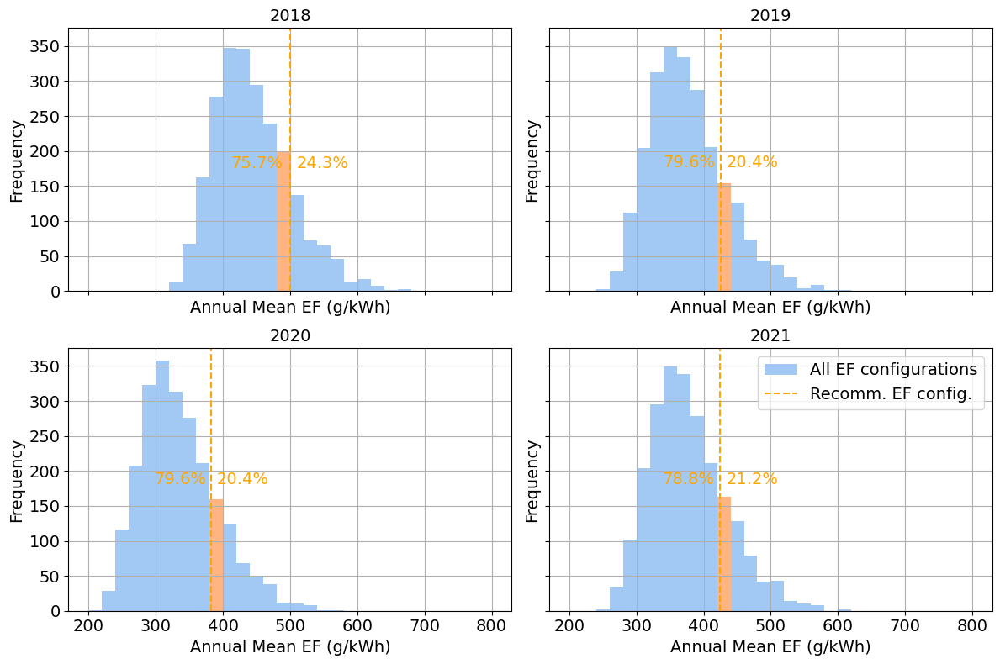

In [121]:
# plot 2: histogram

# working copy
df = ef

# Make sure DateTime column is in datetime format
df['DateTime'] = pd.to_datetime(df['DateTime'])

# Extract year from DateTime
df['Year'] = df['DateTime'].dt.year

# Select the columns starting with "ef_"
ef_columns = df.filter(regex='^ef_')

# Initialize a DataFrame to hold the annual mean values
annual_means = pd.DataFrame()

# Loop through each year and calculate the mean
for year in range(2018, 2022):
    # Select the data for this year
    data = df[df['Year'] == year]
    # Calculate the mean of the selected columns
    annual_mean = ef_columns.loc[data.index].mean()
    # Append the result to the annual_means DataFrame
    annual_means = annual_means.append(annual_mean, ignore_index=True)

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel")

# Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()

for i, year in enumerate(range(2018, 2022)):
    ax = axs[i]
    # Select the data for this year
    data = annual_means.iloc[i]
    
    # Define the bins for the histogram
    #bins = range(200, 801, 20)
    
    # Determine the bin in which the recommended column value falls
    recommended_value = data["ef_nep_gwp100_lc_ex_maponly_cons_ph_dl"]
    bin_index = np.digitize(recommended_value, bins) - 1
    
    # Plot the histogram
    n, _, patches = ax.hist(data, bins=bins, color=colors[0], label='All EF configurations')
    
    # Highlight the bin that contains the recommended column's value (if within range)
    if 0 <= bin_index < len(patches):
        patches[bin_index].set_facecolor(colors[1])
    
    # Add a vertical line for the recommended column's value
    ax.axvline(recommended_value, color='orange', linestyle='--', label='Recomm. EF config.')
    
    # Calculate the percentage of columns to the left and right of the vertical line
    left_percentage = 100 * np.sum(n[:bin_index]) / np.sum(n)
    right_percentage = 100 - left_percentage
    ax.text(recommended_value*0.98, ax.get_ylim()[1] * 0.5, f'{left_percentage:.1f}%', color='orange', ha='right', va='center', fontsize=14)
    ax.text(recommended_value*1.02, ax.get_ylim()[1] * 0.5, f'{right_percentage:.1f}%', color='orange', ha='left', va='center', fontsize=14)
    
    # Set the title and labels
    ax.set_title(year, fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_xlabel('Annual Mean EF (g/kWh)', fontsize=14)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True)

plt.tight_layout()
plt.legend(fontsize=14)

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'recommendation', 'ef_histogram' + '.png')
plt.savefig(plot_path)

plt.show()

### Save

In [61]:
# filter for recommended column
ef_recommended = ef[['DateTime', 'ef_nep_gwp100_lc_ex_maponly_cons_ph_dl']].copy()

# Define the path
csv_path = os.path.join('..', '1_data', '3_processed', 'ef_recommended.csv')

# Save the dataframe
ef_recommended.to_csv(csv_path)

## Validation

In [2]:
# Define the relative path to the pickle file
pickle_path = os.path.join('..', '1_data', '2_interim', 'ef_grid_hr_ep_metric_sysbound_allocation_apcoms_trade_ph_dl.pkl')

# Load the pickle file into a DataFrame
ef = pd.read_pickle(pickle_path)

### Recommendation - comparison to IEA, EEA, UBA

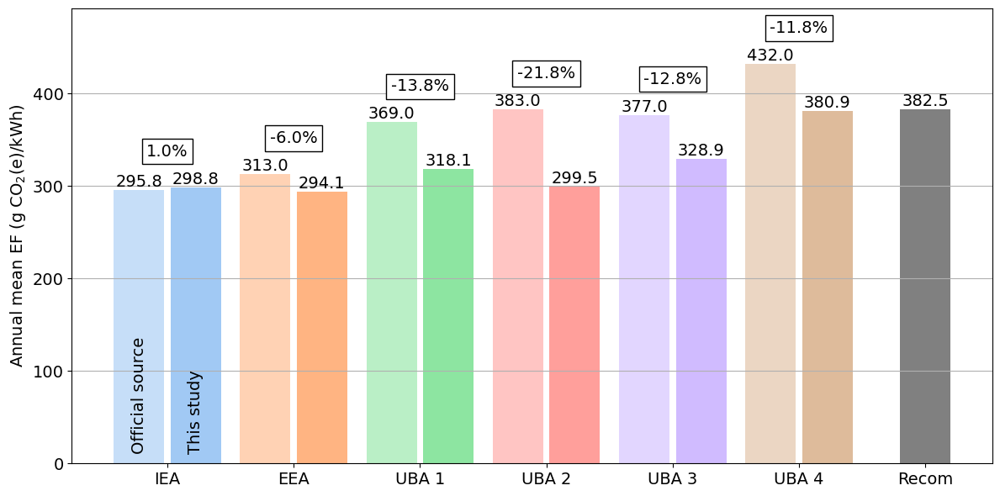

In [27]:
# Convert the 'DateTime' column to datetime
ef['DateTime'] = pd.to_datetime(ef['DateTime'])

# Filter data for the year 2020
ef_2020 = ef[ef['DateTime'].dt.year == 2020]

# Calculate the means
mean1 = ef_2020["ef_nep_co2_op_iea_mapap_prod_noph_nodl"].mean()
mean2 = ef_2020["ef_gep_gwp100_op_iea_mapap_prod_noph_nodl"].mean()
mean3 = ef_2020["ef_nep_co2_op_uba_mapap_prod_ph_dl"].mean()
mean4 = ef_2020["ef_nep_co2_op_uba_mapap_cons_ph_dl"].mean()
mean5 = ef_2020["ef_nep_gwp100_op_uba_mapap_prod_ph_dl"].mean()
mean6 = ef_2020["ef_nep_gwp100_lc_uba_mapap_prod_ph_dl"].mean()
recom = ef_2020["ef_nep_gwp100_lc_ex_maponly_cons_ph_dl"].mean()

# Define labels, fixed values, mean values, and titles
labels = ['IEA', 'EEA', 'UBA 1', 'UBA 2', 'UBA 3', 'UBA 4']
fixed_values = [295.8, 313.0, 369.0, 383.0, 377.0, 432.0]
mean_values = [mean1, mean2, mean3, mean4, mean5, mean6]
titles = labels

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Get the pastel color palette from Seaborn
colors = sns.color_palette("pastel", len(labels)).as_hex()

# Define x positions for the bars
x_positions = np.arange(0, len(labels) * 2, 2)

# Initialize empty list for text labels
text_labels = []

# Initialize variables to keep track of the highest y-position used for text
max_y_position = 0

# Plot the bars
for i, (label, fixed_value, mean_value, color) in enumerate(zip(labels, fixed_values, mean_values, colors)):
    ax.bar(x_positions[i] - 0.45, fixed_value, color=color, alpha=0.6)
    ax.bar(x_positions[i] + 0.45, mean_value, color=color, alpha=1)
    
    # Add the values on top of each bar
    ax.text(x_positions[i] - 0.45, fixed_value, np.round(fixed_value, 1), ha='center', va='bottom', fontsize=14)
    ax.text(x_positions[i] + 0.45, mean_value, np.round(mean_value, 1), ha='center', va='bottom', fontsize=14)
    
    # Calculate relative difference
    rel_diff = np.round(((mean_value - fixed_value) / fixed_value) * 100, 1)
    
    # Determine the y-position for the relative difference text, slightly above the taller of the two bars
    y_position = max(fixed_value, mean_value) + 30
    
    # Update max_y_position
    max_y_position = max(max_y_position, y_position)
    
    # Add the relative difference text between the two bars and slightly above the taller one
    ax.text(x_positions[i], y_position, f"{rel_diff}%", ha='center', va='bottom', fontsize=14, color='black',
            bbox=dict(facecolor='white', edgecolor='black'))
    
    # Add specific text labels to the first two bars
    if i == 0:  # IEA bar and its corresponding mean1 bar
        ax.text(x_positions[i] - 0.45, 10, "Official source", rotation=90, ha='center', va='bottom', fontsize=14, color='black')
        ax.text(x_positions[i] + 0.45, 10, "This study", rotation=90, ha='center', va='bottom', fontsize=14, color='black')

# Plot the single "Recom" bar
recom_x_position = x_positions[-1] + 2  # Place it 2 units to the right of the last paired bar
ax.bar(recom_x_position, recom, color='gray', alpha=1)
ax.text(recom_x_position, recom, np.round(recom, 1), ha='center', va='bottom', fontsize=14)
    
# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, max(max_y_position, recom) + 30)

# Add x-axis labels for each group of bars plus the 'Recom' bar
all_labels = labels + ['Recom']
all_x_positions = list(x_positions) + [recom_x_position]
ax.set_xticks(all_x_positions)
ax.set_xticklabels(all_labels, fontsize=14)

# Set y-axis label
ax.set_ylabel("Annual mean EF (g CO$_2$(e)/kWh)", fontsize=14)

# Ticks and grid
ax.tick_params(axis='both', labelsize=14)
ax.grid(axis='y')

# Show the plot
plt.tight_layout()

# Save the plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'validation', 'ef_validation_iea_eea_uba' + '.png')
plt.savefig(plot_path)

plt.show()

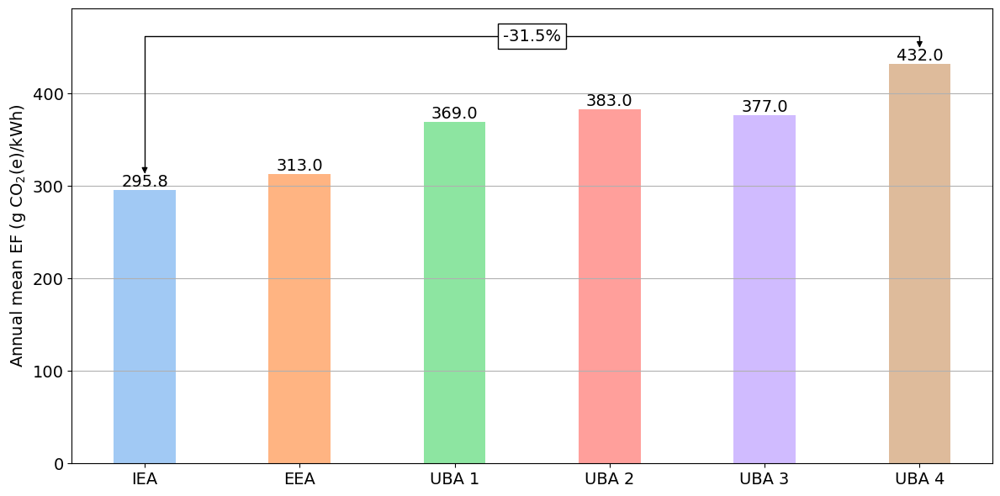

In [11]:
# Define labels, fixed values, mean values, and titles
labels = ['IEA', 'EEA', 'UBA 1', 'UBA 2', 'UBA 3', 'UBA 4']
fixed_values = [295.8, 313.0, 369.0, 383.0, 377.0, 432.0]
titles = labels

# Create the figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Get the pastel color palette from Seaborn
colors = sns.color_palette("pastel", len(labels)).as_hex()

# Define x positions for the bars
x_positions = np.arange(0, len(labels) * 2, 2)

# Initialize empty list for text labels
text_labels = []

# Initialize variables to keep track of the highest y-position used for text
max_y_position = 0

# Plot the bars
for i, (label, fixed_value, color) in enumerate(zip(labels, fixed_values, colors)):
    ax.bar(x_positions[i], fixed_value, color=color)
    
    # Add the values on top of each bar
    ax.text(x_positions[i], fixed_value, np.round(fixed_value, 1), ha='center', va='bottom', fontsize=14)
    
    # Determine the y-position
    y_position = max(fixed_value, mean_value) + 30
    
    # Update max_y_position
    max_y_position = max(max_y_position, y_position)
    
# Extend the y-axis range to make sure labels fit within the plot
ax.set_ylim(0, max_y_position + 30)

# Add x-axis labels for each group of bars plus the 'Recom' bar
all_labels = labels
all_x_positions = list(x_positions)
ax.set_xticks(all_x_positions)
ax.set_xticklabels(all_labels, fontsize=14)

# Set y-axis label
ax.set_ylabel("Annual mean EF (g CO$_2$(e)/kWh)", fontsize=14)

# Ticks and grid
ax.tick_params(axis='both', labelsize=14)
ax.grid(axis='y')

# Calculate the relative difference between the tallest and shortest bars
tallest_value = max(fixed_values)
shortest_value = min(fixed_values)
rel_diff = ((shortest_value - tallest_value) / tallest_value) * 100

# Calculate the position for the text box
text_box_x = np.mean(x_positions)  # Horizontally in the middle
text_box_y = tallest_value + 20  # Above the tallest bar

# Create the text box
text_box = ax.annotate(f'{rel_diff:.1f}%', 
                       xy=(text_box_x, text_box_y + 10), 
                       xycoords='data',
                       textcoords='data',
                       fontsize=14,
                       ha='center',
                       va='center',
                       bbox=dict(fc='white', ec='black'),
                       zorder=5)  # Set zorder to a higher value to bring to foreground

# Draw arrows pointing to the tallest and shortest bars
for value in [tallest_value, shortest_value]:
    x_pos = x_positions[fixed_values.index(value)]
    y_pos_for_arrow = value + 15  # Adjust the arrow to point to the top of the text label
    ax.annotate('', 
                xy=(x_pos, y_pos_for_arrow), 
                xycoords='data',
                xytext=(text_box_x, text_box_y + 10), 
                textcoords='data',
                arrowprops=dict(arrowstyle='-|>', 
                                connectionstyle='angle,angleA=0,angleB=90,rad=0',
                                color='black'),
                zorder=3)  # Lower zorder to keep behind the text box

# Show the plot
plt.tight_layout()

# Save the plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'background', 'ef_motivation' + '.png')
plt.savefig(plot_path)

plt.show()

### Individual effects - comparison to previous studies

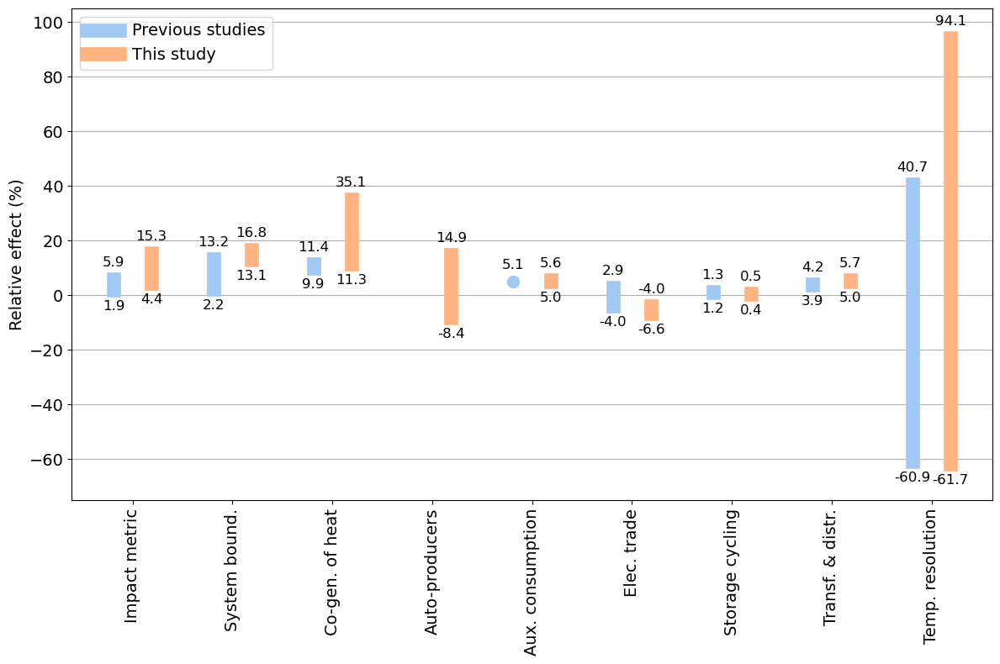

In [3]:
# plot: relative effects, this study vs. previous studies

# Categories
categories = [
    "Impact metric",
    "System bound.",
    "Co-gen. of heat",
    "Auto-producers",
    "Aux. consumption",
    "Elec. trade",
    "Storage cycling",
    "Transf. & distr.",
    "Temp. resolution"
]

# Data for previous studies and this study
previous_study_data = {
    "Impact metric": (1.9, 5.9),
    "System bound.": (2.2, 13.2),
    "Co-gen. of heat": (9.9, 11.4),
    "Auto-producers": None,
    "Aux. consumption": (5.1, 5.1),
    "Elec. trade": (-4.0, 2.9),
    "Storage cycling": (1.2, 1.3),
    "Transf. & distr.": (3.9, 4.2),
    "Temp. resolution": (-60.9, 40.7)
}

this_study_data = {
    "Impact metric": (4.4, 15.3),
    "System bound.": (13.1, 16.8),
    "Co-gen. of heat": (11.3, 35.1),
    "Auto-producers": (-8.4, 14.9),
    "Aux. consumption": (5.0, 5.6),
    "Elec. trade": (-6.6, -4.0),
    "Storage cycling": (0.4, 0.5),
    "Transf. & distr.": (5.0, 5.7),
    "Temp. resolution": (-61.7, 94.1)
}

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plotting
bar_width = 0.38
index = np.arange(len(categories))
label_offset = 6  # vertical distance between the bar and the label
line_width = 12

# Use Seaborn's pastel color palette
colors = sns.color_palette("pastel", 2)  # Blue and Orange

def plot_data(data, color, offset):
    min_visible_height = 0.3  # minimum visible height for the vertical line
    
    for i, category in enumerate(categories):
        range_data = data.get(category, (None, None))
        if range_data:
            low, high = range_data
            position = index[i] + offset
            display_low = low
            display_high = high
            
            # If the height of the vertical line is too small, extend it just for display
            if high - low < min_visible_height:
                delta = (min_visible_height - (high - low)) / 2
                display_low = low - delta
                display_high = high + delta
                
            if low == high:
                ax.scatter(position, high, color=color, s=100, zorder=3)
                ax.text(position, high + label_offset, f'{high}', ha='center', va='center', fontsize=12)
            else:
                ax.plot([position, position], [display_low, display_high], color=color, linewidth=line_width, zorder=3)  # Use display_low and display_high
                ax.text(position, display_low - label_offset, f'{low}', ha='center', va='center', fontsize=12)  # Use display_low
                ax.text(position, display_high + label_offset, f'{high}', ha='center', va='center', fontsize=12)  # Use display_high


# "Previous study" bars
plot_data(previous_study_data, colors[0], -bar_width/2)

# "This study" bars
plot_data(this_study_data, colors[1], bar_width/2)

# Styling
ax.set_ylabel('Relative effect (%)', fontsize=14)
ax.set_xticks(index)
ax.set_xticklabels(categories, rotation=90, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.grid(axis='y')
ax.set_ylim([-75, 105])

# Explicitly set the legend with custom handles and labels
from matplotlib.lines import Line2D
legend_elements = [Line2D([0], [0], color=colors[0], lw=line_width, label='Previous studies'),
                   Line2D([0], [0], color=colors[1], lw=line_width, label='This study')]
ax.legend(handles=legend_elements, fontsize=14)

plt.tight_layout()

# Save plot
plot_path = os.path.join('..', '5_reports', 'figures', '2_results', 'validation', 'ef_validation_literature' + '.png')
plt.savefig(plot_path)

plt.show()